In [1]:
import torch
import torch.nn as nn
from torch import optim
from torch.autograd import Variable

import os
import glob
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import librosa # librosa: Audio handling package
import random
import copy
import re
import jamotools

from tqdm import tqdm_notebook as tqdm # tqdm: Pakage for progress bar visualization
from datetime import datetime

import threading
import queue

import Levenshtein as Lev

In [2]:
n_mels = 80
fs = 16000
frame_length_ms=50
frame_shift_ms=25
nsc = int(fs * frame_length_ms / 1000)
nov = nsc - int(fs * frame_shift_ms / 1000)
nhop = int(fs * frame_shift_ms / 1000)
eps = 1e-8
db_ref = 160

# meta_path = 'gdrive/My Drive/korean-single-speaker-speech-dataset/transcript.v.1.2.txt'
# data_folder = 'gdrive/My Drive/korean-single-speaker-speech-dataset/kss'

# meta_path = "D:/korean-single-speaker-speech-dataset/transcript.v.1.2.txt"
# data_folder = "D:/korean-single-speaker-speech-dataset/kss"

data_folder = "D:/nsml-dataset/train_data/"
label_path = "D:/nsml-dataset/hackathon.labels"

data_list = glob.glob(data_folder + '*.csv')[0]

wav_paths = list()
script_paths = list()
korean_script_paths = list()

with open(data_list, 'r') as f:
    for line in f:
        # line: "aaa.wav,aaa.label"
        wav_path, script_path = line.strip().split(',')
        korean_script_path = script_path.replace('.label', '.script')
        
        wav_paths.append(os.path.join(data_folder, wav_path))
        script_paths.append(os.path.join(data_folder, script_path))
        korean_script_paths.append(os.path.join(data_folder, korean_script_path))

dataset_size = len(wav_paths)

In [3]:
def get_label(filepath, bos_id, eos_id):
    key = filepath.split('/')[-1].split('.')[0]
    script = target_dict[key]
    tokens = script.split(' ')
    result = list()
    result.append(bos_id)
    for i in range(len(tokens)):
        if len(tokens[i]) > 0:
            result.append(int(tokens[i]))
    result.append(eos_id)
    return result

In [4]:
print("wav_paths len: {}".format(len(wav_paths)))
print("script_paths len: {}".format(len(script_paths)))
print("korean_script_paths len: {}".format(len(korean_script_paths)))

print(wav_paths[0])
print(script_paths[0])
print(korean_script_paths[0])

wav_paths len: 29805
script_paths len: 29805
korean_script_paths len: 29805
D:/nsml-dataset/train_data/41_0601_211_0_07930_02.wav
D:/nsml-dataset/train_data/41_0601_211_0_07930_02.label
D:/nsml-dataset/train_data/41_0601_211_0_07930_02.script


In [5]:
with open(script_paths[1]) as f:
    line = f.read()
    line = line.strip()
    result = list(map(int, line.split(' ')))

In [6]:
def load_label(label_path):
    char2index = dict() # [ch] = id
    index2char = dict() # [id] = ch
    with open(label_path, 'r', encoding='UTF-8') as f:
    # with open(label_path, 'r') as f:
        for no, line in enumerate(f):
            if line[0] == '#': 
                continue

            index, char, freq = line.strip().split('\t')
            char = char.strip()
            if len(char) == 0:
                char = ' '

            char2index[char] = int(index)
            index2char[int(index)] = char

    return char2index, index2char

In [7]:
char2index, index2char = load_label(label_path)
SOS_token = char2index['<s>']  # '<sos>' or '<s>'
EOS_token = char2index['</s>']  # '<eos>' or '</s>'
PAD_token = char2index['_']  # '-' or '_'

In [8]:
pure_jamo_list = list()

# 초성
for unicode in range(0x1100, 0x1113):
    pure_jamo_list.append(chr(unicode))  # chr: Change hexadecimal to unicode
# 중성
for unicode in range(0x1161, 0x1176):
    pure_jamo_list.append(chr(unicode))
# 종성
for unicode in range(0x11A8, 0x11C3):
    pure_jamo_list.append(chr(unicode))

pure_jamo_list += [' ', '!', ',', '.', '?']

print(pure_jamo_list)

['ᄀ', 'ᄁ', 'ᄂ', 'ᄃ', 'ᄄ', 'ᄅ', 'ᄆ', 'ᄇ', 'ᄈ', 'ᄉ', 'ᄊ', 'ᄋ', 'ᄌ', 'ᄍ', 'ᄎ', 'ᄏ', 'ᄐ', 'ᄑ', 'ᄒ', 'ᅡ', 'ᅢ', 'ᅣ', 'ᅤ', 'ᅥ', 'ᅦ', 'ᅧ', 'ᅨ', 'ᅩ', 'ᅪ', 'ᅫ', 'ᅬ', 'ᅭ', 'ᅮ', 'ᅯ', 'ᅰ', 'ᅱ', 'ᅲ', 'ᅳ', 'ᅴ', 'ᅵ', 'ᆨ', 'ᆩ', 'ᆪ', 'ᆫ', 'ᆬ', 'ᆭ', 'ᆮ', 'ᆯ', 'ᆰ', 'ᆱ', 'ᆲ', 'ᆳ', 'ᆴ', 'ᆵ', 'ᆶ', 'ᆷ', 'ᆸ', 'ᆹ', 'ᆺ', 'ᆻ', 'ᆼ', 'ᆽ', 'ᆾ', 'ᆿ', 'ᇀ', 'ᇁ', 'ᇂ', ' ', '!', ',', '.', '?']


In [9]:
korean_script_list = list()
jamo_script_list = list()

# true_jamo_regex_not  = re.compile(u'[^, .?!\u1100-\u115e\u1161-\u11A7\u11a8-\u11ff]+')

# valid_regex = re.compile(u'[,_ ^.?!？~<>:;/%()+A-Za-z0-9\u1100-\u115e\u1161-\u11A7\u11a8-\u11ff]+')

count = 0

for file in tqdm(korean_script_paths):
    with open(file, 'r', encoding='utf-8') as f:
        line = f.read()
        line = line.strip()
        korean_script_list.append(line)
        jamo = list(jamotools.split_syllables(line, 'JAMO'))
        
#         print(len(jamo))
        for i, c in enumerate(jamo):
            if c not in pure_jamo_list:
                jamo[i] = '*'
        
        jamo = ''.join(jamo)
#         jamo_filtered = ''.join(true_jamo_regex.findall(jamo))
#         jamo_filtered = re.sub(true_jamo_regex_not, '*', jamo)
        jamo_script_list.append(jamo)
        
#         print(line)
#         print(jamo) 
        
#         if count == 100:
#             break
        
#         count += 1

In [10]:
def find_starting_point(coef, thres = 0.1, margin = 10):
    starting_point = 0
    for i in range(len(coef) - 1):
        if (coef[i] <= thres and coef[i+1] > thres):
            starting_point = i
            break
            
    starting_point = starting_point - margin
    
    if starting_point < 0:
        starting_point = 0
    
    return starting_point

def find_ending_point(coef, thres = 0.1, margin = 10):
    for i in range(len(coef) - 1, 0, -1):
        if (coef[i] <= thres and coef[i-1] > thres):
            ending_point = i
            break
            
    ending_point = ending_point + margin
    
    if ending_point > len(coef):
        ending_point = len(coef)

    return ending_point

In [11]:
class Threading_Batched_Preloader():
    def __init__(self, wav_path_list, ground_truth_list, script_path_list, batch_size, is_train=True):
        super(Threading_Batched_Preloader).__init__()
        self.wav_path_list = wav_path_list
        self.total_num_input = len(wav_path_list)
        self.tensor_input_list = [None] * self.total_num_input
        self.ground_truth_list = ground_truth_list
        self.script_path_list = script_path_list
        self.sentence_length_list = np.asarray(list(map(len, ground_truth_list)))
        self.shuffle_step = 12
        self.loading_sequence = None
        self.end_flag = False
        self.batch_size = batch_size
        self.queue = queue.Queue(16)
        self.thread_flags = list()
        self.is_train = is_train
    
    # Shuffle loading index and set end flag to false
    def initialize_batch(self, thread_num):
        loading_sequence = np.argsort(self.sentence_length_list)
        bundle = np.stack([self.sentence_length_list[loading_sequence], loading_sequence])

        for seq_len in range(self.shuffle_step, np.max(self.sentence_length_list), self.shuffle_step):
            idxs = np.where((bundle[0, :] > seq_len) & (bundle[0, :] <= seq_len + self.shuffle_step))[0]
            idxs_origin = copy.deepcopy(idxs)
            random.shuffle(idxs)
            bundle[:, idxs_origin] = bundle[:, idxs]
            
        loading_sequence = bundle[1, :]
        loading_sequence_len = len(loading_sequence)
        
#         print("Loading Sequence Length: {}".format(loading_sequence_len))
        
        thread_size = int(np.ceil(loading_sequence_len / thread_num))

        load_idxs_list = list()
        for i in range(thread_num):
            start_idx = i * thread_size
            end_idx = (i + 1) * thread_size

            if end_idx > loading_sequence_len:
                end_idx = loading_sequence_len

            load_idxs_list.append(loading_sequence[start_idx:end_idx])
            
#         for i in range(thread_num):
#             print(len(load_idxs_list[i]))

        self.end_flag = False
        
        self.queue = queue.Queue(32)
        self.thread_flags = [False] * thread_num
        
        self.thread_list = [Batching_Thread(self.wav_path_list, self.ground_truth_list, self.script_path_list, load_idxs_list[i], self.queue, self.batch_size, self.thread_flags, i, self.is_train) for i in range(thread_num)]

        for thread in self.thread_list:
            thread.start()
        return

    def check_thread_flags(self):
        for flag in self.thread_flags:
            if flag == False:
                return False
        
        if (self.queue.empty):
            self.end_flag = True
            return True

        return False

    def get_batch(self):
        while not (self.check_thread_flags()):
            batch = self.queue.get()

            if (batch != None):
                batched_tensor = batch[0]
                batched_ground_truth = batch[1] 
                batched_loss_mask = batch[2]
                ground_truth_size_list = batch[3]
                lev_truth_list = batch[4]

                return batched_tensor, batched_ground_truth, batched_loss_mask, ground_truth_size_list, lev_truth_list

        return None

class Batching_Thread(threading.Thread):

    def __init__(self, wav_path_list, ground_truth_list, script_path_list, load_idxs_list, queue, batch_size, thread_flags, id, is_train=True):
        
        threading.Thread.__init__(self)
        self.wav_path_list = wav_path_list
        self.ground_truth_list = ground_truth_list
        self.script_path_list = script_path_list
        self.load_idxs_list = load_idxs_list
        self.list_len = len(load_idxs_list)
        self.cur_idx = 0
        self.id = id
        self.queue = queue
        self.batch_size = batch_size 
        self.thread_flags = thread_flags
        self.is_train = is_train

    def run(self):

        while(self.cur_idx < self.list_len):
            batch = self.batch()
            success = False
            while success == False:
                try:
                    self.queue.put(batch, True)
                    success = True
                except:
                    print("Batching Failed in Thread ID: {}".format(self.id))
                    sleep(1)

        self.thread_flags[self.id] = True
        
#         print("Thread {} finished".foramt(self.id))

        return 


    def batch(self):

        tensor_list = list()
        ground_truth_list = list()
        tensor_size_list = list()
        ground_truth_size_list = list()
        lev_truth_list = list()
        
        count = 0
        max_seq_len = 0
        max_sen_len = 0
        
        for i in range(self.batch_size):
            
            # If there is no more file, break and set end_flag true
            if self.cur_idx >= self.list_len:
                self.end_flag = True
                break
                
            script_path = self.script_path_list[self.load_idxs_list[self.cur_idx]]
            
#             print(script_path)
            
            with open(script_path) as f:
                line = f.read()
                line = line.strip()
                lev_truth = list(map(int, line.split(' ')))
                
            lev_truth_list.append(lev_truth)
            
            wav_path = self.wav_path_list[self.load_idxs_list[self.cur_idx]]

            tensor = self.create_mel(wav_path)
            tensor_list.append(tensor)
            tensor_size_list.append(tensor.shape[1])
            
            ground_truth = self.ground_truth_list[self.load_idxs_list[self.cur_idx]]
            ground_truth_list.append(ground_truth)
            ground_truth_size_list.append(len(ground_truth))
            
            if (tensor.shape[1] > max_seq_len):
                max_seq_len = tensor.shape[1]
            if (len(ground_truth) > max_sen_len):
                max_sen_len = len(ground_truth)  
            
            self.cur_idx += 1
            count += 1
            
        batched_tensor = torch.zeros(count, max_seq_len + 5, n_mels)
        batched_ground_truth = torch.zeros(count, max_sen_len)
        batched_loss_mask = torch.zeros(count, max_sen_len)
        ground_truth_size_list = torch.tensor(np.asarray(ground_truth_size_list), dtype=torch.long)
        
        for order in range(count):
            
            target = tensor_list[order]
            
            if self.is_train:
                pad_random = np.random.randint(0, 5)
                # Time shift, add zeros in front of an image
                if pad_random > 0:
                    offset = torch.zeros(target.shape[0], pad_random, target.shape[2])
                    target = torch.cat((offset, target), 1)
                # Add random noise
                target = target + (torch.rand(target.shape) - 0.5) / 20
                # Value less than 0 or more than 1 is clamped to 0 and 1
                target = torch.clamp(target, min=0.0, max=1.0)
                batched_tensor[order, :tensor_size_list[order] + pad_random, :] = target
            else:
                batched_tensor[order, :tensor_size_list[order], :] = target

#           batched_tensor[order, :tensor_size_list[order], :] = target
            batched_ground_truth[order, :ground_truth_size_list[order]] = torch.tensor(ground_truth_list[order])
            
            # You do not need to know what loss mask is 
            batched_loss_mask[order, :ground_truth_size_list[order]] = torch.ones(ground_truth_size_list[order])
        
        return [batched_tensor, batched_ground_truth, batched_loss_mask, ground_truth_size_list, lev_truth_list]
    
    def create_mel(self, wav_path):  
        y, sr = librosa.core.load(wav_path, sr=fs) 
        f, t, Zxx = sp.signal.stft(y, fs=sr, nperseg=nsc, noverlap=nov)
        Sxx = np.abs(Zxx)
        
        # Cut-off paddings
        coef = np.sum(Sxx, 0)
        Sxx = Sxx[:, find_starting_point(coef):find_ending_point(coef)]

        # mel_filters: (n_fft, n_mels)
        mel_filters = librosa.filters.mel(sr=fs, n_fft=nsc, n_mels=n_mels)
        mel_specgram = np.matmul(mel_filters, Sxx)

        # log10(0) is minus infinite, so replace mel_specgram values smaller than 'eps' as 'eps' (1e-8)
        log_mel_specgram = 20 * np.log10(np.maximum(mel_specgram, eps))
        
        # 20 * log10(eps) = 20 * -8 = -160
        # -160 is the smallest value
        # Add 160 and divide by 160 => Normalize value between 0 and 1
        norm_log_mel_specgram = (log_mel_specgram + db_ref) / db_ref        
        
        # (F, T) -> (T, F)
        input_spectrogram = norm_log_mel_specgram.T
        # (T, F) -> (1, T, F)
        # Inserted the first axis to make stacking easier
        tensor_input = torch.tensor(input_spectrogram).view(1, input_spectrogram.shape[0], input_spectrogram.shape[1])
        return tensor_input

In [12]:
# Tokenizer maps numbers to characters, 8 -> 'ㄱ', 10 -> 'ㄴ'
class Tokenizer():
    def __init__(self, vocabs):
        self.vocabs = vocabs
        
    def word2num(self, sentence):
        tokens = list()
        for char in sentence:
            tokens.append(self.vocabs.index(char))    
        return tokens
        
    def word2vec(self, sentence):
        vectors = np.zeros((len(sentence), len(self.vocabs)))
        for i, char in enumerate(sentence):
            vectors[i, self.vocabs.index(char)] = 1   
        return vectors
    
    def num2word(self, num):
        output = list()
        for i in num:
            output.append(self.vocabs[i])
        return output
    
    def num2vec(self, numbers):
        vectors = np.zeros((len(numbers), len(self.vocabs)))
        for i, num in enumerate(numbers):
            vectors[i, num] = 1   
        return vectors

In [13]:
# unicode_jamo_list = list()

# # 초성
# for unicode in range(0x1100, 0x1113):
#     unicode_jamo_list.append(chr(unicode))  # chr: Change hexadecimal to unicode
# # 중성
# for unicode in range(0x1161, 0x1176):
#     unicode_jamo_list.append(chr(unicode))
# # 종성
# for unicode in range(0x11A8, 0x11C3):
#     unicode_jamo_list.append(chr(unicode))
# for unicode in range(ord('A'), ord('Z') + 1):
#     unicode_jamo_list.append(chr(unicode))
# for unicode in range(ord('a'), ord('z') + 1):
#     unicode_jamo_list.append(chr(unicode))
# for unicode in range(ord('0'), ord('9') + 1):
#     unicode_jamo_list.append(chr(unicode))

# unicode_jamo_list += [' ', '\\', '!', '~', '^', '<', '>', ',', '.', "'", '?', '？', '/', '%', '(', ')', ':', ';', '+',
#                       '-', '<s>', '</s>']
# unicode_jamo_list.sort()
# # '_' symbol represents "blank" in CTC loss system, "blank" has to be the index 0
# unicode_jamo_list = ['_'] + unicode_jamo_list

# tokenizer = Tokenizer(unicode_jamo_list)
# jamo_tokens = tokenizer.word2num(unicode_jamo_list)

unicode_jamo_list = list()

# 초성
for unicode in range(0x1100, 0x1113):
    unicode_jamo_list.append(chr(unicode))  # chr: Change hexadecimal to unicode
# 중성
for unicode in range(0x1161, 0x1176):
    unicode_jamo_list.append(chr(unicode))
# 종성
for unicode in range(0x11A8, 0x11C3):
    unicode_jamo_list.append(chr(unicode))

unicode_jamo_list += [' ', '!', ',', '.', '?', '<s>', '</s>', '*']

unicode_jamo_list.sort()
# '_' symbol represents "blank" in CTC loss system, "blank" has to be the index 0
unicode_jamo_list = ['_'] + unicode_jamo_list

tokenizer = Tokenizer(unicode_jamo_list)
jamo_tokens = tokenizer.word2num(unicode_jamo_list)

In [14]:
print(unicode_jamo_list)
print(jamo_tokens)

['_', ' ', '!', '*', ',', '.', '</s>', '<s>', '?', 'ᄀ', 'ᄁ', 'ᄂ', 'ᄃ', 'ᄄ', 'ᄅ', 'ᄆ', 'ᄇ', 'ᄈ', 'ᄉ', 'ᄊ', 'ᄋ', 'ᄌ', 'ᄍ', 'ᄎ', 'ᄏ', 'ᄐ', 'ᄑ', 'ᄒ', 'ᅡ', 'ᅢ', 'ᅣ', 'ᅤ', 'ᅥ', 'ᅦ', 'ᅧ', 'ᅨ', 'ᅩ', 'ᅪ', 'ᅫ', 'ᅬ', 'ᅭ', 'ᅮ', 'ᅯ', 'ᅰ', 'ᅱ', 'ᅲ', 'ᅳ', 'ᅴ', 'ᅵ', 'ᆨ', 'ᆩ', 'ᆪ', 'ᆫ', 'ᆬ', 'ᆭ', 'ᆮ', 'ᆯ', 'ᆰ', 'ᆱ', 'ᆲ', 'ᆳ', 'ᆴ', 'ᆵ', 'ᆶ', 'ᆷ', 'ᆸ', 'ᆹ', 'ᆺ', 'ᆻ', 'ᆼ', 'ᆽ', 'ᆾ', 'ᆿ', 'ᇀ', 'ᇁ', 'ᇂ']
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]


In [15]:
ground_truth_list = [(tokenizer.word2num(['<s>'] + list(jamo_script_list[i]) + ['</s>'])) for i in range(len(jamo_script_list))]

In [16]:
# 90% of the data will be used as train
split_index = int(0.9 * len(wav_paths))

wav_path_list_train = wav_paths[:split_index]
ground_truth_list_train = ground_truth_list[:split_index]
script_path_list_train = script_paths[:split_index]

wav_path_list_eval = wav_paths[split_index:]
ground_truth_list_eval = ground_truth_list[split_index:]
script_path_list_eval = script_paths[split_index:]

In [17]:
batch_size = 32
num_thread = 3

preloader_eval = Threading_Batched_Preloader(wav_path_list_eval, ground_truth_list_eval, script_path_list_eval, batch_size, is_train=False)
preloader_train = Threading_Batched_Preloader(wav_path_list_train, ground_truth_list_train, script_path_list_train, batch_size)

In [18]:
def train(net, optimizer, ctc_loss, input_tensor, ground_truth, loss_mask, target_lengths):

    # Shape of the input tensor (B, T, F)
    # B: Number of a batch (8, 16, or 64 ...)
    # T: Temporal length of an input
    # F: Number of frequency band, 80

    net.train()
    
    batch_size = input_tensor.shape[0]

    optimizer.zero_grad()
    
    pred_tensor = net(input_tensor)
    
    # Cast true sentence as Long data type, since CTC loss takes long tensor only
    # Shape (B, S)
    # S: Max length among true sentences 
    truth = ground_truth
    truth = truth.type(torch.cuda.LongTensor)

    input_lengths = torch.full(size=(batch_size,), fill_value=pred_tensor.shape[0], dtype=torch.long)

    loss = ctc_loss(pred_tensor, truth, input_lengths, target_lengths)

    loss.backward()
    optimizer.step()

    # Return loss divided by true length because loss is sum of the character losses

    return pred_tensor, loss.item() / ground_truth.shape[1]


def evaluate(net, ctc_loss, input_tensor, ground_truth, loss_mask, target_lengths):

    # Shape of the input tensor (B, T, F)
    # B: Number of a batch (8, 16, or 64 ...)
    # T: Temporal length of an input
    # F: Number of frequency band, 80

    net.eval()
    
    batch_size = input_tensor.shape[0]
    
    pred_tensor = net(input_tensor)
    
    # Cast true sentence as Long data type, since CTC loss takes long tensor only
    # Shape (B, S)
    # S: Max length among true sentences 
    truth = ground_truth
    truth = truth.type(torch.cuda.LongTensor)

    input_lengths = torch.full(size=(batch_size,), fill_value=pred_tensor.shape[0], dtype=torch.long)

    loss = ctc_loss(pred_tensor, truth, input_lengths, target_lengths)

    # Return loss divided by true length because loss is sum of the character losses

    return pred_tensor, loss.item() / ground_truth.shape[1]

def save(model, optimizer, check_point_name):
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        }, check_point_name)

def load(model, optimizer, check_point_name):
    checkpoint = torch.load(check_point_name)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

In [19]:
# Use GPU if GPU is available 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class Encoder(nn.Module):
    def __init__(self, D_in, H):
        super(Encoder, self).__init__()
        self.fc = torch.nn.Linear(D_in, H)
        self.relu = torch.nn.ReLU()
        self.dropout = nn.Dropout(p=0.2)
        self.gru = nn.GRU(H, int(H/2), bidirectional=True, batch_first=True)

    def forward(self, input_tensor):
        # (B, T, F)
        output_tensor = self.fc(input_tensor)
        output_tensor = self.relu(output_tensor)
        output_tensor = self.dropout(output_tensor)
        # (B, T, H)
        output_tensor, _ = self.gru(output_tensor)
        return output_tensor
    
class CTC_Decoder(nn.Module):
    def __init__(self, H, D_out, num_chars):
        super(CTC_Decoder, self).__init__()
        self.fc_embed = nn.Linear(H, H)
        self.relu_embed = torch.nn.ReLU()
        self.dropout_embed = nn.Dropout(p=0.2) 
        self.gru = nn.GRU(H, D_out, batch_first=True)
        self.fc = nn.Linear(D_out, num_chars)
        self.log_softmax = nn.LogSoftmax(dim=2)

    def forward(self, input_tensor):
        # (B, T, 2 * H/2)
        output_tensor = self.fc_embed(input_tensor)
        output_tensor = self.relu_embed(output_tensor)
        output_tensor = self.dropout_embed(output_tensor) 
        # (B, T, H)
        output_tensor,_ = self.gru(input_tensor)
        # (B, T, H)
        output_tensor = self.fc(output_tensor)
        # (B, T, 75)
        prediction_tensor = self.log_softmax(output_tensor)

        return prediction_tensor

class Mel2SeqNet(nn.Module):
    def __init__(self, D_in, H, D_out, num_chars, device):
        super(Mel2SeqNet, self).__init__()
        
        self.encoder = Encoder(D_in, H).to(device)
        self.decoder = CTC_Decoder(H, D_out, num_chars).to(device)
        
        # Initialize weights with random uniform numbers with range
        for param in self.encoder.parameters():
            param.data.uniform_(-0.1, 0.1)
        for param in self.decoder.parameters():
            param.data.uniform_(-0.1, 0.1)
            
    def forward(self, input_tensor):
        batch_size = input_tensor.shape[0]
        # (B, T, F) -> (B, T, H)
        encoded_tensor = self.encoder(input_tensor)
        # (B, T, H) -> (B, T, 75)
        pred_tensor = self.decoder(encoded_tensor)
        pred_tensor = pred_tensor.permute(1, 0, 2)
        
        return pred_tensor

In [20]:
# Function that interprets the CTC prediction result

def Decode_CTC_Prediction(prediction):
    CTC_pred = prediction.detach().cpu().numpy()
    result = list()
    last_elem = 0
    for i, elem in enumerate(CTC_pred):
        if elem != last_elem and elem != 0:
            result.append(elem)
        
        last_elem = elem

    result = np.asarray(result)
    
    return result

In [21]:
# def label_to_string(labels):
#     if len(labels.shape) == 1:
#         sent = str()
#         for i in labels:
#             if i.item() == EOS_token:
#                 break
#             sent += index2char[i.item()]
#         return sent

#     elif len(labels.shape) == 2:
#         sents = list()
#         for i in labels:
#             sent = str()
#             for j in i:
#                 if j.item() == EOS_token:
#                     break
#                 sent += index2char[j.item()]
#             sents.append(sent)

#         return sents
    
def lev_num_to_lev_string(lev_num_list, index2char):
    lev_str_list = list()
    for num_list in lev_num_list:
        
        temp = list()
        for num in num_list:
            temp.append(index2char[num])
        
        lev_str_list.append(''.join(temp))

    return lev_str_list

def char_distance(ref, hyp):
    ref = ref.replace(' ', '') 
    hyp = hyp.replace(' ', '') 

    dist = Lev.distance(hyp, ref)
    length = len(ref.replace(' ', ''))

    return dist, length 

def char_distance_list(ref_list, hyp_list):

    sum_dist = 0
    sum_length = 0
    
    for ref, hyp in zip(ref_list, hyp_list):
        dist, length = char_distance(ref, hyp)
        sum_dist += dist
        sum_length += length

    return sum_dist, sum_length 

# def get_distance(ref_labels, hyp_labels, display=False):
#     total_dist = 0
#     total_length = 0
#     for i in range(len(ref_labels)):
#         ref = label_to_string(ref_labels[i])
#         hyp = label_to_string(hyp_labels[i])
#         dist, length = char_distance(ref, hyp)
#         total_dist += dist
#         total_length += length 
#         if display:
#             cer = total_dist / total_length
#             print('%d (%0.4f)\n(%s)\n(%s)' % (i, cer, ref, hyp))
#     return total_dist, total_length

In [22]:
# def c2i_decoding(c2i, sentence):
#     tokens = list()
#     for char in sentence:
#         try:
#             tokens.append(c2i[char])   
#         except:
# #             print(char)
#             pass
#     return tokens

def Decode_Prediction(pred_tensor, tokenizer, char2index):
    decoded_list = list()
    for i in range(pred_tensor.shape[1]):
        _, CTC_index = pred_tensor[:, i, :].max(-1)
        index = Decode_CTC_Prediction(CTC_index)
        jamos = tokenizer.num2word(index)
        sentence = jamotools.join_jamos(''.join(jamos))
        
        not_com_jamo = re.compile(u'[^\u3130-\u3190]')
        filtered_sentence = ''.join(not_com_jamo.findall(sentence))
        filtered_sentence = filtered_sentence.replace('<s>', '')
        filtered_sentence = filtered_sentence.replace('</s>', '')
#         filtered_sentence = filtered_sentence.replace('<eos>', '')
#         final_prediction = c2i_decoding(char2index, filtered_sentence)
        
        decoded_list.append(filtered_sentence)
    return decoded_list

No CER Record
Loading NSML_pure_jamo_50ms_pad_cut_1024 Error
09-22 09:26:21
09-22 09:28:56
Mean Train Loss: 0.09246164566443796
Train CER: 0.8956803675540499
09-22 09:29:09
Mean Evaluation Loss: 0.07162421525876575
Evaluation CER: 0.8415237431080699


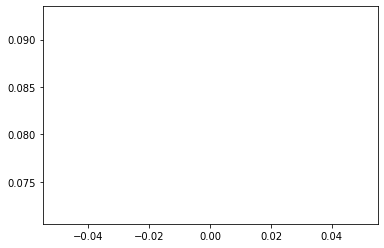

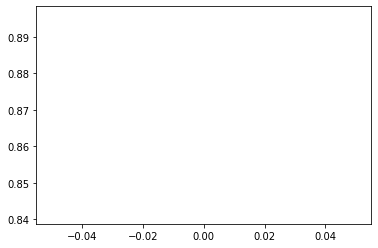

<s>아______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________인나요________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________?</s></s>
<s>아인나요?</s>
<s

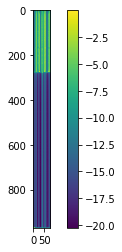

<s>아________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________인가요_______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________?</s></s>
<s>아인가요?</s>
<s>아직 주차를 잘 못해서 발레파킹있는 곳으로 가고 싶은데 거기 지점은 발레파킹 해주시나요?</s>__________________________________________________________________


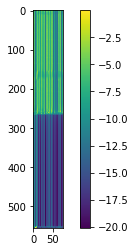

-------------------------------------------------------------------------------------------------------
09-22 09:29:10
09-22 09:31:32
Mean Train Loss: 0.06627970642724458
Train CER: 0.8389189437592388
09-22 09:31:46
Mean Evaluation Loss: 0.0629340333883614
Evaluation CER: 0.8332643232288012


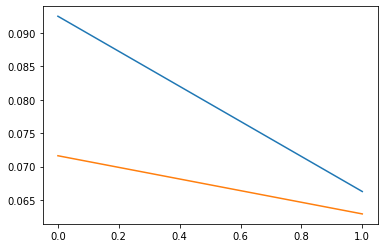

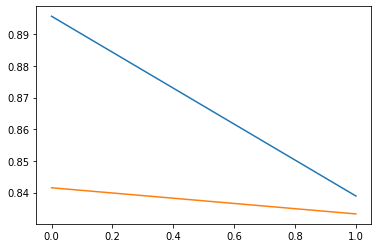

<s>아____________________________________________________________________________________________________느 이_나ᄋ______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________

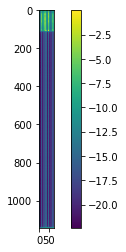

<s>아_________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________으 이_나ᄋ__________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s>
<s>아으 이나요?</s>
<s>아닙니다. 그럼 치즈케익 메뉴도 추가 주문하고 싶습니다. 그리고 제가 직접 방문해서 받을께요.</s>_________________________________________________________________


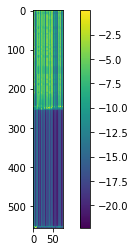

-------------------------------------------------------------------------------------------------------
09-22 09:31:47
09-22 09:34:11
Mean Train Loss: 0.06021299634315038
Train CER: 0.8228434850045133
09-22 09:34:26
Mean Evaluation Loss: 0.06514660237342816
Evaluation CER: 0.8347462244208599


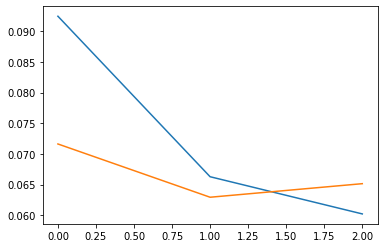

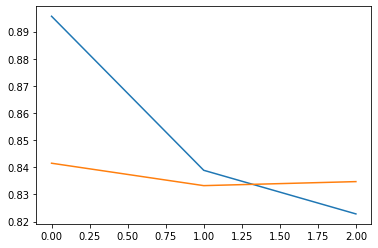

<s>아_____________________________________________________________________________________________________________________ 이_나ᄋ________________________________________________________________________________________________________ᅭᅭ?</s></s>
<s>아 이나요?</s>
<s>지금 가도 아기의자 쓸 수 있을까요?</s>________


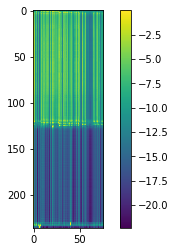

<s>아__________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 이_나ᄋ___________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s>
<s>아 이나요?</s>
<s>꼭 예약을 해야 식사가 가능한가요? 점심에 가서 식사하려는데 예약 안하고 가도 되나요?</s>________________________________________________________________________


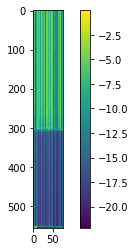

-------------------------------------------------------------------------------------------------------
09-22 09:34:27
09-22 09:36:52
Mean Train Loss: 0.05927075367096892
Train CER: 0.8158918403640855
09-22 09:37:07
Mean Evaluation Loss: 0.05048999494752405
Evaluation CER: 0.7942336609497244


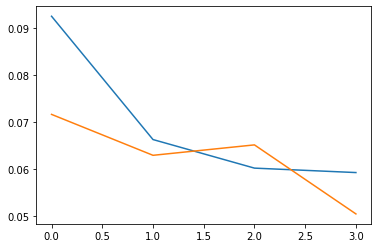

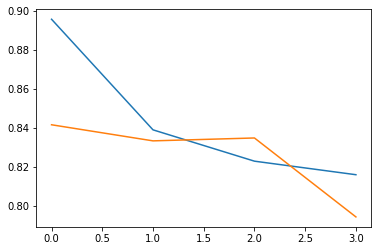

<s>아___________________야_____ᅡᅡ___데__이___마____이______므____ᅳ____ᅳ__이___가_____마____자________ᅡ____시_____ᄋ_____________________________ᅡ____지____ᅡᅡ___시__시____그___ᄉ____________있나ᄋ____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s>
<s>아야ᅡ데이마이므ᅳᅳ이가마자ᅡ시아지ᅡ시시그ᄉ있나요?</s>
<s>부메랑 카드를 만들고 웰컴 쿠폰을 받았습니다. 언제까지 사용할 수 있나요?</s>______


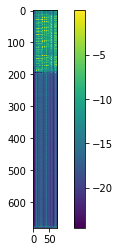

<s>아_____________이____지___다____ᄋ___________자__________드____가___________________________ᅡ___ᄋ____가____이__________이___ᅵ___므____ᅳ__오___가ᅡ________ᄉ_________므__ᄋ________________________ᅡ____이___지___아___므______________가________가____시_________지_____________________________________________이_나ᄋ___________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s>
<s>아이지다ᄋ자드가ᅡᄋ가이이ᅵ므ᅳ오가ᄉ므아이지아므가가시지이나요?</s>
<s>아직 주차를 잘 못해서 발레파킹있는 곳으로 가고 싶은데 거기 지점은 발레파킹 해주시나요?</s>__________________________________________________________________


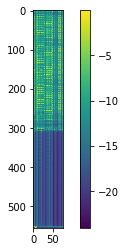

-------------------------------------------------------------------------------------------------------
09-22 09:37:08
09-22 09:39:39
Mean Train Loss: 0.04753306986878784
Train CER: 0.7749890588582536
09-22 09:39:53
Mean Evaluation Loss: 0.0422718586228158
Evaluation CER: 0.7419966439296533


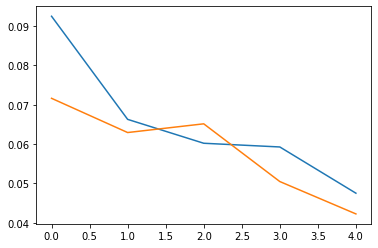

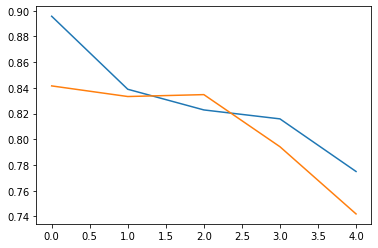

<s>아__________________니__ 가______느____으___네___저______제___고____이______다_______제_____녀____이_____ᅵ____대______________________________시____마____사________드____ᄌ___사____고______ᄉ___________________________________________________________________________________________________________________________________________________________________________있나ᄋ_ᅭ?</s></s>
<s>아니 가느으네저제고이다제녀이ᅵ대시마사드ᄌ사고ᄉ있나요?</s>
<s>전에 방문한 매장 직원이 넘 친절했는데  친절 사원으로 추천하고 싶네요.</s>_______


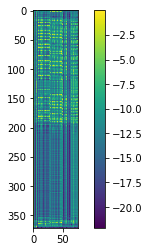

<s>이___________________________________________________________모_____이_______이___하_____시______이_____이___으___________________여______에________ᄉ____태_______즈_____가_______________시______이____으____느__ _시__사_____이_____다____노____흐__________ᅳᆫᆫ__데__________________________________________ᅩ____지___시____이___이_________ᅮ________이____지______시__ᄉ__________________________________________________________________________________________________________________________________________________________ 한가ᄋ__________________________ᅭᅭ?</s></s>
<s>이모이이하시이이으여에ᄉ태즈가시이으느 시사이다노흐ᅳᆫ데ᅩ지시이이ᅮ이지시ᄉ 한가요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


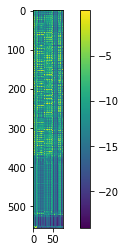

-------------------------------------------------------------------------------------------------------
09-22 09:39:53
09-22 09:42:31
Mean Train Loss: 0.04057570547674062
Train CER: 0.7073847180045287
09-22 09:42:45
Mean Evaluation Loss: 0.03888562730033335
Evaluation CER: 0.6887353716738945


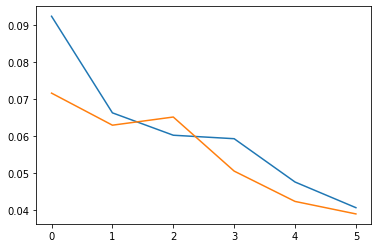

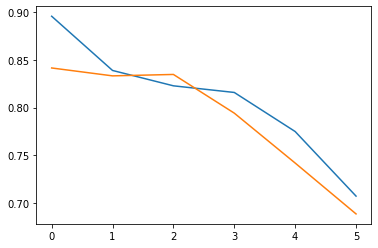

<s>오_______________어_____ᅳ__녀______마________ᆺ__배____에_____며___ᆫ__주________ 지____자____하___아__________에__ᄋ야ᅣᆨᆨ__하___고___나__________  가___ᆫᆫ__치_____이__ᄋ야ᅣᆨ__을 허___ᅩ___자_____________________ 있나ᄋ______________________________________________________________________________________________________________________________________________________________________ᅭ_?</s></s>
<s>오어ᅳ녀맛배에면주 지자하아에약하고나 간치이약을 허ᅩ자 있나요?</s>
<s>여러분은 아웃백에 명수를 지정하여 예약하거나 단체 예약을 하고자 합니다.</s>___________


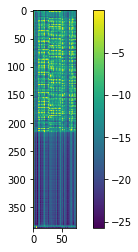

<s>아__________________ᅩ___ᄋ_____메_____데__다___ᄋᄋ__ᄋ__ᆫ__예__ᄋ____________________  아___ᄋ__ᆫᆫ__지___오__오___으__으____데___다___여_______ 가_____ᆫ__다_________________________ 배___가__ᆫ  가__라_ 하___메___뉴___는__은__아_________________어_ᄌᄌᄌ_______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s>
<s>아ᅩᄋ메데다ᄋᄋᆫ예ᄋ 아ᄋᆫ지오오으으데다여 간다 배간 가라 하메뉴는은아어죠?</s>
<s>아 오늘 배달이 아니라 다음주 월요일 배달하려고 합니다. 배달 가능한 메뉴는 뭐가 있죠?</s>_______________________________________________________________________


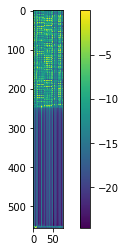

-------------------------------------------------------------------------------------------------------
09-22 09:42:46
09-22 09:45:12
Mean Train Loss: 0.03559908616927661
Train CER: 0.6420517694672052
09-22 09:45:27
Mean Evaluation Loss: 0.032108819987014314
Evaluation CER: 0.6130494475559527


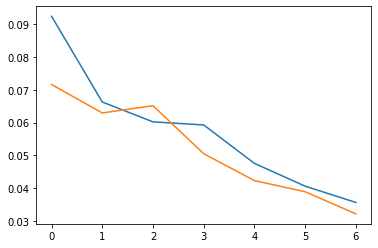

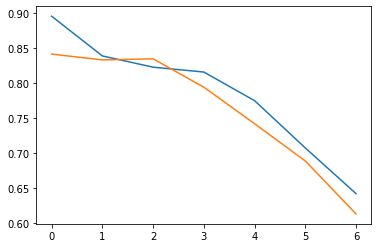

<s>브_______________늘_아___ 하____드___ᅵ_ 가__ᆫ__드_____고_______ᆫ__게__ᅵ___부__ᆫ__자___허_____하______시___이__다________________________  버_ᆫ__시___까____시ᅵ__앙 후__ ᄉ____________ 있나ᄋ____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s></s>
<s>브늘아 하드ᅵ 간드곤게ᅵ분자허하시이다 번시까시앙 후 ᄉ 있나요?</s>
<s>부메랑 카드를 만들고 웰컴 쿠폰을 받았습니다. 언제까지 사용할 수 있나요?</s>________


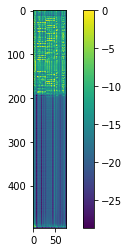

<s>아______________기____지___차____레________ 자______느___드___가_________________________ 파___르____파____기_ ᄋ_______ᅵ___뉴___누___도_____  가___고___시________데_________________________ 허_____인__지__제_ᆼ__무_____________ 따___느___하___이________ 후___이__ _____________________________________ 싰나ᄋ_________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅭᅭ?</s></s></s>
<s>아기지차레 자느드가 파르파기 이뉴누도 가고시데 허인지젱무 따느하이 후이  싰나요?</s>
<s>아직 주차를 잘 못해서 발레파킹있는 곳으로 가고 싶은데 거기 지점은 발레파킹 해주시나요?</s>__________________________________________________________________


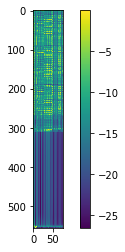

-------------------------------------------------------------------------------------------------------
09-22 09:45:27
09-22 09:47:56
Mean Train Loss: 0.04585980312651073
Train CER: 0.6861506256971289
09-22 09:48:11
Mean Evaluation Loss: 0.09979694654873977
Evaluation CER: 0.8854359622551049


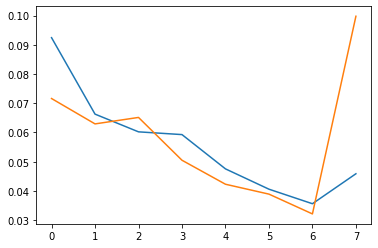

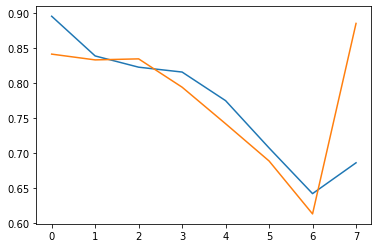

<s>자ᅡᅡᅡ                   ᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋ요ᅭ?</s></s></s></s>
<s>자 요?</s>
<s>*월**일에 *명 예약 할 수 있나요?</s>________


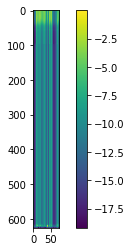

<s>자ᅡᅡ                                                  ᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋᄋ요ᅭ?</s></s></s></s>
<s>자 요?</s>
<s>아웃백갔다가 영화관가려고 표예매했는데 그표 보여드리면 오지 치즈 후라이받을수 있나요?</s>_______________________________________________________________________


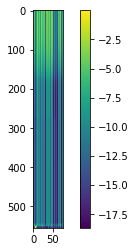

-------------------------------------------------------------------------------------------------------
09-22 09:48:12
09-22 09:50:39
Mean Train Loss: 0.08784234520169093
Train CER: 0.8904379389972802
09-22 09:50:52
Mean Evaluation Loss: 0.06902467337968497
Evaluation CER: 0.8835617931004424


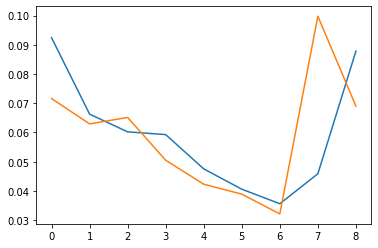

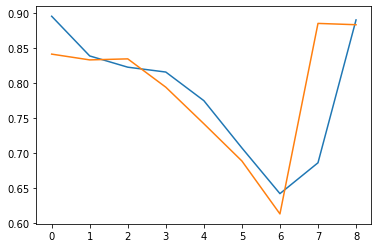

<s>아______________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅡᄋ요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아ᅡ요?</s>
<s>오늘 *시에 갈 예정인데 식사가능한가요?</s>_


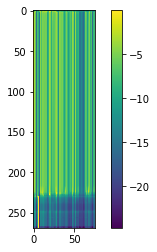

<s>ᄋ__________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅡᅡ요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

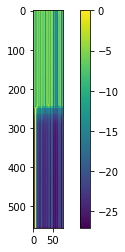

-------------------------------------------------------------------------------------------------------
09-22 09:50:53
09-22 09:53:28
Mean Train Loss: 0.06813868448959744
Train CER: 0.8604320460981069
09-22 09:53:42
Mean Evaluation Loss: 0.07022056432547293
Evaluation CER: 0.8532699893215944


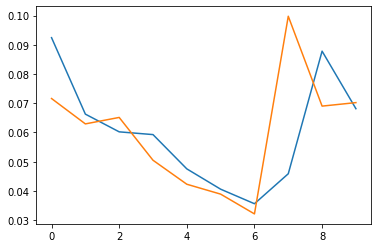

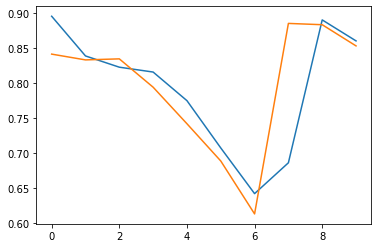

<s>아ᄋ____________________________________________________________________________________________________________________________________________________________________________ᅵᆻ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

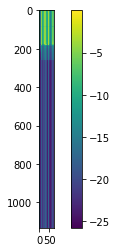

<s>아ᄋ______________________________________________________________________________________________________________________________________________________________ᆻ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

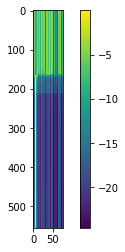

-------------------------------------------------------------------------------------------------------
09-22 09:53:43
09-22 09:56:08
Mean Train Loss: 0.06698402675201678
Train CER: 0.8507256567974635
09-22 09:56:22
Mean Evaluation Loss: 0.06615896372445691
Evaluation CER: 0.8367947348922353


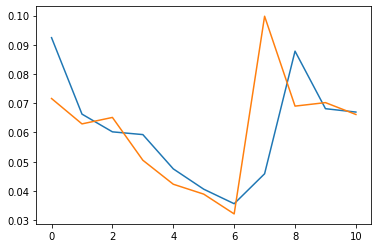

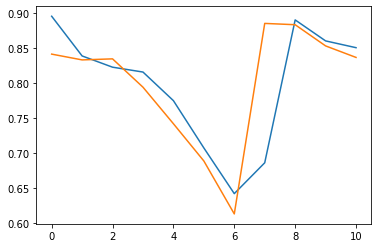

<s>아ᄋ_______________________________________________________________________________________________________________________________ᅵᆫ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아인나요?</s>
<s>이번달에 영업 안하는 날이 언제인가요?</s>


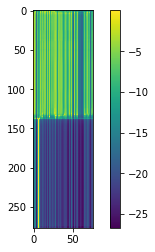

<s>아ᄋ_______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅵᆫ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

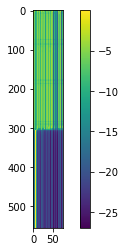

-------------------------------------------------------------------------------------------------------
09-22 09:56:23
09-22 09:58:49
Mean Train Loss: 0.0663325887065146
Train CER: 0.8434477030221711
09-22 09:59:04
Mean Evaluation Loss: 0.06518354322258028
Evaluation CER: 0.8431146076230741


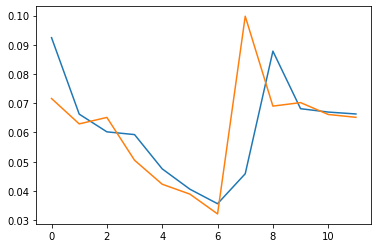

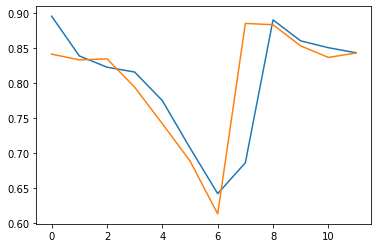

<s>아ᄀ_____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅵᆫ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아긴나요?</s>
<s>안녕하세요 제가 지금 아웃백을 가서 포장을 바로 가져올 수 있게 하려는데요</s>___________


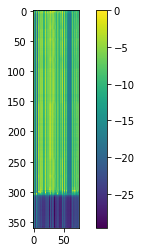

<s>안______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅵᆻ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

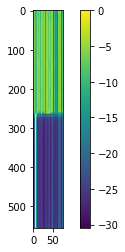

-------------------------------------------------------------------------------------------------------
09-22 09:59:04
09-22 10:01:33
Mean Train Loss: 0.06546918081570877
Train CER: 0.8430368085669496
09-22 10:01:46
Mean Evaluation Loss: 0.0641145877613796
Evaluation CER: 0.838930416021967


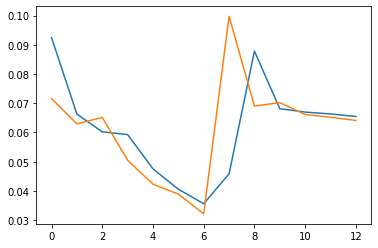

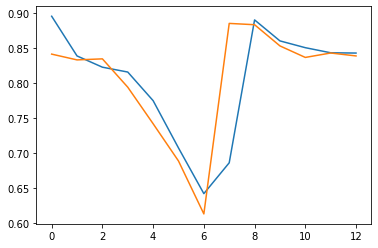

<s><s><s><s><s><s><s><s><s><s>아ᄋ________________________________________________________ᅡᆫ나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아안나요?</s>
<s>한글날에 영업 안하나요?</s>____


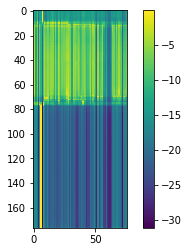

<s>아ᄋ_______________________________________________________________________________________________________________________________________________________________________________________________________ᅡᆫ나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

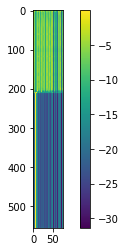

-------------------------------------------------------------------------------------------------------
09-22 10:01:47
09-22 10:04:21
Mean Train Loss: 0.06386122730514533
Train CER: 0.8373594845603057
09-22 10:04:35
Mean Evaluation Loss: 0.06522188029482638
Evaluation CER: 0.8449451914485584


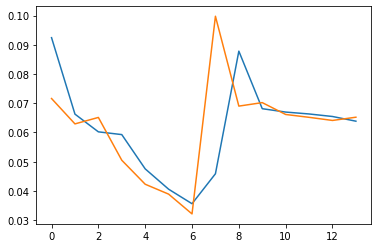

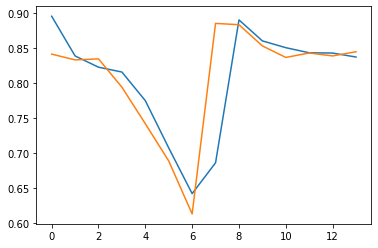

<s><s>아ᄋ_____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________힜나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

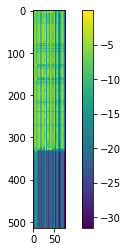

<s><s><s><s><s><s><s><s><s>아ᄋ________________________________________________________________________________________________________________________________________________________________________________________________________________________________있나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

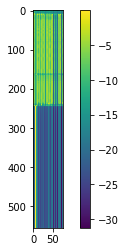

-------------------------------------------------------------------------------------------------------
09-22 10:04:36
09-22 10:06:59
Mean Train Loss: 0.06354178443166936
Train CER: 0.8338322393312351
09-22 10:07:13
Mean Evaluation Loss: 0.06175801263439086
Evaluation CER: 0.8316516660492078


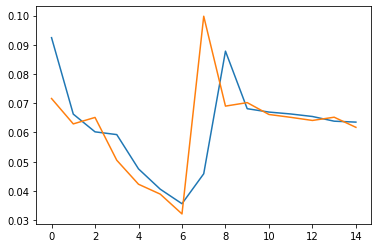

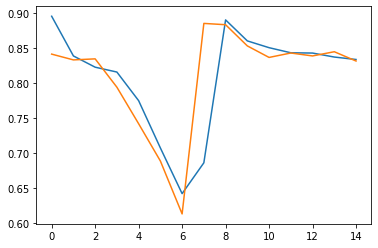

<s><s><s>아ᄋ_______________________________________________________________________________ᆼ한가요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아ᄋᆼ한가요?</s>
<s>영업 몇시부터 몇시까지 하나요?</s>


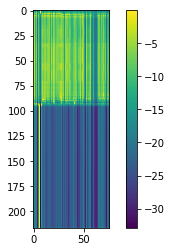

<s>아ᄋ______________________________________________________________________________________________________________________________________________________________________________________________________한나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

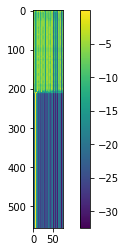

-------------------------------------------------------------------------------------------------------
09-22 10:07:14
09-22 10:09:38
Mean Train Loss: 0.06197687619879076
Train CER: 0.8306789263015205
09-22 10:09:53
Mean Evaluation Loss: 0.060564153946334895
Evaluation CER: 0.8276418157648135


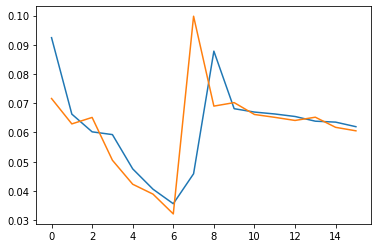

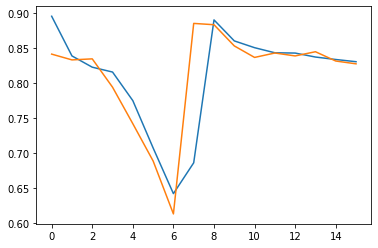

<s><s>자ᄋ____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᆼ한가요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

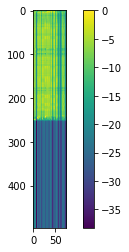

<s>자가_________________________________________________________________________________________________________________________________________________________________________________________________________________있나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

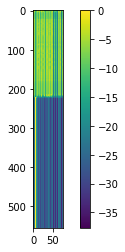

-------------------------------------------------------------------------------------------------------
09-22 10:09:54
09-22 10:12:22
Mean Train Loss: 0.05950275002127325
Train CER: 0.8283961142052039
09-22 10:12:35
Mean Evaluation Loss: 0.05689836374735653
Evaluation CER: 0.8279251204044719


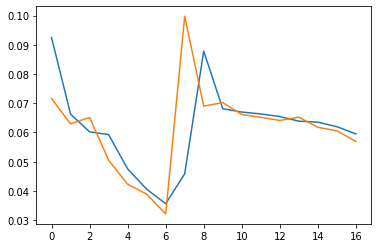

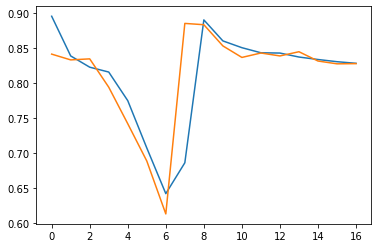

<s>오ᄋ______________________________________________________________________________________ 있나요__?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>오ᄋ 있나요?</s>
<s>오늘 마감시간은 몇시인가요?</s>_


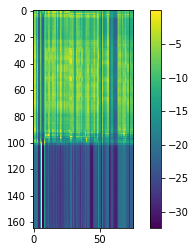

<s>안___________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ 있나요__?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

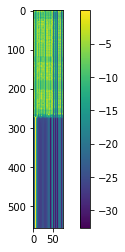

-------------------------------------------------------------------------------------------------------
09-22 10:12:36
09-22 10:15:12
Mean Train Loss: 0.05236344106379655
Train CER: 0.7895532170106471
09-22 10:15:26
Mean Evaluation Loss: 0.05022000978452661
Evaluation CER: 0.8086821975722972


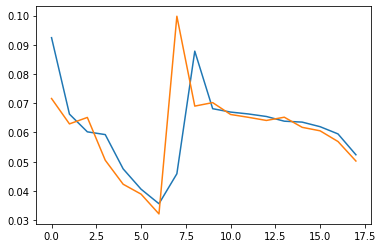

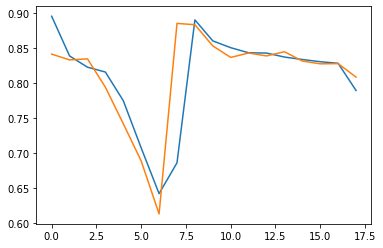

<s>아_________________ᅡ________________가_____ᅡ_____가___하___ᅳ_______시____ᅳ_____ᅩ_____시___으_____________ᅳ__________가___________시__ᅵ___예______________수_____여_______예__________기____수___느_________ᅳ____ᄋ_______________________________이____오_____으______자________시__ᄋ________서___이____________________________시_________________________가___________________________________________________________________________나ᄋ요_____?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아ᅡ가ᅡ가하ᅳ시ᅳᅩ시으ᅳ가시ᅵ예수여예기수느ᅳᄋ이오으자시ᄋ서이시가나요?</s>
<s>아 제가 다음 주 월요일 오후 *시에 *명 예약했었는데요 인원이 바뀌어서요. **명 가능할까요?</s>_____


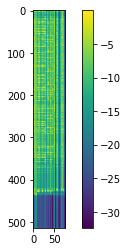

<s>아__________________________ᅡ____ᅡ__________________가________시_______지________에_____주______시___아___시____오_____ᄉ시______으____가______________________________기_____오____시___아___시____사____가___가____시__가________________________너요___?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

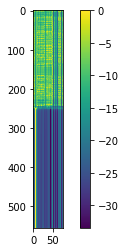

-------------------------------------------------------------------------------------------------------
09-22 10:15:27
09-22 10:17:53
Mean Train Loss: 0.04723609692935057
Train CER: 0.7685232108341843
09-22 10:18:08
Mean Evaluation Loss: 0.043700898415202194
Evaluation CER: 0.7639200645062871


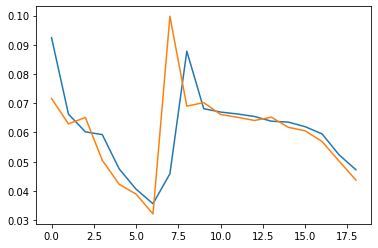

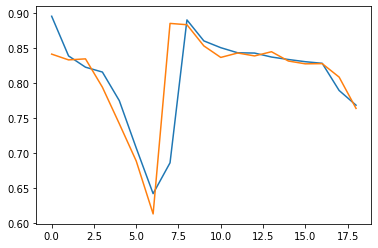

<s>여__________________이___아________지_____시___가___이__아___이______________ 있나요_?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>여이아지시가이아이 있나요?</s>
<s>오늘 런치 시간이 언제인가요?</s>_


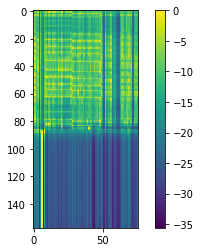

<s>아_______________이___야___에___에___ᄋ__________________에___아_____ᅳ__ 여__하____ᄋ____조__가___에_____느____메___ᄋ___________________________________ 시___이____여________ᅵ____________에__이___에_________저______ᄉ시__에___예_야___이__ 가__느___________ᆼ한가요_______?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

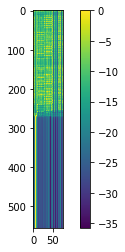

-------------------------------------------------------------------------------------------------------
09-22 10:18:08
09-22 10:20:35
Mean Train Loss: 0.04560775796294534
Train CER: 0.758351239976335
09-22 10:20:50
Mean Evaluation Loss: 0.04540861037560289
Evaluation CER: 0.7577091550983939


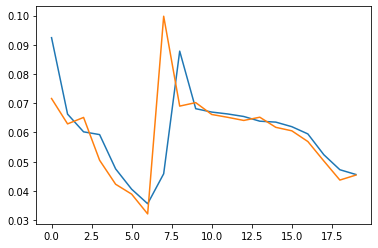

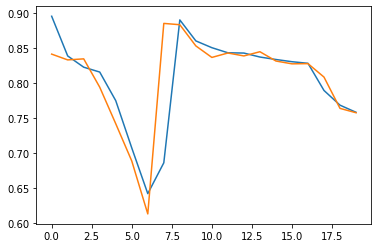

<s>지__________________그___가__이____________가___느______하___ᅡ___느____________가___느__________ᅡ__느____ᅥ______________메______________________가________더_______ᅵ__________고______저________어_____ᄀ_________________ᅵ_나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

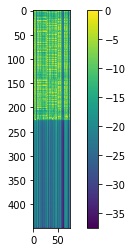

<s>아__________________마_____이_____가_____이___아___수____오___에_____가____이_____느_____데_____________________가_____ᅡ____가___네____ᅡ_______다_____이___조________조___________에_______________________________가_____느_______시___시______시_____ᄉ_________ᅬ_데요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

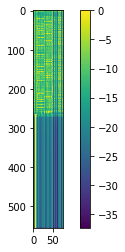

-------------------------------------------------------------------------------------------------------
09-22 10:20:51
09-22 10:23:21
Mean Train Loss: 0.04380615042468037
Train CER: 0.7454456812780936
09-22 10:23:35
Mean Evaluation Loss: 0.04182208677793129
Evaluation CER: 0.7385751955891647


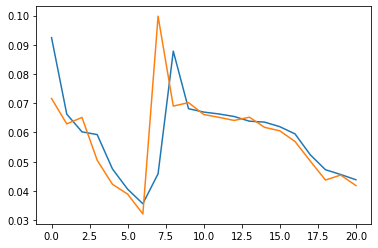

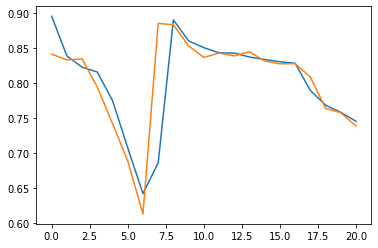

<s>예___________________가_____며_____예__야_____가____느_________________________________________________________ᆫ까요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>예가며예야가는까요?</s>
<s>*명 예약 가능한가요?</s>__________


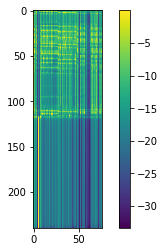

<s>ᄋ_________________이___아___에___야_____________________예___아_____느__여__ᄋ__________소__마___여_____느____데___ᄋ___________________________________시_____이____어______추______저____에________________ _저______시___메_____야ᅣ___이___가___느______________ᆼ한가___요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

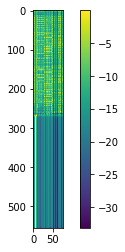

-------------------------------------------------------------------------------------------------------
09-22 10:23:36
09-22 10:26:14
Mean Train Loss: 0.04157995690426692
Train CER: 0.7263134394999256
09-22 10:26:28
Mean Evaluation Loss: 0.040447659747536426
Evaluation CER: 0.729422276461743


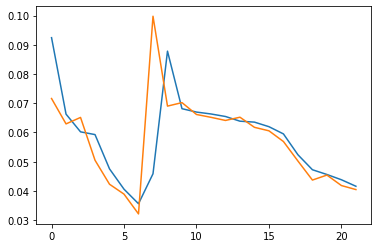

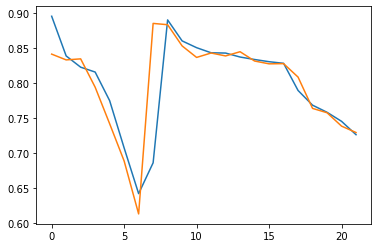

<s>ᄋ__________________거________이__브_______  사____서_____시__ᅵ________ _가___소______며___________시_____처______ 수___하___예___야_ᆨ_하ᅡ____가___으____는___데______________________________거____시__ᅦ____이___이___야_______자_____겨____이___ _가___느____________________ᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

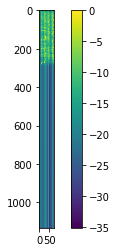

<s>지_________________느_____가___오_____가______제___ᄋ______프__ᄋ____가___이___에___ 가____느__하______지_____________________________________ _오_______이____아___  그___느____더____저_______그__이____가___하___ 가____으____ᆫ__지______가____고__가____________________ᆸ니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

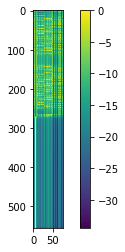

-------------------------------------------------------------------------------------------------------
09-22 10:26:29
09-22 10:28:56
Mean Train Loss: 0.04066396587467718
Train CER: 0.7122794981607248
09-22 10:29:10
Mean Evaluation Loss: 0.03807045629146843
Evaluation CER: 0.6994573626517314


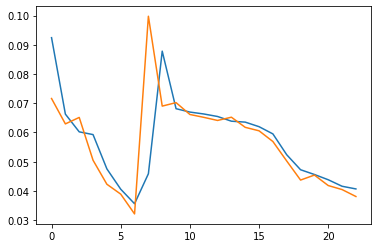

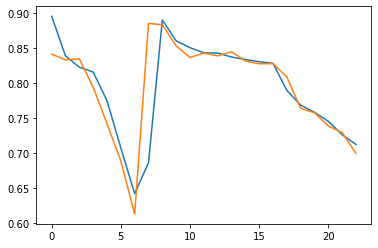

<s>아________________녀___하____시______야____ᄋ____데______마____지___그____모___ᅥ_____메___느___ᅡᅡ____더___________________________그___사____에___ 가___라____ 가____지_________시_______ᅦ___아___여______________________________데요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

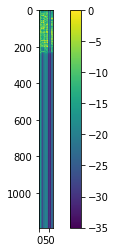

<s>ᄋ___________________나_____이_____사_____이___하___소____오__흐______가_____느____느____데______________________다___아____하_____녀___아___ᆫ__다__________조_____ᆫ_조_____ᅩ_______ᅦᅦ____________________________  가_____느_______시___시______시_____주____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

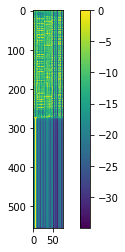

-------------------------------------------------------------------------------------------------------
09-22 10:29:11
09-22 10:31:39
Mean Train Loss: 0.039048919956035065
Train CER: 0.6950849506808068
09-22 10:31:54
Mean Evaluation Loss: 0.037043112287340946
Evaluation CER: 0.685335715997995


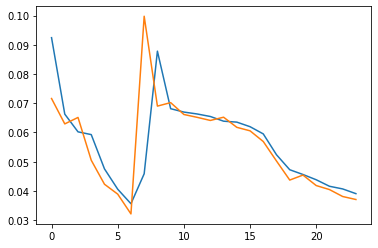

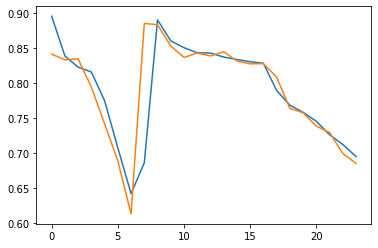

<s>지_____________________처______브_________저____으__라__자___에___가____체____하_ᆯ_려__라_____메____________자___이__이___메______느_나______며______ _머___시__아___오__________________인가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지처브저으라자에가체할려라메자이이메느

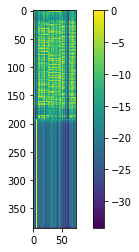

<s>아___________________이___자______________________  하________지__ᄋ____이_______이______조_____ 지___고__시_____아_____시___ᅮ__이____가______________________________ 드_____오____세___아___시___자____ 하___며____시__하______________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

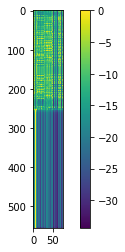

-------------------------------------------------------------------------------------------------------
09-22 10:31:55
09-22 10:34:26
Mean Train Loss: 0.03779689994698221
Train CER: 0.6824624621563491
09-22 10:34:40
Mean Evaluation Loss: 0.035988458910534635
Evaluation CER: 0.6799965131736657


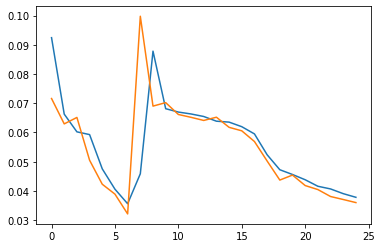

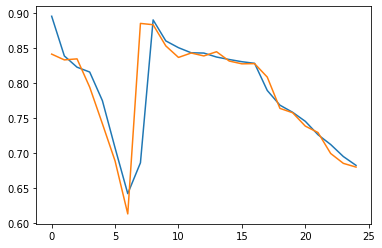

<s>오___________________느_________메______ᅵ_________오______소_____어____ᆫ__에____ 수_________가_______자______________________여__ᄋ____ᄋ_______ 하____시________ᅡ______________________________아요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

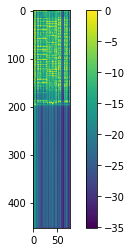

<s>아______________________________에_____드____ᅡ_______ᄋ____예__ᄋ야___________________ 바_______ᆫ__치___오_______이__이____메___나___에________가________다_________________________ _드__마_____가___르__하__느___느___는__는__가________________지요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

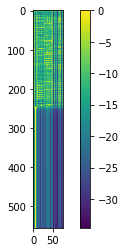

-------------------------------------------------------------------------------------------------------
09-22 10:34:40
09-22 10:37:19
Mean Train Loss: 0.03656977575060835
Train CER: 0.6643010731230324
09-22 10:37:34
Mean Evaluation Loss: 0.03542264902662035
Evaluation CER: 0.6605792490247783


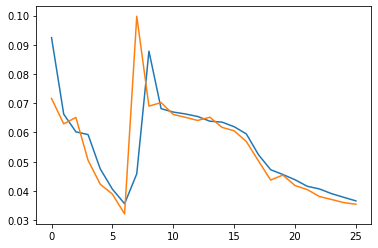

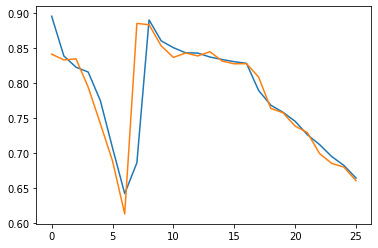

<s>지___________________느__ 며_______아________베____게___에____ 며______ 수____에__ 시__아____아__요_어____ _예_약__하__고____나_____________  하__ᆫᆫ_제___예__여___가__한_그__가__________________ᅵᆸ나요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

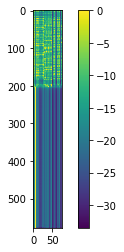

<s>아_______________니___하___데___아_____________________ 예___야____느___져__ᄒ________ 소___가__에______느_ᆫ__데_____________________________ ________치_____ᄋ_____모___ᆫ__치______ 퍼___ᄋ________ᄋ_________ 저______시____메__예__약__지_  가__느_________________ᆼᆼ하___ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

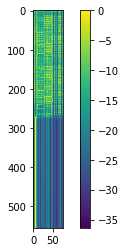

-------------------------------------------------------------------------------------------------------
09-22 10:37:34
09-22 10:40:01
Mean Train Loss: 0.03654948650599085
Train CER: 0.6582425592431557
09-22 10:40:16
Mean Evaluation Loss: 0.03473517354261492
Evaluation CER: 0.652624926449757


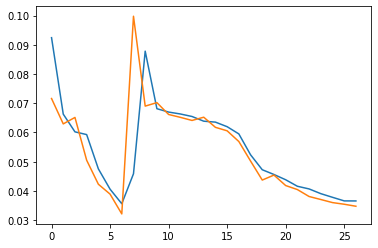

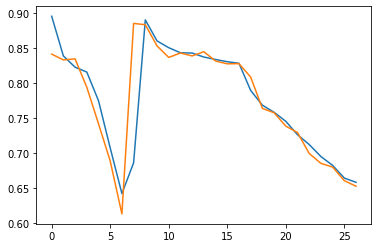

<s>자______________________ᆼ__이______에_____ᅡ____에___ _가______느___________________ᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>장이에ᅡ에 가능한가요?</s>
<s>당일 예약이 가능한가요?</s>______


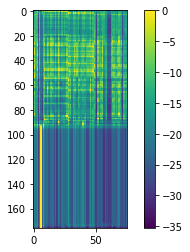

<s>자_________________갈_이__ 자______가__스___ᆫ__크___다__느____느_ᆫ__데________________이___자___ᄅ__가__는  자___리_ᄅ__ᆫ_ 저_______으__어__ᅡ___늘_이____시________이_______________________________________________________어요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

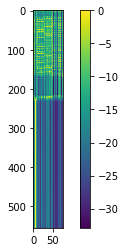

-------------------------------------------------------------------------------------------------------
09-22 10:40:16
09-22 10:42:44
Mean Train Loss: 0.03493752818908316
Train CER: 0.6388634631025805
09-22 10:42:59
Mean Evaluation Loss: 0.032182804515058804
Evaluation CER: 0.6209601848017957


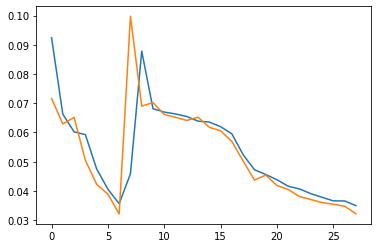

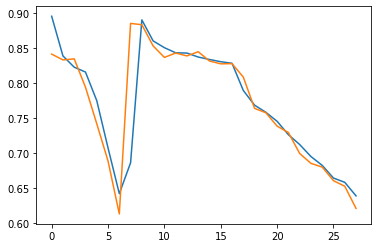

<s>매___________________다_____가_____으__아________________ _____데____크___가__ᄋ____ᅮ_______________ᄋ___ᅵᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

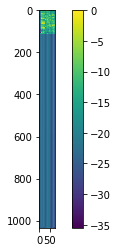

<s>이______________그___다____ᅩ___바____ᆫ__주___으___도___가_____이___  가______하______시_______________________무__로___이__가_ᆨ_그___에__ _고____토__ᆫᆫ_다__려___가____하_____느__디_ 가_____느_______________합니됴.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

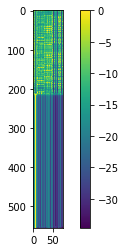

-------------------------------------------------------------------------------------------------------
09-22 10:43:00
09-22 10:45:31
Mean Train Loss: 0.03325180726470892
Train CER: 0.6180412357962893
09-22 10:45:45
Mean Evaluation Loss: 0.031501253041664484
Evaluation CER: 0.5999956414670822


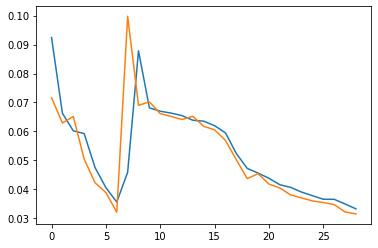

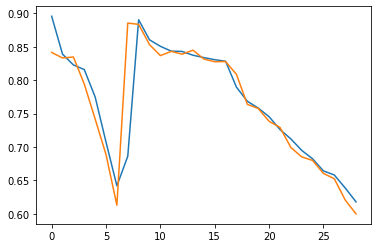

<s>ᄋ__________________저__ᆼ__ᄀ__ᆫ__저____이_______도__ _시_____아____이___가____ᆫ_데_______데____다_____이__요_ᆼ_어___아____하_ᆯ_인__가____으_______게___저____고___아___느___________________ᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>ᄋ정ᄀᆫ저이도 시아이간데데다이용어아할인가으게저고아능한가요?</s>
<s>매장 근처에 유료 주차장 있던데 매장 이용하면 할인 같은 것들 적용 가능한가요?</s>


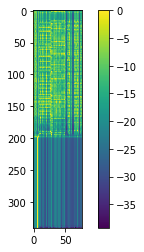

<s>자_________________갈_에___다______가__도___ᆫ__븐__다__하____느_ᆫᆫ_데______________  이___다______가__는  자___리____ᆫ_ 버_______뎌__어__ᅡ___을_지____시________지_______________________________________________________세요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

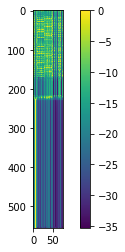

-------------------------------------------------------------------------------------------------------
09-22 10:45:46
09-22 10:48:23
Mean Train Loss: 0.031718069148436244
Train CER: 0.5958297059241724
09-22 10:48:37
Mean Evaluation Loss: 0.030542558291324712
Evaluation CER: 0.5878135419617757


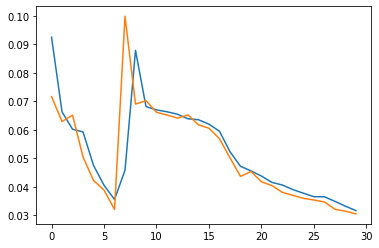

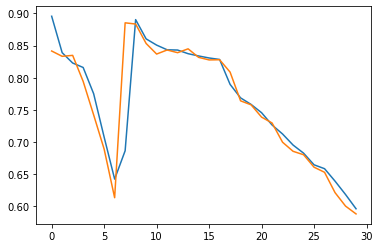

<s>아_____________________녕__하__데___요___아___이__ᄅ_____퍼____시____으__네__료___ᅩ___하___이______예___ᄋ야_ᆨ__애______도___ 자___느___느___데_________________________________  _ᅩ__시____시__거___대___ 저__ᆼ__조___ᆼ   가___느___________________ᆼᆼ한ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

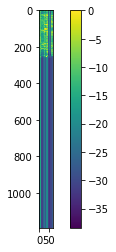

<s>오_______________리__에___자__ 저___조___ᆫ__자___이_ᆫ__데___________________________________ 제____에____파____지______ 지_____보___ 가___저____여___ᆼ_ _시__으____에____세_______________________________ᅳ__ 에____느__어_ᆫ_ 고__어______시_____________________________________________________________________________________________________________이_ᆯ까요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

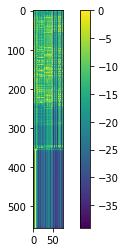

-------------------------------------------------------------------------------------------------------
09-22 10:48:38
09-22 10:51:05
Mean Train Loss: 0.03088198532409479
Train CER: 0.5822955199604335
09-22 10:51:19
Mean Evaluation Loss: 0.029390707573526752
Evaluation CER: 0.5725586767494062


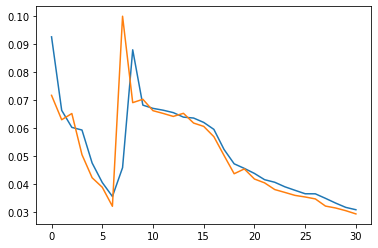

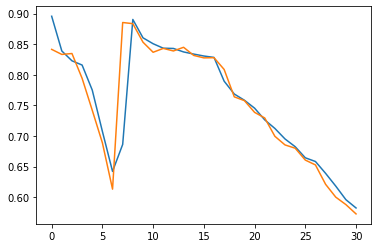

<s>오__________________리___ᆫ_이___  가_ᆯ__이_ᆫ_____________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>오린이 갈인 있나요?</s>
<s>어린이 할인 있나요?</s>___________


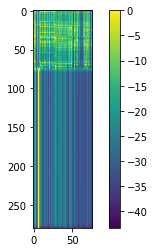

<s>여_________________ᆫ__마____이__ᆫ__데____________으_____사____오_ 드_____모______ᆫ__나_____요_____________________________________ _*ᅡ________ᆫ__머___이____태___이ᅵ____가__아____ᆫ__ᄆ_____ᅭ____________________________________________  *ᅥ___ᆼᆫ__치_____마___ᆫ__메_____ᅵ_  하___느__이____차____가__________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

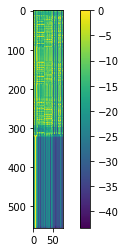

-------------------------------------------------------------------------------------------------------
09-22 10:51:20
09-22 10:53:47
Mean Train Loss: 0.029842289898811568
Train CER: 0.5676016243571953
09-22 10:54:02
Mean Evaluation Loss: 0.028110215250405923
Evaluation CER: 0.5550809597489486


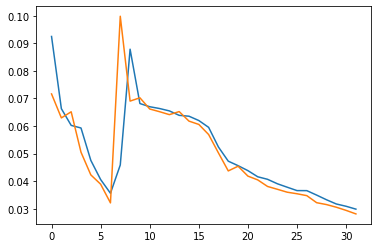

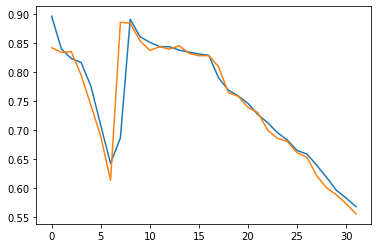

<s>며_______________ᆾᆾ__시_____ 투_____투___메___ 수__________다______이__가____ 지___리___ 부____태____이___이_________________에요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>몇시 투투메 수다이가 지리 부태이이에요.</s>
<s>몇시부터 몇시까지가 브레이크 타임이에요?</s>___


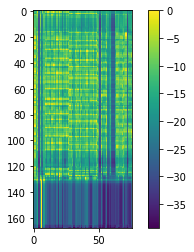

<s>내______________________________________________________  이___거_____이____________하____ 수_____이_______ᄂ___로________________ _ᄋᄋ_______하____ᄋ___ ᄉ___이________크_____가_____________ 지____ᆼ_해_____여___흐___  추__하____이_____다_____고__ 하____느_______ᆫ__데________________________________________ 호_____시______________________  이______미_____추_____수____ᅦ______________________________________________________________________________________________________________________________________________________하__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>내 이거이하 수이ᄂ로 ᄋ하ᄋ ᄉ이크가 징해여흐 추하이다고 하는데 호시 이미추수ᅦ하나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


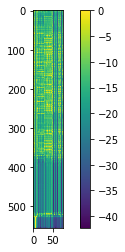

-------------------------------------------------------------------------------------------------------
09-22 10:54:03
09-22 10:56:36
Mean Train Loss: 0.02878751070624173
Train CER: 0.5571926946465552
09-22 10:56:50
Mean Evaluation Loss: 0.027850868790402366
Evaluation CER: 0.5495674156079063


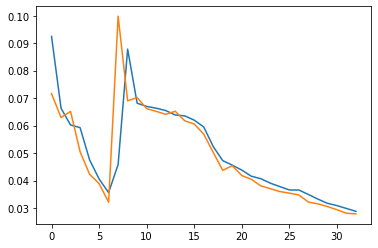

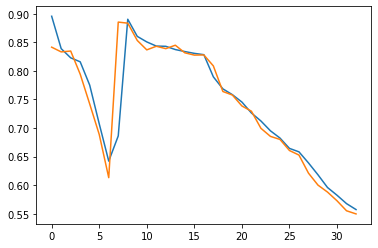

<s>아_____________________________________________________________추_____부___ᄅ_______ 주_____차____하__사______크_____ᆫ__다______________________________오_ᆨ___시___ 가____랴____파_____키___ᆼ__느_  즈___나____________________________________________________________  _가______나_ᆼ_에___ _가____려_____느___ᆫ__자______________  가___랴____파____이___ 가____니___ᆻ_이__________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________

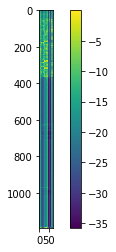

<s>아_______________________오_____느_____드__다____ᄋ________예___ᄋ____________________ 가___ᄋ___ᆫ__주___오_______르__으____메___나___에___여___가____ᄂᆫᆫ_자_________________________  드__다____ 가___ᅳᆼ_하__ 메___느___느___무____ᅡ____________ 이_ᆻᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

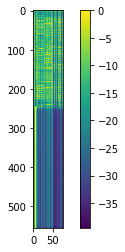

-------------------------------------------------------------------------------------------------------
09-22 10:56:50
09-22 10:59:29
Mean Train Loss: 0.027893406394145143
Train CER: 0.5413768697683375
09-22 10:59:43
Mean Evaluation Loss: 0.028195532302915244
Evaluation CER: 0.5440974567960425


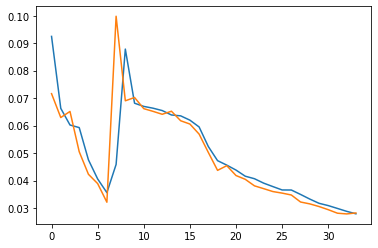

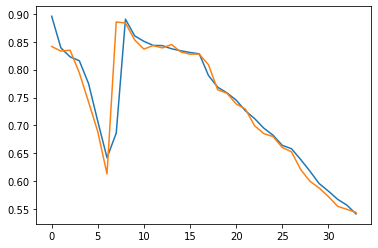

<s>네___________________이__ 모____느______시___에___보__에___애___가__아___지__가_____느___ᆫᆫ 메____뉴___아____ 하_ᆯᆯ_여_ᆼ__가__________________   자___리_ᆯᆯ_로_______  시__ᄋ____문_으__흐___주_________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

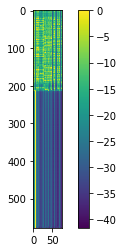

<s>자__________________너___ᆼ_에___ 자____ᆯ_이__가__ 조____구_ᆫ_으_____파_____느___ᆻ느__ᆫ__데____________________ 바___가___  가____느_ᆼ_하____ᆫ__자_____이___조____ᆼ_ 조____ᅩ____ᆫ__데___료_______________________  가___ᆫ_네________주___리__ᆯ_ 수__이__주_____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

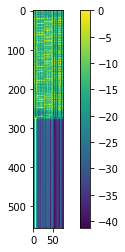

-------------------------------------------------------------------------------------------------------
09-22 10:59:44
09-22 11:02:12
Mean Train Loss: 0.027277539459823974
Train CER: 0.5321563778469806
09-22 11:02:26
Mean Evaluation Loss: 0.02672864195754716
Evaluation CER: 0.5235033887593437


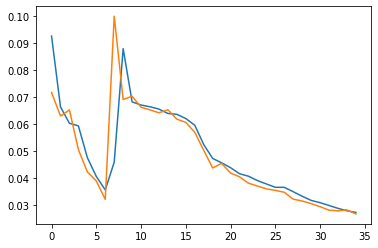

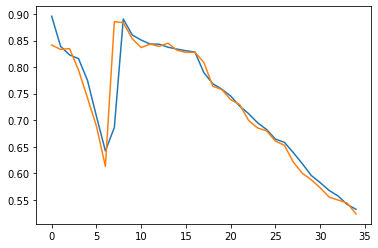

<s>아__________________ᆼ_기____ 조_____서_______________ _포______저____ᆼ___지_______________  하___에_____저________조___이___ 자_____고___ᆯ____시______요________________________________________________________하__우______버______게____저____________ 보_____저__ᆼ__ 주____저_____재___수______  주___군_ᄋ_______________ 아___ᅡ___ᄉ_______________________________________________________나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

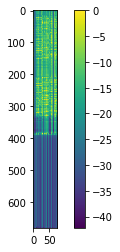

<s>네____________________________________________  미____마___ᆷ_으________________ 무__오________시_ᆫ__메____뉴___로___ _여___ᆼ__마____으_______테____그___ 가___드_ᆫ__에___느___ᆫ_ 서___하__라_ᆼ__가__오_ 가_____느__ᆫ__데___________________________   모_____시_________ _______ᄂ_ᆫ__주___시___로____________________ 가__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

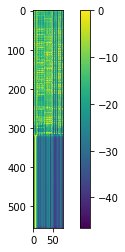

-------------------------------------------------------------------------------------------------------
09-22 11:02:27
09-22 11:04:57
Mean Train Loss: 0.02659695691886476
Train CER: 0.5222437580123314
09-22 11:05:12
Mean Evaluation Loss: 0.025600399555755975
Evaluation CER: 0.517902673959945


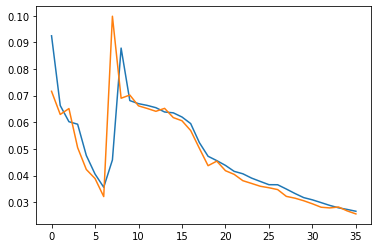

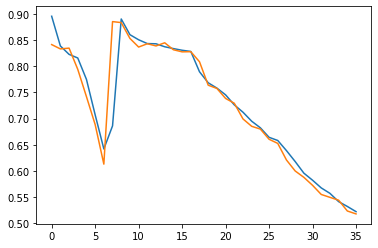

<s>어_____________________ᆫ__체____에___는 어__ᄋ___지______시____차___라___ 쇠___여__하_______________ᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

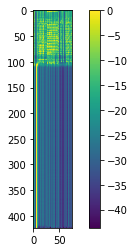

<s>오_______________리__엘_ 다_  조___도______자___이____데__________________________________  제____에___파_____기_____  지_____보__ _가___자____며___ᆼ  새___으____느____세__에______________________________ 에____뉴_ᄋ_____ 모__ᄋ_____시_______________________________________________________________________________________________________________ᄋ__ᆯ까요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

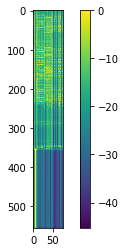

-------------------------------------------------------------------------------------------------------
09-22 11:05:13
09-22 11:07:45
Mean Train Loss: 0.02588606884839234
Train CER: 0.5149651152745807
09-22 11:07:59
Mean Evaluation Loss: 0.02531314612507388
Evaluation CER: 0.5128903611044522


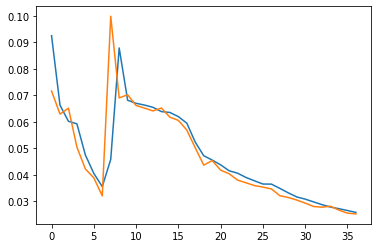

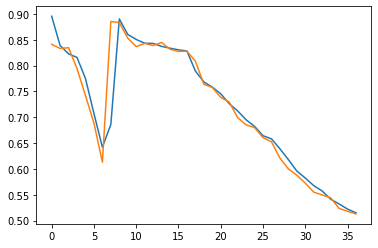

<s>어_________________기___사____아____으_______이__ᆫ__데______ ___어____________즈______구__로___바___려_________________________되____나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

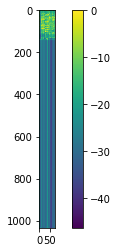

<s>아___________________니___사_____________________  _그________지__ᄋ____디__ᄋ____애______조______주__가___주_____가__ᅥ__싶__이___ᅦ__다______________________________  그_____고___져___라_____시__사___ 하___마__ᆫ__서__거_ᄅ_____________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

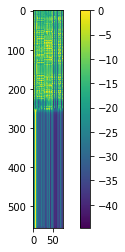

-------------------------------------------------------------------------------------------------------
09-22 11:08:00
09-22 11:10:39
Mean Train Loss: 0.025158254343568547
Train CER: 0.505009491537231
09-22 11:10:53
Mean Evaluation Loss: 0.02575079713341255
Evaluation CER: 0.5010133589033932


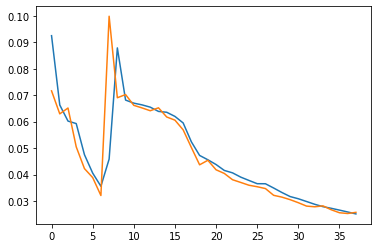

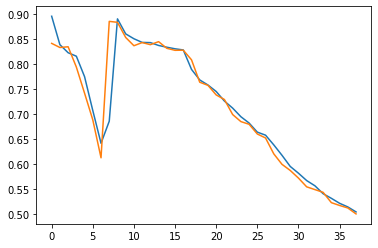

<s>아__________________우ᅮᆺᆺᆺ_백ᆨ__으__ 다____ ᄒ하____시_____도____이_____ᆫ_ 데____느__ᆫ__지____구_ᆫᆫ_구__ᆫ 마____이___다_________________ _ 무___어____서___ 가___ᄋ____떠_ᇂ__제____ 어_____ 오___시__ᆸ__________________________머_ᆫ가요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

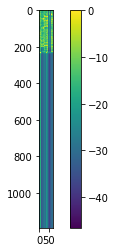

<s>아______________우ᅮᆺ__백ᆨ__가_____트___가___여__아__나_ᆫᆫ_가___녀___고_____포_____ᄋ이___메____ᆻ느__ᆫᆫ_데__________________________  크_____처__ᄋ__ 도___어___으__지___느_________________________________  오____지_____치____지___은_아_이ᅵ 거__흘  _ᄉ_________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

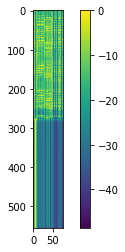

-------------------------------------------------------------------------------------------------------
09-22 11:10:54
09-22 11:13:21
Mean Train Loss: 0.02449329933201874
Train CER: 0.4921755170885076
09-22 11:13:36
Mean Evaluation Loss: 0.024408555958345377
Evaluation CER: 0.49754832523372633


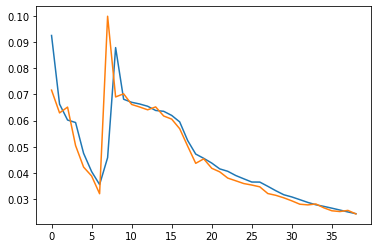

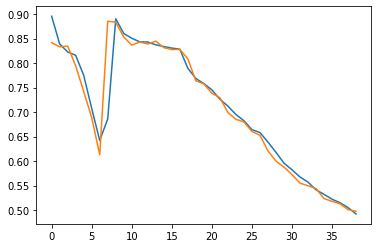

<s>가____________________ᅮ___패______예__야____ᆨᆨ__ _가___느_______________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>가ᅮ패예약 가능한가요?</s>
<s>단체 예약 가능한가요?</s>_________


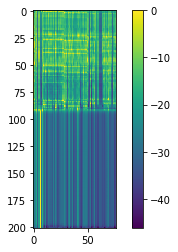

<s>어_______________리________ 주____차____할__사_____고_____패___서___________ 바____려___파____키_____ᅵ___느_ᆫ______주_____ 거____고_ 싶_으_ᆫᆫ_데_______________________________  구_____리__ _주___저__ᆼ_오___ 바___려__파_____이___ᄒ_____주____________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

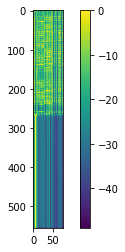

-------------------------------------------------------------------------------------------------------
09-22 11:13:36
09-22 11:16:03
Mean Train Loss: 0.024122471567578758
Train CER: 0.4861648060466531
09-22 11:16:19
Mean Evaluation Loss: 0.023977769649393976
Evaluation CER: 0.48401508052389564


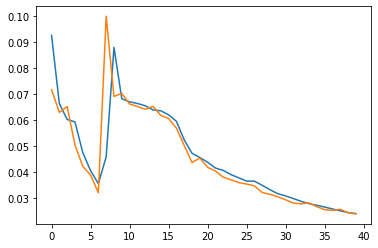

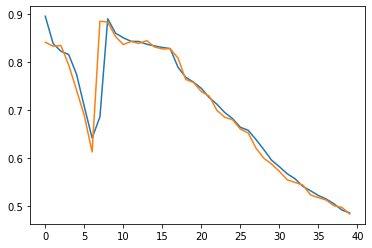

<s>아_______________우ᅮᆺᆺᆺᆺ_백ᆨ_________  포___라_____에____ᅵ__  이___ᆻ_느_ᆫ__가______그________________________________________________________________________________________________________________________________ 마_ᆽ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아웃백 포라에ᅵ 있는가그 맞나요?</s>
<s>아웃백 보라매에 있는 것 맞나요?</s>_________


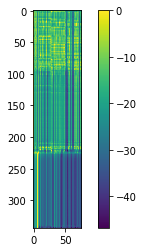

<s>러_________________ᆼ__마____이__ᆫ__데____________으____ 사____그__트___ 고_______ᆫ__나____요_____________________________________ _으__에______ 머____라____테___이__ᆫ__거__아___ᆫ__나____요____________________________________________ _거____ᆫ__치_____가___ᆫ_메________ 가__ᆫ_므__이____거____가__________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

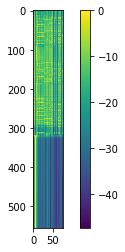

-------------------------------------------------------------------------------------------------------
09-22 11:16:19
09-22 11:18:51
Mean Train Loss: 0.023924790717089448
Train CER: 0.48273312191254497
09-22 11:19:05
Mean Evaluation Loss: 0.023282918041531226
Evaluation CER: 0.4784797437182644


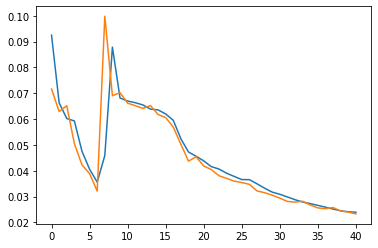

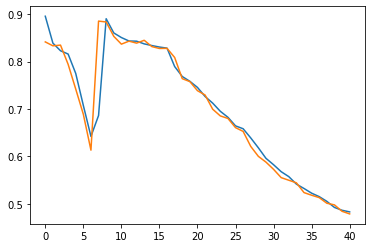

<s>가__________________ᆫ_마_______이_____나________________크__사_______여__________ᆫ  시___가_______드______지_____사___ᆯ__도_____예__ᄋ______보______푸___인_드___소___ᆫ_이___이__ _가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

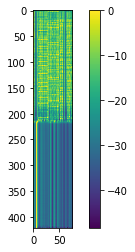

<s>이______________븜__바___르__ 바_______즈___르___드___라__ᆫᆫ_지__   ᅡᅡ____ᆯ_하__ᆯ___시___________________ *__무__로___이_라___ 브___에___ 부____터__ᆫᆼ_알_리__ 마__ᆫ_하__ᄋ으____지_ 구____금______________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

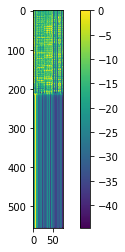

-------------------------------------------------------------------------------------------------------
09-22 11:19:06
09-22 11:21:44
Mean Train Loss: 0.023066438816148168
Train CER: 0.4707552087880292
09-22 11:21:58
Mean Evaluation Loss: 0.023586234945468663
Evaluation CER: 0.4786758776995663


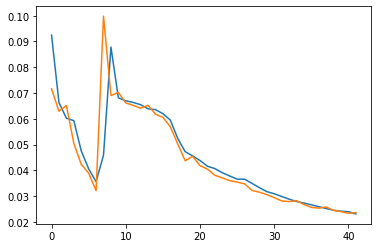

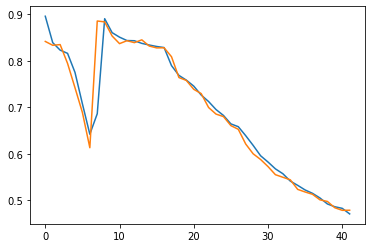

<s>하__________________ᆨᆨᆨ__스___에_____ᆫ  제___ᆼ_뉴___ᆫ 메___ᆷ__버___십ᆸ__새____하__  자_____인_이_  가__능_하___ᆫᆫ_드______________  주_ᆫ_하_ᆫ__자_하__인ᆫ 먿_을_ _을ᆯ   수____________________ 있어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

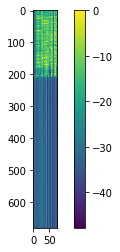

<s>네_________________ᄋ이_______후____  ᄃ____________시___에_____ 메______녀__ᆼᆼ  자__ᆼ__바____조___  자______으________아___요_______________________________________________ 자___마____리_ 마____ᆫ__체___에__약ᆨ__하____려___고_ 하___느_ᆫ__데___ 자_____느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

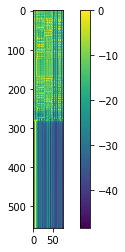

-------------------------------------------------------------------------------------------------------
09-22 11:21:59
09-22 11:24:26
Mean Train Loss: 0.022840364973563378
Train CER: 0.46524502246442073
09-22 11:24:40
Mean Evaluation Loss: 0.02268631040721762
Evaluation CER: 0.46910889794495175


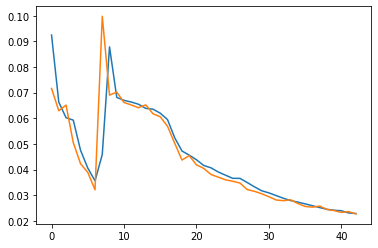

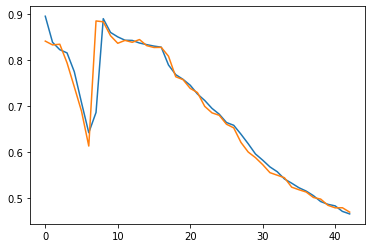

<s>예___________________약ᆨ_하____며_ᆫ_느__ᆫ__데___________  부____타_____에__ _식ᆨ__사__ᄋ____ᅵ__애____애__야_____애__이__대_ᆫ_ 데___자__요__요_______________________________  애___이___지___하__려_ᄋᄋ___가___으______________________될까요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

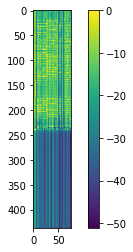

<s>지________________그___ᆷ_ 바___로___  다___ᆫ__체___로_____드__로__가___느_ᆫ_데____ 가___느_ᆼ_ᄒ_______________________________________________  무___________아____ 브_________ 두____처____ᆼ_거___리___가___나____마__________ᆫᆫ__기____  구_ᆷᆼ_그_______________________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

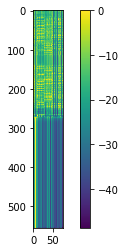

-------------------------------------------------------------------------------------------------------
09-22 11:24:41
09-22 11:27:09
Mean Train Loss: 0.022280726541725703
Train CER: 0.45747404623909305
09-22 11:27:24
Mean Evaluation Loss: 0.022727183428104543
Evaluation CER: 0.4575587857127291


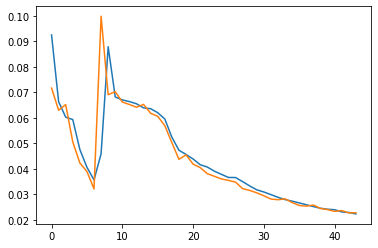

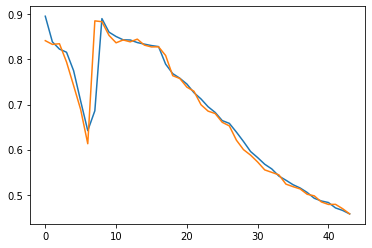

<s>예________________이__약ᆨ__ 조_______ᆼ  하___려___고 하__느_ᆫᆫ_________________데요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>예이약 종 하려고 하는데요.</s>
<s>예약 좀 하려고 하는데요</s>________


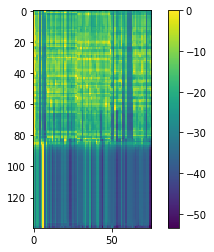

<s>아_______________________오_____느__ᆯᆯ 드___다_ᆯ_ᄋ_ ᄋ아___여___ᄋ___________________  다____으_ᆷ___지_ 오___우__료__에___ 배___아_ᆯ_에___요___고 하_는_자________________________   스__사__ᆼ_ 가___릉_하__메___뉴___는ᆫ_ᄀ구__궈____________ 있ᄌᄌ죠?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

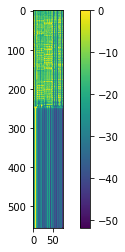

-------------------------------------------------------------------------------------------------------
09-22 11:27:25
09-22 11:29:58
Mean Train Loss: 0.02187925557796531
Train CER: 0.4542496981060934
09-22 11:30:12
Mean Evaluation Loss: 0.021727650070245446
Evaluation CER: 0.4545949833286116


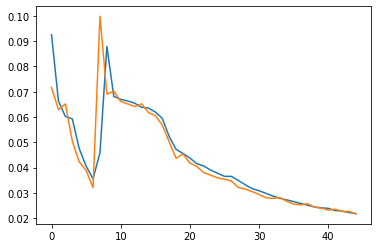

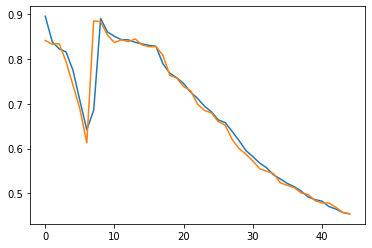

<s>애______________________사_____에____시_____서______ 프________ᆫ__쿠_____포______ᆫ_ 사____료__ᆼ 가_____느________________________인가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>애사에시서 픈쿠폰 사룡 가느인가요?</s>
<s>인터넷에서 산 쿠폰 사용가능한가요</s>______


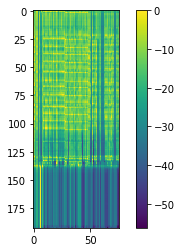

<s>내_____________________________________________ 미____버___ᆫ_에________________ 무____우_____ᄉ*_____메____뉴___로_____*ᅧ___ᆼᆼ_마____이____ᄉ___ᅦ 이__끄__ 바___으___ 배___느_____ 저___ᅡᅡ_르__ᆫ__버__ᄋ__ 거____ᆻ느__ᆫ__데___________________________  호__ᆨᆨ__시________________으____주___시___게_____________________하_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

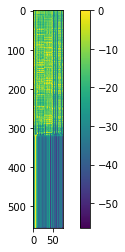

-------------------------------------------------------------------------------------------------------
09-22 11:30:13
09-22 11:32:51
Mean Train Loss: 0.02151522394153231
Train CER: 0.4482898330348836
09-22 11:33:06
Mean Evaluation Loss: 0.022628039964529768
Evaluation CER: 0.4545513979994334


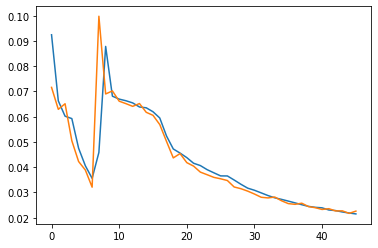

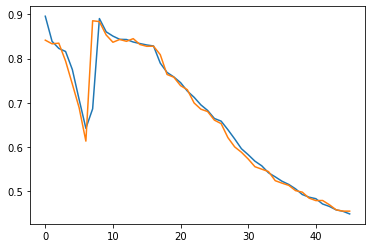

<s>더__________________ᆫ__치____세_____트_ᆫ 모_______*ᅧ____며________ᆫ__  브_레ᅦ___크_ 타___이__ᆷ_즈___앨___가__여___엘_ 가____가_ᇀᇀ_으____ᆫ_데______________________________________ 브___이_ᄏ___타___이__이___________________ 있어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

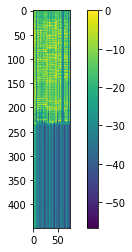

<s>아______________ᆫ_기__ _주___차____레_____이_  자___ᆯ_으___대____서________________________ _갈_레____파____키_______ᆼ__기__니___고___포__로__ 가____고__시_으___ᆫ_데________________________  거_____긴__지__저__ᆫ_므_______ᆫ____  바___리__ 파___키___ᆼ__ᆼ_ _구__ᄌ_ᅮ___ᄉ_________________________________ᅵ_나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

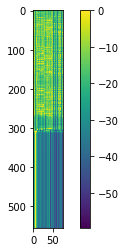

-------------------------------------------------------------------------------------------------------
09-22 11:33:06
09-22 11:35:36
Mean Train Loss: 0.021135783138218362
Train CER: 0.4413154360371385
09-22 11:35:50
Mean Evaluation Loss: 0.02133568093762838
Evaluation CER: 0.4453331008782444


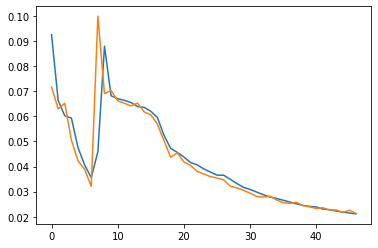

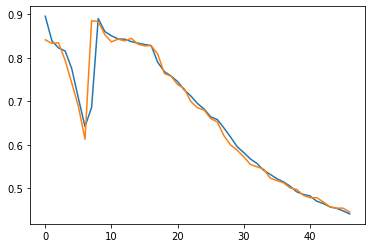

<s>새___________________이__ᆯ_도____포__ᆯ__류__ᆫ_므_ᆫ_나___골__이___수___ᅧ__________________서요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>새일도폴륜믄나골이수ᅧ서요?</s>
<s>제일 높은 분좀 바꿔주시겠어요?</s>__________


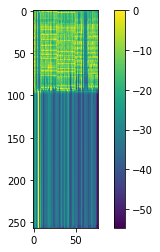

<s>저_________________가__에__ 사___ᄅ__가__도___ᆼ _븐_ 뎌___하__ᆻ느_ᆫ__데______________  이___따__ᄅ__ 가___ᅳᆫ  자___리_ᄋ__ᆼ_ 도_____ᆼ_글_어_ ____며__여_ᆯᆯ 수________ᄋ_______________________________________________________세요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

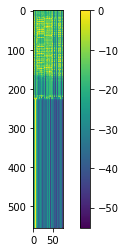

-------------------------------------------------------------------------------------------------------
09-22 11:35:51
09-22 11:38:19
Mean Train Loss: 0.020966225599014215
Train CER: 0.43695962747999517
09-22 11:38:35
Mean Evaluation Loss: 0.021508827752617195
Evaluation CER: 0.4426526031337852


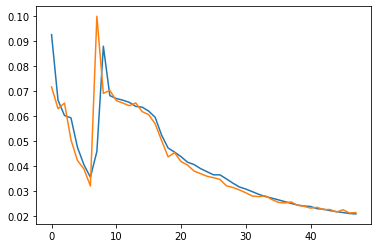

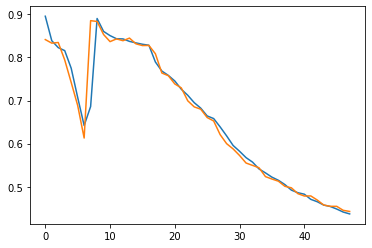

<s>내__________________자_ᆼᆼ_예___아_____기___  저__ᆫ_여_ᆨ_으_ᆯ__자____와__하___ᆼ__겨ᅧ ___ᆫᆫ__제__ __스____ᆻ_느__ᆫ_  자_ᆯ_이___느_______ᆫᆫ____  이___나_ᆫ_ 저__ᆼ 어____ _시__여_ᆨ_이___ _가___느_______________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

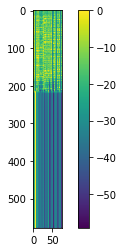

<s>러_________________ᆼ__바____이__ᆫ__데____________해_____사____오_ 프__ᆫ_고_____ᅵ_ᆫ__나_____요_____________________________________ 으__레_____ᅳ_ 바___르____테___ 이_ᆷᆻ_사__하_이_ᆻ_나____요____________________________________________  조____ᆫ__체______으__ᆫ__ᅦᅦ___이__ _하___믄_엔___사____가_________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

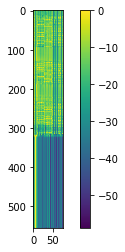

-------------------------------------------------------------------------------------------------------
09-22 11:38:35
09-22 11:41:07
Mean Train Loss: 0.020994904966228963
Train CER: 0.4384583516542169
09-22 11:41:21
Mean Evaluation Loss: 0.020943708558663215
Evaluation CER: 0.44263081046919606


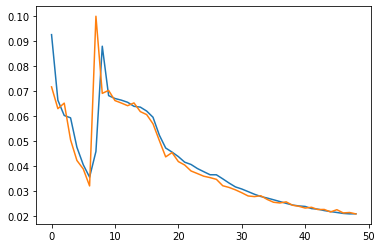

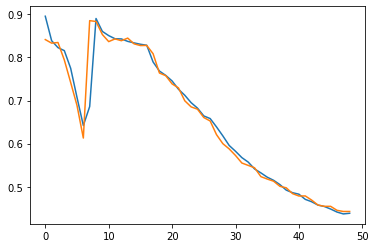

<s>주________________송_하____ᆫ__데________________  *ᅧ_____버___시_ᆸᆸᆸ_ _ 하____드_________ ***_ᆫ__ᄉᄉ___에__ᆻ_느__ᆫ__데______________________  주____이___ᆫ__고____로________  며___ᆷ__버____ᄉ__ᆸᆸᆸᆸ__부__ᆫ_오____ 두__으_____  가___능_하__ᆫ__________________지요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

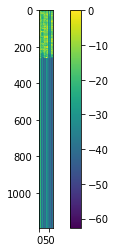

<s>아_______________웃ᆺ_백ᆨ_ 가_____타__ 가__ 여___ᅡ__하_ᆫ__가___려___고_____도_____에____메___ᆻᆻ느__ᆫᆫ_데__________________________  그_____처__ᄋ__ 도___로___으__이___느________ᆫ________________________  모____지_____치____주___아___에__  가__우___수_________________이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

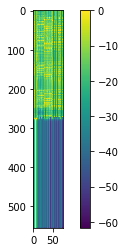

-------------------------------------------------------------------------------------------------------
09-22 11:41:21
09-22 11:43:59
Mean Train Loss: 0.020315240197176995
Train CER: 0.4269484967859199
09-22 11:44:13
Mean Evaluation Loss: 0.021188260004900365
Evaluation CER: 0.4299474796783403


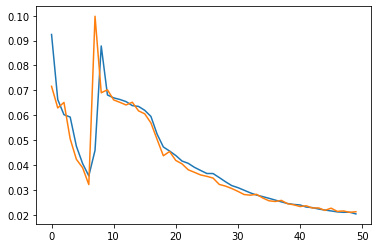

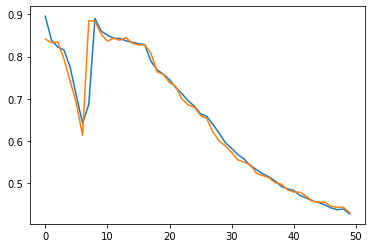

<s>아____________________ᆼ__며_ᆼ_ᄒ하___세____ᄋ요______  제___ 하____이__ 바___ᆫ_ 주_____포____에___ 세____ᄋ예__야_ᆨᆨ_하___흐___녀___ᆫ_데_____요________________ _ ________  예____야_ᆨᆨ___사____ᅡ____으_ 벼____ᆫ__져_ᆼᆼ__하____ᅧ_________________________________구요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>앙명하세요 제 하이 반 주포에 세예약하흐년데요   예약사ᅡ으 변졍하ᅧ구요.</s>
<s>

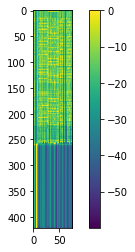

<s>아________________기____구____차___르______ᆼ_  자_____으___게____사________________________  아__레____파____키_______ᆼ _ᅵ_ᆼ_이__ 고___드__러__ 가___고__ 싶으__이__데_______________________  거_____이_ _지__저____으_______ᆫᆫ___  바___르__ 파_ᇀ__킹ᆼᆼ_ᆼ_ _수____ᄌ____________________________________이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

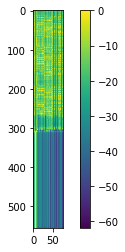

-------------------------------------------------------------------------------------------------------
09-22 11:44:14
09-22 11:46:41
Mean Train Loss: 0.020013361593930922
Train CER: 0.42365000152456067
09-22 11:46:56
Mean Evaluation Loss: 0.020712540092992268
Evaluation CER: 0.4395798374267222


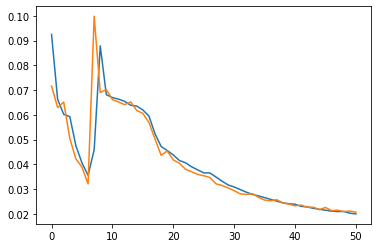

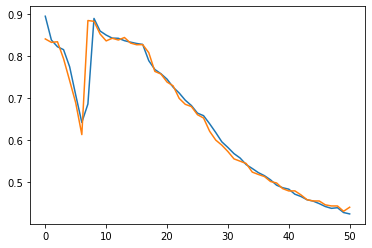

<s>오______________ᅳ__ᆫ__사____시____  가_____지___고_____사_______서____________________수__ᆫ__자________*ᅡ_____ᆫ__ᅮ___차_____며___ᆫ__시___가_____고____시_ᇁᇁ_ᇁ_으___ᆫᆫ_데_______________________  거_____므_____시___가__ᆫ__데_____가______ᆯ_여______ᆫ____________________________ 어_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>오ᅳᆫ사시 가지고사서순자*ᅡᆫᅮ차면시가고싶ᇁ은데 거므시간데갈연 었나요?</s>
<s>자동차를 가지고 가서 혼잡한 시간은 피하고 싶은데 어느시간대가 여유롭나요?</s>__________


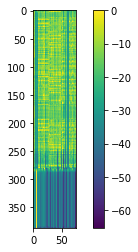

<s>네_______________이__오______후____  **___________시___에___ᆫ  ᄆ*_____며___ᆼᆼ  자__ᆼ__거____치___  자______리_______나____요_______________________________________________ *ᅡ___마____ᄅ_ᆯ 마____ᆫ__체_____예ᅣᅣᆨᆨ ᄒ하____려___고_ ᄒ하__느_ᆫ__데__  가_____느__________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

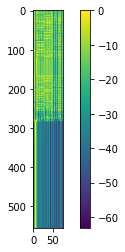

-------------------------------------------------------------------------------------------------------
09-22 11:46:56
09-22 11:49:25
Mean Train Loss: 0.019695605020774103
Train CER: 0.41702533701477995
09-22 11:49:40
Mean Evaluation Loss: 0.020305842358262983
Evaluation CER: 0.42665678732538626


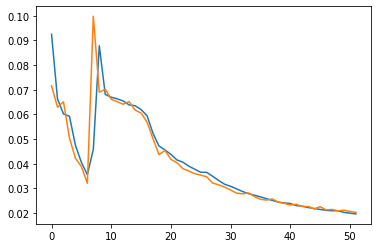

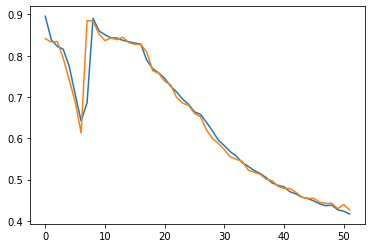

<s>새_______________다_ᆼ_할일 _카___토___르__소___매___도__어___ᅳᆫᆫ_데____________________ 어__ᆫ_제___까___지__지_  수_있느_ᆫ 지 하ᅡᆯ 수_ ____이____________ᆻᆻ을ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

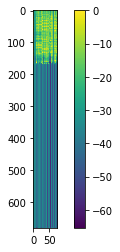

<s>아______________________ 오_____느__ᆯ_ 드___다___려___ᅡ__니___ᄋ____________________  다____으_ᆷ___주___ᅩ___ᄋ___로__에____배___아_ᆯ_에___여___고 하_는_다________________________   대__다__ᆼ__가___르__한 메___뉴___느_ᆫ  구__가____________ 이_ᆻᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

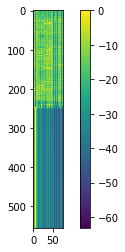

-------------------------------------------------------------------------------------------------------
09-22 11:49:41
09-22 11:52:12
Mean Train Loss: 0.01945031022524697
Train CER: 0.41663380743899
09-22 11:52:25
Mean Evaluation Loss: 0.02012790848072679
Evaluation CER: 0.4250005448166147


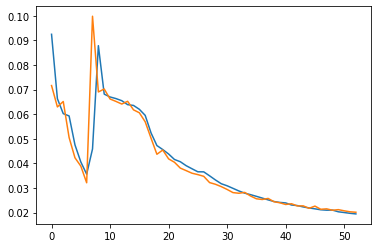

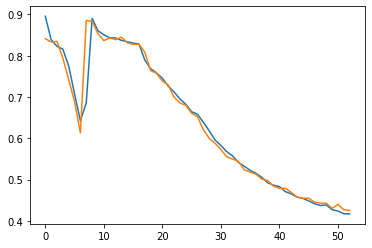

<s>네__________________ᄋ____________________ 흐ᅳ_______코________드_____________ 허______시___트___토___ 가___오____수_____에_____푸_____*ᅳ____게___리___ 수_____서____하___고_______________ 시_____부__이____ *ᅡ___이___부___ 두____기__러___가___으_ᆯ  수______________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네ᄋ 흐코드 허시트토 가오수에푸*ᅳ게리 수서하고 시부이 *ᅡ이부 두기러가을 수 있나요?</s>
<s>네. 그 골드 코스트 코코넛 쉬림프 *개를 취소하고 기브미 파이브 *개로 바꿀 수 있나요?</s>_____


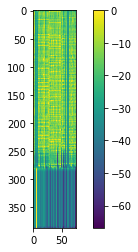

<s>오__________________기___  ᄒ하__ᆨ_으______이_____아________ 시_ᆨ___사____하_  하___느__하____사____ᅭᅭ_______________________________________________  더____ᆫ__츠___해_ᆯ 거____소___시_ᆨ_____사___하_료___느__ᆫᆫ_데_______________________________  예___야ᅣ_ᆨᆨ_ 아____혀___ 고__ _가___디__________________되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

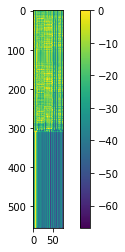

-------------------------------------------------------------------------------------------------------
09-22 11:52:26
09-22 11:55:04
Mean Train Loss: 0.019088668040988917
Train CER: 0.40968263932831284
09-22 11:55:18
Mean Evaluation Loss: 0.020083493942433292
Evaluation CER: 0.42051125591126026


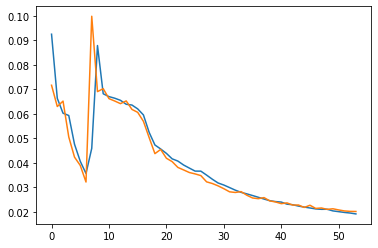

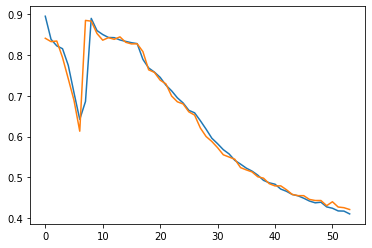

<s>배______________ᆯ__가___에_______  자____ᆼ_무___하___느___레_____________________________  고__ᆫ_메___ᄋ__ _카___드_ 다_ 어__ᆻ_느_ᆫᆫ__데__________  고__어___________ᅮ_  주_____ᅮᆫ_애____메___모____ 파___흐___고__ 마_______________________ᅩ_어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

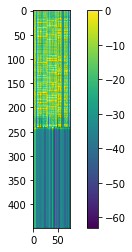

<s>아______________ᄋ웃ᆺ_백ᆨ__가_____아_  할_여___아_하__ᆫ__가___려___고_____포_____헤____메____ᆻ느__ᆫᆫ_데__________________________  그_____처__우_ 포___어___에__지__느__________________________________  오____지_____치____저___으__아_ᄋᆯ_ 바__을  수_________________ 있나요ᅭ??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

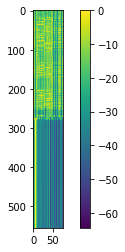

-------------------------------------------------------------------------------------------------------
09-22 11:55:19
09-22 11:57:46
Mean Train Loss: 0.018850822398157014
Train CER: 0.4042062776594001
09-22 11:58:00
Mean Evaluation Loss: 0.020119231929795922
Evaluation CER: 0.41593479634754943


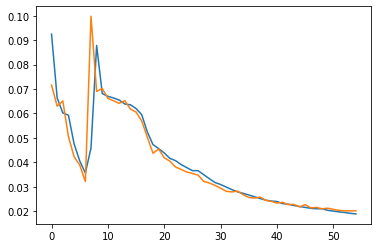

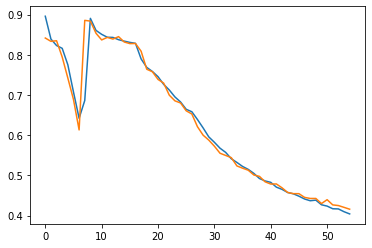

<s>예___________________예약__하____려___도_  ᄒ하_ᆯᆯ우  수____________________ 있어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

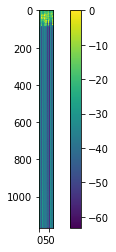

<s>아___________________니___다_____________________  그__러__ᆫ__기_ ᄋ___ 대___있_매____ᆼ_도_____ 주___마_ 주__ᆷ__마__ᅡ__시___읐_네__다______________________________  그_____머___세___라___ 수___차___ 바____머_ᆯ_ 서__아_ᄒᆯᆯ__________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

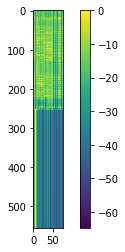

-------------------------------------------------------------------------------------------------------
09-22 11:58:01
09-22 12:00:27
Mean Train Loss: 0.01872341890791829
Train CER: 0.4018666598757258
09-22 12:00:43
Mean Evaluation Loss: 0.019795089586178427
Evaluation CER: 0.42436855754353087


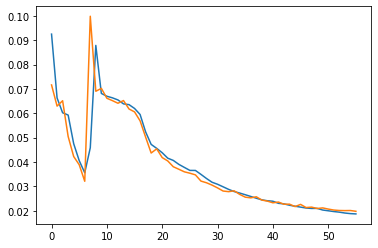

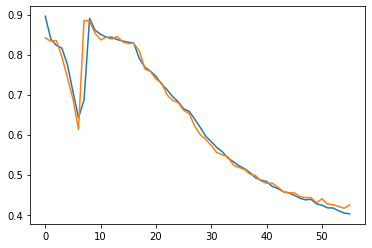

<s>다_________________인_ 애___느__  시___뮨__하___드_ 토__ᆼ_이__르_ 알ᆯ_리__ᄌ주_______________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>다인 애느 시뮨하드 통이르 알리주세요.</s>
<s>할인되는 신용카드 종류를 알려주세요.</s>__


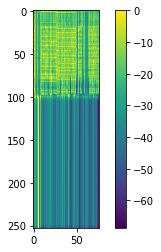

<s>저__________________버_____에___ 자______리__가__ 조____구_ᆫ_으____ 파___ᆫ_해__ᆻᆻ느__ᆫ__데___________________ _따___가___  가____며___ᄒ____ᆫᆫ  자____리ᅵ__ 조____ᆼ_ 조_________ᆫ__데__료________________________ 아____ᆫ__느__ᄒ____주___시_ᆯᆯ__수__이__지____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

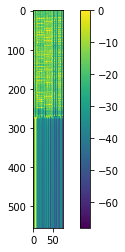

-------------------------------------------------------------------------------------------------------
09-22 12:00:43
09-22 12:03:16
Mean Train Loss: 0.018373266800056864
Train CER: 0.4000539087670404
09-22 12:03:29
Mean Evaluation Loss: 0.0195610820562558
Evaluation CER: 0.4181794408002266


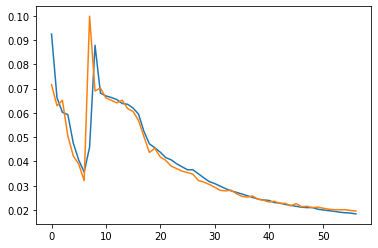

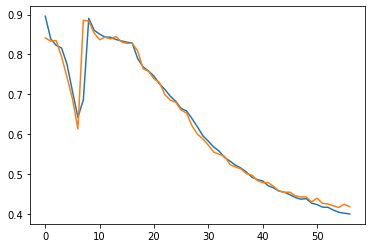

<s>이__________________ᆫ_어__ᆫ__주_ 가____ᆯ_ 여_______며_________자____느_ᆫ__데_______  예__ᄋ약ᆨᆨ  가____느________________________ᆼᆼ할까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>인언주 갈 여며자는데 예약 가능할까요?</s>
<s>인원수가 **명이상인데 예약 가능할까요?</s>


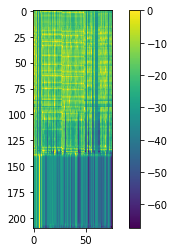

<s>아_______________웃ᆺ_백ᆨ_ 가_____아____ᅡᅡ__여__아__하_ᆫ__가___려__ 고_____퍼_____에____뫼___ᆻᆻ느__ᆫᆫ_데__________________________  그__ᇂ__츠__ᄋ__ 두___요___에__지___느_________________________________  오____시_____지____주___우__아__ᆯ_ 가__흘  수_________________ 있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

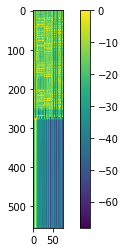

-------------------------------------------------------------------------------------------------------
09-22 12:03:30
09-22 12:06:09
Mean Train Loss: 0.0181166097788858
Train CER: 0.39564604790537994
09-22 12:06:23
Mean Evaluation Loss: 0.019767409393050047
Evaluation CER: 0.40852529038725566


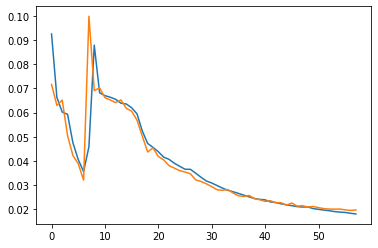

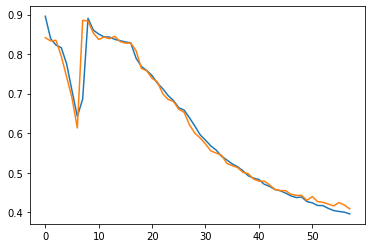

<s>오_________________ᆫ_늘  서___ᅦ__ᄋ이_ 가___어__ᆻ느_ᆫ__데__요________________________  하____시___ 가____므__제__가___당_아__ᆻ_나___요__________________________________ 고____ᅡ__마___ᆫ__뎨__가__ 가___로_______________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>온늘 서ᅦ이 가었는데요 하시 가므제가당았나요 고ᅡ만뎨가 가로 있나요?</s>
<s>오늘 저녁에 갔었는데요 혹시 검은색 가방 없나요? 보관하는데가 따로 있나요?</s>___________________


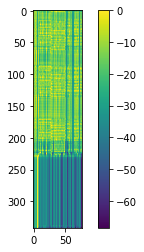

<s>아___________________니__자______________________  그__러_____치______ 디__이___애______도______지__가__ 주_____가__ᅩ__싶ᇁ_으__니__다______________________________  그__ᅵ__고___시___가___ 시___차___ 바____무_ᆫ_ 시__가_ᄋᆯᆯ__________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

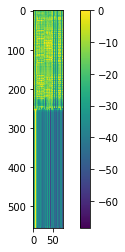

-------------------------------------------------------------------------------------------------------
09-22 12:06:24
09-22 12:08:52
Mean Train Loss: 0.017809284545964692
Train CER: 0.3899007486489445
09-22 12:09:06
Mean Evaluation Loss: 0.01945265231217734
Evaluation CER: 0.410791727504522


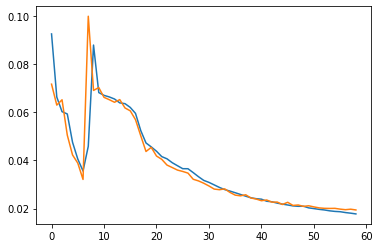

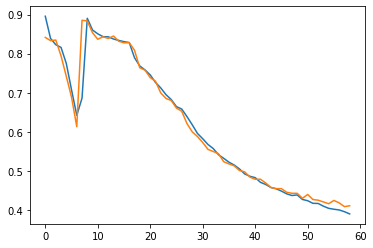

<s>이___________________ᄐ_______도__________ 도______ᆫ__초______ᆫ__도__________ᆼ  트____이___나______바__________트______________________________________  아______ᅡ____이_ᆫ__다___________________프__ᆫ_마___ᆼ__푸____다__ᆯ_이___ᄋ__ᆼ_구_ 드________사____드__러___가__ᄋ어________________________________________________________________________해요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>이ᄐ도 돈촌동 트이나바트 아ᅡ인다픈망푸달이ᄋᆼ구 드사드러가어해요?</s>
<s>수지구 동천동 풍림아파트..아 아니다. 그냥 포장해 놓고 제가 찾으러 갈께요.</s>___________


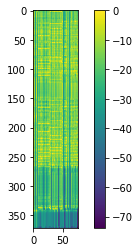

<s>오__________________시_____ᄋ야__ᆨ_으_______ᄋ_____ᄋ야_______  식ᆨ__사_______  가___느__하ᅡᆫ__가____요_______________________________________________  거____ᆼ__츠___해ᅢᆯ _가_____ᅩ____ᅵᆨ_____서____하_ᄅ___느__ᆫᆫ_데_______________________________   예__ᄋ야ᅣᆨᆨ_아_____햐_____고_ 고하__드___________________ᅳ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

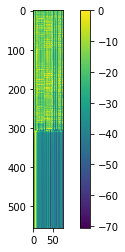

-------------------------------------------------------------------------------------------------------
09-22 12:09:07
09-22 12:11:36
Mean Train Loss: 0.017441280587943222
Train CER: 0.38239826347826533
09-22 12:11:51
Mean Evaluation Loss: 0.018980941044011643
Evaluation CER: 0.4037309041776538


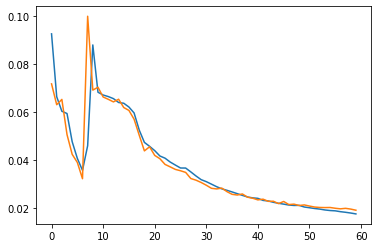

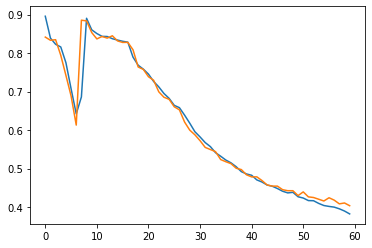

<s>애_____________ᆫ_녀___하_ᆫ__카____드__ᄅ__ 너___ᆫ_제____모___ᄋ_______ 메______가_____쿠____포__를_가___나__ᆻ스____ᆫ__다___________________  머__ᆫ_데___따___지__타_______ᅩᆯ 주_____ 시__________________________ 있나요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>앤녀한카드ᄅ 넌제모ᄋ 메가쿠포를가났슨다 먼데따지타ᅩᆯ 주 시 있나요?</s>
<s>부메랑 카드를 만들고 웰컴 쿠폰을 받았습니다. 언제까지 사용할 수 있나요?</s>________


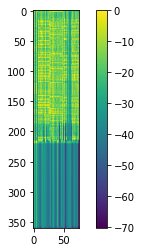

<s>네____________________________________________  미____버___ᆫ_에________________  미____어_____시____메____뉴___로___ _며____ᆼ_마____이______세__이__그__ 가___으____메___뉴_____ 소____ᅡ__라_ᆫ__러__오_ 가_____느_ᆫᆫ__데___________________________  호__ᆨᆨ__시_________ 이_______ᆫ__주___시___게_____________________아_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

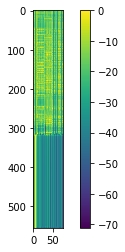

-------------------------------------------------------------------------------------------------------
09-22 12:11:52
09-22 12:14:23
Mean Train Loss: 0.017344311965257216
Train CER: 0.38522606697658796
09-22 12:14:37
Mean Evaluation Loss: 0.019998947955900025
Evaluation CER: 0.410791727504522


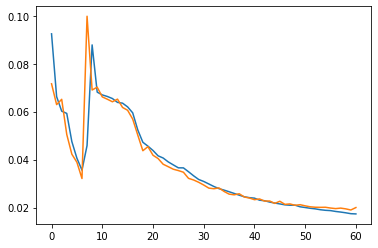

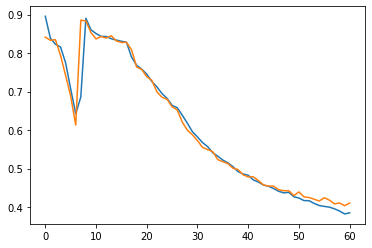

<s>배__________________가___에_______  가___ᆼᆼ_문__하___는__데______________________________  고____먀____ᆼ  카___드_ _가_ 어___느__ᆫ__데__________  가_____ᄋ___________  고____ᄅ_ᆫ__여_ᆼ_으_ᆯ_ 고____쳐__ᆫ_으__고____가_______________________ᆻ어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

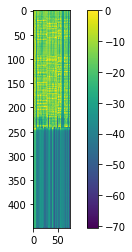

<s>내___________________오______후___   **___________시__에_____  며______녀__ᆼᆼ  자__ᆼ__가____쪼___  자______이___ᅵ___나____요_______________________________________________ _*ᅡᆯ_마__ᄒ_르_ _바___ᆫ__체__예__ᄋ야_ᆨ  하____녀___고  ᄒ하_ᄂ느_ᆫᆫ_데__  ᄀ가____느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

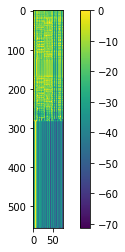

-------------------------------------------------------------------------------------------------------
09-22 12:14:38
09-22 12:17:17
Mean Train Loss: 0.017323420768324778
Train CER: 0.3850917544640649
09-22 12:17:31
Mean Evaluation Loss: 0.019332618392766714
Evaluation CER: 0.40394883082354477


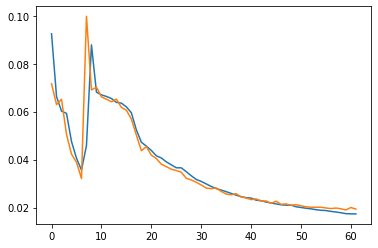

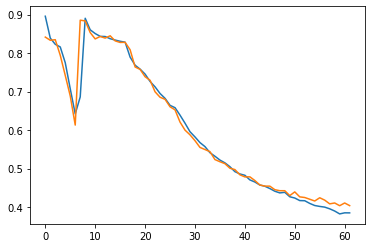

<s>새___________________________________떠________ᅮ__늘ᆯ_ 파____저___이__햐___데__야________  다_____ᆫ__추____무__으_엘_ 해___다__에___요____바 하___디__다__________________________________  아___ᄃ____  가__능ᆼ_하_ᆫ 메____뉴__그__  뭐__가___________________________ 있어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

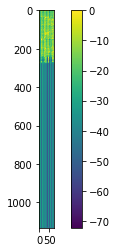

<s>에_______________ᄋ이_오______후___   **__________시____에____  ᄆ*_____며___ᆼ_  자__ᆼ__가____조_ᆨ_  자______이_ᆻᆻᆻ____나___요_______________________________________________ *ᅡ___마____리_ 마____ᆫ__체_____ᄋᄋ약ᆨ 하_____려___고_ ᄒ하_ᄂ느_ᆫ__데__  가_____느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

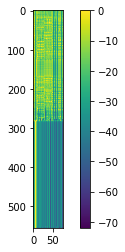

-------------------------------------------------------------------------------------------------------
09-22 12:17:32
09-22 12:20:00
Mean Train Loss: 0.017164812834306188
Train CER: 0.3785935720450866
09-22 12:20:15
Mean Evaluation Loss: 0.01910126399425019
Evaluation CER: 0.39965567589949225


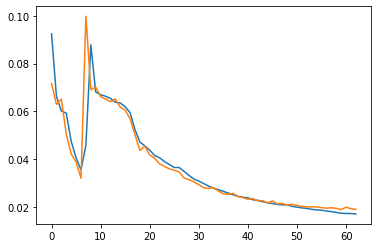

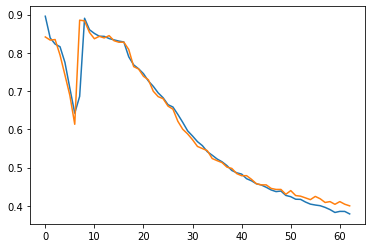

<s>가_______________마______니_____ᅵ___ 뎌____려___ᆼᆼ__지___여__ᆷ_에___ _쪼___가__하ᅡ__요___오    예__야_ᆨᆨ__하____ᆻᆻ느__ᆫ__데________________________________  혹ᆨᆨ_시_____ 예_아__ᄋ우_ᆺ_배ᅢᆨᆨ_이____버__ __ 어____떠__ᆫᆫ__터___비____브__르___ᅢ__해___ᄉ____________________ᅵ_나요ᅭ?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>가마니ᅵ 뎌령지염에 쪼가하요오 예약핬는데 혹시 예아웃백이버  어떤터비브르ᅢ해시나요?</s>
<s>부모님 결혼기념일 축하하려고 예ᄋ

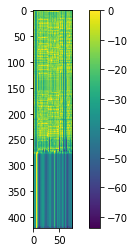

<s>아______________ᄋ웃ᆺ_백ᆨᆨ_하_____때___하ᅡ__여__아_라__ᆫᆫ_가___료__ 고__ᆺ__포_____해____대____ᆻ느__ᆫᆫ_데__________________________  그_____처_____ 도___료___으__이__느________ᆫᆫ________________________  오____시____ 지____저___우__아_이_ 바__흘  수__________________있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

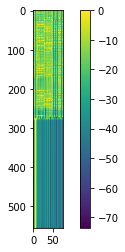

-------------------------------------------------------------------------------------------------------
09-22 12:20:15
09-22 12:22:42
Mean Train Loss: 0.01693803229207591
Train CER: 0.3774248773507768
09-22 12:22:58
Mean Evaluation Loss: 0.018438774523560526
Evaluation CER: 0.3933793884978316


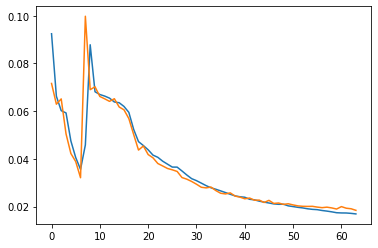

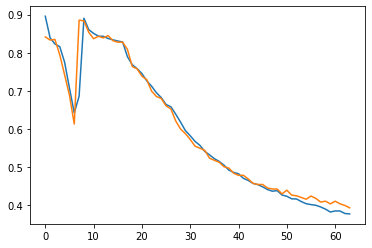

<s>아_________________ᅡᅡ____느__요____________________________________ 이__요______군_애____에___서_______ 재___가__하___앨ᆫ_마_ᆫ_을ᆯ_ 수__이_ᆻᆻ느_ᆫ  그___이__ᅵ__이___ᄋ___ᄋ__ᆯᆯ_마ᅡ_ᆫ___지__ 구___ᆼ_금___________________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

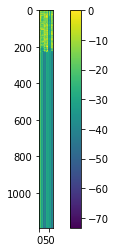

<s>아_____________________ _모_____느__ᆯ_ 브__다__ᆯ_려__아____녜__ᄋ____________________ 다___ᄋ으_ᆷ___주_ 오___우__르___으__ 배___다_ᆯ_에___여ᅭᆼ_고 하_느__다________________________  _대__다__ᆯ_ 가___ᅳᅳ_ᄒ하__메___뉴___느_ᆫ  궈__뭐_________________있ᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

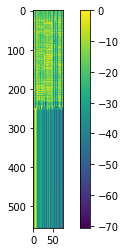

-------------------------------------------------------------------------------------------------------
09-22 12:22:59
09-22 12:25:31
Mean Train Loss: 0.016791996673587613
Train CER: 0.37538484987044657
09-22 12:25:45
Mean Evaluation Loss: 0.01867369598354029
Evaluation CER: 0.3926602305663914


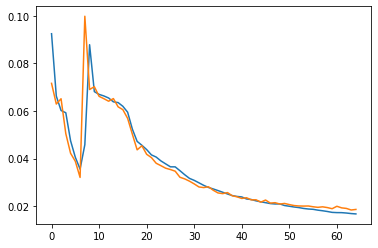

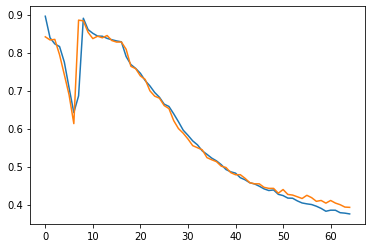

<s>ᄒ___________________________*ᅵ___어____ᆯ_매_ᆫᆫ_서___르_____고___이___트__가__ 나_____마__ᆯᅵᆻᆻ서___ᆫ_나__ᆼ _바__ᆼ으_ᆫ_과__ᆼ_가_ᆫ__나__요___________________________ _아____지___ᅡᆯ_예_야_ᆯᆯ ᄉ수 ᄋ____시_____________ᆻ을까요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

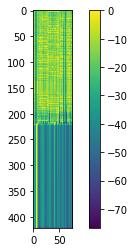

<s>지________________그___ᆷ_ 바___로___  다___ᆫ__체___로_____드_러_ᆷ_가___느_ᆫ_데____ 가___느_ᆼ_하__ᆫ___티_______________________________________ 무___________라_____부_______ᆯ_ 푸____저______재___르___가___나__ᆼ_마________ᅳ_ᆫ___기____ _구__ᆼ_금______________________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

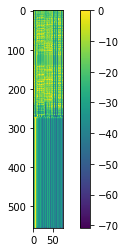

-------------------------------------------------------------------------------------------------------
09-22 12:25:46
09-22 12:28:24
Mean Train Loss: 0.016337717887275876
Train CER: 0.366763625576034
09-22 12:28:38
Mean Evaluation Loss: 0.019232718993377772
Evaluation CER: 0.39680083683832024


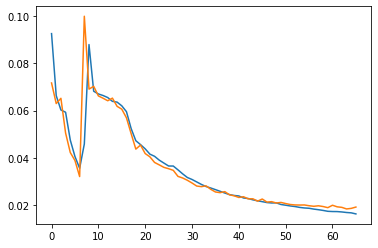

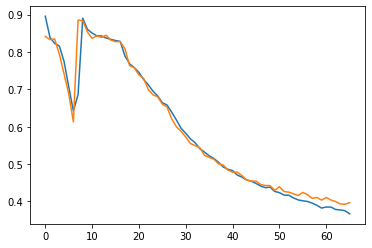

<s>으______________ᄅ___포____드___ _시___으__오__ᄋ__가____아__ 자__아__은_이_______________________________  서__가___가___ᅡᆫ 기__ᆯ__과____________   구_ᆯ_려___ᆫ_메______ 저___리__머_ᆫᆫ__주___문_은__하___________________ᄋᄋ요._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

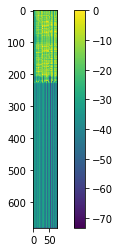

<s>오__________________시___  야ᅣ__ᆨ__ᅳᅳ_____에___ᄋ__ᄋ________  식ᆨ__사______   가___능_하_ᆫᆫ__가___요_______________________________________________  저____ᆫ__츠___메___과_____서__ 식ᆨ___사__ 하_ᄅ려___느__ᆫᆫ_데_______________________________  예___ᄋ야_ᆨᆨ  아____하____ 고_  가___도_________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

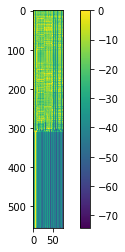

-------------------------------------------------------------------------------------------------------
09-22 12:28:39
09-22 12:31:07
Mean Train Loss: 0.016357557045347887
Train CER: 0.36792541646628957
09-22 12:31:22
Mean Evaluation Loss: 0.018410674249203278
Evaluation CER: 0.3939895831063264


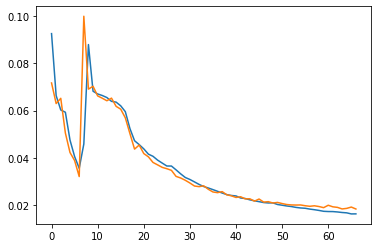

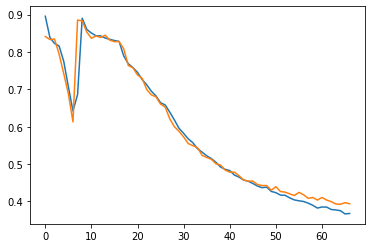

<s>ᄋ____________________________________________ᅡ__이__며___  이__사___ᆫ_이_  가__ᆯ__꺼____ᆫ__데_________ ____로__ᆨ_ᄋ__ 예____야_ᆨ_이__  가____느_______________________ᆼᆼ할까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아이며 이산이 갈껀데 록ᄋ 예약이 가능할까요?</s>
<s>**명이상이 갈껀데 룸예약이 가능할까요?</s>


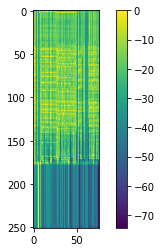

<s>지______________금ᆷ 바___르__ 다____ᆼ__츠___르___드___가__ᆫᆫ_지___ 가____ᅳ___하_ᆯᆯ__세___________________ ____ᅮᆫ_루__ 이__가__ 크___대_ᆯ_ 쿠____타__ᆼ__가__려_ᆯ 바__ᆫ_하____는ᆫ_지_ 구___ᆼ_금_____________합니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

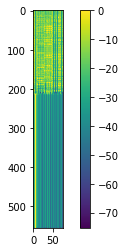

-------------------------------------------------------------------------------------------------------
09-22 12:31:23
09-22 12:33:51
Mean Train Loss: 0.016261181224543033
Train CER: 0.3663606518905489
09-22 12:34:07
Mean Evaluation Loss: 0.01865956374485572
Evaluation CER: 0.39255126724344586


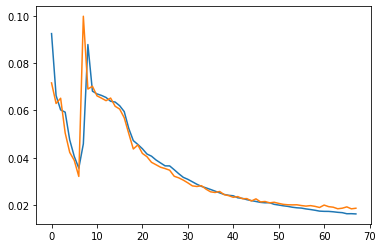

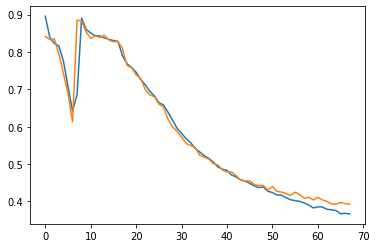

<s>수______________________________________ᆼ__일ᆯ_이_____느___며___ᆾᆾ___시___에ᅦ_   마______드__ᆷ__________________해요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

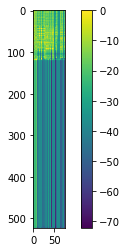

<s>지______________금ᆷ_바___로__ 다____ᆫ__체___르___드___러__ᆫᆫ_지__  가_______하__ᆯᆯ__시___________________  ______로___이__가___크___데____코____토__ᆼᆼ_다__려___나__ᆫ_가____는ᆫ_기_ 구___ᆼ_금_____________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

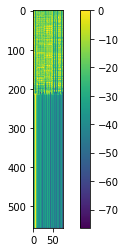

-------------------------------------------------------------------------------------------------------
09-22 12:34:07
09-22 12:36:40
Mean Train Loss: 0.01599045760452402
Train CER: 0.363729027786272
09-22 12:36:54
Mean Evaluation Loss: 0.018307745002567506
Evaluation CER: 0.3866454551397999


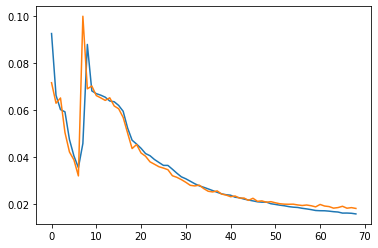

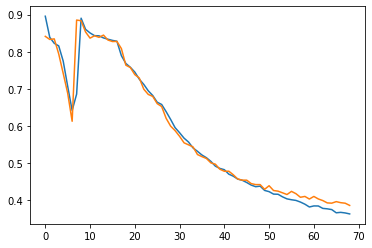

<s>호__________ᆨᆨ__시_____  주____무_ᆫ_하___  메____뉴___드__ᆯᆯ__ 포__ᆫ__잘ᆯ_하_ᆯᆯᆯ 수____________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>혹시 주문하 메뉴들 폰잘할 수 있나요?</s>
<s>혹시 주문한 메뉴들 포장할수있나요?</s>_____


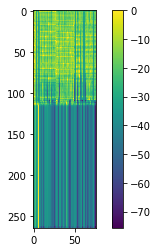

<s>아_______________웃ᆺ_백ᆨ  가_____까__ 하__여___한_하_ᆫᆫ_가___여__ 고__ᆺ___퍼__ᆫ_이____느__ᄒ_ᆻᄂ느_ᆫᆫ_데__________________________  그_____처__ᄋ__ _두__요_ᆫ_느__지___느________ᆫᆫ_______________________  오____시____ 치____저___으__아_이_ 받_늘  수__________________인나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

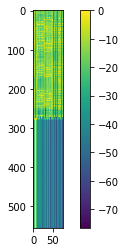

-------------------------------------------------------------------------------------------------------
09-22 12:36:54
09-22 12:39:32
Mean Train Loss: 0.01593483987797635
Train CER: 0.3601095218100767
09-22 12:39:47
Mean Evaluation Loss: 0.018339902344768955
Evaluation CER: 0.3871466864253492


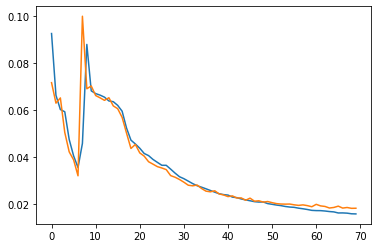

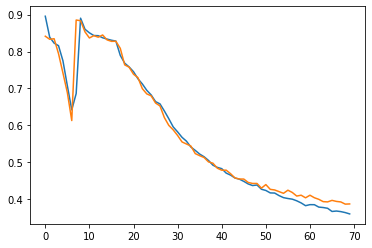

<s>거_________________ᆫ__마_____ᅵᆫ_이___아_______________ 그__서_______며_________ᆼ____시__아_____ᆫ_으____ᆯ ᄉ식___사___ᆯ__저_____ᄋ여___ᅣᆨᆨ_ 보_____ _푸____ᆫ__디_ 서___ᆼ_히___이__  가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>건마ᅵᆫ이아 그서명시안을 식살저여ᅣᆨ 보 푼디 성히이 가능한가요?</s>
<s>감사합니다. 그러면 ᄌ

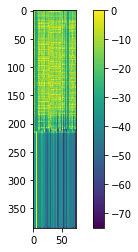

<s>저__________________머___ᆼ_에___ 자______리__가__  조___모_ᆼ_으__ᆯᆯ__차____해__ᆻᆻᄂ느_ᆫ__데____________________ 바___다___  가____며_ᆼ_______ᆫ_ 자____이ᅵ__ 조____ᆼ_ _조___ᄋ____ᆫ__드___ᅭᅭ_______________________  아___ᆫᆫ_느__하___주___시_ᆯᆯ__수_  ___즈____________________세요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

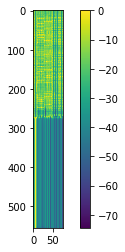

-------------------------------------------------------------------------------------------------------
09-22 12:39:47
09-22 12:42:16
Mean Train Loss: 0.01579978157368021
Train CER: 0.35994336662457427
09-22 12:42:30
Mean Evaluation Loss: 0.018164115940967916
Evaluation CER: 0.3852289319415085


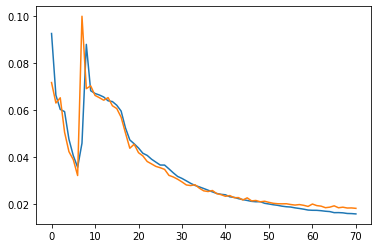

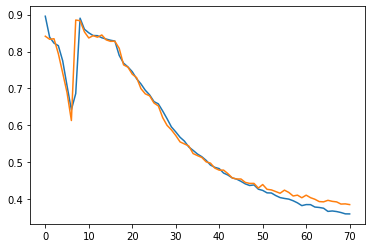

<s>저__________________ᅮ___에__  고_ᆼ_문_애___대__ᆻᆻ느_ᆫ__데_______________________________   _ᅡᅡ__ᆫ_무____우_ _시__가___브_____거_____ᆫ_머____ᆸ_거__디____요________________________________________  포__임_에___으__에__시_에_________________ᆻ어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>저ᅮ에 공문애댔는데 ᅡᆫ무우 시가브건멉거디요 포임에으에시엤어요?</s>
<s>저 어제 방문했었는데 아무래도 지갑을 놓고간 것 같거든요. 확인좀 해주시겠어요?</s>


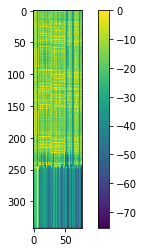

<s>아_______________웃ᆺ_백ᆨᆨ 가_____따___ 하__여__안하__ᆫᆫ_가___려__ 고__ᆺ__푸_____으____뫼_ 있느__ᆫᆫ_데__________________________  그_____츠__ᄋ__ _보__료_ᆫ_느__시__느________ᆫᆫᆫᆫ_____________________   모____지___  지____주___무__아_ᄋᆯ_ 받_늘ᆯ 수_________________ 있나요????</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

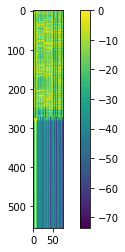

-------------------------------------------------------------------------------------------------------
09-22 12:42:31
09-22 12:44:58
Mean Train Loss: 0.0155792685678949
Train CER: 0.3557032950785404
09-22 12:45:13
Mean Evaluation Loss: 0.01828973601422756
Evaluation CER: 0.3846623226621919


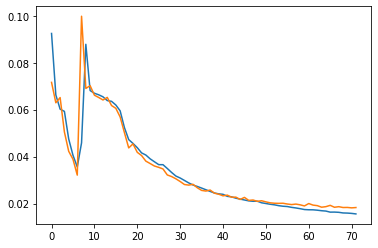

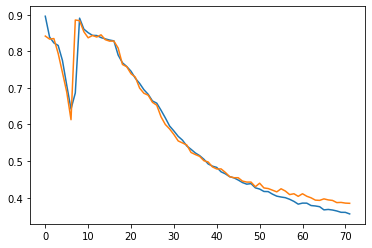

<s>세____________________치_________포___ᆼ___시__ᆫ___사_ ᄒ할이__ᆫᆫᄋ으___ 며_ᆾᆾ__ᄑ__러____까____지_______________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

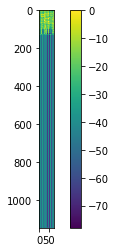

<s>아_______________________모_____느____ 베__다____혀__하__니________________________  다___ᄋ으_ᆷ___지__ᄋ___ᄋ우__느__으___ 베___나_ᆯ_에___여___호 하_ᄂᆫᆫ_다________________________  데___다___ 가___느__하___메___뉴__ᄂ느__ 고___가________________ 있ᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

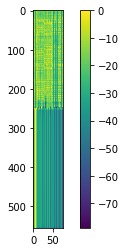

-------------------------------------------------------------------------------------------------------
09-22 12:45:14
09-22 12:47:47
Mean Train Loss: 0.015351022809813323
Train CER: 0.35448034062156814
09-22 12:48:01
Mean Evaluation Loss: 0.01811693406007867
Evaluation CER: 0.38342014078061326


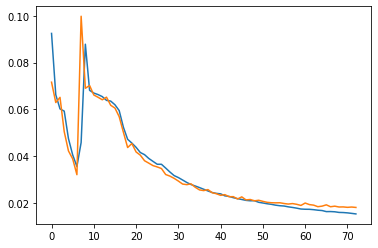

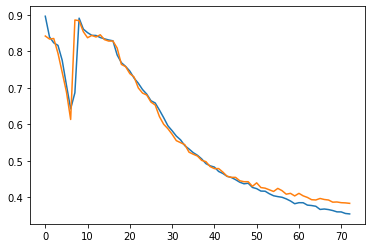

<s>지___________________그_______ᆫ_  투____ᅵᆷ__나_______  _수___차_____ᅡ___  파___나___요__________________________ 토____뫄____호___브_레__ᄉ스___테_ᄋ이__크_________  하___리___포____ 버____ᆫ__해__이__요_____________________________________  *_____시_____느_______ᆫ_ 부___레____ᄃ_______   ᄇ____ᆫ_겨__하_ᆼ_______________해요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지근 투ᅵᆷ나 수차ᅡ 파나요 토뫄호브레스테이크 하리포 번해이요 *시는 부레ᄃ ᄇᆫ겨항해요?</s>
<s>지금 투움바파스타 파나요? 토마호크 스테이크 아직도 판매 해요? 부쉬맨 브래드 판매하나요?</s>_


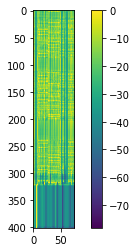

<s>아___________________니___자_____________________  _그_러_ᆷᆷ__기_ 에__ 기___이__매____ᆼ 도___ᆼ_ 주___아___주_ᆷ__하__ᅩ___시__읐ᆸᄂ디__다_____________________________  그_이__고___시___라__ᆨ _시__자___ 바__ᆼ_므___ 지_가__ᄒᆯᆯ__________________________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

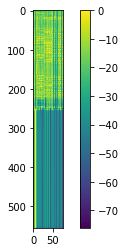

-------------------------------------------------------------------------------------------------------
09-22 12:48:02
09-22 12:50:38
Mean Train Loss: 0.015485228148220412
Train CER: 0.3528502464427353
09-22 12:50:52
Mean Evaluation Loss: 0.018376231639787955
Evaluation CER: 0.38427005469958814


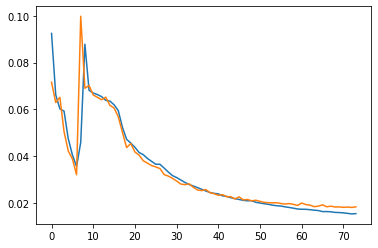

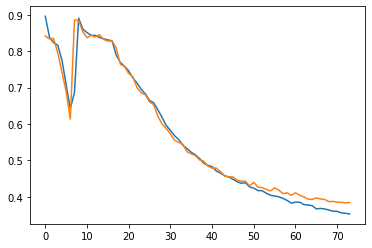

<s>다__________________________________ᆫᆫ__체___라__인__에____니__바____느__ᆫᆫ_데____________  다____ᄋ음__ 지____ᄌᄌ____일 로____ᄒ___ **___________시________에________________________  ᄎ*_____무__ᆫᆫ 며__ᆼ_____루_ᆼ___루_ᄅ로_  예_야_ᆨᆨ 가___느__________________ᆼᆼᆼ할까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>단체라인ᄋ

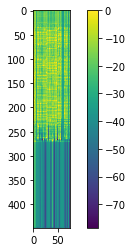

<s>아_____________ᆫ_녕ᆼ_하___세___요____________________  예__야_ᆨᆨ__믄ᆫ_아 ᄒ할려___ᅩ 조_ᆫ_하__드_랬ᆻ느ᅳ_ᆫ__데____요_______________________  ᅩᅩ___ᆨ__시_________ 와___ᆫ___지____  조__ᆼ_요__이____________ 도____ᆷ__시___에_  예ᄋ약___ᅵ_ 가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

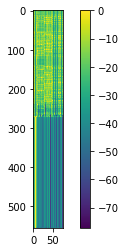

-------------------------------------------------------------------------------------------------------
09-22 12:50:53
09-22 12:53:19
Mean Train Loss: 0.015276111869045431
Train CER: 0.34965480697604767
09-22 12:53:34
Mean Evaluation Loss: 0.018164596426334195
Evaluation CER: 0.38603526053130516


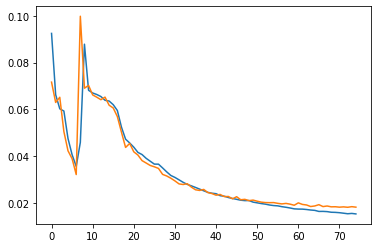

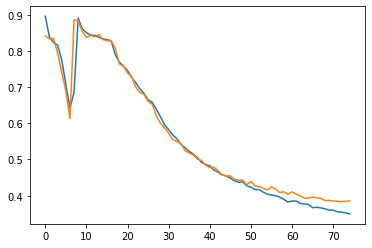

<s>고________________묘___로_   예___약ᆨ_ 가____느____________________ᆼᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

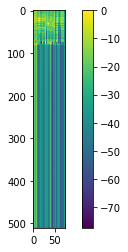

<s>아_______________________고______느__ᆯ 배___다_ᆯ_래__하____녀______________________   다___으_ᆷ___주___오__ᄋ___르___으__ _베__다_ᆯ_에___여_ᆼ_하_하_느__다_________________________  배__다____ 가___나__하__네___뉴___느___고___마ᅡ________________ᄋᆻᄌᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

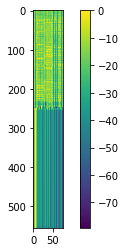

-------------------------------------------------------------------------------------------------------
09-22 12:53:34
09-22 12:56:02
Mean Train Loss: 0.0151394417122797
Train CER: 0.3449726685439788
09-22 12:56:17
Mean Evaluation Loss: 0.01828867079734708
Evaluation CER: 0.38734282040665113


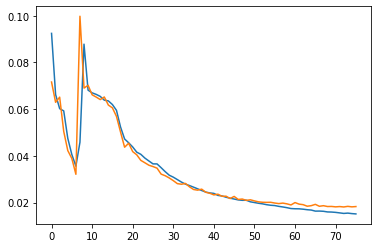

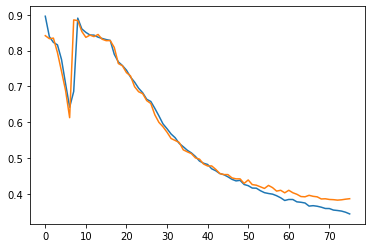

<s>ᄋ________________러___ᄌ____ᅳᆷ_나_ 아우ᅮᆺ_ᄇ백ᆨ_에_________ 며____ᆼ__시____**___수___아__ᆼ_아__려_____  예_야ᅣᆨ_ᄒ하__거____나____________   아___ᆫ__제_  예_약_을 하__고_ 사_________________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

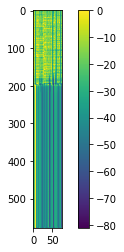

<s>아_________________ᆸ_니___다_____________________  그_러__ᆷ___치_ ᄋ____기_ _ᄋ___매___ᆼᆼ_도____  줗_마__ 주__ᆼ__가_고_ 싶__입ᆸᄂ니_다______________________________  으_ᄋ___보___시___라_ᆨ_ 시___사__  바___므_하__시__가_ᄒ____________________________께요._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

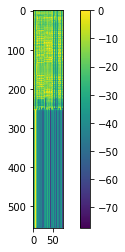

-------------------------------------------------------------------------------------------------------
09-22 12:56:18
09-22 12:58:49
Mean Train Loss: 0.014892064418617684
Train CER: 0.34750534124100135
09-22 12:59:02
Mean Evaluation Loss: 0.01755503923981228
Evaluation CER: 0.37999869244012463


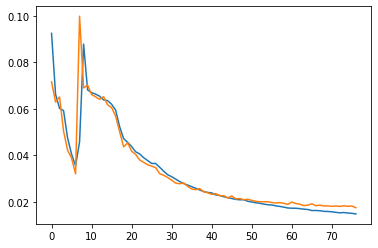

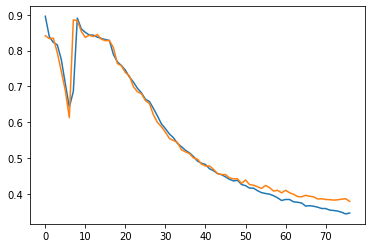

<s>그_________________려______ᆷ_ 트___어__ᆼ_가______파_____스ᅳ___타____________  즈____데_____ 포____자__ᆼᆼ_해___주____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

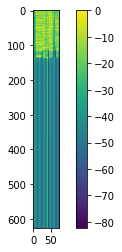

<s>저__________________버___ᆫ_에___ 자______리__가__  조___거_ᆫ_으______타____해__ᆻ_느__ᆫ__데___________________  가___다_ᆯ_ _가____며___ᄒ_____ᆫ_ 자_____이__ 조____ᆼ___조___ᄋ____ᆫ__데___오_______________________  아___ᆫ__느__하___주___시_ᆯᆯ__수_  ___지____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

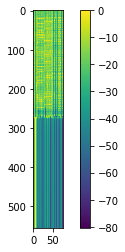

-------------------------------------------------------------------------------------------------------
09-22 12:59:03
09-22 13:01:41
Mean Train Loss: 0.014711099688647823
Train CER: 0.34332005272227517
09-22 13:01:55
Mean Evaluation Loss: 0.01824322142289939
Evaluation CER: 0.3820472029115


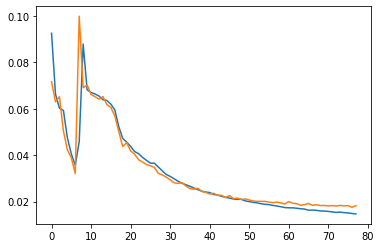

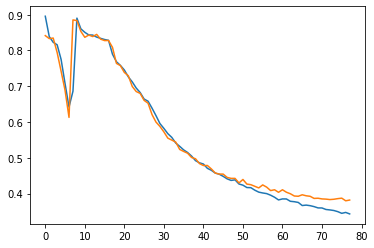

<s>예_________________ᄋ야___하_ᆫ_여_ᆻᆻ느__ᆫ__데___________ 그_____아___ᆯ_오__ 식ᆨᆨ_사___하_려_____________ᄋ아__ᆫ_질_이__사_ᆫ_여___서__요__요________________________________  애___기__ 지__가_ᆫ이_ 알ᆯ_마__나__디__________________ 될까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

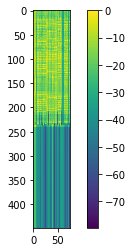

<s>여_________________ᆷ_마___ᆯ_이__ᆫ__되____________해___  서___고ᅮ__프__ᆫ 고____이_ᆻ__나_____요____________________________________  게_레ᅦ______ 버____ᄉ_____테___ᄋ이____타__ ᄋ____ᆻ_나____요____________________________________________ 자_____ᆷ _티______메____뉴_________ 하___며_____ᆫ_ 사____ᄀ___________________ 있나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

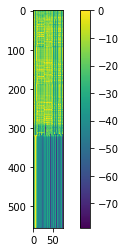

-------------------------------------------------------------------------------------------------------
09-22 13:01:56
09-22 13:04:23
Mean Train Loss: 0.014690501923597346
Train CER: 0.3411076779959467
09-22 13:04:37
Mean Evaluation Loss: 0.01785255460756825
Evaluation CER: 0.38294070215965303


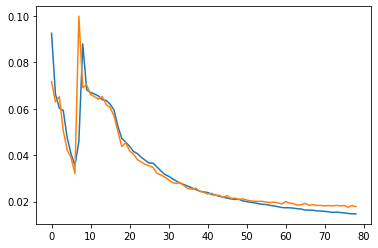

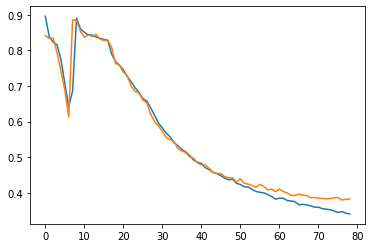

<s>다_________________ᆫ__체_  하_할ᆯ인ᆫ 가_ᇀᇀ_으_ᆫᆫ 거_____도__________________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

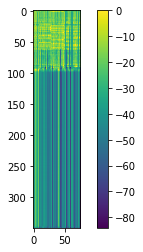

<s>저__________________버___ᆼ_으___ 자______리__가__ 조____무_ᆫ_으______차____해__ᆻᆻ느__ᆫ__데_____________________바___다_ᆯ_  가____며_ᆼ_ᄒ_____ᆫ_ 자____이___ 조____ᆷ_ 조___ᄋᄋ____ᆫ__드__요________________________  아___ᆫᆫ_느__ᄋ_ᆯ__주___시_ᆯᆯ__수_ 이__지____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

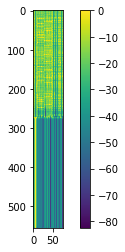

-------------------------------------------------------------------------------------------------------
09-22 13:04:38
09-22 13:07:06
Mean Train Loss: 0.01450535835326721
Train CER: 0.33792381228347096
09-22 13:07:22
Mean Evaluation Loss: 0.01788946303570252
Evaluation CER: 0.37590167149737397


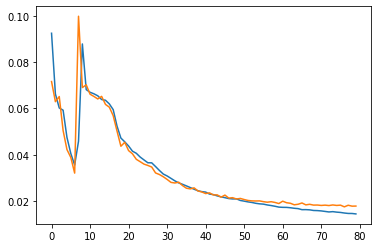

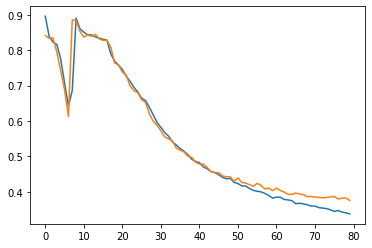

<s>예_________________ᄋ약ᆨᆨ__하___려____고  하_ᄂ느___ᆫᆫ_데___________________  예ᅨ_ᄋ야ᅣᆨᆨ__  바_ᆮ_으____시________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>예약하려고 하는데 예약 받으시ᅵ나요?</s>
<s>예약하려고 하는데 예약 받으시나요?</s>________


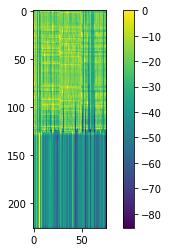

<s>아____________________   오_____느__ᆯ_ 에___다_ᆯ_헤__하___녀_______________________  다____으_ᆷ___지_ 오___우__드___에__ 베___가_ᆯ_에___요___고 하_ᄂ___다________________________  제___다___ 가___능_하_ᆫ 메___뉴___는ᆫ 고___가_________________있ᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

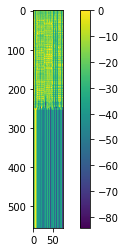

-------------------------------------------------------------------------------------------------------
09-22 13:07:22
09-22 13:09:55
Mean Train Loss: 0.014658191724727614
Train CER: 0.3446339471320579
09-22 13:10:08
Mean Evaluation Loss: 0.01794926930686767
Evaluation CER: 0.37984614378800097


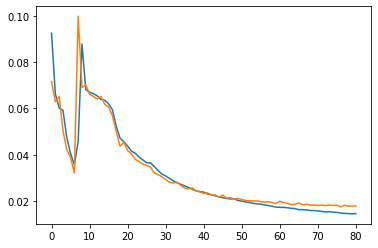

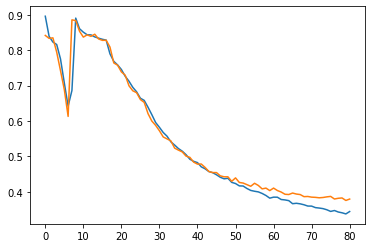

<s>다_________________ᆷ으____여_____ᆫ__세___이____  포____자_ᆼᆼ  가___느_______________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>담으연세이 포장 가능한가요?</s>
<s>남은 음식 포장 가능한가요?</s>_


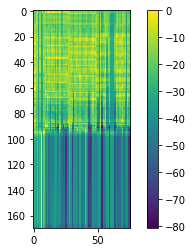

<s>주_________________ᆷ__마____이__ᆫ__되____________해_____사____고___트_ᆫ _고___이_ᆻ__마_____요__??________________________________  그__레________버___스____테___ᄋ이__ᆻ_사__해_있__나____요____________________________________________ _조____ᆫ___지_ᆯ___애__ᆫ__뉴________ 하___느__해_ᆫ__서____가__________________ 있나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

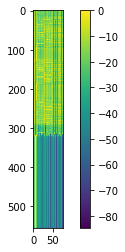

-------------------------------------------------------------------------------------------------------
09-22 13:10:09
09-22 13:12:48
Mean Train Loss: 0.014368978253726392
Train CER: 0.33846940557260097
09-22 13:13:02
Mean Evaluation Loss: 0.01810782446918682
Evaluation CER: 0.376555451435047


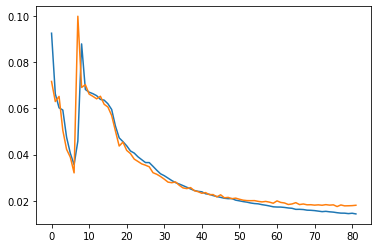

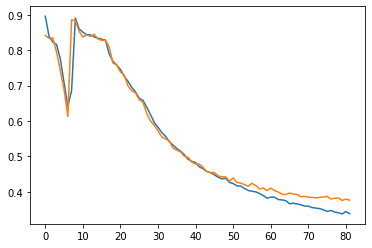

<s>제______________________가_______________________  지___그_____ 도_ᆯᆯ_르_ 이___아____ 바___려__ᆻᆻ느___ᆫᆫ_데_________________________________  아______무_ᆯ_에_____도__________ ______  아____ᄋ우_ᆺᆺᆺ_백ᆨ___까___ᇀ___아____요_____________________________  하_______기_________ᆫ__________  부_____뎌___ᆨᆨ__ 디__어_____도______________________________________ 될까요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>제가 지그 돌르 이아 바렸는데 아물에도  아웃백깥아요 하긴 부뎍 디어도 될까요?</s>
<s>제가 지갑을 잃어버렸는데 아무래도 아웃백같아요. 확인 부탁드려도 될까요?</s>__________


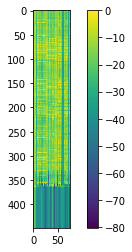

<s>이______________늠ᆷ_바__ᄅ로__ 다____ᆫ__체___레__드_ᄅ__라__ᆷ_지ᅵ__  ᄀ가____ᆫ 하__ᆯᆯ__지___________________   _문_루_ᆷ_이__가___쿠_ᆫ_데_ᆯ_ 버____어__ᆫᆫ_다__려_ᆯ 마__ᆫ_마____믄ᆫ_기_  구__ᆼ_금_____________합니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

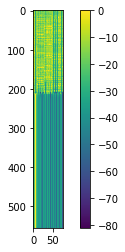

-------------------------------------------------------------------------------------------------------
09-22 13:13:03
09-22 13:15:32
Mean Train Loss: 0.014315856255476466
Train CER: 0.3354324525531069
09-22 13:15:47
Mean Evaluation Loss: 0.01778825891257468
Evaluation CER: 0.38028199707978294


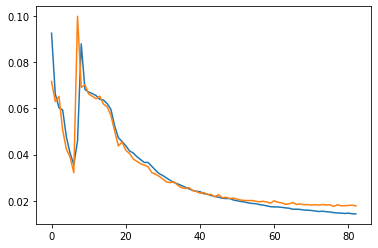

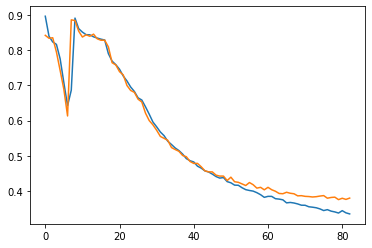

<s>주___________________차_____고__ᆼ_가___ᆫᆫ_이__  따____로____________________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>주차공간이 따로 있나요?</s>
<s>주차공간이 따로 있나요?</s>________


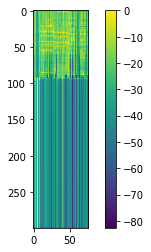

<s>저_________________무__에__ 가___르_라__도___ᆼ _쿠___토___가_ᆻᆻ느_ᆫᆫ_데______________  이___따___로 마__는_ 사___리_요_ᆼ_ 도_____ᆫ_글_어  ᄋ_ᆬ_매____ᅮ_ᆯ 수________________________________________________________________세요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

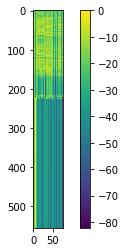

-------------------------------------------------------------------------------------------------------
09-22 13:15:47
09-22 13:18:16
Mean Train Loss: 0.014224590930264642
Train CER: 0.33354382968714447
09-22 13:18:32
Mean Evaluation Loss: 0.01745145394183855
Evaluation CER: 0.37686054873929437


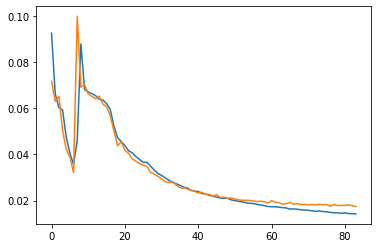

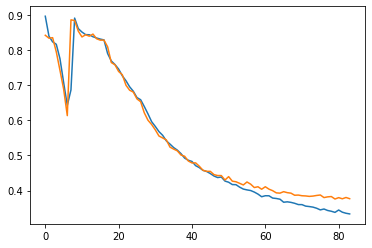

<s>ᄋ______________________ᆫ__터__ᆼ_네_____ 예_____야ᅣ__ᆨᆨ___가_____느_ᆼ_하_______________________________________________________________________________________________________________________________________________________________ᆫ가요ᅭ?</s>
<s>ᄋᆫ텅네 예약가능한가요?</s>
<s>인터넷 예약 가능한가요?</s>______


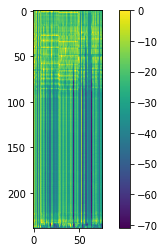

<s>네____________________________________________  미____버___ᆫ_에_______________  이__요_______시__ᆫ__메____뉴__로____ 며_______마____으____시___ᄋ이__스___가___으_ᆫ_나____녀_____ 서______라__ᆫ__거__고_ 가_____느__ᆫ__데____________________________ 호_ᆨᆨ__시__________ _이___니____주___시___게____________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

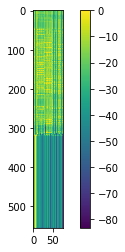

-------------------------------------------------------------------------------------------------------
09-22 13:18:33
09-22 13:21:05
Mean Train Loss: 0.014154318290375733
Train CER: 0.3356232424501773
09-22 13:21:18
Mean Evaluation Loss: 0.01796031126051775
Evaluation CER: 0.38132804498005973


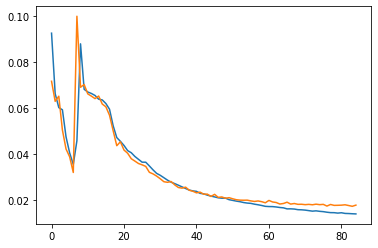

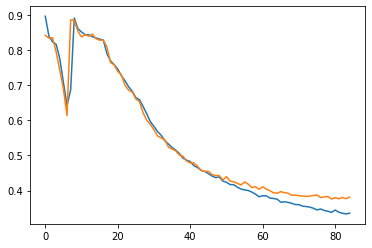

<s>쇠__________________마___ᆯ_이_  쿠____포_ᆫ_으  조___훌ᆯ_갇__가_ᆻᆻ느_ᆫᆫ_데______________________________  어_ᆫ_지___까___지_ _시_____ 수_ 이_ᆻ는__지 __ᅡᆯᆯ수________이________________________________________________________ᆻᆻ을까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

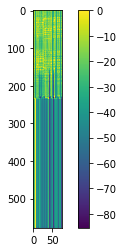

<s>아________________ᆫ__니___다_____________________  그ᅳᄅ러__ᆷ__지_ ᄋ___ 기_______매____ᆫ 조______주___마_ 주_____고_____싶__으_ᆸ_디__다_____..______________________  그_____고___시___라_ᄉ_ 스___타__  가___므_하  수___ᅡ_일__________________________게요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

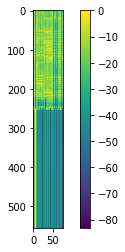

-------------------------------------------------------------------------------------------------------
09-22 13:21:19
09-22 13:23:56
Mean Train Loss: 0.01435063541016543
Train CER: 0.3343526345112018
09-22 13:24:11
Mean Evaluation Loss: 0.018148331844078356
Evaluation CER: 0.37594525682655217


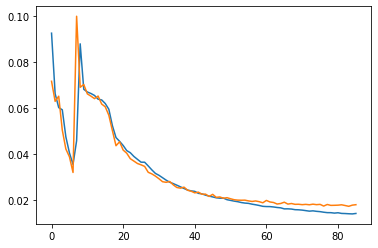

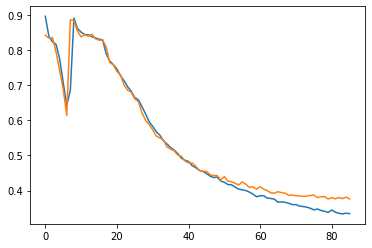

<s>지_______________________그____ᆷᆷ__아______ ᄋ_________마_____며__ᆼ_거___그_  고 ᄋ있으_ᆫ__데________________________________ _하____토_ᆫ__저___이_ 아____도___로__  자____ᆫ을 에______부__이____주_ᆯ 수____________________ 있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지금아 ᄋ마명거그 고 있은데 하톤저이 아도로 잔을 에부이줄 수 있나요?</s>
<s>지금 한 **명 정도 가고 있는데 같은 자리에 앉도록 상을 

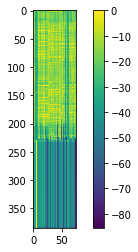

<s>오_______________느__ᄋ____다__ 조___조______저_ᆼᄋ이_ᆫᆫ_데__________________________________  제___애_ᆯ__파_____이_____ _주___ᆫ_부__ _하___ᄋ____며____ᆼ  추___겨___이____사_____요____________________________ 메____뉴_가____ 무_____ᆺᆺ_스__ᅩ____________________________________________________________________________________________________________울까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

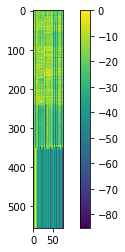

-------------------------------------------------------------------------------------------------------
09-22 13:24:11
09-22 13:26:39
Mean Train Loss: 0.014003581800915845
Train CER: 0.33058252177975367
09-22 13:26:53
Mean Evaluation Loss: 0.01750178396900865
Evaluation CER: 0.3714995532503759


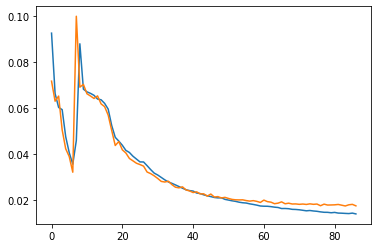

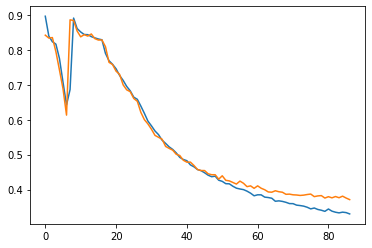

<s>마_____________________ᆷ_으__ 으_ᆷᆷᆷ___시______ 포___자_ᆼ_이___며_ᆯ__수______________________ 있나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

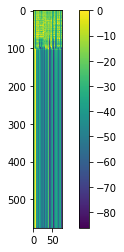

<s>오__________________기___  야___ᆨ__으_________예___________ _식ᆨ__사____가_  가___능ᆼ하ᅡ___가___요ᅭ_______________________________________________  도____ᆼ__즈___메___고____서____식_____따___ᄒᄒ_ᄅ려__느__ᆫᆫ_데_______________________________  예___ᄋ야_ᆨᆨ_ 아____려_____고__ 고___도_________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

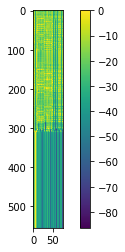

-------------------------------------------------------------------------------------------------------
09-22 13:26:54
09-22 13:29:21
Mean Train Loss: 0.013581589581010113
Train CER: 0.3234998220854655
09-22 13:29:36
Mean Evaluation Loss: 0.017196442603405655
Evaluation CER: 0.36779480027022904


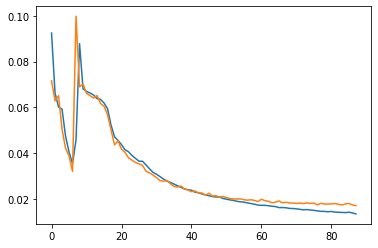

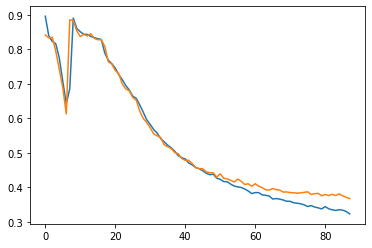

<s>주_______________마_ᆯᆯ에_____브ᄅ레이ᅵ_크__  타__임ᆷᆷ이_____________________________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

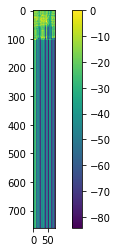

<s>아_______________리_______  주____차__ᄒ하_ᆯ__사___ᆯ__고__ _해___서___________  바___레___파____키_ᆼᆼ_이___드_ᆫ 고___으__로_ 가___고ᅩ_ 싶ᇁ으_ᆫᆫ_데_______________________________  고_____이__ ᄎ지___저___오____ 바___레__파_____키_ᆼᆼ 해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

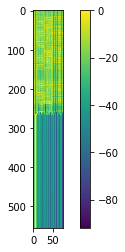

-------------------------------------------------------------------------------------------------------
09-22 13:29:37
09-22 13:32:09
Mean Train Loss: 0.013650490108896109
Train CER: 0.3277259535390958
09-22 13:32:23
Mean Evaluation Loss: 0.018669026619171407
Evaluation CER: 0.39658291019242925


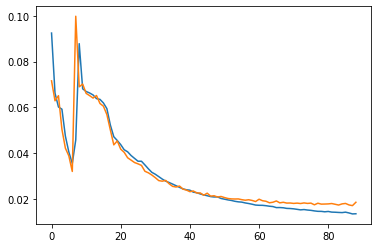

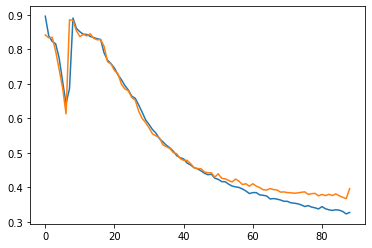

<s>제___________________사_______스__ᆼ_무___드___ _와_________캐_ᆨ_레__ 카____로___가___느_ᆫᆫ_데____ 어__________________________________  아_____기_ 데___규__ᆯ__쳐_____서_________________  가_____그___식___셔____가___느_________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>제사승무드 와캑레 카로가는데 어 아기 데귤쳐서 가그식셔가능한가요?</s>
<s>제가 친구들과 아웃백에 가려고 하는데요 아기들이 있어서요. 같이 식사 가능한가요?</s>____


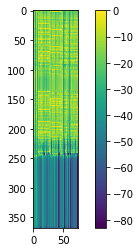

<s>어_______________________모_____느__ᆯ_ 배___다_ᆯᆯ_여_하ᅡ___니__아___________________ 사___으ᅳ_ᆷ___지__오_ᆼ_우__르___으__ 베___가_ᆯ__에__여___고_하ᅡᄂᆫ__다________________________   채__차__ᆼ__가___나__한_메___뉴___느_ᆫ  구__거__ᄋ________________ᆻᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

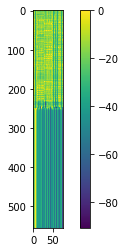

-------------------------------------------------------------------------------------------------------
09-22 13:32:23
09-22 13:35:02
Mean Train Loss: 0.013565973394408995
Train CER: 0.3253094910591472
09-22 13:35:17
Mean Evaluation Loss: 0.017908533696544993
Evaluation CER: 0.3694946281081788


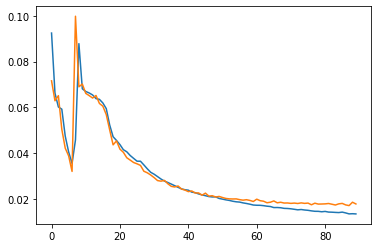

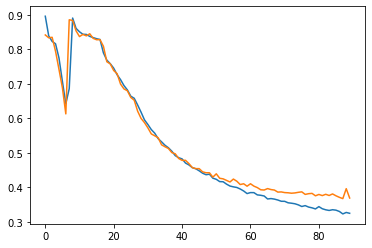

<s>그__________________________________________________________ᆫ_료____에__ᆯ  오________  **___________시___로_ 벼____ᆫᆫ_겨__ᆼ_헤____ᄌ*___시____고____________________  이____어___ᆫᆫ_으___ᆫ _사____ᄋ_ᆫᆫ  ᄆ*______며____ᆼ   어____리_ᆫᆫᄋ__ᆫ  *____며ᅧ_ᆼᆼ_으_로__ 여___ᆼ_며__ᆼ__혀__ᄉ________________________서요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

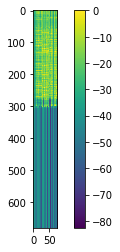

<s>어_______________리___ᄋ____ 주_____차___늘__사______버____배____서__________  바___레___파____키____이_ᆼ_느_ᆼ 고___스__로_ 가____고_ 싶ᇁ으_ᆫᆫ_데_______________________________  고_____리__ 지____저___오____ ᄇ바__레___파____이_  호____주__ᄉ_________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

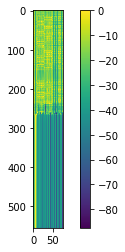

-------------------------------------------------------------------------------------------------------
09-22 13:35:17
09-22 13:37:45
Mean Train Loss: 0.013377774727932753
Train CER: 0.3205978417211243
09-22 13:38:00
Mean Evaluation Loss: 0.01745483374811493
Evaluation CER: 0.37132521193366314


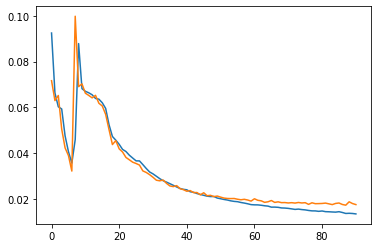

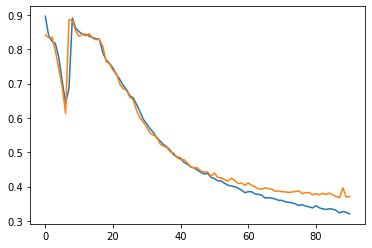

<s>제___________________가_________ 주_____처___으___자___ᆯᆯ 고____해____서_________________________  _자_______토____저_ᆼ__ᅮ______ᆫ_  바___레____파____키___ 히_____ᆼ_드_ᆷ__도____고 하__느_ᆫ__데____________________________  토__ᆼ_기_______ 지____조__ᆼ_으____________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>제가 주처으잘 고해서 자토정ᅮᆫ 바레파키 힝듬도고 하는데 통기 지종으 되나요?</s>
<s>제가 주차를 잘 못해서  서초점은 발레파킹이 안된다고 하는데 거기 지점은 되나요?</s>___


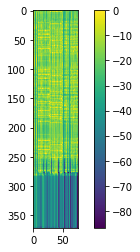

<s>아________________기____주____차___라_____ᄋ__ _가__ᆯᆯ 이___태____솨________________________  과_ᆯᄅ레___파___키__ᆼ_____ᆼ 기___이___구___흐__로__ 가____고_ 싶으_ᆫᆫᆫ__데_______________________  커_____기_ _기__저____보_______ᆫ____  바_ᆯ_리___파___키___ᆼᆼ___ 수___주___ᄉ___________________________________ᅵ_나요????</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

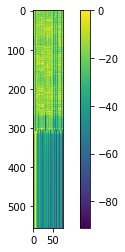

-------------------------------------------------------------------------------------------------------
09-22 13:38:00
09-22 13:40:30
Mean Train Loss: 0.01377443179943517
Train CER: 0.32877292644398
09-22 13:40:45
Mean Evaluation Loss: 0.017591568716831815
Evaluation CER: 0.37156493124414325


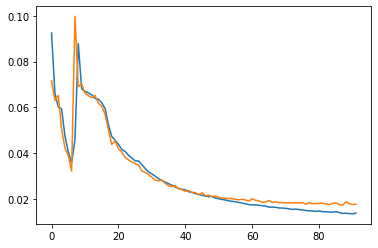

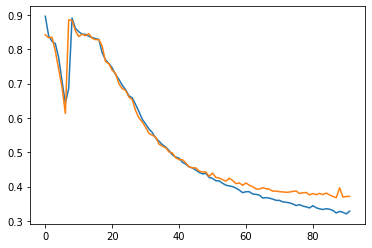

<s>그____________________이_____기_______자_______ᆷ_  여__ᆼᆼ어_ᆸᆸᆸ_시_____가__ᆫᆫ_이__    어_______떠__ᇂᇂ_게____________________________ 되_나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

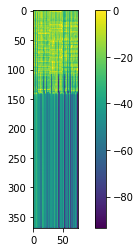

<s>아_______________기___ᄋ____ 주_____차___흘__사___ᆯ_ 부____배____서__________  바___레___파____키_ᆼ_ᄋ이_ᆻᆻ느_ᆫ_고___즈__로_  가___고_ 싶_으_ᆫᆫ_데_______________________________  고_____이__ _주___저_________ 바___리__ 파____키_ᆼ  해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

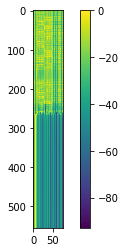

-------------------------------------------------------------------------------------------------------
09-22 13:40:46
09-22 13:43:18
Mean Train Loss: 0.013635557496185266
Train CER: 0.3275839213606885
09-22 13:43:32
Mean Evaluation Loss: 0.017321967858059877
Evaluation CER: 0.3727417351319546


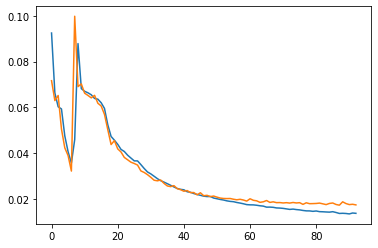

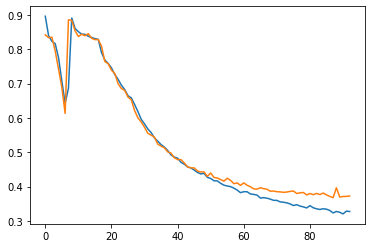

<s>주________________________마___ᆯ_에____느_______ᆫᆫ 며___ᆾᆾ_시_____까________지______________________________해요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>주말에는 몇시까지해요?</s>
<s>주말에는 몇 시까지해요?</s>________


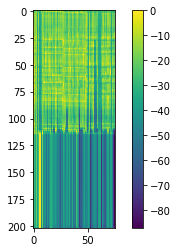

<s>네____________________________________________  이____버___ᆫ_에_________  _____ 니____워_____ *ᅵ____메____뉴___로___ 여_______마______ᅵ_____시__이__그___가___으ᅳᆫ__대___느___ᆫ_ 처______라__ᆫ__거__ᄀ__ 거_____ᄂ느_ᆫ__데___________________________  호_ᆨᆨᆨ__시_________  이___이_ᆫ_치____시___게_____________________였나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

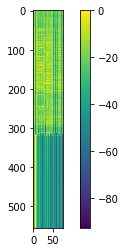

-------------------------------------------------------------------------------------------------------
09-22 13:43:33
09-22 13:46:12
Mean Train Loss: 0.0132803279874859
Train CER: 0.3228523944110505
09-22 13:46:26
Mean Evaluation Loss: 0.017576940765006
Evaluation CER: 0.3661821430906357


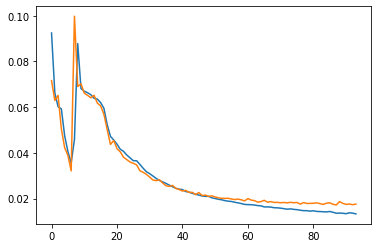

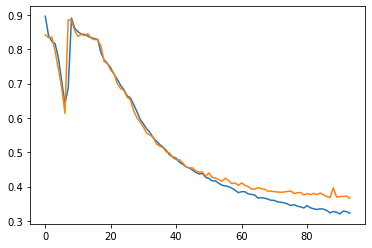

<s>ᄋ__________________________________________________________________________________그_________  때____우___ᆷ__바_____파_____ᄉ스__타______ _파____하__요_______________________ 파___우___과_______________프___ᆫ_ 스____테__ᄋ이___크___어___ 지_____포____  포____ᆫ__메____예___요___________________  푸_____시_______메____ᆫ_ 보___레____도___  가______냐__________________하_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

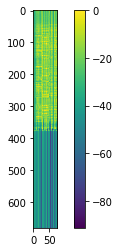

<s>아_________________ᆸᆸ니___다______________________ _그_러__ᆷ__치_______기_______내____ᆫ 도_____ 주___가___주_ᆷ__고_고__싶ᇁ_읍ᆸ네__다_______.._____________________  그_이__고_ᆺ_지___라__ᆨ 후___차__  바___므_하_ 시_어_ᄋ아___________________________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

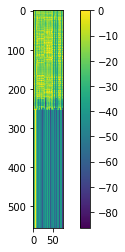

-------------------------------------------------------------------------------------------------------
09-22 13:46:27
09-22 13:48:55
Mean Train Loss: 0.013421132465405458
Train CER: 0.32152438464598654
09-22 13:49:10
Mean Evaluation Loss: 0.017972744163859963
Evaluation CER: 0.36997406672913896


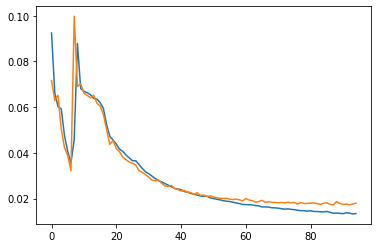

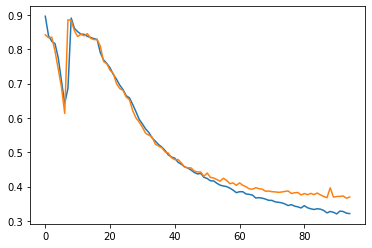

<s>그__________________ᆷ요_ᄋ이_ᆯᆯᆯ 저____녀__ᆨ_에__ 도_____ᆫ__차____헤__서_  도__려___고 하_느ᅳᆫ__데______________  이_____치___에___ 시__차_ᆫ_메_ **___라___려_ᆼ___조__ᆼᆼ_도__  예ᅨ_약ᆨ_ 받ᆮ_을ᆯᆯ 수___________________ 있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

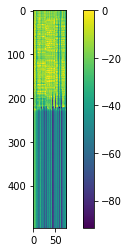

<s>지______________금ᆷ 바___르__ 다____ᆫ__주___르___도___라__ᆫ__지___ 가___응_하__ᆯᆯ_ 시___________________    무__루_ᆷ 이__라__ 쿠___에___ 포____타__ᆫ__가__려_ᆯ 하__ᆫ_아____이___지_ 구___ᆼ_금_____________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

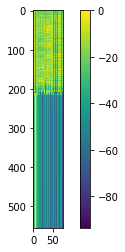

-------------------------------------------------------------------------------------------------------
09-22 13:49:10
09-22 13:51:37
Mean Train Loss: 0.012825833026865179
Train CER: 0.31137753591374573
09-22 13:51:53
Mean Evaluation Loss: 0.018449916853190217
Evaluation CER: 0.3849238346372611


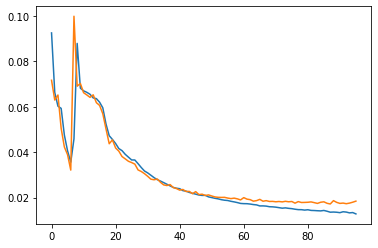

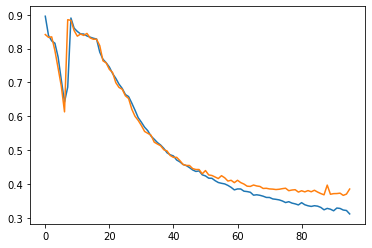

<s>저______________ᆫ_____________포___제___ 가__ᆫ__매__느__ᆻ스__ᆻ닜닌_데________  파______아_____므_매__소___시___아___므__하___부_가_ᆫ_무____카_ᇀ__어__에___ᆫ_에_____________________  아__른__조_ᆷ 며__주___시____________________ᄋ_ᆻ어요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

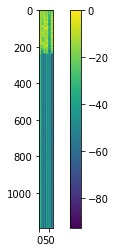

<s>이______________그_ᆷ 마___로__ 다____ᅵ__즈___르___도__러____ᆫ_지__  가_____ᆯ 하__ᆯ____ᅵᅦ__________________  _무_ᆫ_로__ 이_라__ᆨ__으___애___포____쪼__ᆼ__가__려___마__ᆫ_하__으_는_지_ 구___ᆼ_금_____________합니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

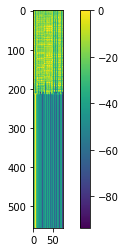

-------------------------------------------------------------------------------------------------------
09-22 13:51:54
09-22 13:54:25
Mean Train Loss: 0.012821511579123498
Train CER: 0.3138732832366406
09-22 13:54:39
Mean Evaluation Loss: 0.01695448821797829
Evaluation CER: 0.3604506723037026


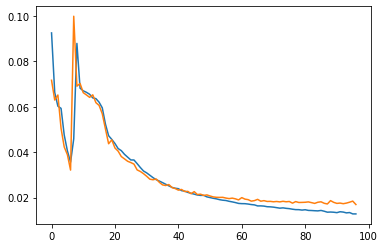

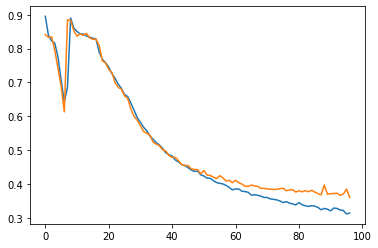

<s>웨______________________ᆯ 모____드____ᆫ_ 시___ᄋ_ᆯ__만_에_ ____ 가___하___지_아___ᆭ_으___ᆫᆫ 메____뉴__가_____ _가_ᆯ_려___나____________________  자____이__료__후___ᆫ__지__유_ᆯ_문ᆫ_운ᄒ해___주_______________세요_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

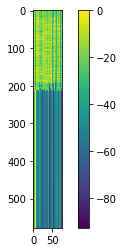

<s>지________________그___ᆷ_ 바___로___  다___ᆫ__체___로_____드_어__가___느__ᆫ_데____ 가___느_ᆼ_하__ᆫ___지__________ᆫ____________________________ 무____이__ᅵ__아_____그_______ᆯ_ 바____자____ᆼ_자___일ᆯ 바___나__ᆷ_마____으___ᅳᆫ___지____  구__ᆼ_금______________________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

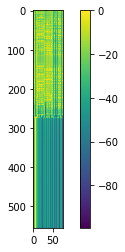

-------------------------------------------------------------------------------------------------------
09-22 13:54:40
09-22 13:57:18
Mean Train Loss: 0.01293783076632809
Train CER: 0.3162342977560937
09-22 13:57:32
Mean Evaluation Loss: 0.017141237486739923
Evaluation CER: 0.3623466341229542


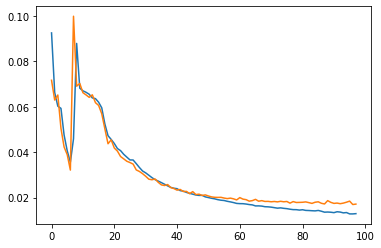

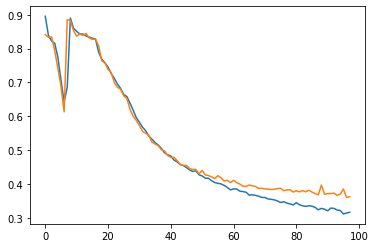

<s>차_____________________파___ _고___가_____고_이ᅵᆻᆻᆻ느__ᆫ__데_________________________  스___ᆫ_되___ᆼ_____채__ᄋ___ 대_____크____저___ᆷ  마__ᆮ_으__ᆫ__펴___ᆫ__최____로____ᅦ___ _ᅥ___  ______는 고_____모___브___ᅩᅩ_ 드___머___가___야ᅣ________________________하_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>차파 고가고있는데 슨됭채ᄋ 대크점 맏은편최로ᅦ ᅥ 는 고모브ᅩ 드머가야하나요?</s>
<s>차타고 가고 있는데 신세계백화점 맞은편 대로에서 어느 골목으로 들어가야하나요?</s>______


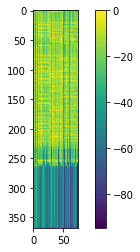

<s>어_______________기_______  치____차____흘__사______고___패_____서__________  바___레___파____키____이_ᆻ_느_ᆫ_ ___지___로_  가___고_ 싶ᇁ으_ᆫᆫ_데_______________________________  고_____리__ 지____저_____ᅩ___ 바___레___파____키_ᆼ  해__주___ᄉ_________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

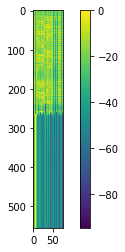

-------------------------------------------------------------------------------------------------------
09-22 13:57:33
09-22 14:00:00
Mean Train Loss: 0.013079747487875791
Train CER: 0.3169269082686549
09-22 14:00:14
Mean Evaluation Loss: 0.018006357954221768
Evaluation CER: 0.37635931745374507


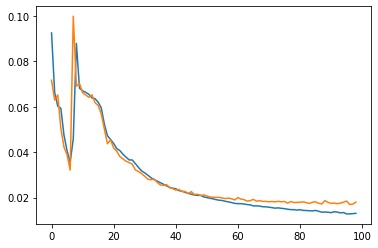

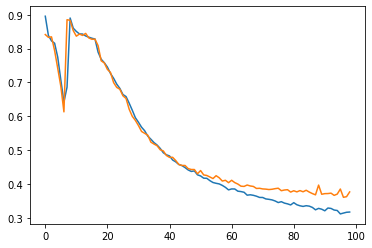

<s>어________________머______니______ᆷ_ 더_____려__ᆷ___지_ᆷ_여__ᆨ_에__  초____가___하__려___고    예_ᄋ야_ᆨᆨᆨ 해___ᆻᆻ느___ᆫ__데________________________________  혹ᆨ_시ᅵ______ᅨ_ 아___우_ᆺᆺ_백ᆨ_에____나___  어ᅥ____떠___ᆫ_ 자___기____드_ᆯ_래____ 하___ᄌ____________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

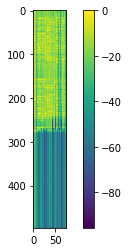

<s>아_______________기___ᄋ___  추_____차___늘_ 사_____ 고____배____서__________  바___레___파____키____이__ᆻ느_ᆫᆫ ____즈__로_  가___고_ 싶ᇁ으_ᆫᆫ_데________________________________ 구_____이__ 치____저_________  보__레___파____키_ᆼ _해___주__ᄉ_________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

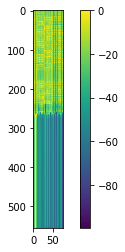

-------------------------------------------------------------------------------------------------------
09-22 14:00:15
09-22 14:02:44
Mean Train Loss: 0.012798639448691461
Train CER: 0.31155659412582837
09-22 14:02:59
Mean Evaluation Loss: 0.017149006389297367
Evaluation CER: 0.3659206311155665


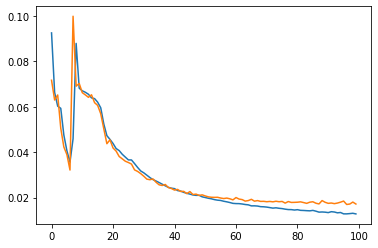

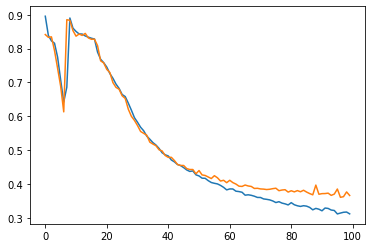

<s>이__________________________무____ᅳ___미_______시___ᄋ이___눈_에______ _____사_____에________아_________ᆫ__기_________ᆫ______________  여___ᆼᆼ_어_ᆸᆸ_시______가__ᆫ___ᆫ__과_________ 과__________려______하_______ᆫ_ 자______이_____수_____ᆫ_ 지______ᅮ__ᆫ_느_______ᅢ__주___________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>이무ᅳ미시이눈에 사에안긴 영업시간ᆫ과 과려한 자이순 지ᅮᆫ느ᅢ주세요.</s>
<s>위 모든 질문에 해당하지 않는 *영업 시간*과 관련한 자유로운 질문을 해주세요.<

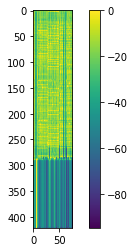

<s>지_______________ᅳ_ᆷ_마___로__ 다_______즈___래___도___가__ᆫᆫ_이___ 가_______하______시___________________  ______루_ᆷ_이__라___크___레____쿠____더__ᆫ__가__려__ 마__ᆫ_가____느___지_ _구__ᆼ_금_____________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

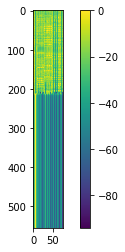

-------------------------------------------------------------------------------------------------------
09-22 14:03:00
09-22 14:05:32
Mean Train Loss: 0.01269557306799268
Train CER: 0.3117410039022282
09-22 14:05:46
Mean Evaluation Loss: 0.016757861656794954
Evaluation CER: 0.3585111251552727


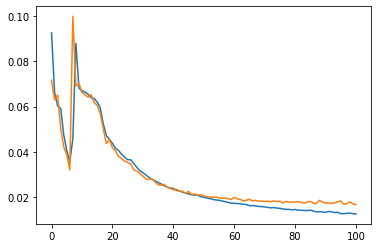

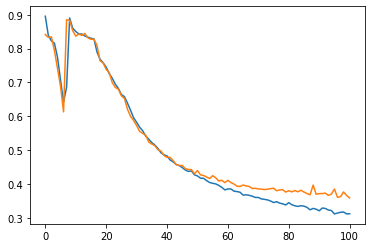

<s>내__________________ᄋ___자__ᆼ_예____하____기___ 저___ᆫ_여_ᆼ_이____자___아___ᅡᅡ______개 아__ᆫᆫ__그__ᆯ  수_ 있ᆻ느__ᆫ_ 자____리___느_______ᆫᆫ_____ 이_ᆫ_녀_ᆼ__도__ᆼ_버_____수___여__ᆼ_이__ 가___느_________________ᆼᆼ한가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>내ᄋ장예하기 전영이자아ᅡ개 안글 수 있는 자리는 인

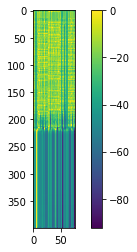

<s>저__________________버___ᆫ_에___ 자______리__가__ _조___고_ᆫ 그__ᆯᆯ__타____해____느__ᆫ__데___________________ _다____다__  가_____며________ᆫ_ 자_____리__ 조______ 조____오___ᆫ__데___로_______________________  아___ᆫ__나__해___주___시_ᆯᆯ__수_ ____즈____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

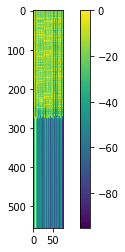

-------------------------------------------------------------------------------------------------------
09-22 14:05:47
09-22 14:08:26
Mean Train Loss: 0.012557732487690251
Train CER: 0.3072024096870223
09-22 14:08:40
Mean Evaluation Loss: 0.017655461614150308
Evaluation CER: 0.36635648440734847


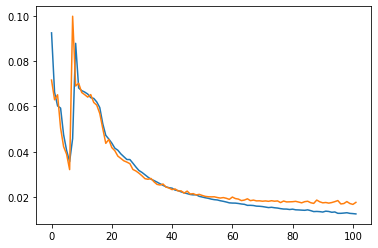

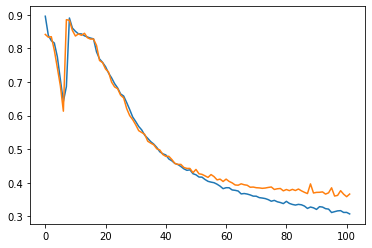

<s>수_________________ᅩ____라_________ 주_____차___가_ 소____으___ᆫ__데________ 혹ᆨ_시__ 바_____레__ 파___키___ᆼ 조___ᄋ_ᆫ 주____나___요__??_____________________  자___녀___케___사__로___느__ᆫ__데_____  배_ᆯᆯ_레___파____키_ᆼᆼ 되____느_ᆫᆫ__________________지요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

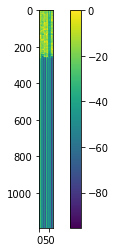

<s>아________________기___ 즈____차___라_하__이_ 자__ᅡ_ᆯ 으___개____사________________________  하__레____파____키__ᆼᆼᄋ__ᆼ 미___애___고_ᆺ_도__로_  가___고__ 싶으_ᆫ디_데_________________________ 허_____기_  지__저___이____ᅲ________  바_ᆯᄅ리_  파___키_ᆼᆼᆼᆼᆼ_ 자____주___ᄉ___________________________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

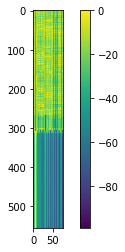

-------------------------------------------------------------------------------------------------------
09-22 14:08:41
09-22 14:11:07
Mean Train Loss: 0.012335172355568112
Train CER: 0.30422332291956705
09-22 14:11:21
Mean Evaluation Loss: 0.01650864499358898
Evaluation CER: 0.35391287292697277


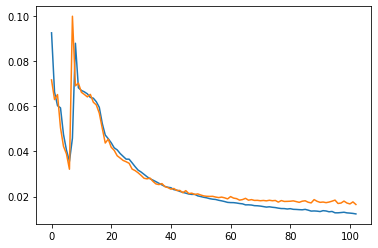

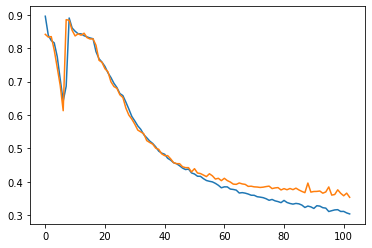

<s>예_________________ᄋ약ᆨᆨ  시____가___ᆫᆫ 모__다____ 느_ᆯ_ 기__ᆯᆯ 시______________________ _따___로____  지_____고_____________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>예약 시간 모다 늘 길 시 따로 지고 되나요?</s>
<s>

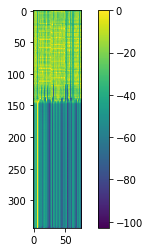

<s>아_____________ᆫ_녕ᆼ하ᅡ___세___요____________________  예__야_ᆨᆨ___몬_아_ 하_여__고 조_ᆫ_하__드_려_ᆻᆻ느_ᆫ__데___ᄋ요_______________________  호______시___________ᅥ___ᆫᆫ__주_____ 조____요_ᄋ일_ᄋ_______ᆯ  저____ᆷ__시_ᆷ_에_  예_약ᆨ__ᅵ_ 가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

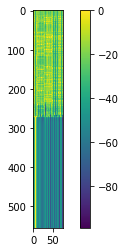

-------------------------------------------------------------------------------------------------------
09-22 14:11:22
09-22 14:13:50
Mean Train Loss: 0.012321416967763064
Train CER: 0.3056438700968514
09-22 14:14:06
Mean Evaluation Loss: 0.017724034806383376
Evaluation CER: 0.36842678754331293


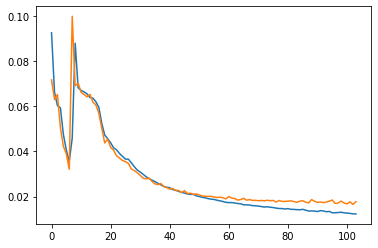

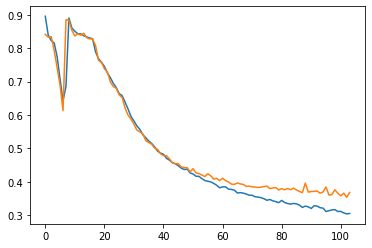

<s>마____________________느_ᆷ_ 시___가__ᆫ__이__ᄋ야______으___고_______________________되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>마늠 시간이야으고되나요?</s>
<s>마감 시간이 어떻게 되나요?</s>_____


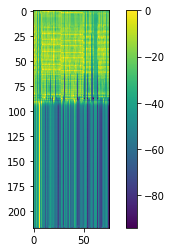

<s>서_________________과__에__ 파__르__가__으_ᄋ_ᆼ _구__ 토___났ᆻᆻ느_ᆫ__데______________  이___따__ᄋ__ 가__는 다__ᆯᆯ리_아_ᆫ_ 초__우_ᆫ_그__아 아_ᆮ_느__주__ᆯ_수__게__ᆻ_수______________________________________________________세요_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

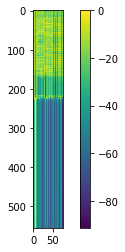

-------------------------------------------------------------------------------------------------------
09-22 14:14:06
09-22 14:16:37
Mean Train Loss: 0.012216296113959755
Train CER: 0.30515643386435165
09-22 14:16:51
Mean Evaluation Loss: 0.01678753940897779
Evaluation CER: 0.353302678318478


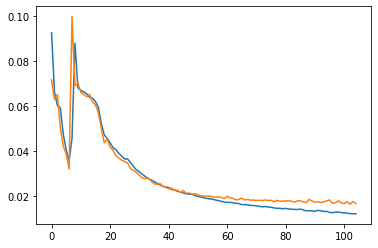

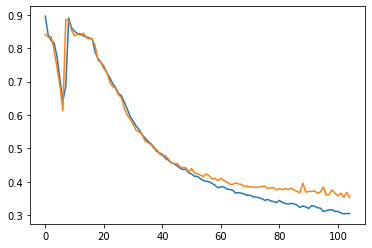

<s>주_________________차___자_ᆯᆯ_ᄌ___시___이____사__하__ᄉ___태_이__카________이_______________ᆻᆻ을까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>주차잘ᄌ시이사하ᄉ태이카있을까요?</s>
<s>추천해주실 만한 스테이크가 있을까요?</s>____


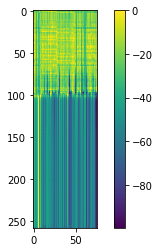

<s>오_______________느__에___려__ ᄌ____조______자__ᆼ이__ᆫ_데___________________________________ 지___해_ᆯᆯ__파____티___ᆯ_  주_____부__ _하___ᄌ_____며___ᆼ_ 치___가_해_해___ᆻ사_____요____________________________메____며______ᆫ_구__________저_____________________________________________________________________________________________________________우 까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

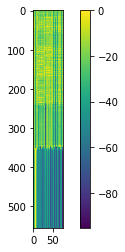

-------------------------------------------------------------------------------------------------------
09-22 14:16:52
09-22 14:19:31
Mean Train Loss: 0.012034237279792664
Train CER: 0.3029098855741015
09-22 14:19:45
Mean Evaluation Loss: 0.01684211180420825
Evaluation CER: 0.3569638459694467


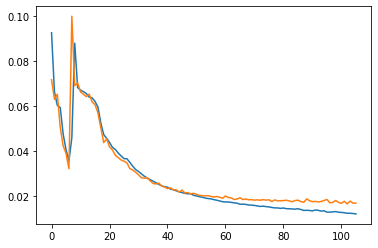

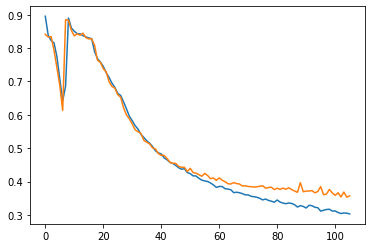

<s>져_______________자__ᆼ _그_ᆫ__처____에__ 유__르___  저__ᅡ__자_ᆼᆼ이____다___ᆫ__데____  매____다____ 시__요_ᆼᆼ_하__며__   할ᆯ이_ᆫ 갇ᇀ__은ᆫ_것_으__ 저____요_   가__느_________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

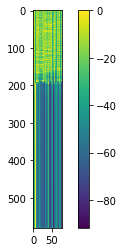

<s>어_______________리___이__  주____차____를__사_____ 보____배____서__________  바___레___파____키__ _이_ᆼ_느_ᆫ 곳ᆺ_즈__로_ 가ᅡ___고_ 싶ᇁ으_ᆫᆫ_데_______________________________  고___ᅩ_이__ 지____저____오___ 바___레___파____키_ᆼᆼᄒ해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

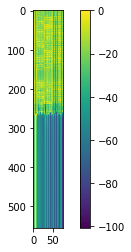

-------------------------------------------------------------------------------------------------------
09-22 14:19:46
09-22 14:22:14
Mean Train Loss: 0.01214415566937014
Train CER: 0.30105605945374825
09-22 14:22:28
Mean Evaluation Loss: 0.016657334497708502
Evaluation CER: 0.3529322030204633


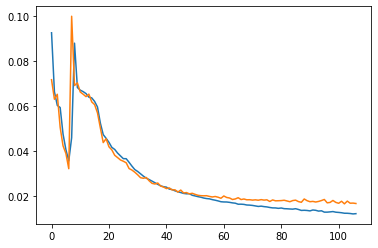

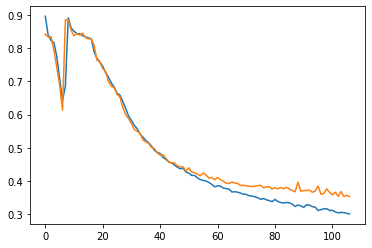

<s>야___________________ᆫ__재___역_ **_____버__ᆫ__추__ᆯ__그__로_ 라____와__ᆻᆻ느__ᆫ__데______________________  여___ᆨ_게______서_  어______떻_게__  가___야____하__가____요_______________________  가_____느_ᆫ__재_______ ᄋ어____떠_ᇂ_게______________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>얀재역 *번출그로 라왔는데 역게서 어떻게 가야하가요 가는재 어떻게 되나요?</s>
<s>양재역 *번 출구로 나왔는데 여기에서 어떻게 가야 하나요? 가는 길이 어떻게 되나요?</s>___


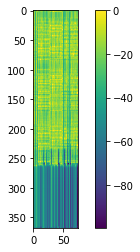

<s>아______________ᄋ웃ᆺ_백ᆨ__가_____트__ 하___여_____마__ᆫᆫ_가___여__ 고__ᆺ__그__거_에____메__있ᆻ느_ᆫᆫ_데__________________________  크_____츠__어_ 도___요___으__지__느________ᆫᆫᆫᆫ_____________________   오____지_____치____주____그__에ᄋ__ 바__늘 _수_________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

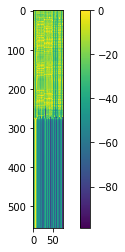

-------------------------------------------------------------------------------------------------------
09-22 14:22:29
09-22 14:24:56
Mean Train Loss: 0.012059482852899107
Train CER: 0.29918396468876346
09-22 14:25:12
Mean Evaluation Loss: 0.016585799271859554
Evaluation CER: 0.360101989670277


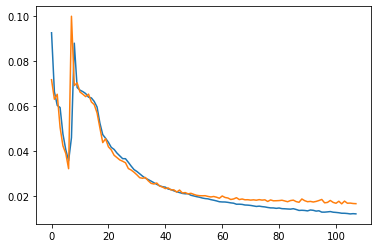

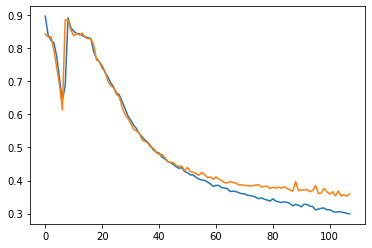

<s>펴_________________ᆼᆼ일_에___  며_ᆾᆾ__시___에ᅦ 버ᅡ__다_____________________하_나요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>평일에 몇시에 버ᅡ다하나요?</s>
<s>평일에 몇시에 마감하나요?</s>_____


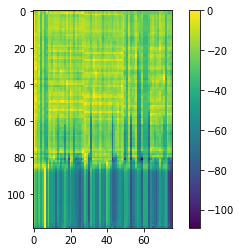

<s>아_______________기________ 주____차____늘__사_____ 구____배____서__________  바___레___파____키____이___느_ᆫ 고___드__로_  가__ᄀ고_ 싶ᇁ으_ᆫᆫ_데_______________________________   고____이__ 지____저_________  바__레___파____키_ᆼ  해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

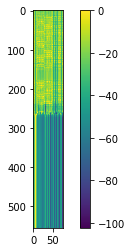

-------------------------------------------------------------------------------------------------------
09-22 14:25:12
09-22 14:27:45
Mean Train Loss: 0.012087304186409183
Train CER: 0.30169899140696055
09-22 14:27:59
Mean Evaluation Loss: 0.016658217007330348
Evaluation CER: 0.35500250615642776


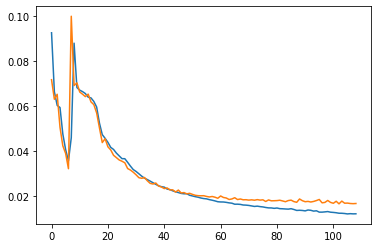

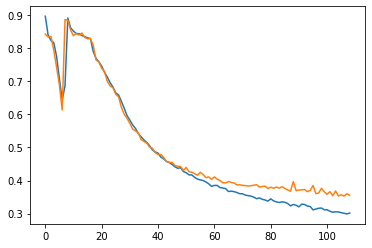

<s>하_______________ᆨ__새_____ᆼ__이________ᅢ__ᆼ_애___려___어______무__ᆫ_ 어_____ᆯᆯᆯ_마___나 할ᆯ인ᆫ__________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

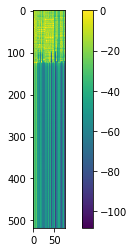

<s>아________________기____즈____차___려________ _사___ᆯ_이___때____솨_______________________   할_레____파____키_ᆼᆼᆼᆼ잉 _지__니_ᆫ_고_ᆺ_도__로_  가___고ᅩ_ 싶으_ᆫᆫᆫ_데_________________________ _거____기_  디__저_ᆫ_으___이___ᆫ_____ 바_ᆯ_리_ _파___킹ᆼᆼᆼᆼᆼ_  수___주___ᄉ___________________________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

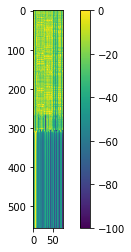

-------------------------------------------------------------------------------------------------------
09-22 14:27:59
09-22 14:30:54
Mean Train Loss: 0.012516304722670532
Train CER: 0.3155329924637119
09-22 14:31:14
Mean Evaluation Loss: 0.017106512624949676
Evaluation CER: 0.36042887963911346


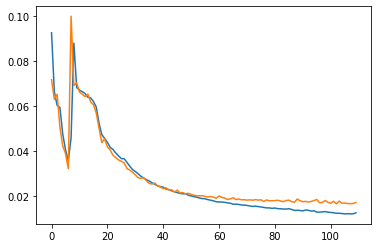

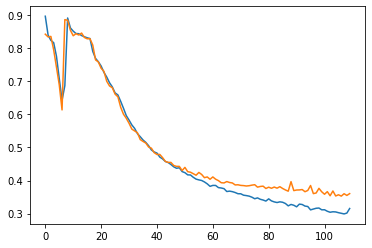

<s>네___________________________  저______니__ᆷ _여___ᆨ_기___  서____려___ᆫ__추____ᆷ_ 예___아____________   가____녀___ᆫ_ 데____아_________시_____고_____ᅩ____고_____ᆼ___ᅮ________**_____________으___ᆫᆫ__조_______로____가___ᄅ리__고___가__ᇀ__으__ᆫ__데______요______________________  어_______구______시_ᆨᆨ_포____그_ᆼ__가______지___야_  칙_차_____ᄂᆫ_ 머___ᆯᆯ_마___나_ 걸ᆯ______________________리_나요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

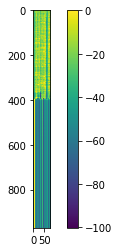

<s>아_________________ᆸ_니___다______________________ _그_러__ᆷ___시_____ 기___이__매____ᆫ_조___ᆷ___수__가___주_ᆷ__하_고ᅩ__싶_입ᆸ니__ᄃ다_____________________________  그_리__고_ᆺ_시___라___ _스__차___ 바__ᆼ_무_ᆫ__시_거_ᄋ알__________________________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

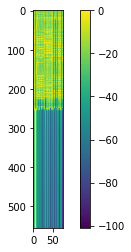

-------------------------------------------------------------------------------------------------------
09-22 14:31:15
09-22 14:33:53
Mean Train Loss: 0.011945850978520045
Train CER: 0.2993833009788304
09-22 14:34:07
Mean Evaluation Loss: 0.016743891941067155
Evaluation CER: 0.3533462636476562


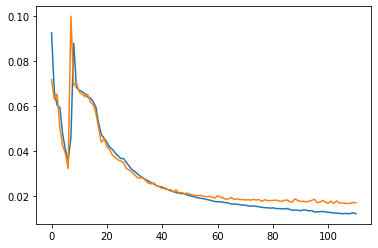

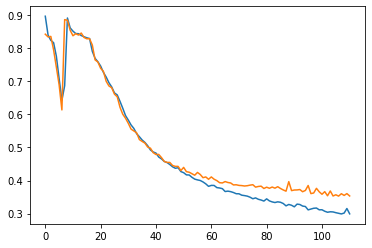

<s>아_______________ᆫᆫ_녀_ᆼ__에___ᄋ요______________  이___따____고_고ᅩ 아____세___ 버_____뭔_아___ᄋᆯ___져__ᆼ_으_ᆫᆫ_데_________________________  _시__가__ᆫ__디_ᄋ____ᅡ__도_ 포__자__ᆼᆼ 예__야__ 가__느__________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

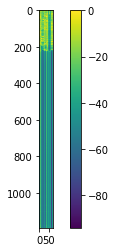

<s>아_____________________ _오_____느_ᆯᆯ  배__다__ᆯ_아__하____여______________________  다___ᄋ으_ᆷ_ 지___오___우__로___으_ᆯ 뫼___다_ᆯ_게___요ᅭ__호 하_는_다_________________________  배__다__ᆯ__가___낭_한_메___뉴___는ᆫ ᄀ궈__가_________________있ᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

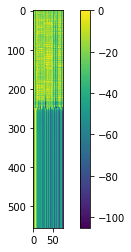

-------------------------------------------------------------------------------------------------------
09-22 14:34:08
09-22 14:36:37
Mean Train Loss: 0.011695972851522927
Train CER: 0.2944939899185731
09-22 14:36:53
Mean Evaluation Loss: 0.016390712599650702
Evaluation CER: 0.3571817726153377


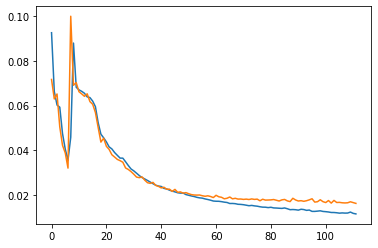

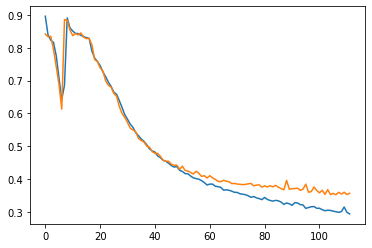

<s>세____________________이__ᆯ  메____ᆷ__버_____ᄉ시________ᆸ  카______드____ᅭ______________________  하__ᆯ_이_____ᅳ_ᆫᆫ   어____ᆯᆯ_마____나____________________________되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>세일 멤버십 카드ᅭ 할이ᅳᆫ 얼마나되나요?</s>
<s>*멤버십 카드요. 할인은 얼마나 되나요?</s>___


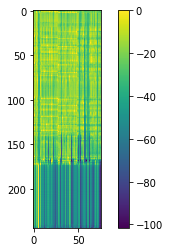

<s>아_____________ᆫ_녀_ᆼ하ᅡ___세___요____________________  *___아_ᆨᆨ  문ᆫ_이  하_로_고_ 저_ᆫ_화__드_려_ᆻᆻ느_ᆫᆫ_데___요ᅭ_______________________ _ᅩ____ᆨ___ᅵ____________ᅥ___ᆫ_ᄎ츠_이__ 도___요__이_____________ 더____ᆷ___ᅵ_ᆷ_에_  예_약_____ 가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

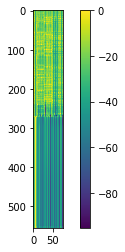

-------------------------------------------------------------------------------------------------------
09-22 14:36:54
09-22 14:39:26
Mean Train Loss: 0.01132954951388221
Train CER: 0.2912280791009315
09-22 14:39:40
Mean Evaluation Loss: 0.01637385186788239
Evaluation CER: 0.3492274500403164


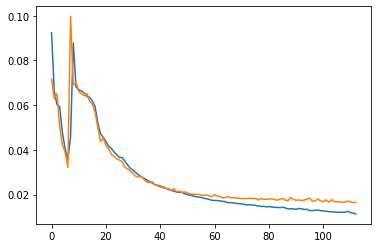

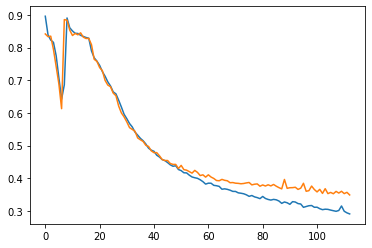

<s>아_______________ᆫᆫ녕ᆼᄒ하__세__요__________________________________  제__가_ ᄋ이___버__ᆫ__주___ ᄌᄌ___ᄋ일_일_   ᄋ예_ᄋ야_ᆨ_을 해ᅢᆻᆻ는ᆫ__데__요ᅭ_______________________________________   예__ᄋ야_ᆨᆨ___시____아_ᆫ_을_ 벼___ᆫ_겨__ᆼᆼ하__ᄅ려________________고요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>안녕하세요 제가 이번주 ᄌ일일 예약을 했는데요 예약시안을 변경하려고요.

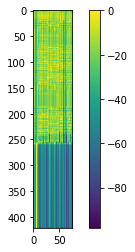

<s>여_________________ᆷ__마___ 이__ᆫ__대_____________헤_ᆼ  허___ᄀ우__드__ᆫ _거___이_ᆻᆻ_나_____요____________________________________  그_레_____ᅳᅳ__버___르____때___ 이____가_  ᄋ이_ᆻ___나____요___________________________________________  조____ᆫ___치_____개____뉴________  하___ᄂ네__ᄂ_ᆫ_ 서____ᄀ___________________ 있나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

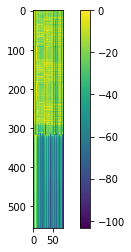

-------------------------------------------------------------------------------------------------------
09-22 14:39:41
09-22 14:42:20
Mean Train Loss: 0.011266363791701858
Train CER: 0.2867590964459641
09-22 14:42:34
Mean Evaluation Loss: 0.01686817305420151
Evaluation CER: 0.35386928759779457


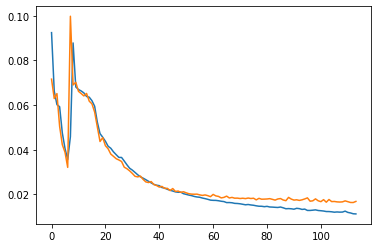

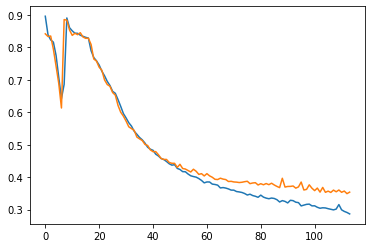

<s>아______________ᄋ우ᅮᆺᆺᆺ백ᆨ_에__서___  하__ᆨᆨ__새__ᆼᆼ 할ᆯ인ᆫ_이_ _되__는_지___구_ᆼ_그_하ᅡᆸᆸ나ᅡ__________________________________무__엇_스____ᆯ________  어___ᄄ떻ᇂ_게_  물엇__제_ᄋᆯ_______________ 건가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

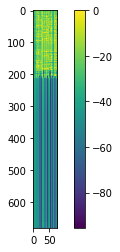

<s>조__________________기_____ᄋ야__ᆨ__으____________야________  식ᆨ__사_______  가___르_ᆼ_하____사___ᄋ________________________________________________  저____ᆫ__ᄌ*___메____가__ _서___ᄉ_ᆨᆨ___사___ᄒᄒ하_려__ᄂ느_ᆫᆫ_데_______________________________  예___ᄋ야_ᆨᆨ  아___ᆫ_하____고_  가___도_________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

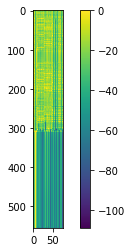

-------------------------------------------------------------------------------------------------------
09-22 14:42:35
09-22 14:45:03
Mean Train Loss: 0.012109497928930815
Train CER: 0.30268228607644104
09-22 14:45:17
Mean Evaluation Loss: 0.01742919251124175
Evaluation CER: 0.3641554252838495


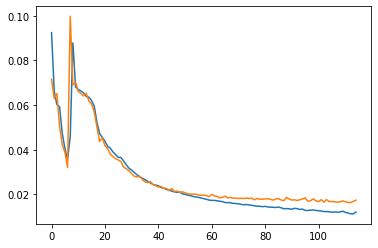

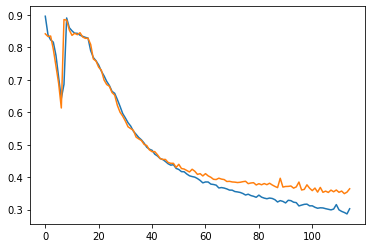

<s>호_______________ᆨᆨ_시____ 이_____야ᅣ___ᄋ___ᆺ 백ᆨ_ᄋ___서____드____고___아__느_ᆫ  주____차____자__ᆼ_가__ᆫ__ 기____기___ 시_____ 주___차____자__ᆼ_이_ᆫ__가___ᄋ요_______  다_____즈___ 시______주____차___자__ᆼ_______________________인가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>혹시 이야ᄋᆺ 백ᄋ서드고아는 주차장간 기기 시 주차장인가요 다즈 시주차장인가요?</s>
<s>혹시 이 아웃백에서 제공하는 주차장은 기계식 주차장인가요? 자주식 주차장인가요?</s>_


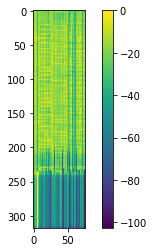

<s>아_______________리________ 주____차____를ᆯ 사___ᆯᆯ_고_ᆺᆺ_해___더___________  바___레___파____키_______ᆼ_으_ᆼ_구___즈__로_ 가____고_ 싶ᇁ으_ᆫᆫ_데________________________________ 고_____기__ _지___저___ᄀ르___ 바___레___파____키_ᆼᆼ_해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

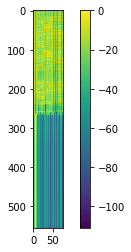

-------------------------------------------------------------------------------------------------------
09-22 14:45:18
09-22 14:47:46
Mean Train Loss: 0.011611759097320432
Train CER: 0.2912920417166025
09-22 14:48:01
Mean Evaluation Loss: 0.01653820989875574
Evaluation CER: 0.3516682284742956


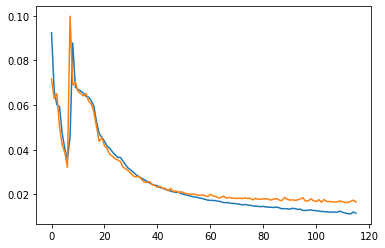

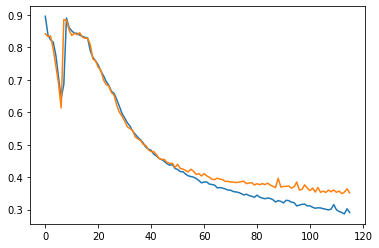

<s>지____________________그__ᆷᆷ  가___ᆫ_*___**_____며__ᆼ  저____ᆼ_도_____ _가___고  이_ᆻᆻ느__ᆫ__데______  가__ᇀ_으___ᆫ 자_____례__야____ᆫ_ 도__ 머__ᆨ_스______하__ᄅ___ 부____처_____주___주_ᆯᆯᆯ 수_______________________ 있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지금 간**명 정도 가고 있는데 같은 자례얀 도 먹스하ᄅ 부처주줄 수 있나요?</s>
<s>지금 한 **명 정도 가고 있는데 같은 자리에 앉도록 상을 붙여 주실 수 있나요?</s>____


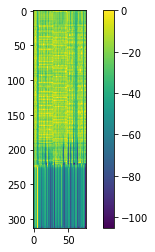

<s>아_______________웃ᆺ_백ᆨ__가_____타_____ᅡ_ 려_____하__ᆫᆫ 가___여___고__ᆺ_ 게____ 에___메_ ᄋ있느__ᆫᆫ_데__________________________  크_____처_____ 보___요___으__지___며_______ᆫᆫᆫ______________________   오____지____ 지____저___우_아__ᄋᄋᆯ 받ᆮ을  수_________________ 있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

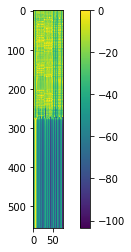

-------------------------------------------------------------------------------------------------------
09-22 14:48:02
09-22 14:50:36
Mean Train Loss: 0.011565618565560537
Train CER: 0.2937474489795918
09-22 14:50:50
Mean Evaluation Loss: 0.01690461298645356
Evaluation CER: 0.3499466079717567


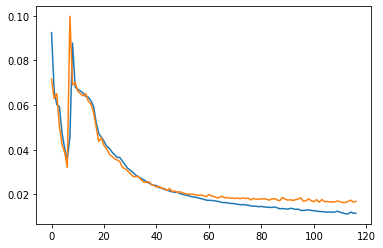

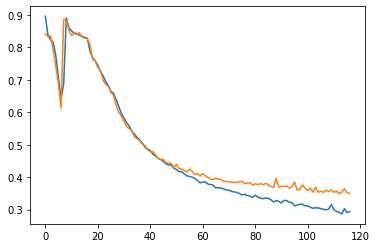

<s>**_____________________________________________하________시____가____ᆫ_ **_____애______________________ᆫ_______________  자_____리____라_ ____ᅮ___________________있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>*하시간 *앤 자리라 ᅮ있나요?</s>
<s>*시간뒤에 자리 있나요?</s>__________


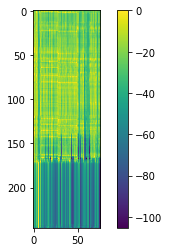

<s>아_____________ᆫᆫ녀_ᆼᆼ하___세___요____________________  예__야_ᆨᆨ _문ᆫ_의  하ᄅ로_고_ 저_ᆫ 화__드_러_ᆻᆻ느_ᆫ__데__ᄋ요________________________  오___ᆨ__시____________ᅥ__ᆫ___주_ᄋ___ 도___요_ᄋ요__ᄋ__________ 더____ᆫ__*ᅵ_ᆷ_에_  예_약ᆨᆨᄋ__ 가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

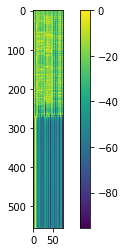

-------------------------------------------------------------------------------------------------------
09-22 14:50:51
09-22 14:53:29
Mean Train Loss: 0.011578788631790649
Train CER: 0.29490109702222456
09-22 14:53:44
Mean Evaluation Loss: 0.016964949842235483
Evaluation CER: 0.3537603242748491


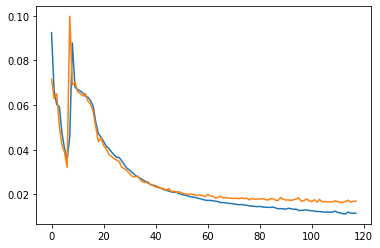

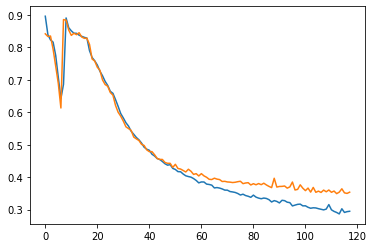

<s>이________________________모_____으___ᆫ_ 치_____ᆯ__무__ᆫ__에____애___ 사____라__하___시_ 아_ᆭᆭᆭ____느_______ᆫᆫ_______  하__ᆯᆯ이_ᆫᆫ_과______  바__ᆯ__려___ᆫᆫ__데______ᆫᆫ_  자____리___우__우___ᆫ  주_____ᆯ_무__ᆫ 으___ᆯᆫ해ᅢ___주_________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>이모은 칠문에애 사라하시 않는 할인과 발련덴 자리우운 줄문 을ᆫ해주세요.</s>
<s>위 모든 질문에 해당하지 않는 *할인*과 관련한 자유로운 질문을 해주세요.</s>________


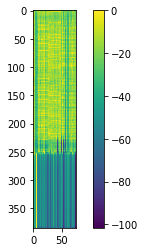

<s>아__________________니ᅵᆫ__다_____________________   그_러__ᆷ__지_____ᆨ 기____ᅵ__내____ᆫ 조___ᆷ__조_ᆫ_가_ _조_ᆷ__가_고__싶ᇁ_입ᆸ니___다_____________________________  그_리__고___시___라__ᆨ 수___차___ 바____무_ᆫ__수__ᄋ아_ᆯᆯ__________________________게요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

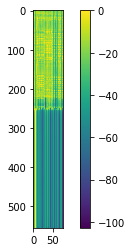

-------------------------------------------------------------------------------------------------------
09-22 14:53:44
09-22 14:56:15
Mean Train Loss: 0.011298765042745313
Train CER: 0.2887064586588235
09-22 14:56:29
Mean Evaluation Loss: 0.01625652078202672
Evaluation CER: 0.3499684006363458


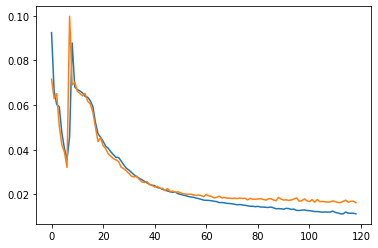

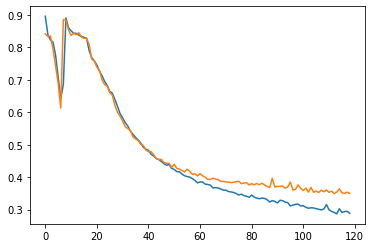

<s>냐___________________ᆼ__재____ᅧᆨ_ **_____버__ᆫ___추_ᆯ__구__로_ 나____와__ᆻᆻ느__ᆫᆫ_데______________________  ᄋ*_____기_에ᅦ__서__  어_____떻ᇂ_게_  가____야__ 하__나____요________________________  _ᅡ____ᄂ___ᆫ_기_______ ᄋ어____떠_ᇂ_게______________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>냥재ᅧᆨ *번출구로 나왔는데 ᄋ*기에서 어떻게 가야 하나요 ᅡᄂᆫ기 어떻게 되나요?</s>
<s>양재역 *번 출구로 나왔는데 여기에서 어떻게 가야 하나요? 가는 길이 어떻게 되나요?</s>____


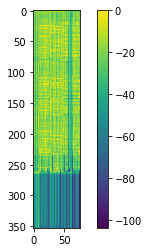

<s>아_______________웃ᆺ_백ᆨ__카_____타__ _하__려______하_ᆫᆫ 자___려___고_____게___ᅥ_ᄋ____메__ᄋ___느__ᆫᆫ_데__________________________  크_____처__ᄋ__ 도___요___외__지___며_______ᆫᆫᆫᆫ______________________  오____지___  치____저___우_ᄋ어_ᄋᄋ_ 받_을  수_________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

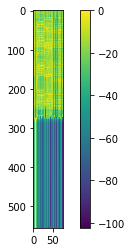

-------------------------------------------------------------------------------------------------------
09-22 14:56:30
09-22 14:58:58
Mean Train Loss: 0.011571408661140686
Train CER: 0.29067298206077974
09-22 14:59:13
Mean Evaluation Loss: 0.016807138985945717
Evaluation CER: 0.3531719223309434


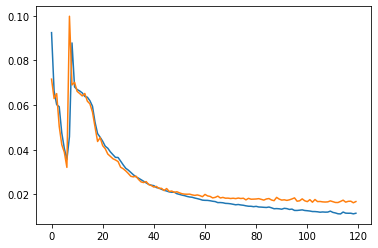

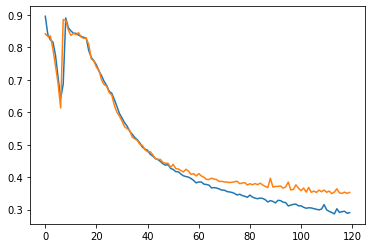

<s>하_______________________여______ᆫ_유_____에_________________   아__ᄋ우ᅮᆺᆺ__백ᆨᆨ__ 하_____에__ 해__ᆼ__사____가_____________________ 있나요ᅭ?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

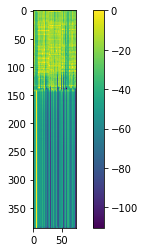

<s>아_____________ᆫ_녀_ᆼ_하___세___요____________________  예___약ᆨ_ 몬ᆫ_아  하ᄅ려_ᄀ고 저_ᆫ_화__드_려_ᆻᆻ느_ᆫ__데___요________________________ 어ᅥ______시_______ᅵ___어__ᆫᆫ__치_____ 더__ᆼ요__ᄋ이__________ᆯ_  저___ᆫ__시_ᆷ_에_  예ᄋ약ᆨ_이__가___느____________________ᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

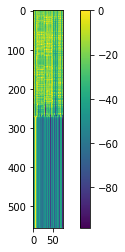

-------------------------------------------------------------------------------------------------------
09-22 14:59:14
09-22 15:01:46
Mean Train Loss: 0.012376517345515328
Train CER: 0.30654960634319356
09-22 15:02:00
Mean Evaluation Loss: 0.016602730042879873
Evaluation CER: 0.3532373003247107


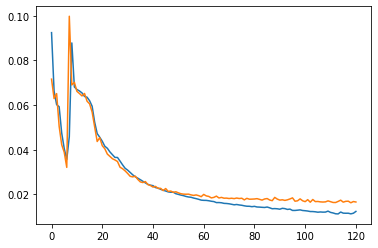

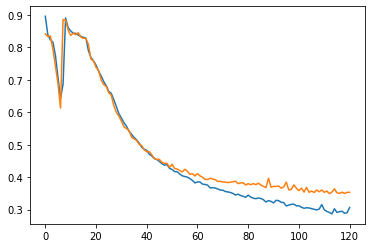

<s>네___________________________________  그______ 고____ᆯ__두_____코_____스_ᆸ____으_________________________  코____포____ᄌ____시___느__ᆷ__브___도_____개______느________ᆯ__ 지____소___ 하_______고________ 지_____으__ᆫ_의_  바____이___보____ _여_____개_____로__ 바__ᇀ__꼬_ᆯ_ 수___________________ 있나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

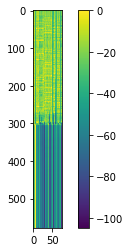

<s>ᄌ___________________지_____아___ᆨ__으______헤___야_________ _식ᆨ__사_______  하___능ᆼ하__ᆫ__가___요_??____________________________________________  저____ᆫ__수_ᆫ_매___가_____서___ᄉ_ᆨᆨᆨ__사___ᄒ하__려__느__ᆫᆫ_데_______________________________  예___ᄋ야_ᆨᆨᆨ 아___ᆫ하_____고_  가___으___ᄉ_____________ 되_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

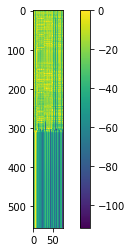

-------------------------------------------------------------------------------------------------------
09-22 15:02:01
09-22 15:04:38
Mean Train Loss: 0.011453070356995013
Train CER: 0.28933859946084883
09-22 15:04:53
Mean Evaluation Loss: 0.016776914250517614
Evaluation CER: 0.3465905376250354


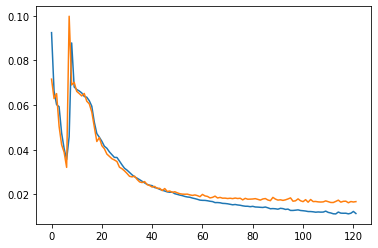

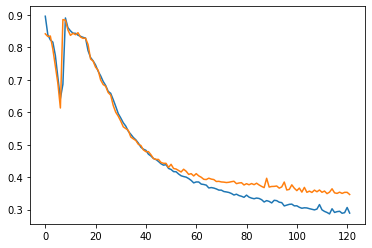

<s>다_________________으ᅳᆷ_ 주_ 워_ᄋᄋ요_ᄋ이__ᆯ **_____시__에_____________   ****___며_ᆼᆼ 예_야___해_ᆻᆻᆻ느_ᆫᆫ__데___  호ᅩ__ᅩᅩ__시________  ***______세____여_ᆼ_으_로____ ᄋ이_워__ᆫ 여__ᆫ_겨_ᆼᆼ_이  가ᅡ__느___ᅡ_______________ᆼ핱나요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>다음 주 워요일 *시에 *명 예야했는데 호ᅩ시 *세영으로 이원 연경이 가느ᅡᆼ핱나요?</s>
<s>다음주 월요일 *시에 **명 예약했는데 혹시 **명으로 인원 변경이 가능한가요

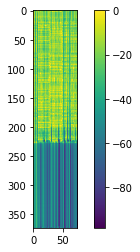

<s>아_______________리___ᄋ____ 추____ᄎ차___늘ᆯ 사_하ᅡᆯ_그_ᆺ__배____서__________  바___레___파____키_ᆼ__애_ᆻ_느_ᆫ_고_ᆺ_스__로_ 가____고_ 싶ᇁ으_ᆫᆫ_데_______________________________   고____이__ _지___저__ᆷ_오___ 바___레___파____키_ᆼ__해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

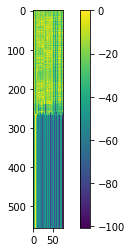

-------------------------------------------------------------------------------------------------------
09-22 15:04:53
09-22 15:07:19
Mean Train Loss: 0.011156484417928684
Train CER: 0.28570220594829643
09-22 15:07:34
Mean Evaluation Loss: 0.016555270079693853
Evaluation CER: 0.35432693355416567


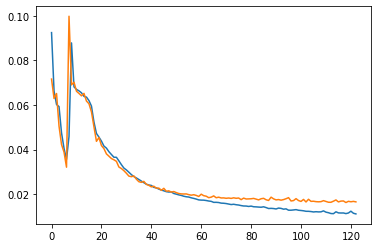

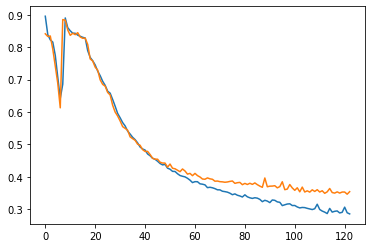

<s>재__________________거_______ 사___ᄋ인  코_ᆨ_____ᅩ__느_ᆯ _서____다___다____버_ᄋᆻᆻᆻ느__ᆫ__데___________________  어ᅥ__ᆫᆫ_데____까___지_  쓰_ᆯ_ 수___느_ᆫ__졔 할ᆯ 수   ___이_______________ᆻᆻ을까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

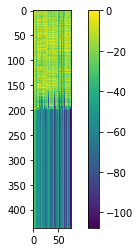

<s>아_____________ᆫᆫ녀ᅧᆼ하____세___요____________________  예__약ᆨᆨ__ 믄_에 하_ᄅ려_고_ 저_ᆫ_화__드_려_ᆻ느_ᄂᆫ__데__요ᅭ________________________  _ᅩ_______ᅵ__________러___ᆫᆫ__주______도____ᅭ__으_____________ 더____ᆫ__드___데_ 예ᅨ_약ᆨ_ᅵ_  가___느___________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

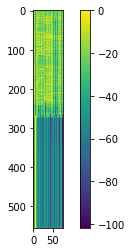

-------------------------------------------------------------------------------------------------------
09-22 15:07:34
09-22 15:10:03
Mean Train Loss: 0.011047974207435472
Train CER: 0.28252376544945973
09-22 15:10:18
Mean Evaluation Loss: 0.01681296583574436
Evaluation CER: 0.3485082921088761


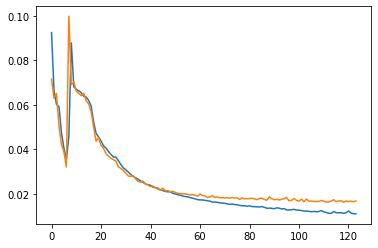

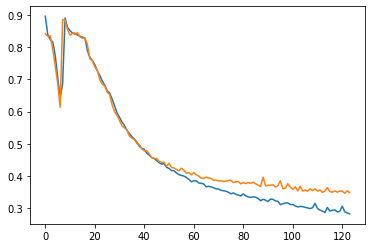

<s>이______________________리_____ 모____드__ᆫ__ 지______무_ᆫᆫ_에_____해_ _다__ᆯ_하__ᆫ__지  아___ᆽ__느__ᆫᆫ__여_____ᅩᆸ___시__가_ᆫᆫᆫ__과_______가____ᄂ_ᅡ___ᆫ_마____ᆫᆫ__ 자_____리___러_____ᆫ_  지______무_ᆫᆫ해_ᆯ _해___주_____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>이리 모든 지문에해 달한지 앚는여ᅩᆸ시간과가난만 자리런 지문핼 해주세요.</s>
<s>위 모든 질ᄆ

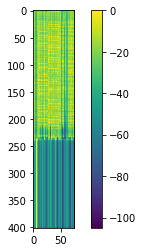

<s>저_________________구__에__ 바___로_가__도_인 _근_ 대___핬ᆻᆻ느_ᆫ__데______________  이_ᆻ_때__ᄒ__ 가__는  하___리_이_ᆫ_ _도__문_드__ᄋ어ᄋ앉_무__우__ᆯ 수___ᄀ____주______________________________________________________세요_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

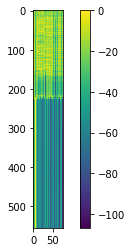

-------------------------------------------------------------------------------------------------------
09-22 15:10:19
09-22 15:12:50
Mean Train Loss: 0.011017099779335926
Train CER: 0.28508894999719403
09-22 15:13:03
Mean Evaluation Loss: 0.016617149503883807
Evaluation CER: 0.34600213568112975


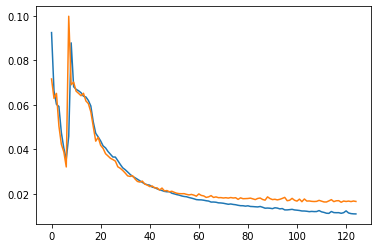

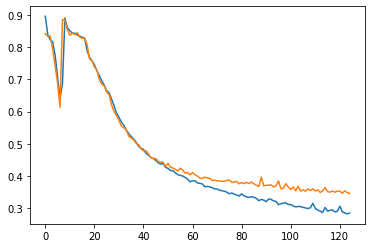

<s>그_________________이____ 지_______자_______ᆷ  여__ᆼᆼᆼ업ᆸᆸ__시____가____ᆫ_이____  어______ᄄ떠_ᇂᇂᇂ_게____________________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>그이 지잠 영업시간이 어떻게 되나요?</s>
<s>그 지점 영업시간이 어떻게 되나요?</s>________


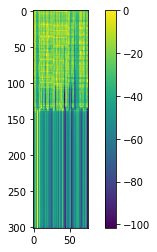

<s>아___________________니___사___________.__________ _그_러_ᆷᆷ__지_______세_____ᆼ_네____ᆼ_조___ᆷ__주___가_ 조__ᆼ__가__ᅩᅩ_싶__읍ᆸ_니__다____.._______________________  그_리__고___제___라___ 수___사___ 바___무__ᆫ__소__아_ᄒᆯᆯ__________________________께요._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

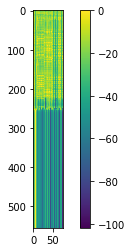

-------------------------------------------------------------------------------------------------------
09-22 15:13:04
09-22 15:15:43
Mean Train Loss: 0.011093606580793919
Train CER: 0.28577502232070284
09-22 15:15:57
Mean Evaluation Loss: 0.016787144276873812
Evaluation CER: 0.3490966940527818


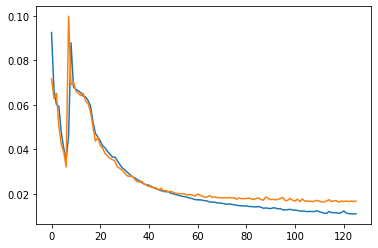

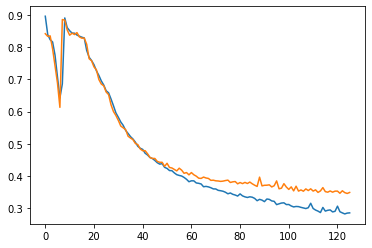

<s>새_________________ᆼᆼ_일ᆯ 하_ᆯ_이___ᆫ 부_____포__ᆫ_으__ 바_____나__ᆻ느___ᆫ__데________________  마___ᆯᆯ__자_____ 기__러__ᆫ__도_ᆼ 하_____ᆫ__고_____가______ᆻ_느___ᆫᆫ__데_______  겨_____ᆫ__저____으_ 아___ᆫ___________________ 되_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

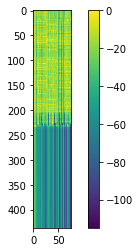

<s>아________________게___ 즈____자___라________ _자___ᆯ 요___때____사________________________  바___레___파____키_ᆼᆼ_ᄋ__ᆼ 디___느_ᆫ 고_ᆺ_도__오__ 가___고__ 싶으ᅳᆫᆫᆫ_데_________________________  거____기_  디__저___에___이__ᆫ_____  바___레__ 파___키_ᆼ_ᆼᆼᆼ_  수_ _주___ᄉ___________________________________ᅵ_나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

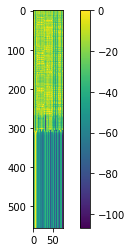

-------------------------------------------------------------------------------------------------------
09-22 15:15:58
09-22 15:18:27
Mean Train Loss: 0.011203464943819914
Train CER: 0.2862643529751662
09-22 15:18:42
Mean Evaluation Loss: 0.016948292634958992
Evaluation CER: 0.357465077254996


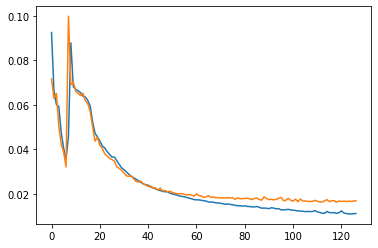

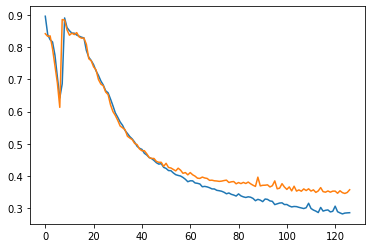

<s>다_________________레_____ᆫ__타____이_ᆫ___대___이__ᆸ_마_____ 해__ᆫ___사___하__는_게____________________ 있나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

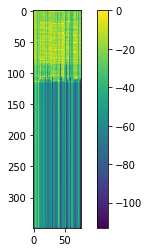

<s>아_____________ᆫᆫ녕ᆼ하ᅡ___세___요____________________  예__야_ᆨᆨ_  믄_이 하_려__고_ 저_ᆫ_하__드_려_ᆻ느ᅳ_ᆫ__데__ᄋ요________________________ _ᅩᅩ_______ᅵ_________ __ᅥ__ᆫᆫ__주_ᄋ___ 도___요__이__ᄋ________ᆯᆯ 더____ᆫ___ᅵ_ᆷᆫ에_  예ᅨ약ᆨ___ _가___느___________________ᆼᆼ한가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

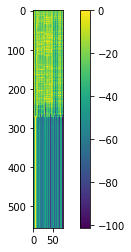

-------------------------------------------------------------------------------------------------------
09-22 15:18:42
09-22 15:21:10
Mean Train Loss: 0.010945761431583621
Train CER: 0.2805103777841585
09-22 15:21:26
Mean Evaluation Loss: 0.016580783833267103
Evaluation CER: 0.34214483404885915


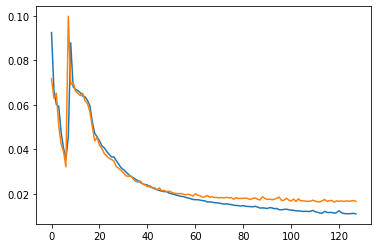

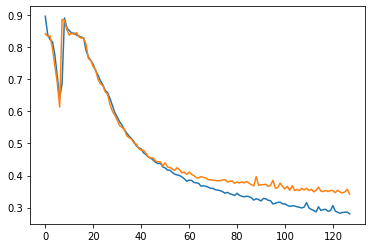

<s>저___________________ᆼ__하____카____디_______ 다______시____  마__ᆯ__쓰___해___주________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>정하카디 다시 말쓰해주세요.</s>
<s>정확하게 다시 말씀해주세요.</s>___


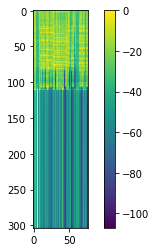

<s>아_______________웃ᆺ_백ᆨ__가_____타__ 하___려___ᅡ_나__ᆫᆫ_가___려___고__ᆺ__포___ᅥ_이____에_ᄋ이_느__ᆫᆫ_데___________________________ 크_____처_____ 도___르___으__시__ᄂ느_______ᆫᆫᆫᆫ______________________  오____지___ _치____주___으_라__이_ 받ᆮ늘  수_________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

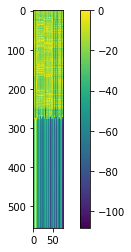

-------------------------------------------------------------------------------------------------------
09-22 15:21:26
09-22 15:23:59
Mean Train Loss: 0.011244978588756765
Train CER: 0.2919231666379319
09-22 15:24:13
Mean Evaluation Loss: 0.016475103055223518
Evaluation CER: 0.34286399198029943


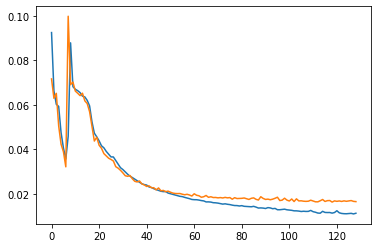

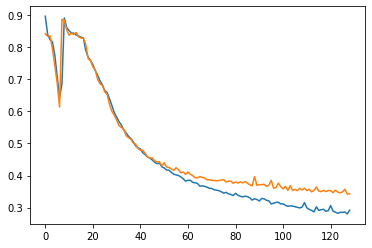

<s>사________________차____요_ᆼ__그__ᆼᆼ_음________________ᆫᆫ  파___료____________________인가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>사차용긍음ᆫ 파료인가요?</s>
<s>주차요금은 무료인가요?</s>_________


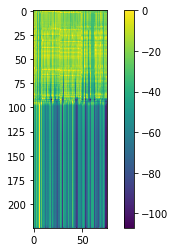

<s>아________________기____즈____차___르___ᆯ____ _ᅡᅡ__ᆯᆯ 이___때____사________________________  하__레____파____키_ᆼᆼᆼᆼ__ᆼ  이__느_ᆫ_곳ᆺ_도__오_  가____고_ 싶으__ᆫᆫ_데_________________________  거____지_  기___저___으______ᆫ_____  바_ᆯᆯ레___파___키_ᆼᆼᆼᆼᆼ_  수____ᅲ____ᄉ__________________________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

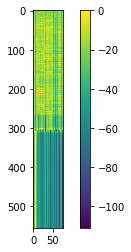

-------------------------------------------------------------------------------------------------------
09-22 15:24:14
09-22 15:27:21
Mean Train Loss: 0.010967488169629211
Train CER: 0.29041364770882305
09-22 15:27:41
Mean Evaluation Loss: 0.016893175972696423
Evaluation CER: 0.36090831826007364


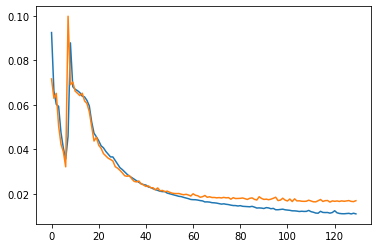

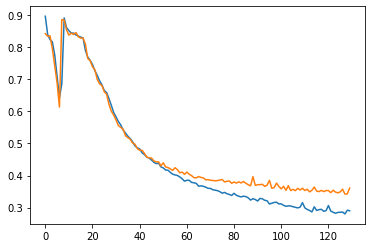

<s>저__________________ᆷᆷ___시_ᆷᆷ__시____가___ᆫ_으_____   차____ᄅ___ᆯᆯ  _가_____이___고__ 가___려_____고 ᄒ하_ᄂ느__ᆫ__데_____________________________ 차___자___ᆼᆼ_과______문_에______  부___차_____고__ᆼ__가___ᆫ__ᅵ__ᅵᆻᆻ으_____가_____요_______________________________________   구___ᆫ__처____헤____에________ 주_____차___ᄒᄒ___고___시__ 가____다___ᆫ_  지__가ᅡ________________________________ᄌᄌ죠?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

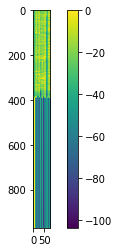

<s>저__________________버___ᆫ_으___ 자______리__가__  조___고_ᆷ 그__ᆯᆯ__사__ᆫ_해__ᆻᆻ느__ᆫ__데_____________________따___가___  가____며_ᆼ__하___ᆫ_ 자____이ᅵ__ 조____ᆷ_ _좋ᇂ_ᄋ____ᆫ__데__로________________________  아___ᆫ__나__해__ 주___시__ᆯ_ 수_ 이__즈____________________세요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

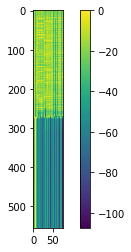

-------------------------------------------------------------------------------------------------------
09-22 15:27:42
09-22 15:30:14
Mean Train Loss: 0.011036372977987834
Train CER: 0.29048578196094876
09-22 15:30:28
Mean Evaluation Loss: 0.01615528942789536
Evaluation CER: 0.344084381197289


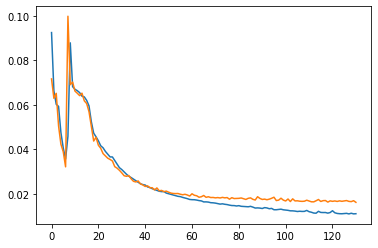

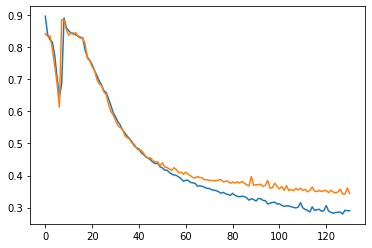

<s>어________________ᆼ__시____라________예________시______드__이_ 쿠_ᆫ_구_ᆼ_ᅩ____디___이_ᆫ_온_이__ᆫ_데_____________________  고____포___ᆫ__꼬_ᆫ_아_____이___사____ᅡ_ᆼ_ _추___부_ᆫ__거_ᆫ_에____되___________________  _치____붜___붜____하_______츠______  _하_ᆯᄋ이_ᆫ__ ᄀ가_______가__ᄋ_______하_______________________ᅵᆻᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

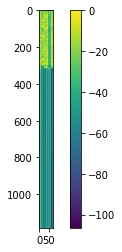

<s>아________________기___ 주____차___라___ᆯ ᄋ__ _사__ᆯᆯ 오___때____서________________________  가__레____파____키___ᆼ___ᆼ _메__느__ 고___다__고__ 가___고__ 싶으__ᆫᆫ__데________________________  거____기_  기__저_ᆫ__는_____ᆫ_____  따___레___파___키___ᆼᆼᆼ__  스___주___ᄉ__________________________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

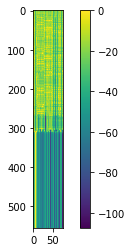

-------------------------------------------------------------------------------------------------------
09-22 15:30:29
09-22 15:32:56
Mean Train Loss: 0.01077236406843163
Train CER: 0.2807185049394032
09-22 15:33:12
Mean Evaluation Loss: 0.016863280396362736
Evaluation CER: 0.34554448972475865


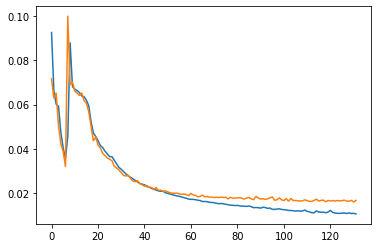

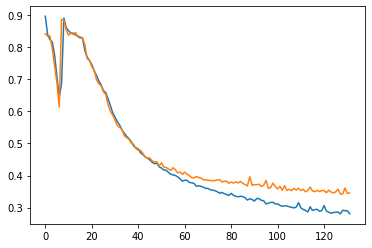

<s>최___________________소_하_ᆸ_니_다_____._____________   그____다_ᆯ_ᄋ에  _ᅨᅨ야ᅣᆨᆨ__ 벼__ᆫ_겨_ᆼᆼ하__ᄅ__ 고 하ᅡ_는ᆫ_데________________________  오___느__가__으_ᆫ 메____ᅵ__  저___역__하___느___ᆫ_  가____느______________________________________________________ᆼᆼ한가요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>최소합니다. 그달에 ᅨ약 변경하ᄅ 고 하는데 오느가은 메ᅵ 저역하는 가능한가요?</s>
<s>죄송합니다. 급하게 예약 변경하려고 하는데 오늘 말고 내일 저녁은 가능한가요?</s>_____


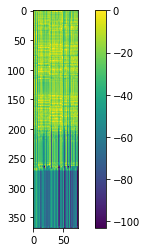

<s>거_______________________고_____느__ᆯᆯ _데__다_ᆯᆯ_려______ᄂᄂ___아___________________ 다___ᄋ으_ᆷ__주__ 오___우__료___이_ᆯ__느__다_ᆯᆯ_____여___호 나ᄂᄂ___다________________________   새___다_ᆯ  가___라_ᄒ하_ 메___뉴__ᄂ느_ᆫ _모___마________________있ᄌᄌ죠?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

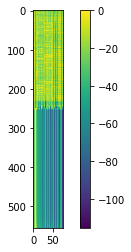

-------------------------------------------------------------------------------------------------------
09-22 15:33:12
09-22 15:35:44
Mean Train Loss: 0.010913537080849207
Train CER: 0.28297465120948784
09-22 15:35:58
Mean Evaluation Loss: 0.016247188752064063
Evaluation CER: 0.33641336326192606


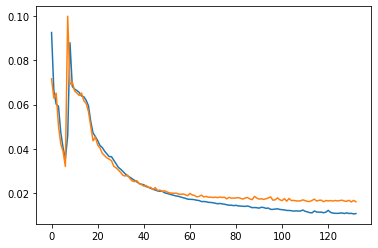

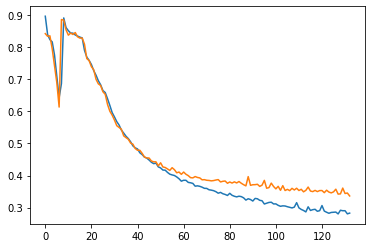

<s>다___________________ᄋ음__주__ 워___요_ᄋ이_ᆯ **_____시___에____________   ***____며__ᆼ 예ᄋ약__했ᆻᆻᆻ느__ᆫ__데____  호_ᆨ__ᅵᅵ___________  ***____시_____며_ᆼ_으_ᄅ_____  이__워_ᆫ 벼__ᆫ__겨_ᆼ_이  바___그__가_ᆫ_________________나요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

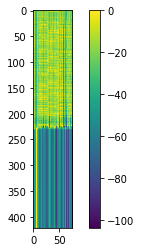

<s>저__________________버___ᆫ_이___ 자______리__가___ 조___오_ᆷ 으___ᆯ__타__ᆫ_해__ᆻᆻ느__ᆫ__데____________________ _대___다____가_____명ᆼᄒ_____ᆫ_ 다_____리__ _조___ᆷ___조___ᄋ우__ᆷ__데___로_______________________  아___ᆫ__닐_래___주___시_ᆯᆯ__수_ 이__으____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

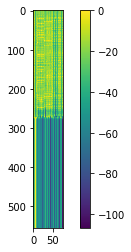

-------------------------------------------------------------------------------------------------------
09-22 15:35:59
09-22 15:38:37
Mean Train Loss: 0.010634101563814126
Train CER: 0.27850695230192857
09-22 15:38:51
Mean Evaluation Loss: 0.016844392528210465
Evaluation CER: 0.3485082921088761


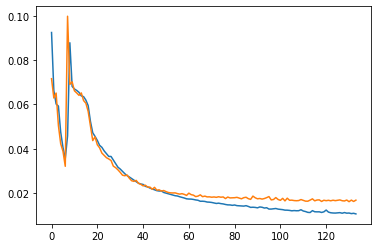

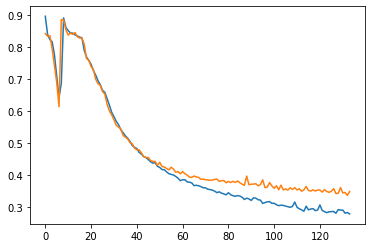

<s>새________________ᆼᆼᆼ일ᆯᆯ_하_ᆯᆯ이___ᆫ 우_____포__ᆫ_으__ 다_랃_가__ᆻ느___ᆫᆫ_데________________  나___ᆯᆯ__자_____ 기__하__ᆫ__도_ᆼ 하_____ᆫ _보__ᆮ___가_______느___ᆫᆫ__데_______   여____ᆫ__저___ᄋ으_ 하___ᆫᆫ_________________ 되ᅬ_나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

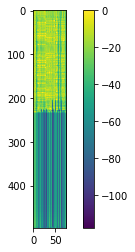

<s>네____________________________________________  미____버___ᆫ_으__ᆯ_____________ 미____오___ᆯ_ 시____느____느_ᆯ_로___  여____ᆫ__마___으______스__있_크___가____스___느___느_____ 소_______려_ᆫ__가__고_  가_____느_ᆫ__데___________________________   호_ᆨᆨ__시________   이____이___추____시__게____________________여_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

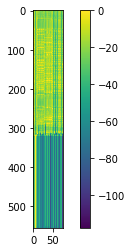

-------------------------------------------------------------------------------------------------------
09-22 15:38:52
09-22 15:41:19
Mean Train Loss: 0.011093079588868841
Train CER: 0.288595899855974
09-22 15:41:34
Mean Evaluation Loss: 0.016903047529229564
Evaluation CER: 0.3526271057162159


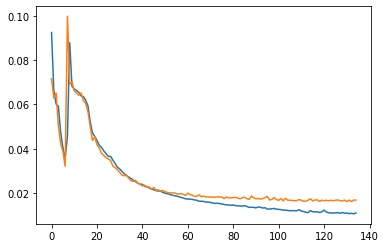

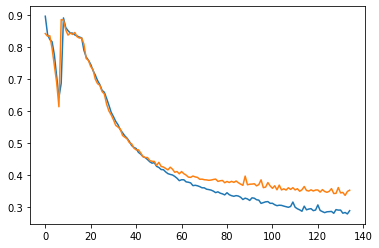

<s>지________________________ᆫ__비____________ _바_____이____  파__ᆫ_이_____까___________ 코_______포___ᆫ_ 스___터____ᆫ__데__________________________  ᄋ이__버__  포_____자____ᆼ_________________되요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>진비 바이 판이까 코폰 스턴데 이버 포장되요?</s>
<s>신규가입하니까 쿠폰주던데 이거 포장되요?</s>_


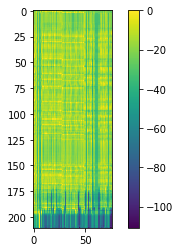

<s><s>ᅩ__________________지______야ᅣ_ᆨᆨ_으____________야________  식ᆨ__사_____ᅡ_  가___느_ᆼ하__ᆫ_나_____요______________________________________________  저____ᆫ__추___메____가____서__ 식ᆨᆨ__사___ᄒ하__려___느_ᆫᆫ_데_______________________________   예__ᄋ야ᅣᆨᆨᆨ  아__ᆫ_아____고_  가___이________________ 드__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

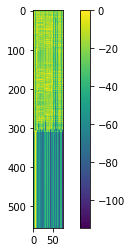

-------------------------------------------------------------------------------------------------------
09-22 15:41:34
09-22 15:44:02
Mean Train Loss: 0.010581330466693795
Train CER: 0.2769164043655695
09-22 15:44:18
Mean Evaluation Loss: 0.016864057327387025
Evaluation CER: 0.3472879028918866


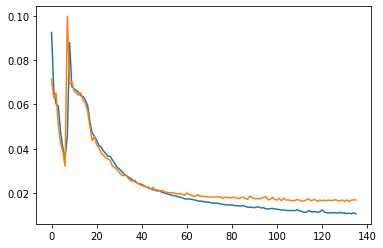

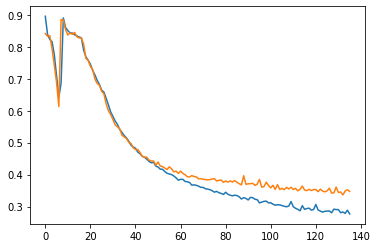

<s>여_____________________ᅥ___븐_으____ᆫ_ 아___ᄋ우ᅮᅮᆺ_백ᆨ_에______며___ᆼᆼ_주_______  지____저___아___여_________  에__야__ᆨᆨᆨ 하___궈___가__________  다____ᆫ___체__  예__ᄋ약ᆨᆨ_을ᆯ 하__고_ 자________________ 하_ᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

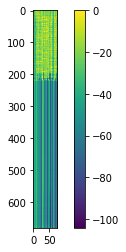

<s>저________________ᆫ환_네__ 파__르__라_ 드___ᆫ _그__ 타__나_ᆻᆻᆻ느_ᆫ__데______________  이__ 따__아_ 가__는  자___리_아_ᆼ_ 초__ᄋ운_들_아 앉ᆫ_내__게__  수________수______________________________________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

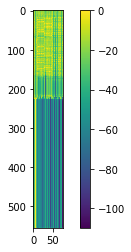

-------------------------------------------------------------------------------------------------------
09-22 15:44:19
09-22 15:46:52
Mean Train Loss: 0.010715876676959455
Train CER: 0.28047620984553434
09-22 15:47:05
Mean Evaluation Loss: 0.016520818394788916
Evaluation CER: 0.3537821169394382


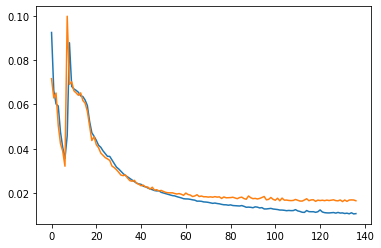

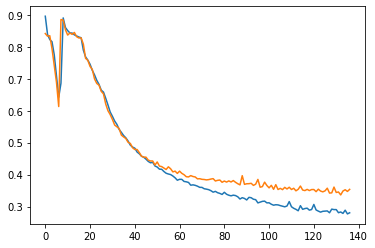

<s>주_____________________차____요______그___ᆫ__으_____ᆫ ᄆ무__무_료________________________이_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>주차요근은 무무료인가요?</s>
<s>주차요금은 무료인가요?</s>_________


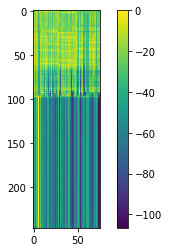

<s>여_________________ᆷ__마__ᆯᆯᄋ이_ᆫ__데_____________해___ 사____우__으__ᆫ _거____있__나____ᄋ요__?__________________________________ 그_레____ᄋ____서___으____테_____이_ᆻ_그_ 아_이ᅵ___나___ᄋ요____________________________________________ 저___ᆫ___치_____해___ᆫ_네_________ 하___므_ᆫᄒᄒ____사____가_________________ 이_ᆻ나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

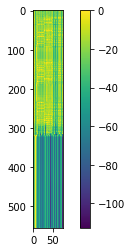

-------------------------------------------------------------------------------------------------------
09-22 15:47:06
09-22 15:49:45
Mean Train Loss: 0.010542374933039677
Train CER: 0.2780083297257759
09-22 15:49:59
Mean Evaluation Loss: 0.017063263844443847
Evaluation CER: 0.3499466079717567


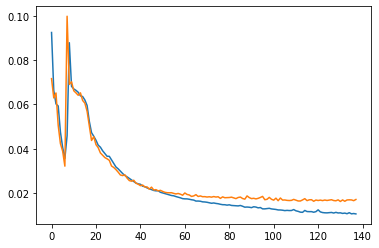

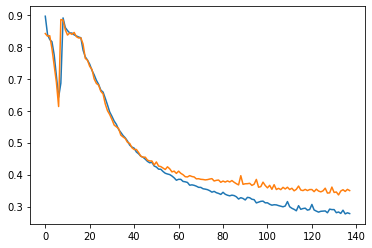

<s>시_________________케_____코________ 도___ᆼ___처____인__더___로___ᆼ_ 포___스_____하__ᄉ____파___ᄉ_____트________________________________________________ 아_________ 하___ᆸ_니___다_______________  패_ᆼᆼ_앙ᆼ_ᄋᆼ_ 포____자_ᆼᆼ애___라____꼬_______  패___자______파____솨____가__ᆯᆯᆯ_________________에요._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>시케코 동처인더롱 포스하ᄉ파ᄉ트 아 합니다 팽앙ᄋᆼ 포장애라꼬 패자파솨갈에요.</s>
<s>수지구 동천동 풍림아파트..아 아니다. 그냥 포장해 놓고 제가 찾으러 갈께요.</s>___________


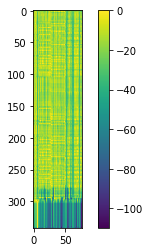

<s>아_______________기___이___ 추_____차___흘ᆯ 사_____고_____해____서__________  바___레___파____키__ᆼ_이_ᆼ_드_ᆼ_고_ᆺ_스__로_ 가____고_ 싶ᇁ으_ᆫᆫ_데_______________________________   고____기__  치___저__ᆼ고____ 바___르___파____키_ᆼᆼ_해__ 주___ᄉ__________________나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

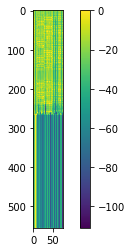

-------------------------------------------------------------------------------------------------------
09-22 15:50:00
09-22 15:52:28
Mean Train Loss: 0.010773883705954059
Train CER: 0.2809729114129993
09-22 15:52:43
Mean Evaluation Loss: 0.016450585741803258
Evaluation CER: 0.3441715518556454


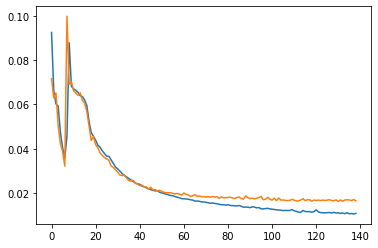

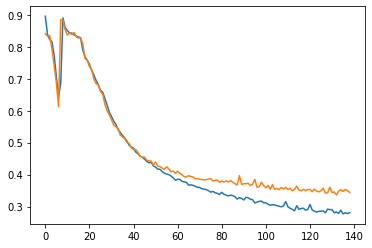

<s>*ᅣ___________________ᆫ__재___ᄋ_ᆨ  **_____거__ᆫ__추__ᆯ__고__로_ 나____와__ᆻᆻ느__ᆫᆫ_데______________________   여_____에_____서__  어_____떻ᇂ_게_  _가___ᄋᄋ야_하___ᅡᅡ___ᄋ요_______________________  가____녀___ 으______   어____떻ᇂᇂ게_____________________ 되__나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

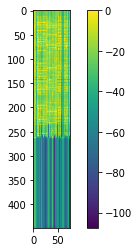

<s>아_________________ᆸᄂ니___다___________.__________  그ᄅ러__ᆷ__지_______대_____ᆼ_해____ᆫ_조___ᆷ__주_ᆫ_가_ _주_ᆼ__가_고ᅩ 싶ᆨ_읍ᆸ_네__다_____________________________  그___ᆯ_고___지___아___ 우___자___ 바__ᆼᆼ무_ᅢ__수_가ᅡ_할__________________________게요._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

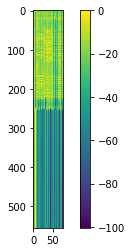

-------------------------------------------------------------------------------------------------------
09-22 15:52:43
09-22 15:55:13
Mean Train Loss: 0.010501815376263225
Train CER: 0.27380770016339867
09-22 15:55:28
Mean Evaluation Loss: 0.01631814386167504
Evaluation CER: 0.3421230413842701


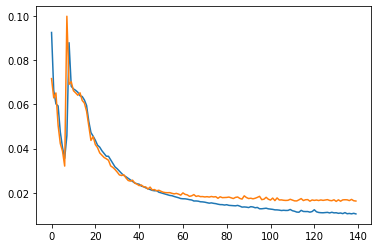

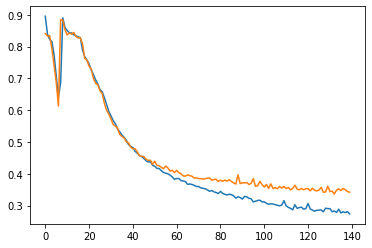

<s>네_____________________________   고___마____스__ᆸᆸ_니___다____...._________________  _시____가__ᆫ__마__ᆽ___처____  가___게__ᆻᆻᄉ스_____________________ᆸᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 고마습니다. 시간맞처 가겠습니다.</s>
<s>네 고맙습니다. 시간맞춰 가겠습니다.</s>_____


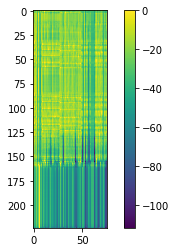

<s>아_________________ᆸᄂ니___다______________________  그ᄅ러__ᆷ__기_____ᆨ_기___이__내____ᆫ__도_____시___가_ _조____마_고__ᄋ싶_습ᆸ_니__다_____..______________________  그_____고___지_ᆯ_라___ _우__자___ 가__ᆼ_무_ᆫ__수__가__아___ᅵ______________________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

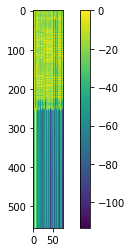

-------------------------------------------------------------------------------------------------------
09-22 15:55:29
09-22 15:58:00
Mean Train Loss: 0.010503164414299309
Train CER: 0.2771812199938495
09-22 15:58:14
Mean Evaluation Loss: 0.016526508862234415
Evaluation CER: 0.34475995379955104


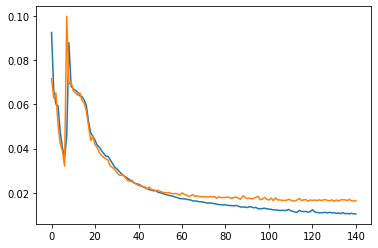

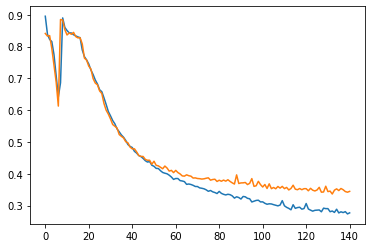

<s>예___________________ᄋ약ᆨᆨᆨ__하______고_____도_________  마___ᆭ__ᆫ__ 이___따___리___드_________________________________ 되__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>예약하고도 많ᆫ 이따리드 되나요?</s>
<s>예약 하고도 많이 기다리게 되나요?</s>___________


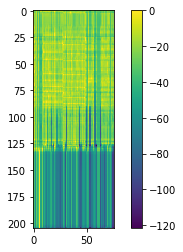

<s>아_______________리________ 추____차____를ᆯ 사_____도__ᆺ__해____서__________  바___레___파____키__ᆼ_이_ᆻ_느_ᆫᆫ고_ᆺ_즈___ᅩ_  가__ᆷ고_ 싶ᇁ으_ᆫᆫ_데_______________________________   고____이__ _치___저__ᆷ_으___  바__르___파____키_ᆼ_ᄒ해___주__ᄉ________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

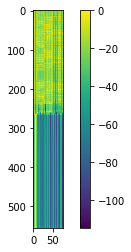

-------------------------------------------------------------------------------------------------------
09-22 15:58:15
09-22 16:00:54
Mean Train Loss: 0.010564822891539271
Train CER: 0.27768617306555377
09-22 16:01:08
Mean Evaluation Loss: 0.01686967581750472
Evaluation CER: 0.353520604964369


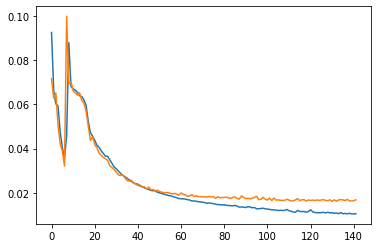

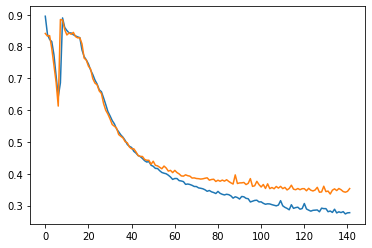

<s>아_______________ᆫᆫ녀_ᆼ__하____세___요______________________  여_ᆼ_어_ᆸᆸ_시___가_ᆫ_ 아______혀_____느__저_______  무_ᆫ_이__디__리_ᆸ_니__ᄃ다______________________    주____마__ᆯ_에____느__ᆫᆫ 며_ᆾᆾᆾ_시____ᄋ에  오_____픈ᆫ하__ᄉᄉ_____________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>안녕하세요 영업시간 아혀느저 문이디립니다 주말에는 몇시에 오픈하시나요?</s>
<s>안녕하세요. 영업시간 관련해서 문의드립니다. 주말에는 몇 시에 오픈하시나요?</s>______


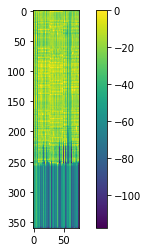

<s>지________________그___ᆷ  바___로___  다___ᆫ__체___로_____들러ᅥ__가__ᄂ느_ᆫ_게____ 가___느_ᆼ_하__ᆫ___지_____________________________________   무__ᆫ_이___ᆫ_아______브___ᅢ___  포_ᆨ__어____ᆫ_자___르__ 마___나__ᆷ_마_____으ᅳ__ᆫᆫ__지____  구__ᆼ_금_____________________하_ᆸ니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

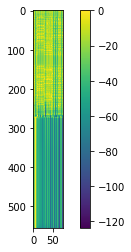

-------------------------------------------------------------------------------------------------------
09-22 16:01:09
09-22 16:03:36
Mean Train Loss: 0.011039290864822969
Train CER: 0.28744270564252394
09-22 16:03:51
Mean Evaluation Loss: 0.016572789116769977
Evaluation CER: 0.3536731536164927


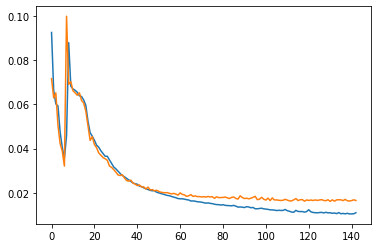

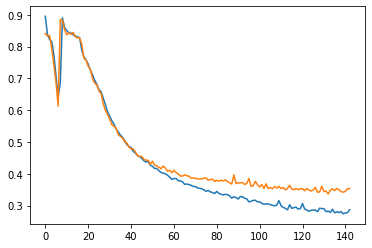

<s>모__________________ᆫᆫ__저____에____도__  여__ᆼᆼᆼ업ᆸᆸ_ᄒ하___ᄉ____________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>몬저에도 영업하시나요?</s>
<s>명절에도 영업하시나요?</s>________


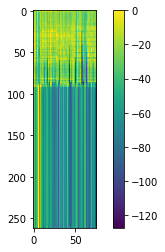

<s>지________________그___ᆷ_ 마___로___  다___ᆫ__체___로____ 드_어ᅥ__가___느_ᆫ_게____ 가___느_ᆼ_하_ᆫᆫ___지_________ᆫᆫ___________________________  무_____ᅵ_____하_____그_____ᅢ___ 포_ᆨ__저_____ 자___리__ 마___나__ᆷ 마____ᄋ으___ᆷ___지____ _구__ᆼ_금_____________________하_ᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

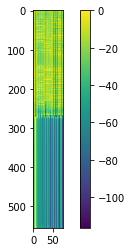

-------------------------------------------------------------------------------------------------------
09-22 16:03:52
09-22 16:06:20
Mean Train Loss: 0.01073660352648356
Train CER: 0.27817934479152917
09-22 16:06:36
Mean Evaluation Loss: 0.01648013383916865
Evaluation CER: 0.3451522217621549


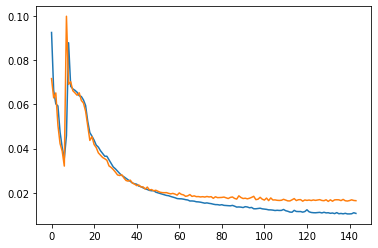

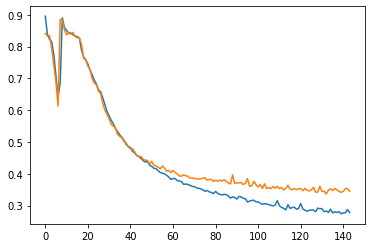

<s>아______________ᄋ우ᅮᆺᆺ_백ᆨ에__서___  가___ᆫ__체  하ᅡᆯᄋ이____ᆫ 데___느_ᆷ___위__ᄋ__ 고_ᄀ_ᆼᆼ_옹하ᅡᆸ니__다_._._______________    어__ᆺᆺ_스__ 아_어__떻_게_ __ 무_오__보 시__________________________________________하_ᇀ나요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

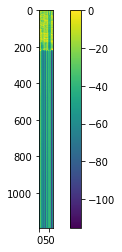

<s>어_______________기___ᄋ___  추____차__ᄒ_흘_ 사_____ 고___ 배____서__________  바___려___파____키__ᆼ___ᅢᆻ_흐_ᆼᆼ으_ᆺ_수__오_  거___고_ 싶ᇁᇁ은ᆫ_데_______________________________   고____기__ _치___저__ᆷ_으___  바__레___파____킹ᆼᆼ_해___주__ᄉ________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

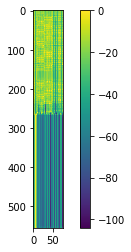

-------------------------------------------------------------------------------------------------------
09-22 16:06:37
09-22 16:09:09
Mean Train Loss: 0.010352721260039362
Train CER: 0.2751566188197767
09-22 16:09:22
Mean Evaluation Loss: 0.016293540329932254
Evaluation CER: 0.3438446618868089


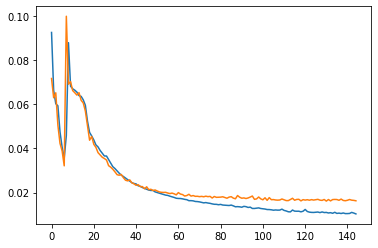

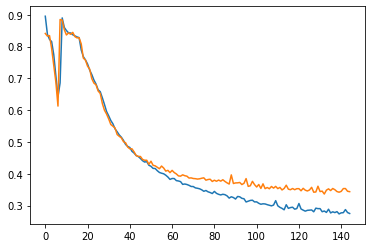

<s>브________________래_____타_____데_____ 스___테__이ᅵ__크__  메_____뉴__에____서__________  패_____대___시_____새_____트___  거__져__ᆨ_이____ᅵ__ _태___이___ 토___려_ᆷ_고_____ᄆ메____뉴___느___ᆫᆫ 어___ᆯᆯ_마___________________________________________을ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>브래타데 스테이크 메뉴에서 패대시새트 거젹이ᅵ 태이 토렴고메뉴는 얼마을까요?</s>
<s>블랙 라벨 스테이크 메뉴에서 패밀리 세트 가격이 제일 저렴한메뉴는 얼마일까요?</s>_______


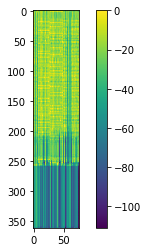

<s>저__________________버___ᆫ_으___ 자______리__가___ 조_ᇂ_고_ᆷ 그___ᆯ__사__ᆫ_해__ᆻᆻ느__ᆫ__데____________________ 따____다__  가____녀_ᆼ_하___ᆫᆫ_ 자_____이____로___ᆷ_ _좋ᇂ_워___ᆫ__드___로_______________________  아___ᆬ__느______ 주___시__ᆯ__수  _ᅵ__즈____________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

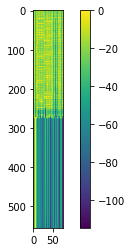

-------------------------------------------------------------------------------------------------------
09-22 16:09:23
09-22 16:12:02
Mean Train Loss: 0.010838470912213027
Train CER: 0.27943543672049737
09-22 16:12:16
Mean Evaluation Loss: 0.01631965832785835
Evaluation CER: 0.3398130189378255


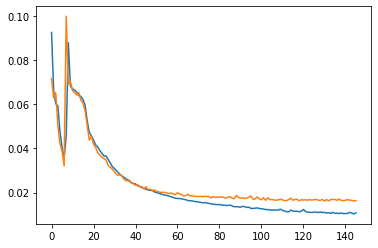

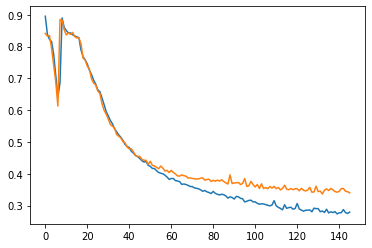

<s>차_______________________토____고__ 가____고___이_ᆻᆻ_느_ᆫᆫ_데_________________________  시___ᆫ_도_____ᆫ___새__ᄋᄋ___ 배_____콰____거__ᆫ_ 마_____으___ 드___ᆫ_ _되___류___헤_____서__  어____느__고___ᆯ__도___으_ᄅ로_  들_어_ᆨ_가ᅡ__ᄋ야_______________________하__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>차토고 가고있는데 신돈새ᄋ 배콰건 마으 든 되류헤서 어느골도으로 들억가야하나요?</s>
<s>차타고 가고 있는데 신세계백화점 맞은편 대로에서 어느 골목으로 들어가야하나요?</s>______


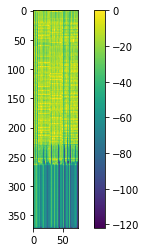

<s>아_______________리___ᄋ____ 추____처____늘ᆯ 사____ᆯ_고__ᆺ_해____서__________  바___레___파____키_______ᆻ_느_ᆫᆫᄀ_ᅩᆺ_즈__로_  거___고_ 싶ᇁ_은ᆫ_데________________________________  고____이__  지___저__ᆼ_으___  바__레___파____키_ᆼᆼ_해__ 주__ᄉ________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

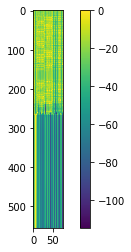

-------------------------------------------------------------------------------------------------------
09-22 16:12:17
09-22 16:14:46
Mean Train Loss: 0.01017231854818468
Train CER: 0.26898041643419623
09-22 16:15:00
Mean Evaluation Loss: 0.016148642530952193
Evaluation CER: 0.3374158258330246


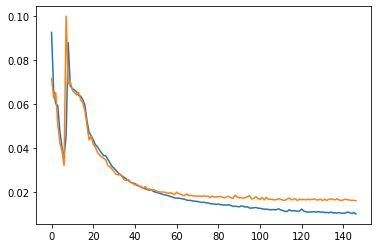

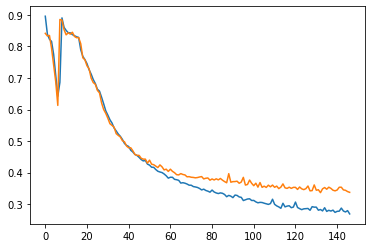

<s>주_________________________차_____________며___ᆾᆾ__태_____까____ᄌ지  하_ᆯᆯ_ ᄉ수___________________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

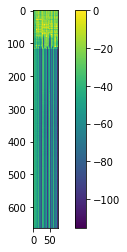

<s>아_______________웃ᆺ_백ᆨᆨ 가_____자___하___려___ᅩ_하__ᆫᆫ 가___려_ _고_포__표_____에____뇌 해_ᆻ느__ᆫᆫ_데__________________________  크_____차__와___포__요___으__지___느_________________________________  오____지_____치____저___우__아_ᄋᄋ_ 바__호ᅳ_ 수________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

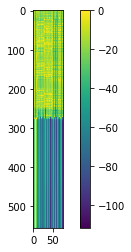

-------------------------------------------------------------------------------------------------------
09-22 16:15:01
09-22 16:17:29
Mean Train Loss: 0.010046453405471117
Train CER: 0.26817358751602205
09-22 16:17:45
Mean Evaluation Loss: 0.01643102854675513
Evaluation CER: 0.3477455488482577


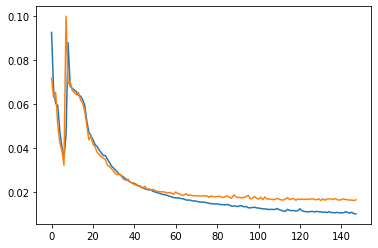

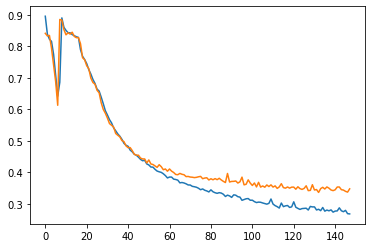

<s>아__________________ᄋ우ᅮᆺᆺ_백ᆨ__에____자_ᆼᆼ___시____느__는_이 어_ᆫ__제_____________________인ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아웃백에장시느는이 언제인가요?</s>
<s>아웃백 매장 쉬는 날이 언제인가요?</s>______


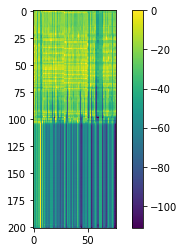

<s>네______________________________________________________  웨____어___ᆫ_에_______ᄋ____ᅥ__ᆯ___시_____________뉴__로________________ 에__ᄋ_____혀___레____ᄉ____테_ᄋ____ 드_____가____________   추_____매____ᄂ느___로___   _ᄎ_______내__ᆷ__가____고___  가___ᆻᆻ느____ᆫᆫ__데________________________________________  호_ᆨᆨ___ᄉ시____________________  이_____니____ _추______시__가____________________________________________________________________________________________________________________________________________________쳐_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 웨언에얼시뉴로 에ᄋ혀레ᄉ테ᄋ 드가 추매느로 ᄎ냄가고 갔는데 혹시 이니 추시가쳤나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


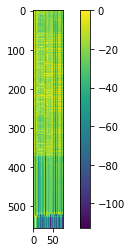

-------------------------------------------------------------------------------------------------------
09-22 16:17:45
09-22 16:20:18
Mean Train Loss: 0.010574180518703635
Train CER: 0.27615096898878927
09-22 16:20:31
Mean Evaluation Loss: 0.01598061567210593
Evaluation CER: 0.33671846056617344


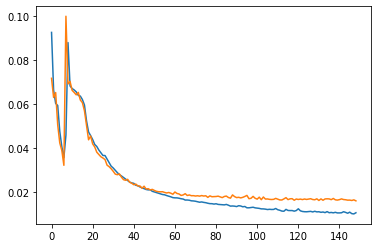

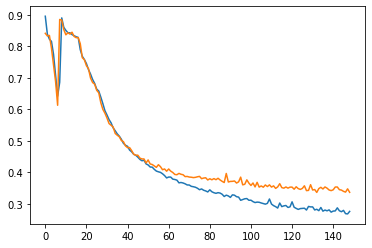

<s>**________________**___며___ᆼ_이___자_ᆼ_리_ 마__ᆯᆯ_거___ᆫᆫ_데_______  부___ᆷ_ 예_ᄋ약_이  가__ᄂ느___________________________________________________________________________________________________________ᆼᆼ하_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>**명이장리 말건데 붐 예약이 가능할까요?</s>
<s>**명이상이 갈껀데 룸예약이 가능할까요?</s>


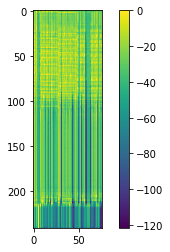

<s>지________________그___ᆷ_ 바___로____ 다___ᆫ__체___르____ 드_어___가___느_ᆫ_게___  가___느_ᆼᄒ하_ᆫᆫ___시_________ᆫ_____________________________ 무___________바____ 그__로____  보_ᆨ__차___ᆼᆫ_자___리___마___나__ᆷ_아____ᆻᆻ_ᅳ__ᆫ___지____  구__ᆼ_금_____________________하_ᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

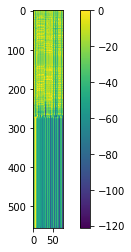

-------------------------------------------------------------------------------------------------------
09-22 16:20:32
09-22 16:23:12
Mean Train Loss: 0.010786748292785137
Train CER: 0.28238753834556163
09-22 16:23:26
Mean Evaluation Loss: 0.016728645534090772
Evaluation CER: 0.34454202715366006


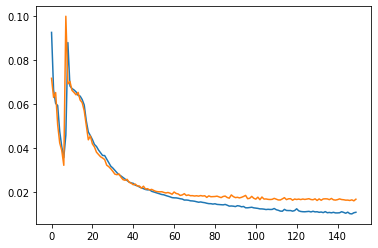

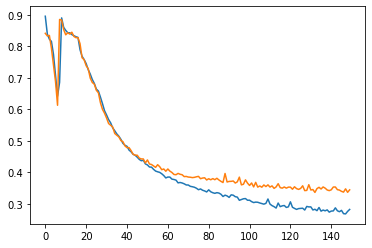

<s>아_________ᆫᆫ녕하___요____ᅭ____________________________________  한ᆫ__차__ᆫ_저_ᆫ_에__ 예ᅨ_ᄋ약ᆨ_을 ᆯᆯ  대__ᆫ_것 가_ᇀᇀ_으_ᆫ_데___________________  다___리__ 즈____ᆻᄂ는__기_ 하_ᆫ_이__ᆫ_ 부___타_ᆨ_드_______________리_ᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>안녕하요ᅭ 한찬전에 예약을 ᆯ 댄것 같은데 다리 즜는기 한인 부탁드립니다.</s>
<s>안녕하세요 한참전에 예약을 했던 것 같은데 잘 되었는지 확인 부탁드립니다.</s>___


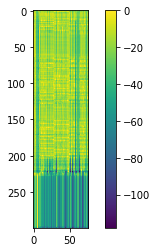

<s>아_____________ᆫᆫ녕ᆼᄒ하___세___요____________________  *ᅨ___작ᆨᆨ  문_희 _하ᄅ려__ᅩᅩ _전_하__드_리_ᆻᆻ느_ᆫ__데___요ᅭ_______________________  호___ᆨ___ᅵ___________붜__ᆫᆫ__추_____ 도____ᅭ__이__ᆯ_________ᆯ  저___ᆼ___*ᅵ__에_  예ᄋ약ᆨ_ᄋ____가__느__________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

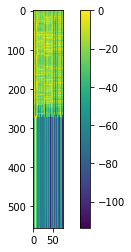

-------------------------------------------------------------------------------------------------------
09-22 16:23:27
09-22 16:25:54
Mean Train Loss: 0.010119200837723701
Train CER: 0.26778840168006157
09-22 16:26:09
Mean Evaluation Loss: 0.01652132788835544
Evaluation CER: 0.33793884978316296


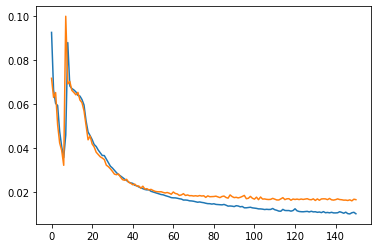

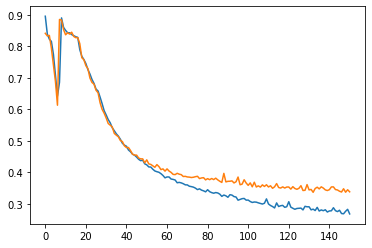

<s>여______________ᆼᆼᆼ업ᆸᆸᆸ_ᄉ시____가__ᆫᆫ_이ᅵ  어ᅥ____떻ᇂᇂ게__________________________ 되__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>영업시간이 어떻게 되나요?</s>
<s>영업 시간이 어떻게 되나요?</s>____


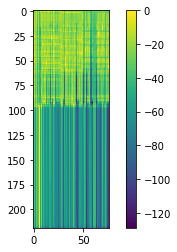

<s>이______________그_ᆷ 사___로__ 다____ᆷᆫ_체___르___드___가___ᆫ_지__  가___능_하__ᆯᆫ__시__________________  _______주_ᆷ_이__사__ _그___해_  고____저__ᆫᆫ_데__유__ 마__ᆫ 아___으_ᆫᆫ_지_  구__ᆼ_금____________하_ᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

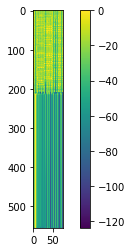

-------------------------------------------------------------------------------------------------------
09-22 16:26:09
09-22 16:28:38
Mean Train Loss: 0.010065275504565903
Train CER: 0.2666290481237752
09-22 16:28:53
Mean Evaluation Loss: 0.016690317308689244
Evaluation CER: 0.3439754178743435


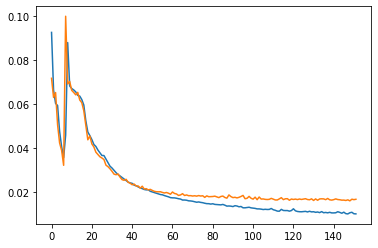

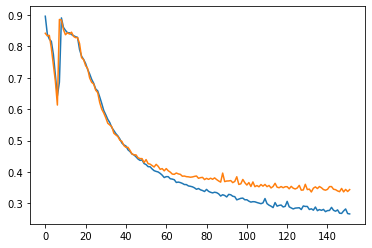

<s>아_____________________________ _체___롸____ᅡ_ᄋ__시__라__ᆫᆫ  두__ᄋ요__ _가__ᆯ_ 수   ᄋᄋᆻᆻ으_ᆯ_ 거___ᇀ_으__ᆫᆫ_데____________________________  **_____시____푸_ᆫ_이__ᄋ_ 어_ᆷ__지__ᆫ _마__ᆫ__들로__ 주____시_ᆯᆯᆯᆯ 수_________________ 이_ᆻ나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아 체롸ᅡᄋ시란 두요 갈 수 ᄋᆻ을 겉은데 *시푼이ᄋ 엄진 만들로 주실 수 있나요?</s>
<s>아 제가 한시간 뒤에 갈 수 있을 거 같은데 **분 뒤에 음식 만들어 주실 수 있나요?</s>_


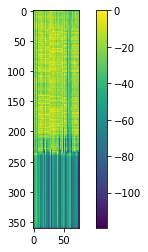

<s>아_____________ᆫᆫ녕ᆼᆼ하___세___요____________________  예__야_ᆨᆨ  문ᆫ_이  하_려_고_ 저_ᆫ_화__드_로_ᆻ_느_ᆫ__데___ᄋ요_______________________  오______시_________ _붜__ᆫᆫ__주_____ 토___요__이_____ᄋ_______  저__ᆷᆷ__시_ᆷᆷ에_  예_약__예  가___느__________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

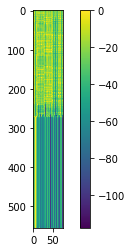

-------------------------------------------------------------------------------------------------------
09-22 16:28:54
09-22 16:31:27
Mean Train Loss: 0.010140637802652732
Train CER: 0.27273626842041165
09-22 16:31:41
Mean Evaluation Loss: 0.016380161852715017
Evaluation CER: 0.33881055636672697


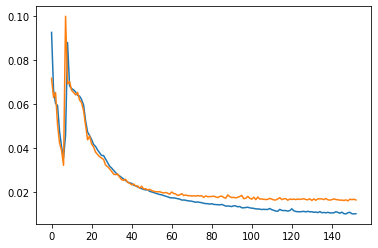

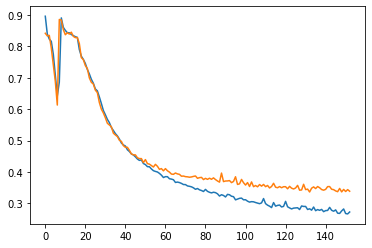

<s>네___________________________________ _브__ᆷ_ 고_____ᆯ_드___ᆯ_ 코____ᄉ스___트______ 코___고____허____시____ᄋ___  프___ 지___려__ᆯ_르________ _지___서___ᄒ_____도__________________  지___브____이__  하____이__도______ᆼ  *___기__ᄋ___로_____  가_ᆮ_우_ᆯ  수_  이ᅵᆻᆻᄂ_____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________ᅡᄋ요ᅭ?</s>
<s>네 븜 골들 코스트 코고허시ᄋ 프 지렬르 지서ᄒ도 지브이 하이동 *기ᄋ로 갇울 수 있나요?</s>
<s>네. 그 골드 코스트 코코넛 쉬림프 *개를 취소하고 기브미 파이브 *개로 바꿀 수 있나요?</s>_____


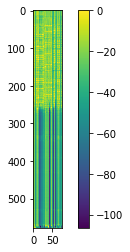

<s>아_______________웃ᆺ_백ᆨ__가_____따__ 하__여__어__사__ᆫᆫ 가___려___고_포__페__어 이___되_ 했ᆻ느__ᆫᆫ_데__________________________  크_____처__ᄋ__ 또___ᄋ____므__지__느_______ᆫᆫᆫᆫ_______________________  오____지_____치____저___므_ᄅ아_이_ 받_늘  수________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

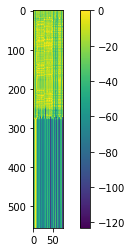

-------------------------------------------------------------------------------------------------------
09-22 16:31:42
09-22 16:34:20
Mean Train Loss: 0.01004020954413485
Train CER: 0.2695441643431979
09-22 16:34:34
Mean Evaluation Loss: 0.01618489919565159
Evaluation CER: 0.33948612896898905


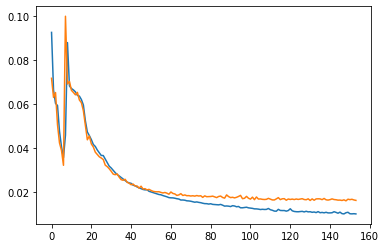

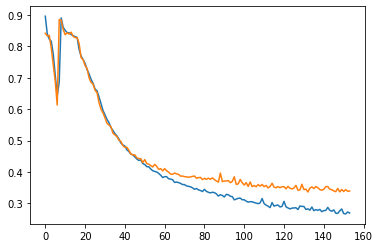

<s>자________________ᆫ__체___아_____고__로_ ᄋ이__에_____  _시___가___ 자___으_ _요ᄋ용하_ᆯᆯ 수_ _나_ᆫ 이_ᆸᆸ_니___다______________ _____마______ 차____ 주_ᆨᆨ__차______  가___느_________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

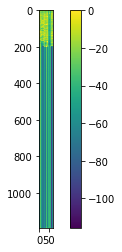

<s>아__________________ᆫ니___사______________________ _그ᄅ러__ᆷ__지_______지___으__내____ᆼ_조___ᆷ__주___가___주___마__곹 잎_으_ᆸᆸ니__ᄃ다____...______________________  그_르__고___지___라___ _우__타___ 바___ᄆ무_ᆫ_ 수_ 가_아___________________________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

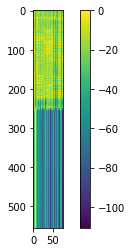

-------------------------------------------------------------------------------------------------------
09-22 16:34:35
09-22 16:37:03
Mean Train Loss: 0.010230534568319802
Train CER: 0.27043801775374726
09-22 16:37:18
Mean Evaluation Loss: 0.01652250428232124
Evaluation CER: 0.343212674613725


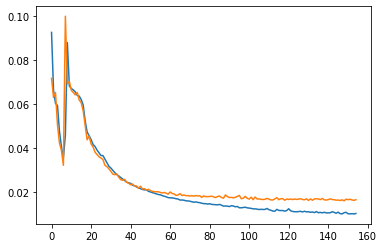

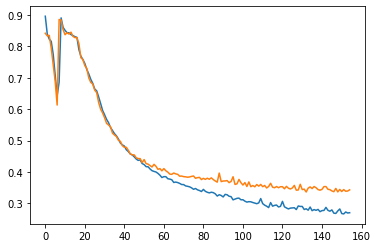

<s>카_______________________시___ᆫ_ 하___이___ᆫ_으____ᆫ  며__ᆾ_자__ᆯ__까___지____________________________ 되__나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>카신 하인은 몇잘까지 되나요?</s>
<s>학생할인은 몇살까지 되나요?</s>


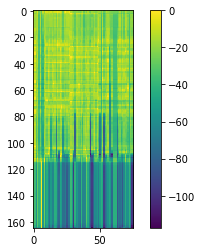

<s>며_________________ᆷ__마_____이_ᆫ__데___________ ᄒ하_ᆼ  사___ᄀᄀ___으__ᆫ__거___이____나_____요__??________________________________  게__ᅦᅦ________서_____ᅳ___테___ _있__게_  ᄋ이____나____ᄋ요___________________________________________  제___ᆫᆫ__치___ᆯ_세___ᆫ_네_____ᄋ__  하___는 ᄒ행__서____가_________________ 이_ᆻ나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

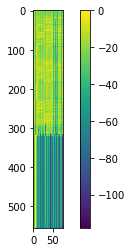

-------------------------------------------------------------------------------------------------------
09-22 16:37:18
09-22 16:39:46
Mean Train Loss: 0.009624505460019882
Train CER: 0.2597182350357059
09-22 16:40:02
Mean Evaluation Loss: 0.01620698764362956
Evaluation CER: 0.33290474426308103


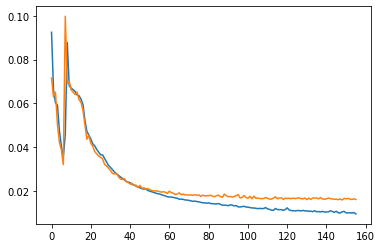

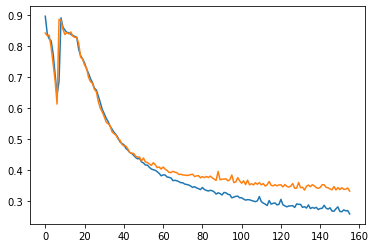

<s>위___________________저_ᆫ _**______시___에ᅦ________  시_ᆨᆨ_사______  가ᅡ___느_______________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>위전 *시에 식사 가능한가요?</s>
<s>오전 **시에 식사 가능한가요?</s>__


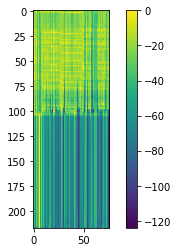

<s>아_______________기___ᄋ____ 추____차____늘ᆯ_사__ᆯᆯᆯ 모_ᆺᆺ_해____서__________  바_ᆮ_레___파____키__ᆼ_이_ᆼ_드_ᆼ_곳__스__로_ ᄀ갇__고_ 싶ᇁ으_ᆫᆫ_데________________________________  고____이__ _지___저_____ᅳ___  발_레___파____키_ᆼ__해___주__ᄉ________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

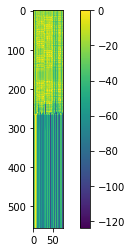

-------------------------------------------------------------------------------------------------------
09-22 16:40:02
09-22 16:42:34
Mean Train Loss: 0.00990322569085047
Train CER: 0.2656254391321344
09-22 16:42:48
Mean Evaluation Loss: 0.016209420167648654
Evaluation CER: 0.3301370758602654


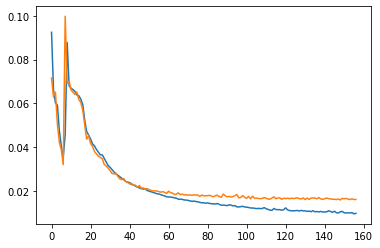

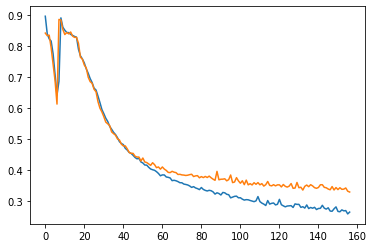

<s>스______________테___ᄋ이___크______도____ 토__ᆼᆼᆼᆼ__시__ᆫᆫ_사___ 하_ᆯᆯ이_ᆫᆫ__ᄃ____________________ 되_나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>스테이크도 통신사 할인ᄃ 되나요?</s>
<s>스테이크도 통신사 할인 되나요?</s>


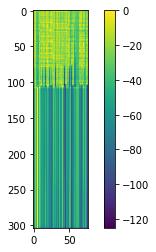

<s>노_______________ᄂ___ᄋ에___ᅡ___*ᅩ___조___ᆼ__죄_ᆼᆼ이_ᆫᆫ_데___________________________________  새_ᆼ_일ᆯ_파_____티___ᆯ_  지___ᆫ_부__ _하___조____며___ᆫ_ _채__자_ᆼ_해ᅢᄒ_ᆻ_사____요____________________________  메__뉴__자___ᆫ 무__워_ᆺᆺᆺᄋᄋᄋ______________________________________________________________________________________________________________올까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

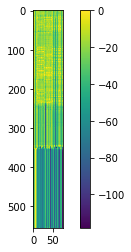

-------------------------------------------------------------------------------------------------------
09-22 16:42:49
09-22 16:45:22
Mean Train Loss: 0.009869781022549505
Train CER: 0.26716143840856926
09-22 16:45:36
Mean Evaluation Loss: 0.016244239770854388
Evaluation CER: 0.33645694859110425


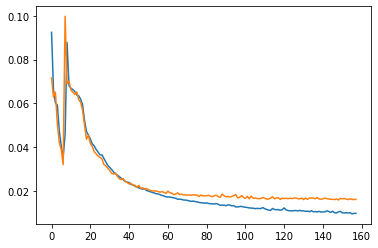

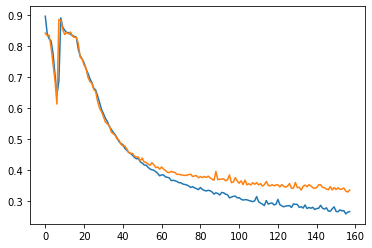

<s>지____________________그__ᆷ  하____고___이_ᆻᆻ는ᆫ 배___ᄒ____사____________  에____ 아____는ᆫᆫ 거____________________에요?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지금 하고있는 배ᄒ사 에 아는 거에요?</s>
<s>지금 하고있는 행사 왜 하는거에요?</s>________


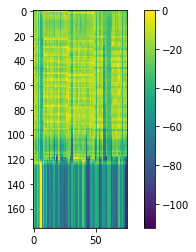

<s>여_________________ᆷ__마__ᆯᆯᄋ이_ᆫ__데___________ _해_ᆼ  하___ᄀ구__드__ᆫ _고___이_ᆻ__나____ᄋ요__???_______________________________   베레ᅦ____ᄉ___바___으____테_____이___가_  ᄋ이_ᅵ___나____요___________________________________________  자____ᆫ__치______으____네____해__  하___느__ᄒ행__사____가__________________ 있나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

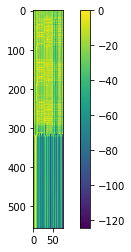

-------------------------------------------------------------------------------------------------------
09-22 16:45:37
09-22 16:48:17
Mean Train Loss: 0.01004768350941087
Train CER: 0.27737565881141335
09-22 16:48:32
Mean Evaluation Loss: 0.017434158372880728
Evaluation CER: 0.34975047399045484


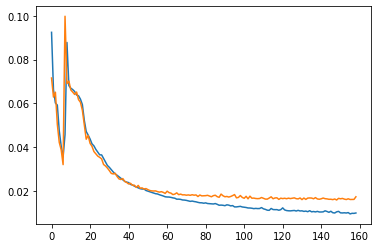

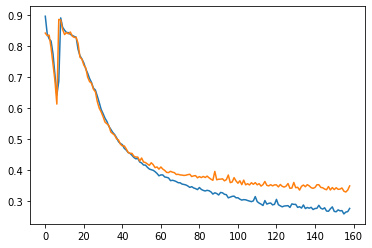

<s>아_______________________________ᆫ__차____이_ _가____ᆫ_ 부___오__ _시_________므_ᆫᆫ_아__ᆫᆫ_자____ᆫ__나_______데___효___하___로__레____시__에__ _주_______차____해___주__에 ___ᆻᆻ_나____요_요________________________________ 재_______그___ᆫ_며___ᆫ__ 구____ᆫ_무__ᆫ___추__차____자_______ᆼ___ 주_____차___ᄒ하____며_____ᆫᆫ____  지______차_____이______ 하__ᆯᆯ이_ᆫᆫ 메___느_ᆫᆫ________________________건가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

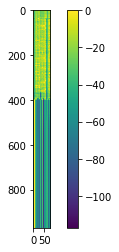

<s>아_____________ᆫᆫ년_하____세___요___________________   예__아___ᆨ__믄_이 _하_려_고_ 저_ᆫ 화__드_려_ᆻ_느_ᆫ__데___요ᅭ_______________________  호______시___  이____궈__ᆫᆫ__주_ 이_ 도___요_ᄋ이_ᆯᆯ________ᆯᆯ 저____ᆷ__시_ᆷ_에   ᅨᅨᄋ약ᆨ_이  가___느___________________ᆼᆼ한가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

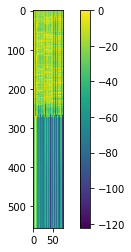

-------------------------------------------------------------------------------------------------------
09-22 16:48:33
09-22 16:51:02
Mean Train Loss: 0.010294298917305938
Train CER: 0.27350668640287296
09-22 16:51:17
Mean Evaluation Loss: 0.016557946532373708
Evaluation CER: 0.3348878767406891


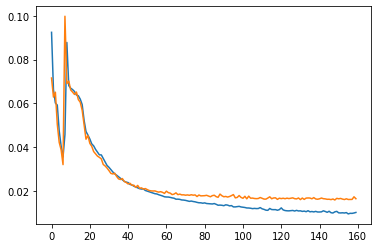

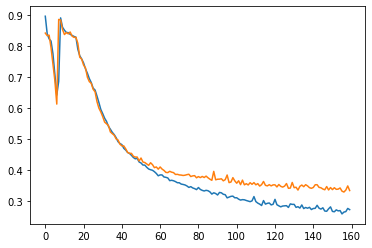

<s>예___________________________________________야_ᆨ_해_ᆼ_야___ᆨ_ 지__  ᄉ식__사___ 가___느_____________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

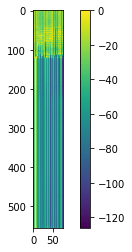

<s>에____________________________________________ _______버___ᆫ_느__ᆯᆯ___________  무___요__을__시_ᆫ_ 네____뉴__로____ 여_____ᆫ_마____느_ᆯ 시____ᄋ이__끄__ 가___으_ᆷ__느___느_ᄅ___ 초____ᅡ__려_ᆫ__거__고_ 가___ᆻ_느__ᆫ__데____________________________  호_ᆨᆨ__시_________  이_____ᅵ___주___시___게____________________ 있나요??_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

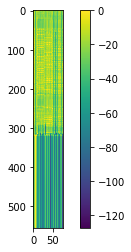

-------------------------------------------------------------------------------------------------------
09-22 16:51:18
09-22 16:53:48
Mean Train Loss: 0.010351479972204586
Train CER: 0.2716427555571386
09-22 16:54:02
Mean Evaluation Loss: 0.0166509424040611
Evaluation CER: 0.33878876370213784


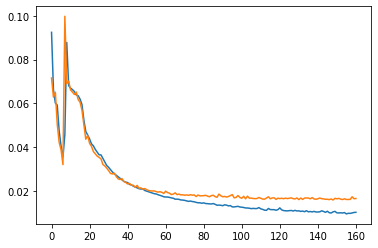

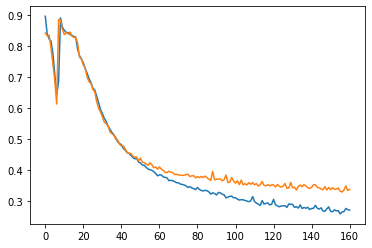

<s>*_______________________치_______무____ᅳ__로_  예ᅨ_ᄋ약ᆨ_하__ᄀ고_  싶ᇁᇁᇁ으___ᆫᆫ__데__________________________  가___느_________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>*치무ᅳ로 예약하고 싶은데 가능한가요?</s>
<s>미팅룸으로 예약하고 싶은데 가능한가요?</s>_


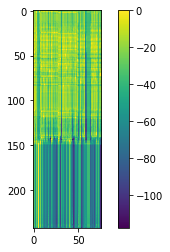

<s>저_________________봐__에__ 파__으__가_ 도___ᆼ _그__ 태___아_ᆻᆻ느_ᆫᆫ_데______________  이___따_____ 가__는  다___리____ᆼ_ _조___ᅮᆫ_으__러  __ᆬ_매_ 구__ᆯ _수__ ______ᅵ_____________________________________________________세요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

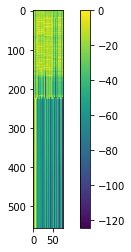

-------------------------------------------------------------------------------------------------------
09-22 16:54:02
09-22 16:56:37
Mean Train Loss: 0.009781825388750104
Train CER: 0.2674862305143995
09-22 16:56:51
Mean Evaluation Loss: 0.016089827402939027
Evaluation CER: 0.3407501035151568


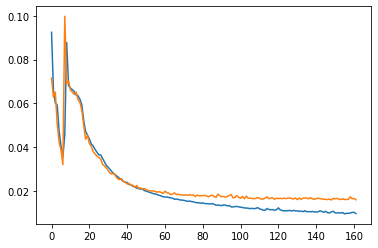

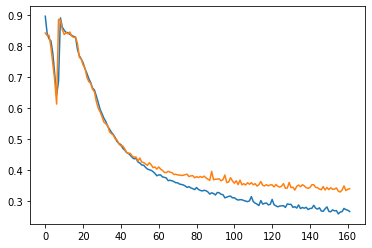

<s>지_____________________그_ᆷᆷ_ 가_____므_______ᆫᆫ___  주____차____고__ᆼᆼ_가____ᆫ_ᆫ_  자____리_ 나_ᆷ_아____________________있나요ᅭ?_</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지금 가믄 주차공간ᆫ 자리 남아있나요?</s>
<s>지금가면 주차공간 자리 남아있나요?</s>______


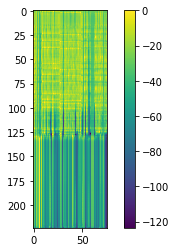

<s>저_________________관_에__ 파__르__가_ 도_ᄋ_ᆼ _그__ 타__네_ᆻᆻᆻ느_ᆫᆫ_데______________  이___따__ᄋ__ 가__는  다___리____ᆫ_ 조__우_ᆫ_드__러 아_ᆫ_며_ 구____수___ᄀ게__수______________________________________________________세요._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

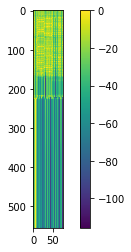

-------------------------------------------------------------------------------------------------------
09-22 16:56:52
09-22 16:59:33
Mean Train Loss: 0.009494102950798373
Train CER: 0.2675750533715557
09-22 16:59:47
Mean Evaluation Loss: 0.016557648762023345
Evaluation CER: 0.3395079216335781


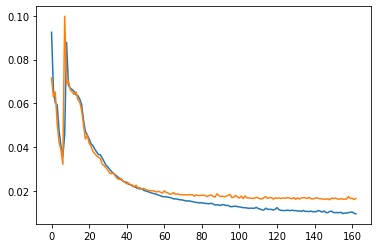

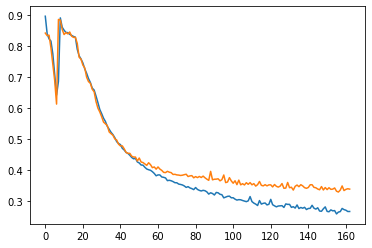

<s>아_______________ᄋ우ᅮᆺᆺᆺ_백ᆨᆨᆨ_이______서________  어____리___ᅵ__이_  하__ᆯᆯᆯ인ᆫ이_  드____ᄂ느__ᆫ  그_____ 구___ᆼ_그__ᆷᆨ 하__ᆸᆸ니_ᆫ__다____...._________________________________  어_____떠____ᆫᆫ 사____하_하___에____서____  구____ᆷ_버________드____으___ 리__ᆫ__가______트_____녀______________   어____ᄄ떠_ᇂᇂ__게____  무_ᆯᆯ어___브__ᆯ_시_ᆯ______________________건가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

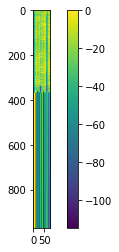

<s>이______________금ᆷ 바___로__ 다____ᆫ__체___로___드___거__ᆫᆫ_기__   가__른ᆼ하___ᆫ_ 수__________________  ____ᆫ__고_ᆼ 이__라__ _그___애__ 처____토__ᆼ__다__료__ _마_ᆫ 하 _ᄋ으ᅳᆫ__지_  구_ᆼᆼ_금_ᄒ___________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

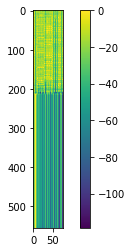

-------------------------------------------------------------------------------------------------------
09-22 16:59:48
09-22 17:02:14
Mean Train Loss: 0.01008595069249784
Train CER: 0.2655052211458961
09-22 17:02:30
Mean Evaluation Loss: 0.01625261134528959
Evaluation CER: 0.3352583520387038


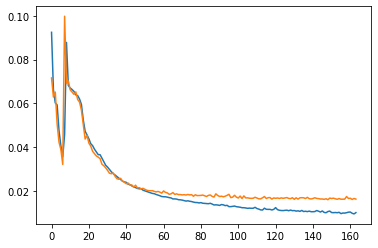

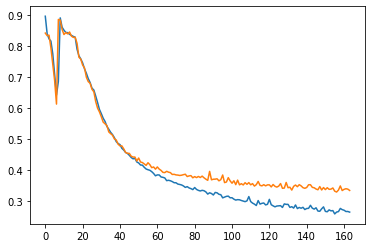

<s>지_______________________________________________________________하_ᇂ___처____ᆯᆯ 며_ᆾ__버__ᆫ__추__ᆯᆯ__루__로_  나__어__년  뫼___나__ᆫᆫ_데____ᄋ_____________ _서_하____채_ᆯ__이_여___뵈___서 _____부_ᇂᇂ_게___  가___녀__ᆫ  죄___느__ᆫᆫ__지______  구_____ᅮ___궈____________________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>지핳철 몇번출루로 나어년 뫼난데ᄋ 서하챌이여뵈

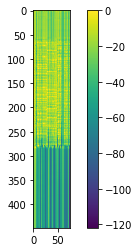

<s>아_____________ᆫᆫ년_하_ᅡ__세___요___________________   *ᅨ_____ᆨᆨ_  문_의 ᄒ하_ᄅ___고 _존_하__드_로_ᆻ_느_ᆫ__데____ᅭᅭᅭ______________________  오_______ᅵ____________ᅥ___ᆫ__주_ᄋ___ 도___요__이___________ᆯ_ 더____ᆷ__시_ᆷ_에_  예_약ᆨ_이  가___느____________________ᆼ한가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

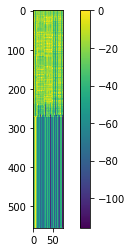

-------------------------------------------------------------------------------------------------------
09-22 17:02:30
09-22 17:04:59
Mean Train Loss: 0.009736121701103054
Train CER: 0.2641827138378863
09-22 17:05:13
Mean Evaluation Loss: 0.01662817537368309
Evaluation CER: 0.33676204589535164


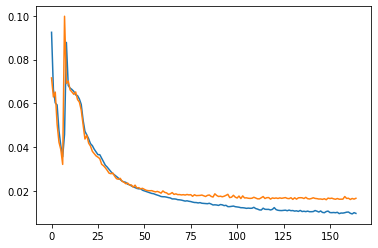

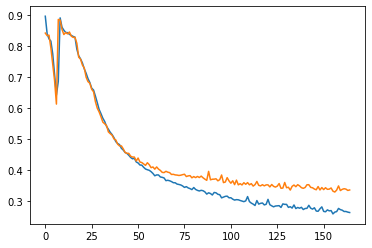

<s>부__________________개___라_ᆫ_ _카____드____ᅳ__ 마___ᆫ_데_____고___ᄋ______ 메________어__ᆫ__코_____포_ᆫ_으_ 바__아___스_ᆸ_니__다______________________________  어____ᆫ_제_____까ᅡ____지____  하__요ᅧ__할ᆯ 수____________________ 있나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

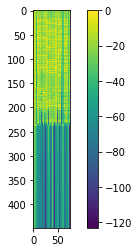

<s>아_______________기________ 주____차____를ᆯ_사____ᆯ_거_ᆺ__대____서__________  바___라___파____키__ᆼ_해_ᆻ_부_ᆫᆫ 곳_드__고_  거___고_ 싶ᇁ으_ᆫᆫ_데_______________________________   고____이__ 주____저____오__ᆺ  바__레___파____키_ᆼᆼ_해___주__ᄉ_________________ᅵ_나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

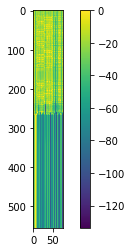

-------------------------------------------------------------------------------------------------------
09-22 17:05:14
09-22 17:07:47
Mean Train Loss: 0.009680317302967027
Train CER: 0.26626236849930995
09-22 17:08:01
Mean Evaluation Loss: 0.01650392717103049
Evaluation CER: 0.3412731274652952


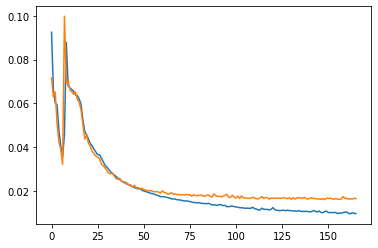

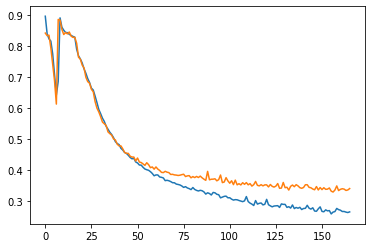

<s>미_______________리____ 주_____무_ᆫ_이__  가___느_________________ᆼᆼ한가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>미리 주문이 가능한가요?</s>
<s>미리 주문이 가능한가요?</s>________


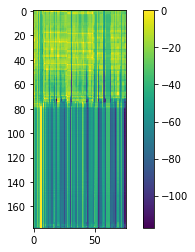

<s>이______________그_ᆷ_바___로__ 다____ᆫ__체___르___드___뤄__ᆫᆫ_지___  가___ᅳᆼ_하__ᆫᆫ__지___________________ ____ᆫ__루_ᆼ_이__라__ 구___래_ᆯ__포____퍼__ᆫ__데__류__ 다__ᆫ_아__ᆻᆻ은__지_  구__ᆼ_금_____________합니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

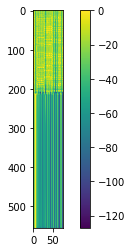

-------------------------------------------------------------------------------------------------------
09-22 17:08:02
09-22 17:10:42
Mean Train Loss: 0.009664977371784655
Train CER: 0.27219393751408516
09-22 17:10:56
Mean Evaluation Loss: 0.017461337028501413
Evaluation CER: 0.362520975439667


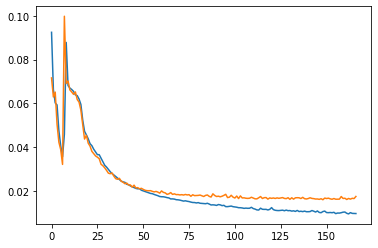

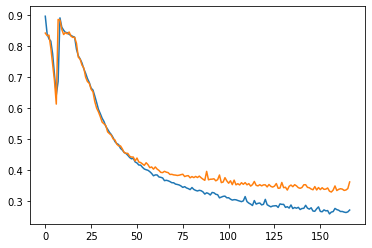

<s>아________________ᄋ우ᅮᆺᆺᆺ_백ᆨᆨᆨ_에______서__________ 어___디__ᆫ__이__ 하___ᆯᆯ인ᆫ_이____되____느__ᆫᆫ__게___ _고___ᆼᆼ_그_ᆷᆷ_하ᅡ__ᄂᄂ니___다___......._______________________________  어_____떠____ᆫ_ 카___하____ᆼ_의_____서____  구___ᆼᆼ_거____ᆫ___드_____의___데_____가______트__ᆸ__녀______________   어____ᄄ떠__ᇂᇂ_게__ _  무_ᆫᆯ어__ 부____시_ᆯ_____________________ 건가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

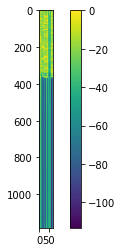

<s>아_____________ᆫᆫᄂ녕_하___세___ᄋ요___________________  예___악____믄_이__하ᄅ로__고 _전_하__두_ᄅᄅ_ᆻᆻ느_ᆫ__데___ᄋ요_______________________ _오_______ᅵ__  _*_____버___ᆫ__주_____ 토____ᅭᅭᄋ이___에________  저___ᆼ___심_에_  _예ᄋ약_이  가ᅡ__느__________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

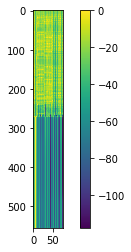

-------------------------------------------------------------------------------------------------------
09-22 17:10:57
09-22 17:13:24
Mean Train Loss: 0.009916807160613647
Train CER: 0.2667420023825133
09-22 17:13:40
Mean Evaluation Loss: 0.016533930104662288
Evaluation CER: 0.3403142502233748


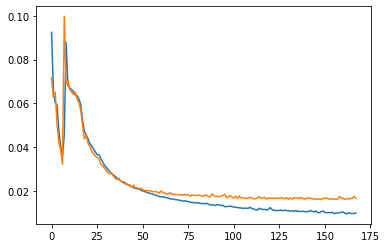

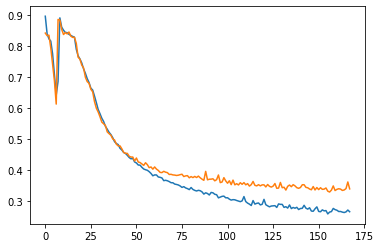

<s>예_________________ᄋ약__할__세____대____ 주__어___드___니_ 이_베__ᆫ__트__거________________ 이ᅵᆻ나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

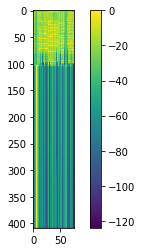

<s>네______________________________________________________  ᄋ*___어____ᆫ_이____  ᄋ___어___ᆯ___시_____이______니__로_______________  예__야____하____이________계_______기_____가____________   취_____매____니____로_ᆯ_  치___가___해_____겨___ᆼ고___  가___ᆻᆻᄂ느___ᆫᆫ__데_______________________________________   호_ᆨᆨ___시_____________________  _이____니____ 추______ᄉ시__사_____________________________________________________________________________________________________________________________________________________ᅮ__나요????</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 ᄋ*언이 ᄋ얼시이니로 예야하이계기가 취매니롤 치가해경고 갔는데 혹시 이니 추시사ᅮ나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


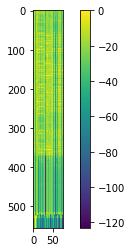

-------------------------------------------------------------------------------------------------------
09-22 17:13:41
09-22 17:16:10
Mean Train Loss: 0.009762369815612413
Train CER: 0.26044681126759134
09-22 17:16:24
Mean Evaluation Loss: 0.01619573832254712
Evaluation CER: 0.3371978991871336


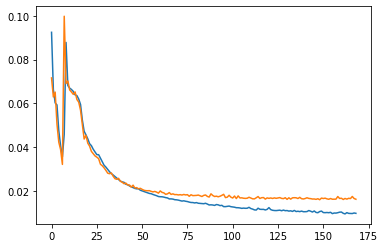

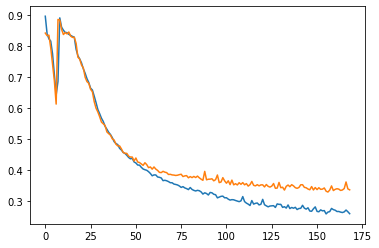

<s>아___________________ᆫ_녕ᆼᄒ하__세___ᄋ요_____ _이__요_ᆼ  *______**___베__에___  오ᅩ___수__ᆫ_에____  예__ᄋ야ᅣᆨᆨ_을 해__어_ᆫ  사___르_ᆻ_이_ᆫ_ᄃ데_______________________________  _ᅩᆨ_시__   시__거_ᆫ__배__ 벼___ᆫ_겨__ᆼᆼ___가___느_______________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>안녕하세요 이용 **베에 오순에 예약을 해언 사릈인데 ᅩᆨ시 시건배 변경가능한가요?</s>
<s>안녕하세요. *월 **일 오후에 예약을 했던 사람인데 혹시 시가

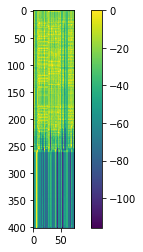

<s>네______________________________________________________  웨____워_____에_ ___ᆯ_ᄋ___어__ᆯ___스_____기______니__로_______________   예_____ᆫ_며___이____ᄉ____게______ 그_____다___________    주___ᆫ_매_____뉴____롤__ 치___가_ᆫ_해_____녀_____오__  가___ᆻᆻᆻ느___ᆫᆫ__데_______________________________________   호_ᆨᆨ__시______________________ _이_____니___  추______시___사____________________________________________________________________________________________________________________________________________________아__나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 웨워에 ᆯᄋ얼스기니로 옌며이ᄉ게 그다 준매뉴롤 치간해녀오 갔는데 혹시 이니 추시사아나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


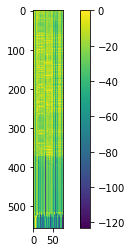

-------------------------------------------------------------------------------------------------------
09-22 17:16:25
09-22 17:18:58
Mean Train Loss: 0.009713700360451738
Train CER: 0.26534438775510205
09-22 17:19:13
Mean Evaluation Loss: 0.01663211791826347
Evaluation CER: 0.3431255039553686


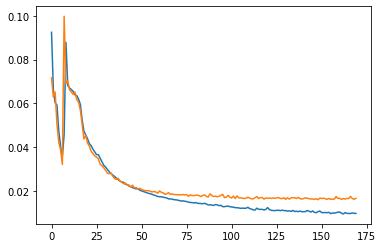

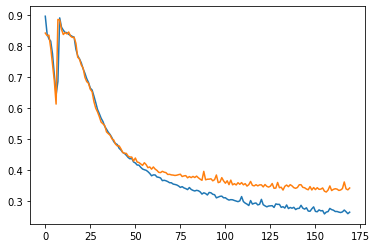

<s>아____________________ᄋ이__가_ 이ᅵᆻᆻ_느_ᆫ_ 자____리___고_ _______________ 버____리______레______지____  가___느________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>아이가 있는 자리고  버리레지 가능한가요?</s>
<s>아이가 있는 자리와 멀리 배치 가능한가요?</s>_


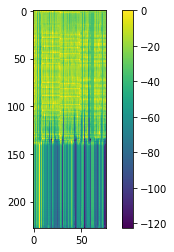

<s>저________________ᆫ화__헤__ 파__ᄅ느_하__도__ᄂᆼ__그__ 타___나_ᆻ_느_ᆫᆫ_데______________  이___따_____ 가__는  하___리____ᆼ_ 조___운__으__아 _ᅡ__문  구_ᆯ_ᄉ수________ᅵ______________________________________________________서요__</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

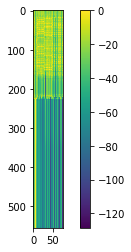

-------------------------------------------------------------------------------------------------------
09-22 17:19:13
09-22 17:21:54
Mean Train Loss: 0.010469504411264074
Train CER: 0.2812988429151269
09-22 17:22:09
Mean Evaluation Loss: 0.01693146086370341
Evaluation CER: 0.3465905376250354


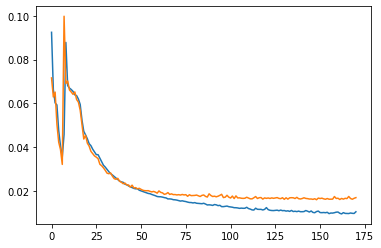

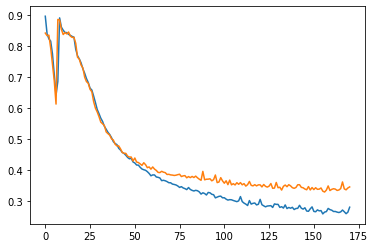

<s>으________________ᄅ___러______ _파_____무__ᆫ_포___장ᆼ_예__야ᅣᆨ_하____고  ᄉ싶ᇁ은ᆫ__데_______________________________  ____사_ᆫᆫ__치___가_____스____ _차_____스___하___ᄋ_ᆷ__크______________ _수__ᆨ_쿠__ᆫ_후_____ᆫ_구______ 도____이__학ᆨ_새_____드___________  에_____드____시_ᄅ___바___ᆼᄋ우__ 보___장_가___느_____________ᆼᆼ하_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

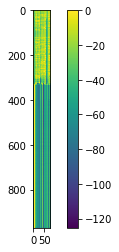

<s>허_________________ 치______야ᅣᅣᆨᆨ_으____________라________  식ᆨᆨ_사_______  가___능_하_ᆸ__다_____요??____________________________________________  저____ᆼ__수___에__ 가____서___ 식ᆨᆨ__사__ 하_ᄅ려___느__ᆫᆫ_데_______________________________   예__ᄋ야ᅣᆨᆨᆨ_아__ᆫᆫ야_____고_  가___드________________ 되__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

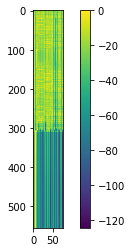

-------------------------------------------------------------------------------------------------------
09-22 17:22:09
09-22 17:24:37
Mean Train Loss: 0.010619919875365353
Train CER: 0.2791133423794746
09-22 17:24:52
Mean Evaluation Loss: 0.0189945654513247
Evaluation CER: 0.3817638982718417


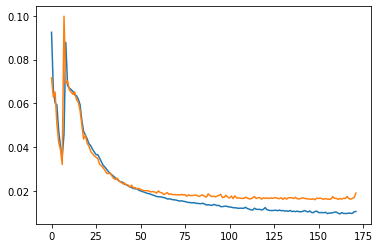

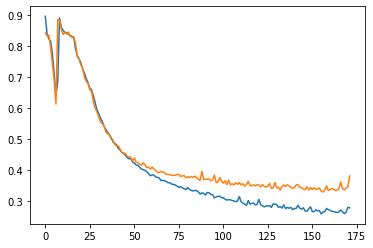

<s>ᄋ_________________버_ᆫ__조___  **_ᄋ요ᅭᄋ_____ _시__ᄅ___ᆼ 예_ᄋ야ᅣᆨ__하__려___________________구요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>ᄋ번조 *요ᄋ 시ᄅᆼ 예약하려구요.</s>
<s>이번 주 토요일 저녁 예약하려구요.</s>_________


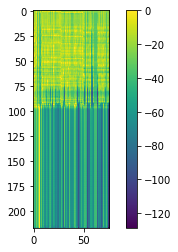

<s>아_____________ᆫᆫ녀__하____세___ᄋ요___________________  예___악ᆨ_ ᄆ__ᆫ_이_ 하_ᄅᄅ__고 저_ᆫ_아__드_르_ᆻ_느_ᆫ__데_____요_______________________ 오_______ᅵ___________어___ᆫ__주_____ 도__ᆼ요__ᄋ일_ᄋ_________  저___ᆼ__시_ᆷ_에___예ᄋ약ᆨ_이_ ᄀ가__느__________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

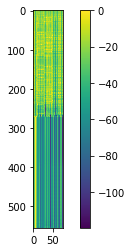

-------------------------------------------------------------------------------------------------------
09-22 17:24:53
09-22 17:27:22
Mean Train Loss: 0.01282700859924739
Train CER: 0.30650636456146885
09-22 17:27:36
Mean Evaluation Loss: 0.01627715018369423
Evaluation CER: 0.3409462374964587


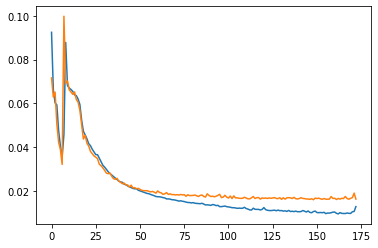

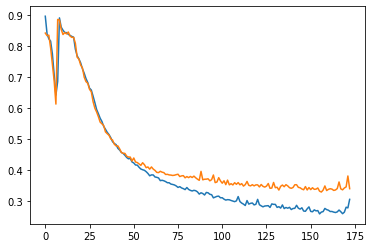

<s>저________________________ᆫ__추___저__ᆼ_에_____  배____다_ᆯᆯ_ 가___느___________________ᆼᆼ하_ᆫ가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

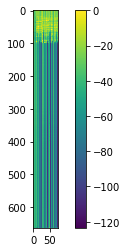

<s>네______________________________________________________  이____어___ᆫ_이____  ᄋ____어______수_____이_____니___로_______________  이__아_ᆨ__하____ᄋ________게________그_____가____________  _치___ᆫ__개____느____르___ 수______ᆫ_으__ᆫ__뎌__ᆼᆼ_오__  바__ᆻᆻᆻ느____ᆫᆫ__데_______________________________________  호__ᆨᆨ__시______________________ 예_____니____  ᄎ*______시___가____________________________________________________________________________________________________________________________________________________아__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 이언이 ᄋ어수이니로 이악하ᄋ게그가 친개느르 순은뎡오 밨는데 혹시 예니 ᄎ*시가아나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


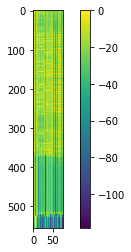

-------------------------------------------------------------------------------------------------------
09-22 17:27:37
09-22 17:30:10
Mean Train Loss: 0.010026770159069215
Train CER: 0.27094399118308865
09-22 17:30:25
Mean Evaluation Loss: 0.015937606433260698
Evaluation CER: 0.33580316865343124


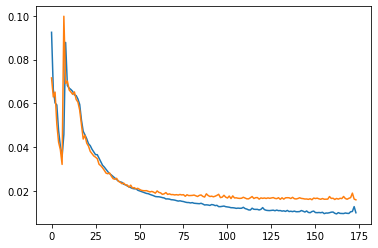

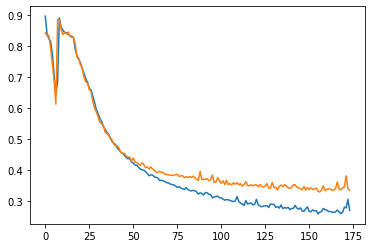

<s>아____________ᆫᆫ녕ᄒ하_세____ᅭ_.__________________________________  바__ᆫ__차____저_ᆫ_에___ 예ᅨᄋ야_ᆨ_으_ 흤_우_ᆫ__곳 가_ᇀᆻ으__ᆫ__데___________________ 사___ᄒᆯᆯ_즈__아___는_제_  어___이__ᆫ__부___타_ᆨ_드___ᅳ___________립ᆸ니다._</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>안녕하세ᅭ. 반차전에 예약으 흤운곳 같ᆻ은데 사ᄒᆯ즈아는제 어인부탁드ᅳ립니다.</s>
<s>안녕하세요 한참전에 예약을 했던 것 같은데 잘 되었는지 확인 부탁드립니다.</s>___


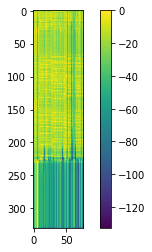

<s>내_______________ᄋ일 오____후_____  **__________시____에___   *ᅦ_____며__ᆼᆼ_  차__ᆼ__가___ 쪼__ᆨ  자____ᄋ이___이___아___ᄋ요______________________________________________  *ᅡ___라_______ 다___ᆫᆫ__테______야_ᅣᆨ 하_____려___고  하ᅡ_느__ᆫᆫ_데__  가_____느__________________ᆼᆼ하_ᆫ가요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

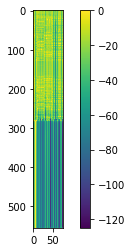

-------------------------------------------------------------------------------------------------------
09-22 17:30:26
09-22 17:33:05
Mean Train Loss: 0.009963379346587848
Train CER: 0.2757312138027964
09-22 17:33:19
Mean Evaluation Loss: 0.017253298298170208
Evaluation CER: 0.3461982696624316


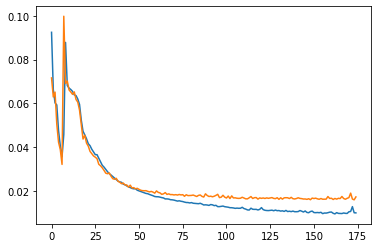

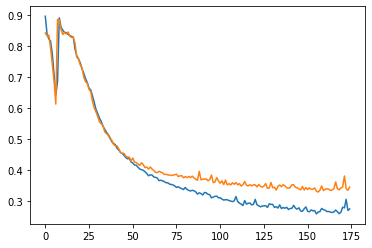

<s>내_______________이__ᆯ_으__  다___ᆫ__체___이__ᆫ__나__하_ᆫ_으______자____이_ᄋ있_나___요_??___  여___ᆼ__시_____메_  다__ᆫ__치___르_ 식ᆨᆻ_차___ _가__능_하_ᇀᆻ_거__요__?_______   아_ᆫ__저__요__아_ᆨ으_ᆫ  죠_ᆫ_이_ 며_ᆼ__명ᆼᆼ _아___지_  식ᆨ_사____ 자___느______________ᆼᆼ하_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

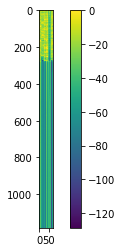

<s>저_________________환_에__ 바___느_가_ 드___ᆫ _그__ 토___났ᆻᆻ느_ᆫ__데______________  이___아_____ 가__는  다___리_ᄋ__ᆫ_ 도__워_ᆫ_디__아 아___며__주____시__ᄉ_____수______________________________________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

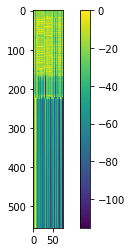

-------------------------------------------------------------------------------------------------------
09-22 17:33:20
09-22 17:35:48
Mean Train Loss: 0.009971446340963872
Train CER: 0.2666415495879866
09-22 17:36:04
Mean Evaluation Loss: 0.016056128348032318
Evaluation CER: 0.3360646806285004


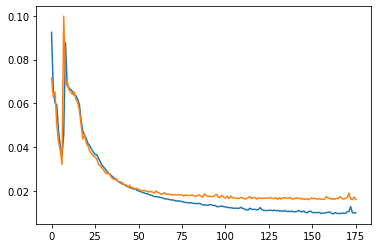

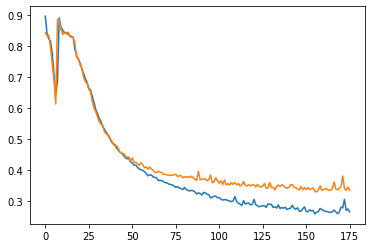

<s>스_____________________크_______ 메___뉴____ 주_________________  가_____자____ᆼ____ 다____________다___ 가___느____ᆫ__게________________________________뭐_ᆫ가요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>스크 메뉴 주 가장 다다 가는게뭔가요?</s>
<s>스테이크 메뉴 중 가장 잘 나가는게 뭔가요?</s>


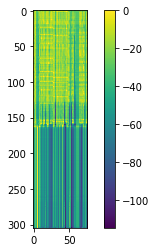

<s>아_______________웃ᆺᆺ백ᆨᆨ 가_____타__ 하___려__안_나_ᆫᆫ 가___려___고_____프_____의____뇌_애_ᄋ느__ᆫᆫ_데__________________________  크_____츠__오___고__으___느__지__므________ᆫᆫᆫᆫ______________________  오____지___ _치____주___무__아_이_ 받_을 _수________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

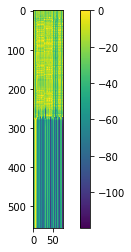

-------------------------------------------------------------------------------------------------------
09-22 17:36:04
09-22 17:38:35
Mean Train Loss: 0.010514695134035747
Train CER: 0.2739572188455614
09-22 17:38:49
Mean Evaluation Loss: 0.015966380575472998
Evaluation CER: 0.3345827794364417


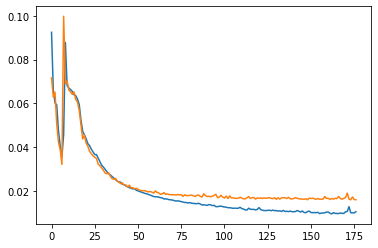

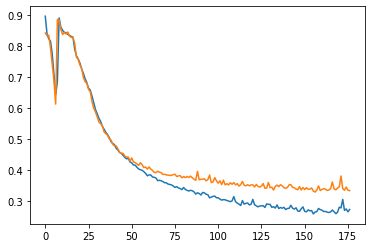

<s>오______________________________________________________________________________________________________________느__ᆯᆯ  ᄌ*______녀____________________   **________ᄉ_____시___  예_ᄋ약ᆨ__해_ᆻᆻᆻ느___ᆫᆫ__데_______________________________   초___ᆼ_ᄒ_ 으_ᆯ  히____거____하___ᆫ__해____ᄋ요_______________________________________________  바___라___ᄋ______ᅩ__ᆺ_시_______로_______  벼_____겨_ᆼᆼᄒ할 ᄉ수 ᄋ이ᅵᆻᆻ_ᄂ__________ᅡᅡᄋ요ᅭ??</s>
<s>오늘 ᄌ*녀 *ᄉ시 예약했는데 총ᄒ 을 히거한해요 바라옷시로 벼경할 수 있나요?</s>
<s>오늘 저녁 *시 예약했는데 좀 늦을 것 같네요. 저녁 *시로 변경할 수 있나요?</s>_______


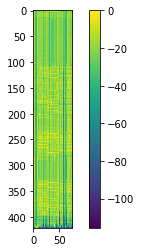

<s>네____________________________________________  이____버_____느__ᆯᆯ___________  미__요___울ᆯ_시____네____니_ᆯ_로__ᅩ_ 여_______마_ᆮ_으_ᆯ  시___ᄋ이__크___가___르____대___녀_____ 초___하__려____가__오_  가____느_ᆫᆫ__데___________________________   호_ᆨᆨ__시_________  이___ᄋ_____주____시__게___________________ 어_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

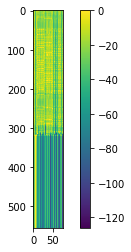

-------------------------------------------------------------------------------------------------------
09-22 17:38:49
09-22 17:41:24
Mean Train Loss: 0.009692043880020696
Train CER: 0.2657357614275238
09-22 17:41:38
Mean Evaluation Loss: 0.01643357747201239
Evaluation CER: 0.3342994747967834


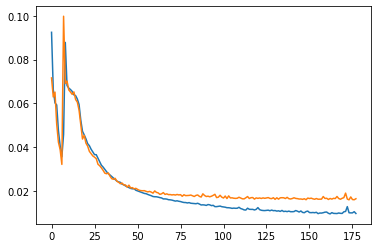

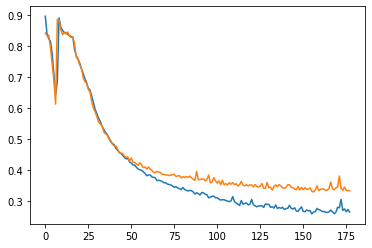

<s>이__________________보____드___ 주____문_해_____가___가___다_ 아_ᆻ_는  아__ᄋ우_ᆺ__백ᆨ_으__ᆫ_눝_고___시___으_ᆫ__ 자____이_로_____ᆫ_ 지__ᆯ_문ᄋᆫ 해__주_________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

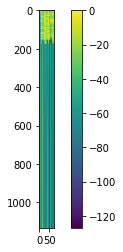

<s>네______________________________________________________  이____붜___ᆫ_으_____ _____버______시_____이______ᄂ___로_______________  메______ᆫ_며__ᆼ_이_______게________츠_____가_____________ 치______매_____느____를_  츠________해___ᆫ_나_____고__  가______느___ᆫᆫ__데_______________________________________   호_ᆨᆨ___시_____________________  이_____니___  ᄎ_______시___가____________________________________________________________________________________________________________________________________________________아__나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 이붠으 버시이ᄂ로 멘명이게츠가 치매느를 츠핸나고 가는데 혹시 이니 ᄎ시가아나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


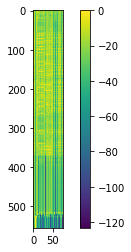

-------------------------------------------------------------------------------------------------------
09-22 17:41:39
09-22 17:44:20
Mean Train Loss: 0.009615089420785459
Train CER: 0.271092468334339
09-22 17:44:34
Mean Evaluation Loss: 0.016581067143890786
Evaluation CER: 0.3375247891559701


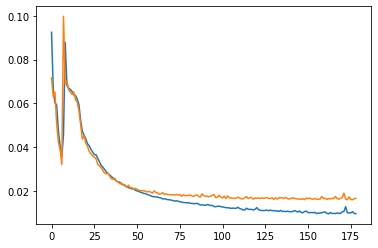

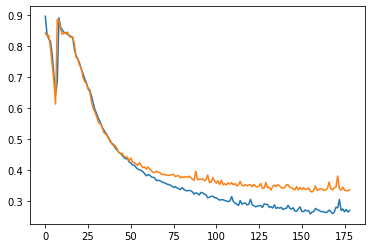

<s>요___________________ᆷᆫ_바____나___ᆷ__데_______머__ᆨ_으__ᆯ_마___나___ 르____수__ 가_____여ᅧ__ᆨ_스_____세____요ᅭ__ᅭ_______________________로____ᆯ_므___ᆷ  어____ 가___ᆯ 스_______ᆯ_ _아_____낭ᆼ아____에___요___________수____ᄉ__ᆨ__________라__우_ᆫ_ 아_______모_ᆫ_하____라_ᄅ려__라_ᆫ__여____________ 가___ᆯ 며__이___노__가__________러_________________________이__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

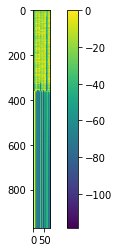

<s>아_______________기___이__  추____차____늘_ 사___ᆯ__고____대___서___________  바___레___파____키_ᆼᆼ_이_ᆻ_드_ᆫ 구___스__로_  거___고_ 싶ᇁ으_ᆫᆫ_데_______________________________  고_____이__ 치____저__ᆼᆼ으___  바__레___파____키_ᆼᆼ_해___주__ᄉ________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

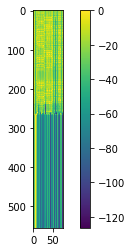

-------------------------------------------------------------------------------------------------------
09-22 17:44:35
09-22 17:47:02
Mean Train Loss: 0.010296150259734802
Train CER: 0.2737095854962185
09-22 17:47:17
Mean Evaluation Loss: 0.016610274389512382
Evaluation CER: 0.3398130189378255


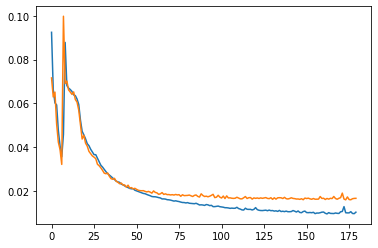

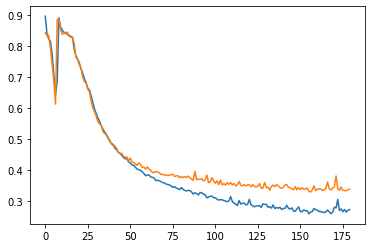

<s>내___________________이___ᆯ__도__  여__ᆼᆼ어ᅥᆸᆸᆸ을ᆯ___________________ 하__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

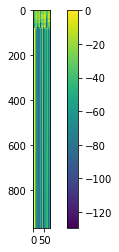

<s>아______________________ 오_____느__ᆯ_ 대___다_ᆯ_예_하_ᆸ__이__아____________________  다___으_ᆷ___지__ᄋ요__우__르___으_ᆯ _뎌__다___ᄋ여__요___요___ᆸᄂ_ᆫ_다____..._________________   배__다__ᆼ _가___능하_ᆫ 메___뉴__ᄂ느_ᆫ _뭐__마________________이_ᆻᄌᄌ죠??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

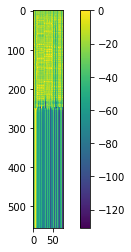

-------------------------------------------------------------------------------------------------------
09-22 17:47:18
09-22 17:49:47
Mean Train Loss: 0.00952781936897551
Train CER: 0.2584861559678147
09-22 17:50:01
Mean Evaluation Loss: 0.015737353992994123
Evaluation CER: 0.3326214396234228


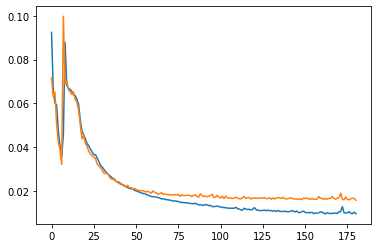

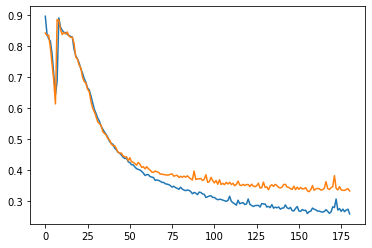

<s>아_________________________________________________시___가___ᆫ_으__ᆯᆯ _*ᅡ___ᆫ__시____가____ᆫ_으___로______  자_____꾸___ᆯᆯ__게___요__.?_________________________________  으___러___ᆫ__데____________________________________________  호_____시___ 매_____자___ᆼ__에_________________ ᄋ*_________며__ᆼᆼ____수_____요_ᆷ_  가_____능ᆼ_하_ᆫᆫ므__ᆫ_이__________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

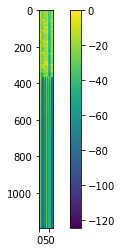

<s><s>ᅥ__________________치______야__ᆨᆨ_으___________야______________ᆨ__사_______  가___능ᆼ하_ᆸ___하_____ᅭ??____________________________________________  저____ᆫ__즈___네___과____서____슥ᆨᆨ__사___하ᅡ_려___느__ᆫᆫ_데_______________________________   예_ᄋ야ᅣ_ᆨᆨ_ 아___ᆫ_햐____고_  거___도________________ 되__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

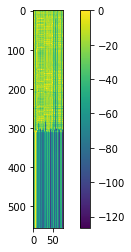

-------------------------------------------------------------------------------------------------------
09-22 17:50:01
09-22 17:52:35
Mean Train Loss: 0.00958485294399594
Train CER: 0.2626067261321559
09-22 17:52:49
Mean Evaluation Loss: 0.016975175154684583
Evaluation CER: 0.35251814239327045


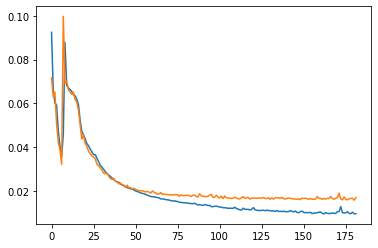

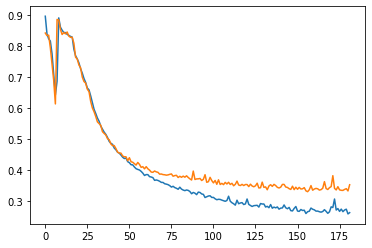

<s>아_________________ᄋ우ᅮᆺᆺ_백ᆨ에___서__  가___ᆫᆫ_체  하_ᆯᄋ인ᆫ예_ 데___느_ᆫ__지______ 무__ᆼᆼ__으_ᄋ합ᆸ니_다__..._______________  무___ᅥᆺ_스___ᄅ어____떻게ᅦ___ ᄆ물오__보_시_ᆯᆯ_까___________________________________ 하_ᆫ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

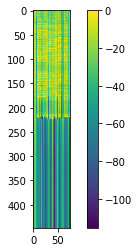

<s>지________________그___ᆷ  가___ᄅ로__  다___ᆫ__체___러_____들러ᅥ__가___느_ᆫ__에__  가___느_ᆼ_하_ᆫᆫ_ _디______________________________________  무__ᆫᆫ__이___아_____그________  도____처____ᆫ 자___르__ 가_ᆫ_아__ᆷ_가__ᆭ_ᄋ으___ᆫ___기____ _구__ᆼ_금ᆷ____________________하_ᆸ니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

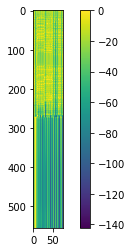

-------------------------------------------------------------------------------------------------------
09-22 17:52:50
09-22 17:55:31
Mean Train Loss: 0.009408548848799443
Train CER: 0.2646928395049762
09-22 17:55:45
Mean Evaluation Loss: 0.017085449750743494
Evaluation CER: 0.3405103842046767


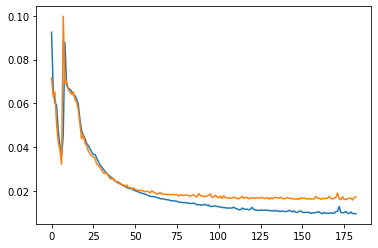

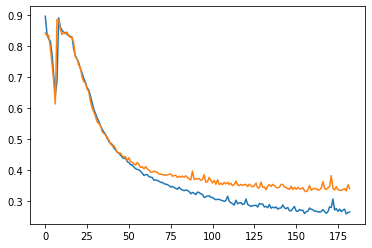

<s>마_________________ᆫᆫ__처___ 에___더____ᆫᆫ__데______________________________ᄉ시____ᆫ_므____유__ᆼᆫ_저__ᆼ_ 여___ᇁᇁ___데__________  아___ᄋ우_ᆷ_으____세_____주____차_ᄒ할ᆯ  수  있ᆻᆻᆻᆻ느____요___???_____________________________________  이_______그_____에_________________  _고_______료_ᆼ__지____차___저___ᆷ_  주_____차___하____며______ᆫᆫ_______  주_____차____비_  하__ᆯᆯ이_ᆫ 며___는______________________거_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

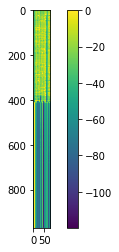

<s>아_____________ᆫᆫ년_하____떼___ᄋ요___________________  예__악ᆨᆨ  문ᆫᆫ의 _하ᄅᄅ__ᄀ고 저_ᆫ_하__드_려_ᆻᆻ느_ᆫ__데___ᄋ요_______________________  호___ᆨ__시___  ᄋ_____버___ᆫ__주_____ 도___ᅭᅭ_ᄋ이___________ᆯᆯ  더___ᆷ__시_ᆷ_에_  예_약ᆨ_이_ 가___느__________________ᆼᆼ하_ᆫ가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

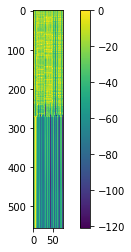

-------------------------------------------------------------------------------------------------------
09-22 17:55:46
09-22 17:58:13
Mean Train Loss: 0.009637792047963514
Train CER: 0.26103186106237447
09-22 17:58:28
Mean Evaluation Loss: 0.015948038045322896
Evaluation CER: 0.3286551746682067


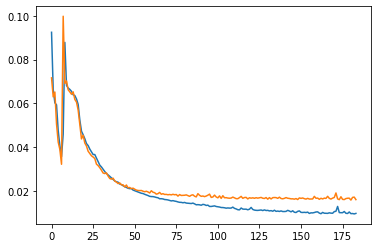

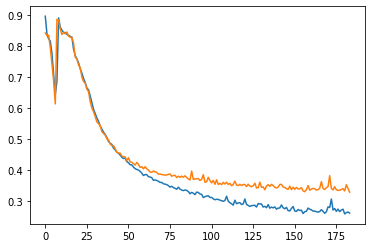

<s>아_____________________________________________________ᆫᆫ녕ᄒᆼ__세____요ᅭ______________  이_____자___  _오__후_____  *ᅡ_____주______예____ᄋ__ _바___ᆼ_문_애___에___더____으_ᆫ___데________  시______바_ᆫ__즈__어___가____ᆻ_춰____우___ 포____자_____ᆼᆼ 예___야ᅣᆨᆨ__가___느______________________ᆼᆼ하_ᆫ가요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>안녕ᄒᆼ세요 이자 오후 *ᅡ주예ᄋ 방문애에더은데 시반즈어갔춰우 포장 예약가능한가요?</s>
<s>안녕하세요. 이따 오후 *시에 방문할 예정인데 시간대에 맞춰 포장 예약 가능한가요?</s>__


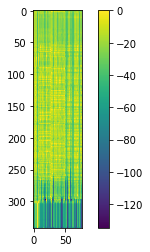

<s><s>ᅥ_________________ 지______아__ᆨᆨ_으____________랴________ _식ᆨ__사_______  하____능_하____가___ᄋ요???___________________________________________  저____ᆫ__즈____에___거____서__ 식ᆨᆨ__사___ᄒ하__려__느__ᆫᆫ__데______________________________   예__ᄋ야ᅣᆨᆨᆨ 아___ᆫ_햐____고_  가___이________________ 되__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

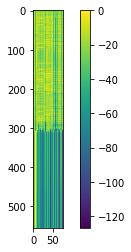

-------------------------------------------------------------------------------------------------------
09-22 17:58:29
09-22 18:00:57
Mean Train Loss: 0.009419465700842252
Train CER: 0.2571595199361552
09-22 18:01:11
Mean Evaluation Loss: 0.016115000398379487
Evaluation CER: 0.33368928018828864


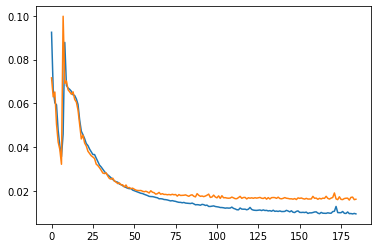

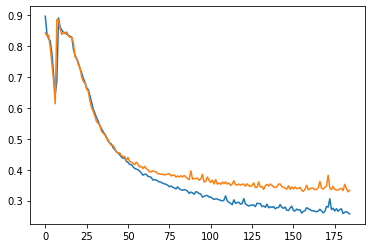

<s>거____________________기__  매____자__ᆼ__이  어___떻ᇂᇂ_게__________________________ 가__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>거기 매장이 어떻게 가나요?</s>
<s>거기 매장에 어떻게 가나요?</s>______


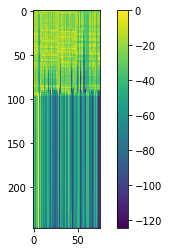

<s>저_________________하__에__ 파___르_가__으___ᆫ _그___타__마__ᆻᆻ느_ᆫᆫ_데______________  이_ᆻ_따_____ 나__는  하___리__은_ 토__ᄋ__ᆫ_드__아  ____매__주____시____ᅦ___수______________________________________________________세요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

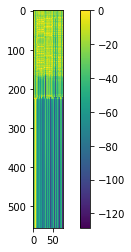

-------------------------------------------------------------------------------------------------------
09-22 18:01:12
09-22 18:03:47
Mean Train Loss: 0.009292752474364717
Train CER: 0.2584576163161249
09-22 18:04:01
Mean Evaluation Loss: 0.016125570137645668
Evaluation CER: 0.3304421731645128


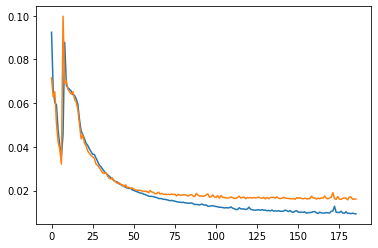

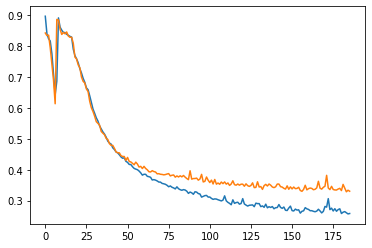

<s>차___________________________________________리_____여___ᆼ__아__이_ᆫᆫ_데________   타___ᄋ임_우__레___사___거___레_____서__ 아____우_ᆺ__배___그_로_ 가__려__며____ᆫ________  어_____느__마_ᆼ_형ᆼ_그__ 가___ᄋ야ᅣ________________하__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>차리영아인데 타임우레사거레서 아웃배그로 가려면 어느망형그 가야하나요?</s>
<s>차를 이용하는데 타임월드 사거리에서 아웃백으로 가려면 어느 방향으로 가야 하나요?</s>____


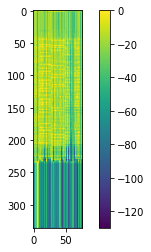

<s>네______________________________________________________  이____붜_____레___________________시_____메_____니___로________________  _며______마____에___시___케_______크_____가____________  _키______매____뉴____로___ _수__가_ᆫ_해_____나____오___  가______느___ᆫᆫ__데________________________________________  호_ᆨᆨ__ᄉ시_____________________  _______니___  추______시___가___________________________________________________________________________________________________________________________________________________ 하__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 이붜레시메니로 며마에시케크가 키매뉴로 수간해나오 가는데 혹시 니 추시가 하나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


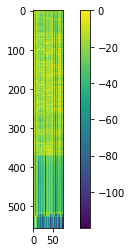

-------------------------------------------------------------------------------------------------------
09-22 18:04:02
09-22 18:06:44
Mean Train Loss: 0.009816325803610991
Train CER: 0.2747539807740306
09-22 18:06:58
Mean Evaluation Loss: 0.01707775120669961
Evaluation CER: 0.343430601259616


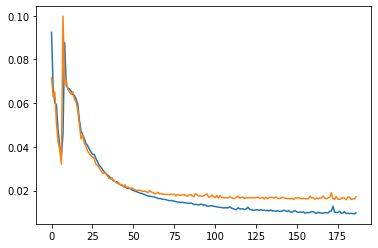

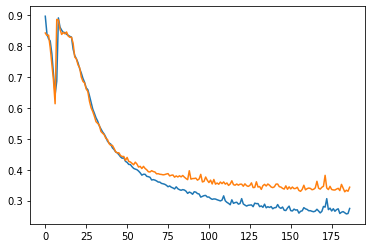

<s>저________________ᆷ__시_____지__가__ᆫ_으__ᆫ_ _차____료__ 가_____지_____  가___려___고  하_ᄂ느_ᆫᆫ_데_____________ ᄎ*___다_ᆼ_ 거__ᆫ_무__에__  추___처_____구_ᆫ__거___ᆫ_에_ _____외____가____요___???__________________________________  구__ᆫ__처___에___으_ᆫ  추___차___하_ᆯᆯ 고____ᆺ_이_ 가_____어___ᆫ__ 기__가____ _가________________________에요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

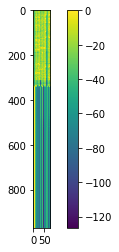

<s>아_____________ᆫᆫ년_하____세____요__________________   예__아_ᆨᆨ  며_ᆫ_에 ᄒ하ᄅ려_고ᅩ 저_ᆫ_화__드_려___느_ᆫ__데___요________________________  ᅩᅩ____ᆨ_시____  ___ _궈__ᆫ___주__이_ 도__ᆼ요_ᄋ이_ᆯ_________ᆯᆯ  저__ᆷᆷ___심_에_  예ᅨ야ᅣᆨ_이  가___느__________________ᆼᆼ하_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

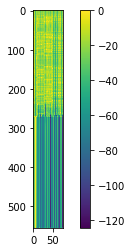

-------------------------------------------------------------------------------------------------------
09-22 18:06:59
09-22 18:09:25
Mean Train Loss: 0.010948327564543628
Train CER: 0.28186548992612837
09-22 18:09:41
Mean Evaluation Loss: 0.01624931087893648
Evaluation CER: 0.3448471244579075


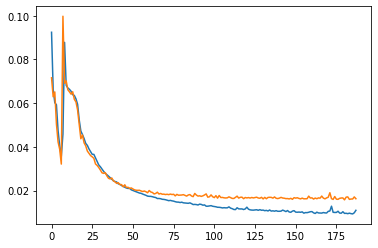

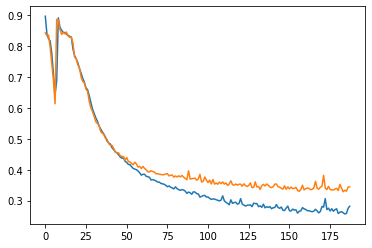

<s>고__________________ᆼ휴__휴__일ᆯ에____느____ᆫ 여_ᆼᆼ업ᆸ_시ᅵ__가_ᆫ_이 어_ᄄ떠ᅥᇂ게________________ 되__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

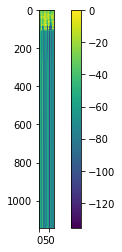

<s>며_________________ᆷ__마____이__ᆫ__대___________ 해__ᆼ  사___가___드__ᆫ _거_  이_ᆻ__나_____요__????______________________________  기_레___ᄉ____러_____ᅵ____테____ 있ᆻ__그  이_닜_나____요____________________________________________  주___ᆫᆫ__치_ᆯᆯᆯ_즈___ᆫ_에________  하___는 해____사_____ᅡ_________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

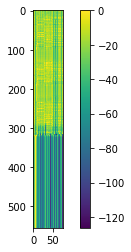

-------------------------------------------------------------------------------------------------------
09-22 18:09:42
09-22 18:12:09
Mean Train Loss: 0.009495655969344983
Train CER: 0.25489207104288225
09-22 18:12:23
Mean Evaluation Loss: 0.016128538297224018
Evaluation CER: 0.33578137598884217


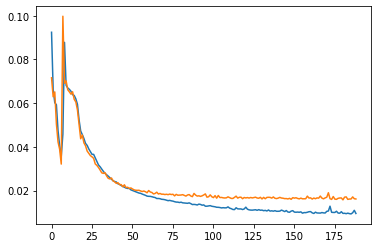

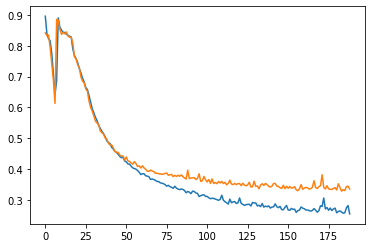

<s>저__________________________________________시___메ᅦ____뉴__에____________ 고______며___아_ᆫ_스__ᆫ 머___ᆫ__따___아_ᆫ_니___오________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

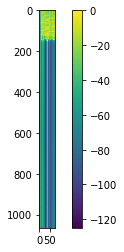

<s>아_______________웃ᆺᆺ백ᆨᆨ 가_____때___하ᅡ__려__하__나__ᆫ 가___려___고_____퍃ᇂ_ᅡ_해____내_ᄒ히_느__ᆫᆫ_데__________________________  그_____퍼__어_ _돟_어___애__지__여________ᆫᆫᆫ_______________________  모____시___ _치____저___무_가__이_ 바__느_  시__________________ᅮ_ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

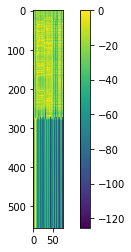

-------------------------------------------------------------------------------------------------------
09-22 18:12:24
09-22 18:14:59
Mean Train Loss: 0.009732895423913179
Train CER: 0.2646623313183123
09-22 18:15:13
Mean Evaluation Loss: 0.016149671919612075
Evaluation CER: 0.3275655414387517


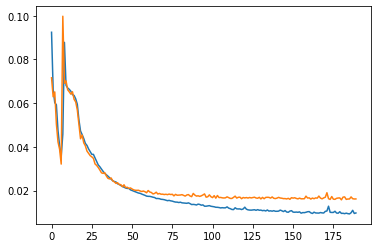

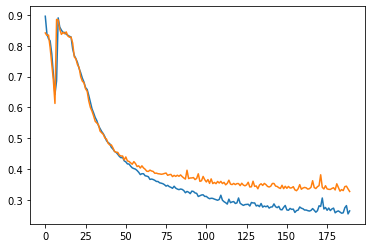

<s>오__________________ᄂ느  몇ᆾ__시__부___터  영ᆼᆼ어ᅥᆸᆸ하____________________세요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

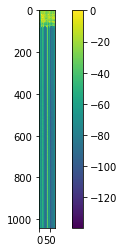

<s>이______________그_ᆷ_라___로__ 사____ᆫ__제___르__ 도___라__ᆫᆫ_지__  가___능_하__ᆫᆫ_ 시______________________무_ᆫ_보_ᆨ_이__라__ 부__ᆼ_에__ 구____포__ᆫᆫ_가__류__ _마_ᆫ 아__ᆻᆻ_느__지_  구__ᆼ_금____________하_ᆸ니다.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

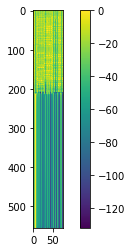

-------------------------------------------------------------------------------------------------------
09-22 18:15:14
09-22 18:17:54
Mean Train Loss: 0.010790488150201068
Train CER: 0.2947827561974459
09-22 18:18:09
Mean Evaluation Loss: 0.016488230846491262
Evaluation CER: 0.33881055636672697


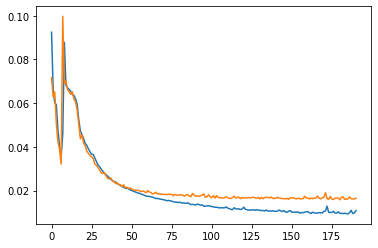

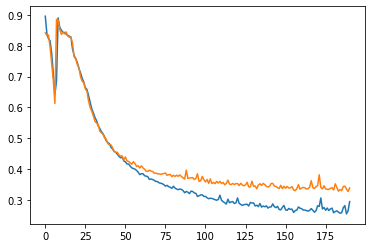

<s>주_____________________시__ᆫ___시__가_ᆫ_에__  _차___료_ᆯ__가___주__이__ _가_려____고  하_느ᅳᆫᆫ_데_____________________________ _생_아__ᆼ _거___ᆫ_무____ 주____자___고___가____ᆫ_이__ 수______사___요ᅭ?_??_____________________________  구___자__하__므____주___차_________ᄀ고_____시________ 따___따___ᆼ___지__가__ᆫᆫ_마_____________________서요?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

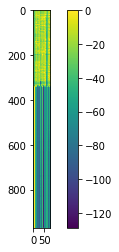

<s>아_________________ᆸᄂ니___다__________...________  _그_러_____기_______기__ᄋ____매____ᆫ_조___ᆫ__소___가___수____망고__시___닙ᆸᄂ니__다___..________________________  그_ᄅ___고___시___라___ 수___처___ 바____무___ 수_아ᅡ_아___ᄋ_______________________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

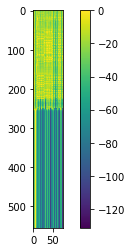

-------------------------------------------------------------------------------------------------------
09-22 18:18:09
09-22 18:20:36
Mean Train Loss: 0.009219782481683661
Train CER: 0.253253873537542
09-22 18:20:52
Mean Evaluation Loss: 0.016512987525142363
Evaluation CER: 0.3371325211933663


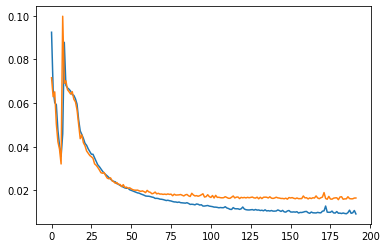

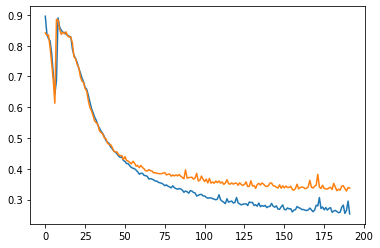

<s>주___________________ᄎ차______느_____ᆫᆫᆫ  어______디___에______햐____며_ᆫ_________________________ 되_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>주차는 어디에햐면 될까요?</s>
<s>주차는 어디에 하면 될까요?</s>_____


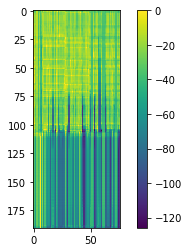

<s>네____________________________________________  미____버___ᆫ_으____ᄋ___ᆯ______  미__요___으___스____나____느___로___ 져____ᆫ__마____으___스_____이__크___가___으____나___녀___ᆫ__소___하_려__ᆫ__가__고_ 가____느__ᆫᆫ__데___________________________   호_ᆨᆨ__시_________  이__ᆫ_이___주___시___게___________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

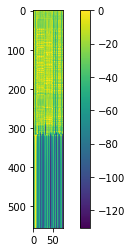

-------------------------------------------------------------------------------------------------------
09-22 18:20:52
09-22 18:23:22
Mean Train Loss: 0.009086946560459231
Train CER: 0.2515631523742604
09-22 18:23:35
Mean Evaluation Loss: 0.016677156984692656
Evaluation CER: 0.33541090069082746


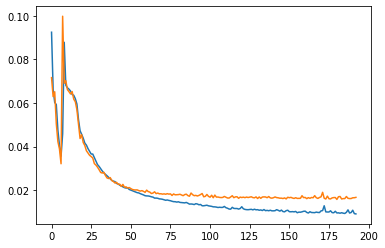

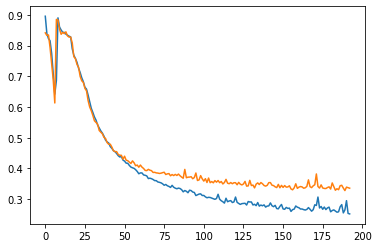

<s>호______________ᆨᆨᆨᆨ_시___  이_ _버__ᆫᆫ__주___마__ᆯᆯ___ ᄋ예_야_ᆨ__이___소___대___서_ 기___ᆫ_다__ᆯᆯ 새_______니___며_________ᆫ_  저__ᆫ_화__ 가__ᆯ_ᄅ려____주_시_ᆯ_ᄉ수___________________ 이_ᆻ나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

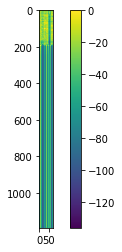

<s>오_______________느__일__며_ᆾ_시___저___ᆼ__세_ᆼᆼ이__ᆫ_데___________________________________ 세____이_ᆯ__파____기_____  지___ᆫ_부_ᆨ _하___도____며___ᆫ_  치__그_ᄒ__해__ _세____ᄋ요__________________________  메___ᄂ뉴_______ 무__ᄋ엇ᆺ_이_조___________________________________________________________________________________________________________으_ᆯ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

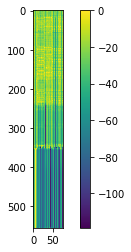

-------------------------------------------------------------------------------------------------------
09-22 18:23:36
09-22 18:26:10
Mean Train Loss: 0.009118834979915622
Train CER: 0.2518520028643292
09-22 18:26:24
Mean Evaluation Loss: 0.01604457177873652
Evaluation CER: 0.3339289994987687


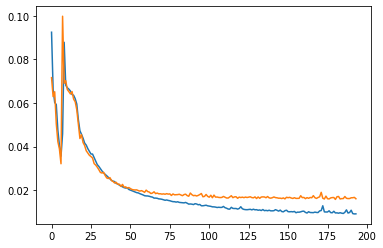

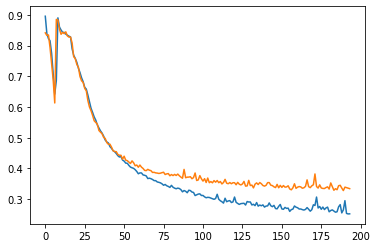

<s>저_________________ᆫ_화__화____로_____ 예____ᄋ야_ᆨᆨ_이___ _가____느___________________________ᆼᆼ한ᆫ가요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

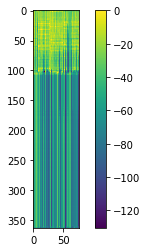

<s>여_________________ᆷ__마___ᆯᄋ이_ᆫ__되_________ᆯ_ 해__ᆼ_ _서__오___트__ᆫ__거___이_ᆫ__나_____요_????_______________________________  그_레ᅦ___아___사___르____테____ 이___가_ 아ᅵ이ᅵ___나___요__?_________________________________________  자____ᆫ___치__ᆫ__에__ᆫ_에____해__  하___는 해_ᆼ__사____가_________________ 이_ᆻ나요???</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>

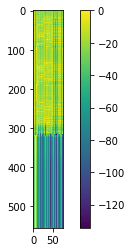

-------------------------------------------------------------------------------------------------------
09-22 18:26:25
09-22 18:29:05
Mean Train Loss: 0.009101899936007558
Train CER: 0.2599989822302244
09-22 18:29:20
Mean Evaluation Loss: 0.01679229803453654
Evaluation CER: 0.34092444483186957


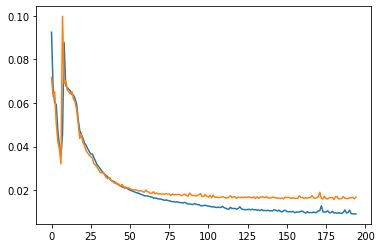

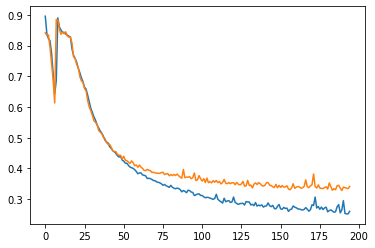

<s>아___________________ᅵ__으__  *ᅡ___ᆫ__치____*ᅵ_ᆫ__예  하___외_____ 사__ᅡ__이 있ᆻ나___요_??___ *저___ᆫ___시____에_  다__ᆫ__체___르__시_ᆨ__사___ _가__응_하ᅡᇀ_가__ᄋ요???________  ᅡᅡ_ᆫ__지_ᆯᄅ로 가___는  주___이  며_ᆾ_ᄆ며_ᆼ_ 까____지_  식ᆨ_사__ᅡ  가___느_______________ᆼ하_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

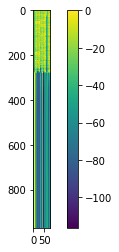

<s>에____________________________________________  미____버___ᆫ_에____이_________  무__요___이___시____네____뉴___로___ _여___ᆫ__마____이___ᄉ시___ᄋ이__크___가___으_ᆫ__데___뇨______초___하__라_ᆷ__다__오_ 가_____느__ᆫ__데___________________________   호_ᆨᆨ__시________   이_________치___시___게___________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

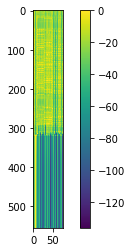

-------------------------------------------------------------------------------------------------------
09-22 18:29:21
09-22 18:31:49
Mean Train Loss: 0.009193829001608282
Train CER: 0.2543911529421362
09-22 18:32:05
Mean Evaluation Loss: 0.01642675939177746
Evaluation CER: 0.33684921655370803


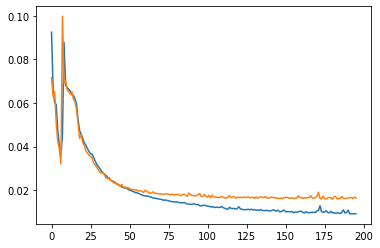

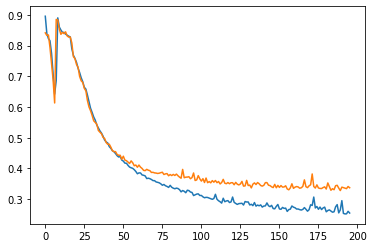

<s>네_________________________________________________  배______가______ 새__ᆼᆼ_이__ _쿠_____포__ᆫ_으_  _받ᆮ아__ᆻᆻ_느__ᆫ__데_________________________  키_______카___와ᄋ웃__하_____ᆯ__스________________  _코____포__ᆫᆫ_으_ᆯ  사___ᄋ용ᆼ__가_ᆯᆯ  수_________________________ 이_ᆻ나요ᅭ??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 배가 생이 쿠폰으 받았는데 키카와웃할스 코폰을 사용갈 수 있나요?</s>
<s>네. 제가 생일 쿠폰을 받았는데 테이크 아웃할 때 쿠폰을 사용할 수 있나요?</s>_________


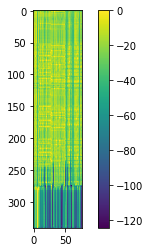

<s>네______________________________________________________  이____붜___ᆫ_이______ᄋ____ᅯ___ᆯ___시_____이_____뉴___로_______________  몌__하____며_ᆼᆼ_이_ _시___케________크____가____________  _지_____매____니_____롤_  수__카____해_____다_____고__  가___ᆻ_느___ᆫᆫᆫ__데_______________________________________   호_ᆨᆨ__시_____________________  _이_____니___  추______시__이_____________________________________________________________________________________________________________________________________________________하__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>네 이붠이월시이뉴로 몌하명이 시케크가 지매니롤 수카해다고 갔는데 혹시 이니 추시이하나요?</s>
<s>네 이번에 *월 신메뉴로 양갈비 스테이크가 신메뉴로 추가된다고 봤는데. 혹시 이미 출시되었나요?</s>_______________________________________________________________


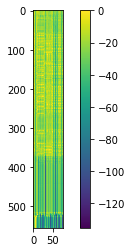

-------------------------------------------------------------------------------------------------------
09-22 18:32:05
09-22 18:34:35
Mean Train Loss: 0.009168856247868446
Train CER: 0.25256923925111596
09-22 18:34:49
Mean Evaluation Loss: 0.016488080759335295
Evaluation CER: 0.33684921655370803


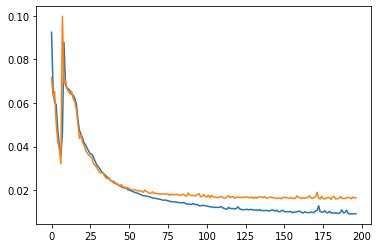

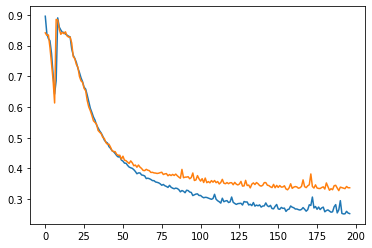

<s>이_____________________아__ᆨ_  시___가____을 이__러___가___르_ᆻᄂ느_ᆫᆫ__데______  요___ _무__애_ 저__  아_웃ᆺ_때_ᆨᆨ_하_____아____ᄋ요_______________________ 하__ᆯ_이__ᆫ_ 주___차_ᆨᆨ_드__르_로__________________________ 되_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></

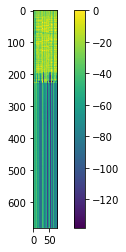

<s>여_________________ᆷ__마____ᄋ이_ᆫ__데___________ _해_ᆼ  _사__고____드__ᆫ_머_ ᄋ이ᅵᆸ__나_____요_???________________________________  그_ᄅ레________나___르____테_    이___흐   ᄋᄋ이ᅵ___다____요___________________________________________  자___ᆫᆫ___치__ᆯ__으__ᆫ__에_______  하___느_ 행ᆼ__서____가_________________ 이_ᆻ나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

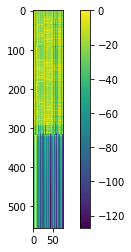

-------------------------------------------------------------------------------------------------------
09-22 18:34:49
09-22 18:37:23
Mean Train Loss: 0.009063654650970901
Train CER: 0.2542730748586241
09-22 18:37:38
Mean Evaluation Loss: 0.015890122786139563
Evaluation CER: 0.33273040294636824


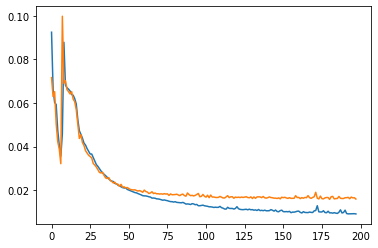

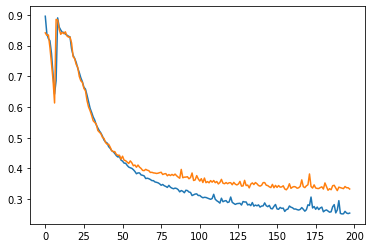

<s>시___________________지___고__ 드____ᆫ _주___ᆼ__고____ᄋ_____구_____인_노_ 바___ᆫ___게____________________ 아____요________________ 아___나____다__________________ 지___가_ᆫ_ 부___자_ᆼ_에________고_______ 드___마__차____스___러_ 으__ᆫᆫ______________께요.</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

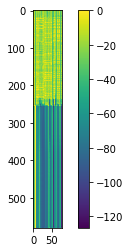

<s>여_________________ᆷ__마____이__ᆫ__데___________ 해__ᆼ _사___고___트__ᆷ_고__이ᅵ_ᅵᆸ__나____ᄋ요__?_________________________________  으_레____사__나____느____테____ᅵ_____사__하__ᅵᅵ__나_____요___________________________________________ 자____ᆷ___치___ᆯ_배_____네________  하___느_ 해_ᆼ__서___가__________________ 이_ᆻ나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

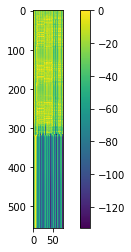

-------------------------------------------------------------------------------------------------------
09-22 18:37:38
09-22 18:40:19
Mean Train Loss: 0.009995975805532275
Train CER: 0.28411043286717863
09-22 18:40:33
Mean Evaluation Loss: 0.018005756880781463
Evaluation CER: 0.3565497853422538


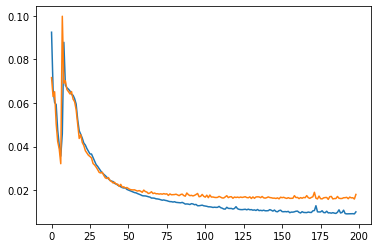

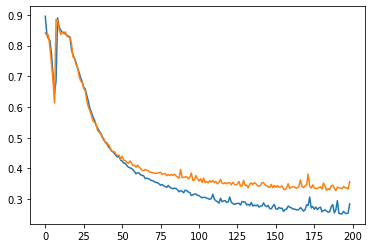

<s>그_________________ᄅ러_____________________________  바___ᆼ_무__ᆫ__포___자__ᆼᆼ 예___약ᆨ_하___고_  싶ᇁᇁ으__ᆫ__데_____________________________  러____ᆫ__체_____사______ᆨ_새_______________*ᅥ_____스_ᆨ__새________후___ᄅ_______________________________ 치____키__ᆫ__수__________거_______________ 푸____시_라__ᆨ_**______케_____________________  **__*___**_____*ᅵ__에________  주_____루__ᆫ_ 포____자_________ᆼ_  가___느_________________ᆼᆼᆼ하_ᆯ까요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

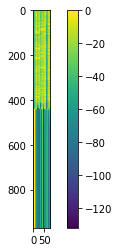

<s>어_______________기___이___ 추____처____으___사 __ᆯᆯ_고_ᆺᆺ_에____서__________  바_ᆯ_레___파____키_ᆼᆼ 이_ᆼ_브_ᆫ_고_ᆺ_즈__롬 가____고_ 싶ᇁ으_ᆫᆫ_데_______________________________   고____기__ 지____저__ᆼ오____ 바_ᆯ_레___파____키_ᆼ 해__ _주__ᄉ________________ᅵ__나요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s

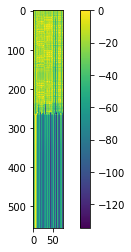

-------------------------------------------------------------------------------------------------------
09-22 18:40:34
09-22 18:43:02
Mean Train Loss: 0.009463695686090302
Train CER: 0.25355636133193304
09-22 18:43:17
Mean Evaluation Loss: 0.016633012128586578
Evaluation CER: 0.33528014470329287


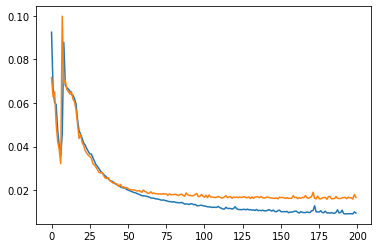

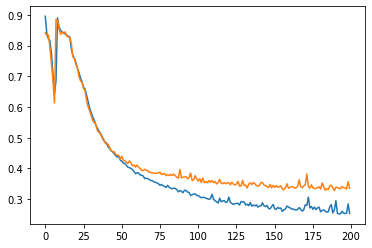

<s>새____________________일_드___ 메______뉴_________  바_____꾸__ᆯᆯ  수___________________________ 있ᆻ어요??</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s>
<s>새일드 메뉴 바꿀 수 있어요?</s>
<s>사이드 메뉴 바꿀 수 있어요?</s>_____


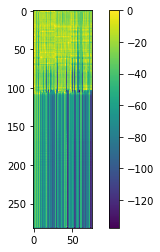

<s>여_________________ᆷ__마_____ᄋ__ᆫ__대_____________해_ᆼ___사__고____드_ᆼ__고__ᄋ이_ᆫ__다_____요_??_________________________________  브ᄅ레_________버___르____테_____있__테_ 에ᄋ이_ᆻ__나____요___________________________________________  저___ᆷᆷ___시__ᆯ__베__ᆫ_뉴____에__ _하___느_ 해_ᆼ__서____거_________________ 이_ᆻ나요ᅭ?</s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s></s><

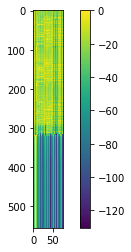

-------------------------------------------------------------------------------------------------------


In [23]:
EPOCH = 20 * 10
           
# net = Mel2SeqNet(80, 512, 256)


# net = Mel2SeqNet(80, 1024, 512, len(unicode_jamo_list), device)

keyword = 'NSML_pure_jamo_50ms_pad_cut'
# net = Mel2SeqNet(80, 512, 256, len(unicode_jamo_list), device)

keyword = 'NSML_pure_jamo_50ms_pad_cut_1024'
net = Mel2SeqNet(80, 1024, 512, len(unicode_jamo_list), device)


net_optimizer = optim.Adam(net.parameters(), lr=0.001)

ctc_loss = nn.CTCLoss().to(device)

train_loss_history = list()
eval_loss_history = list()

train_cer_history = list()
eval_cer_history = list()

try:
    train_cer_history = list(np.load('model_saved/train_cer_history{}.npy'.format(keyword)))
    eval_cer_history = list(np.load('model_saved/eval_cer_history{}.npy'.format(keyword)))
except:
    print("No CER Record")

try:
    load(net, net_optimizer, 'model_saved/{}'.format(keyword))
    train_loss_history = list(np.load('model_saved/train_loss_history_{}.npy'.format(keyword)))
    eval_loss_history = list(np.load('model_saved/eval_loss_history_{}.npy'.format(keyword)))
except:
    print("Loading {} Error".format(keyword))


for epoch in range(EPOCH):

    print((datetime.now().strftime('%m-%d %H:%M:%S')))

    preloader_train.initialize_batch(num_thread)
    loss_list_train = list()

    total_dist = 0
    total_length = 0
#     count = 0
    net.train()
    
    while preloader_train.end_flag == False:
        batch = preloader_train.get_batch()
        # logger.info("Got Batch")
        if batch != None:
            tensor_input, ground_truth, loss_mask, length_list, lev_truth_list = batch
            pred_tensor, loss = train(net, net_optimizer, ctc_loss, tensor_input.to(device),
                                      ground_truth.to(device), loss_mask.to(device), length_list.to(device))
            loss_list_train.append(loss)
            
            lev_pred_list = Decode_Prediction(pred_tensor, tokenizer, char2index)
            lev_str_list = lev_num_to_lev_string(lev_truth_list, index2char)
            dist, length = char_distance_list(lev_str_list, lev_pred_list)
            total_dist += dist
            total_length += length
            
#             print(loss)
#             _, index = pred_tensor[:, 0, :].max(-1)
#             sentence = tokenizer.num2word(index.view(-1))
#             print(''.join(sentence))
#             index_ = Decode_CTC_Prediction(index)
#             sentence_ = tokenizer.num2word(index_)
#             print(''.join(sentence_))
#             true_sentence = tokenizer.num2word(ground_truth[0, :].detach().numpy().astype(int))
#             print(''.join(true_sentence))
#             print('')
                 
#             print("Loss: {}".format(loss))
#             count += 1
#             print("Train {}/{}".format(count, int(np.ceil(len(wav_path_list_train)/batch_size))))
#             # logger.info("Training")

    train_cer = total_dist / total_length
    train_loss = np.mean(np.asarray(loss_list_train))
    print((datetime.now().strftime('%m-%d %H:%M:%S')))
    print("Mean Train Loss: {}".format(train_loss))
    print("Train CER: {}".format(train_cer))
    train_loss_history.append(train_loss)
    train_cer_history.append(train_cer)
    
    preloader_eval.initialize_batch(num_thread)
    loss_list_eval = list()

    total_dist = 0
    total_length = 0
    
    net.eval()
    
    while preloader_eval.end_flag == False:
        batch = preloader_eval.get_batch()
        if batch != None:
            tensor_input, ground_truth_, loss_mask, length_list, lev_truth_list_ = batch
            pred_tensor_, loss = evaluate(net, ctc_loss, tensor_input.to(device), ground_truth_.to(device),
                                          loss_mask.to(device), length_list.to(device))
            loss_list_eval.append(loss)
            
            lev_pred_list = Decode_Prediction(pred_tensor_, tokenizer, char2index)
            lev_str_list = lev_num_to_lev_string(lev_truth_list_, index2char)
            dist, length = char_distance_list(lev_str_list, lev_pred_list)
            total_dist += dist
            total_length += length
            
    eval_cer = total_dist / total_length
    eval_loss = np.mean(np.asarray(loss_list_eval))
    print((datetime.now().strftime('%m-%d %H:%M:%S')))
    print("Mean Evaluation Loss: {}".format(eval_loss))
    print("Evaluation CER: {}".format(eval_cer))
    eval_loss_history.append(eval_loss)
    eval_cer_history.append(eval_cer)
    
    #####
    
    save(net, net_optimizer, 'model_saved/{}'.format(keyword))
    np.save('model_saved/train_loss_history_{}'.format(keyword), train_loss_history)
    np.save('model_saved/eval_loss_history_{}'.format(keyword), eval_loss_history)
    np.save('model_saved/train_cer_history{}'.format(keyword), train_cer_history)
    np.save('model_saved/eval_cer_history{}'.format(keyword), eval_cer_history)
            
    #####    
    
    plt.figure()
    plt.plot(train_loss_history)
    plt.plot(eval_loss_history)
    plt.show()
    
    plt.figure()
    plt.plot(train_cer_history)
    plt.plot(eval_cer_history)
    plt.show()

    # index is the position of the max probility of the first batch
    # Shape of the pred_tensor: (T, B, 75)
    # Shape of the index: (T)
    _, index = pred_tensor[:, 0, :].max(-1)

    # Change index numbers to character
    sentence = tokenizer.num2word(index.view(-1))

    # Change list to string
    print(''.join(sentence))

    # Remove "blank" and overlapping characters
    index_ = Decode_CTC_Prediction(index)
    sentence_ = tokenizer.num2word(index_)
    print(''.join(sentence_))

    true_sentence = tokenizer.num2word(ground_truth[0, :].detach().numpy().astype(int))
    print(''.join(true_sentence))

    # Plot image
    # detach().cpu().numpy() transforms a tensor on gpu into a numpy matrix
    plt.figure()
    plt.imshow(pred_tensor[:, 0, :].detach().cpu().numpy())
    plt.colorbar()
    plt.show()

    _, index = pred_tensor_[:, 0, :].max(-1)

    sentence = tokenizer.num2word(index.view(-1))
    print(''.join(sentence))
    index_ = Decode_CTC_Prediction(index)
    sentence_ = tokenizer.num2word(index_)
    print(''.join(sentence_))
    true_sentence = tokenizer.num2word(ground_truth_[0, :].detach().numpy().astype(int))
    print(''.join(true_sentence))

    plt.figure()
    plt.imshow(pred_tensor_[:, 0, :].detach().cpu().numpy())
    plt.colorbar()
    plt.show()
        
    print("-------------------------------------------------------------------------------------------------------")
    
    